# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

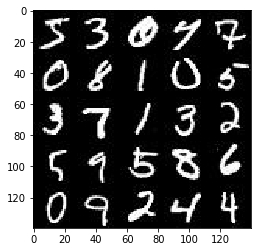

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

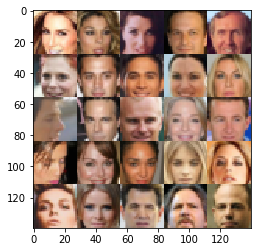

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel\\kernelapp.py", line 477, in start\n    ioloop.IOLoop.instan

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
# conv2d uses xavier initializer (as the None is transformed in a new glorot_uniform_initializer after line 220 in https://github.com/tensorflow/tensorflow/blob/r1.2/tensorflow/python/ops/variable_scope.py)
dnconv = 64
dropout_rate = 0.5
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28 x 28 x out_channel_dim
        #print(images.get_shape().as_list())
        
        # conv to 14, 14
        x = tf.layers.conv2d(images, dnconv*4, 5, strides=2, padding='same')
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 7, 7
        x = tf.layers.conv2d(x, dnconv*4, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4, 4
        x = tf.layers.conv2d(x, dnconv*8, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # flatten
        x = tf.reshape(x, (-1, 4*4*dnconv*8))
        #print(x.get_shape().as_list())
        
        # logits and output
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)
        
        
        return out, logits
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
gnconv = 64
dropout_rate = 0.5
def generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function
    
    # auxiliar variables
    reuse = not is_train
    
    # scope for generator
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*gnconv*8)
        #print(x.get_shape().as_list())
        
        # batch normalization to 4x4
        x = tf.reshape(x, (-1, 4, 4, gnconv*8))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 2x2
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4x4
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())

        # conv to 7x7
        x = tf.layers.conv2d_transpose(x, gnconv*6, 4, strides=1, padding='valid')
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
            
        # conv to 14x14        
        x = tf.layers.conv2d_transpose(x, gnconv*4, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # Output layer, 28 x 28 x out_channel_dim (3 or 1, depending on the task - faces or minst)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, 5, strides=2, padding='same')
        #print(logits.get_shape().as_list())
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
smooth = 0.1

def model_loss(input_real, input_z, out_channel_dim, alpha=0.02): # I put alpha parameter to this function call
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    # Just for reference:
    #   discriminator(images, reuse=False, alpha=0.01)
    #   generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    
    g_out = generator(input_z, out_channel_dim, alpha=alpha)
    d_out_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_real,
                                                        labels=tf.ones_like(d_out_real) * (1. - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.zeros_like(d_out_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.ones_like(d_out_fake)))

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
from datetime import datetime

print_every = 10
show_every = 100
n_images = 16
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model
    minput_real, minput_z, mlearning_rate = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(minput_real, minput_z, data_shape[-1], alpha=0.02)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    have_i_already_reset_the_default_graph = True

    # Auxiliar variables
    steps = 0
    out_channel_dim = 3 if data_image_mode == 'RGB' else 1
    sample_z = np.random.uniform(-1, 1, size=(n_images, z_dim))

    #there is a problem redefining related to redefining a session. This is a workaround
    #(https://stackoverflow.com/questions/37934955/tensorflow-op-naming-for-consecutive-runs-in-interactive-ipython-terminal)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):    
            for batch_images in get_batches(batch_size):
                # DONE: Train Model
                steps += 1
                
                # rescale from [-.5, .5] to [-1., 1.]
                batch_images = batch_images * 2

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                #_ = sess.run(net.d_opt, feed_dict={net.input_real: batch_images, net.input_z: batch_z, net.learning_rate : learning_rate})
                #_ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.learning_rate : learning_rate, net.input_real: batch_images})
                _ = sess.run(d_opt, feed_dict={minput_real: batch_images, minput_z: batch_z, mlearning_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={minput_z: batch_z, mlearning_rate: learning_rate, minput_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    #train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: batch_images})
                    #train_loss_g = net.g_loss.eval({net.input_z: batch_z})
                    train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                    train_loss_g = g_loss.eval({minput_z: batch_z})

                    print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                          "Epoch {}/{} - ".format(epoch_i+1, epochs),
                          "Step {} - ".format(steps),
                          "D Loss: {:.4f} -".format(train_loss_d),
                          "G Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)

            # At the end of each epoch, get the losses and print them out
            if not (steps % show_every == 0):
                train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                train_loss_g = g_loss.eval({minput_z: batch_z})
                print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                      "Epoch {}/{} - ".format(epoch_i+1, epochs),
                      "Step {} - ".format(steps),
                      "D Loss: {:.4f} -".format(train_loss_d),
                      "G Loss: {:.4f}".format(train_loss_g))

                show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Timestamp 20170804-00-09-59.339 -  Epoch 1/2 -  Step 10 -  D Loss: 0.4716 - G Loss: 2.7517
Timestamp 20170804-00-10-05.517 -  Epoch 1/2 -  Step 20 -  D Loss: 0.5645 - G Loss: 1.3230
Timestamp 20170804-00-10-11.688 -  Epoch 1/2 -  Step 30 -  D Loss: 1.0617 - G Loss: 0.4922
Timestamp 20170804-00-10-17.942 -  Epoch 1/2 -  Step 40 -  D Loss: 0.7240 - G Loss: 3.3159
Timestamp 20170804-00-10-24.113 -  Epoch 1/2 -  Step 50 -  D Loss: 0.5585 - G Loss: 5.9044
Timestamp 20170804-00-10-30.273 -  Epoch 1/2 -  Step 60 -  D Loss: 0.5255 - G Loss: 4.8429
Timestamp 20170804-00-10-36.406 -  Epoch 1/2 -  Step 70 -  D Loss: 0.5023 - G Loss: 3.4100
Timestamp 20170804-00-10-42.551 -  Epoch 1/2 -  Step 80 -  D Loss: 0.5979 - G Loss: 3.8795
Timestamp 20170804-00-10-48.667 -  Epoch 1/2 -  Step 90 -  D Loss: 0.5495 - G Loss: 2.6884
Timestamp 20170804-00-10-55.112 -  Epoch 1/2 -  Step 100 -  D Loss: 0.5864 - G Loss: 3.2123


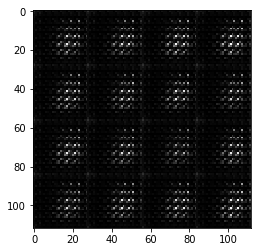

Timestamp 20170804-00-11-01.862 -  Epoch 1/2 -  Step 110 -  D Loss: 0.5643 - G Loss: 4.5455
Timestamp 20170804-00-11-08.128 -  Epoch 1/2 -  Step 120 -  D Loss: 0.6552 - G Loss: 4.6711
Timestamp 20170804-00-11-14.326 -  Epoch 1/2 -  Step 130 -  D Loss: 0.5631 - G Loss: 3.6787
Timestamp 20170804-00-11-20.523 -  Epoch 1/2 -  Step 140 -  D Loss: 0.4507 - G Loss: 4.0310
Timestamp 20170804-00-11-26.676 -  Epoch 1/2 -  Step 150 -  D Loss: 1.1175 - G Loss: 8.3885
Timestamp 20170804-00-11-32.941 -  Epoch 1/2 -  Step 160 -  D Loss: 0.5621 - G Loss: 1.8334
Timestamp 20170804-00-11-39.132 -  Epoch 1/2 -  Step 170 -  D Loss: 1.9248 - G Loss: 7.4836
Timestamp 20170804-00-11-45.295 -  Epoch 1/2 -  Step 180 -  D Loss: 1.0972 - G Loss: 7.4440
Timestamp 20170804-00-11-51.479 -  Epoch 1/2 -  Step 190 -  D Loss: 1.3317 - G Loss: 0.8066
Timestamp 20170804-00-11-57.929 -  Epoch 1/2 -  Step 200 -  D Loss: 1.0516 - G Loss: 1.8891


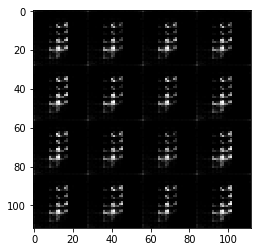

Timestamp 20170804-00-12-04.746 -  Epoch 1/2 -  Step 210 -  D Loss: 0.8597 - G Loss: 2.8985
Timestamp 20170804-00-12-10.895 -  Epoch 1/2 -  Step 220 -  D Loss: 0.5514 - G Loss: 2.6021
Timestamp 20170804-00-12-17.039 -  Epoch 1/2 -  Step 230 -  D Loss: 0.7478 - G Loss: 4.9217
Timestamp 20170804-00-12-23.203 -  Epoch 1/2 -  Step 240 -  D Loss: 0.6970 - G Loss: 2.3011
Timestamp 20170804-00-12-29.367 -  Epoch 1/2 -  Step 250 -  D Loss: 0.4328 - G Loss: 5.4360
Timestamp 20170804-00-12-35.524 -  Epoch 1/2 -  Step 260 -  D Loss: 0.8298 - G Loss: 1.4483
Timestamp 20170804-00-12-41.676 -  Epoch 1/2 -  Step 270 -  D Loss: 0.6938 - G Loss: 3.8230
Timestamp 20170804-00-12-47.904 -  Epoch 1/2 -  Step 280 -  D Loss: 0.4799 - G Loss: 4.6372
Timestamp 20170804-00-12-54.272 -  Epoch 1/2 -  Step 290 -  D Loss: 0.5217 - G Loss: 5.3783
Timestamp 20170804-00-13-00.533 -  Epoch 1/2 -  Step 300 -  D Loss: 0.4205 - G Loss: 4.6170


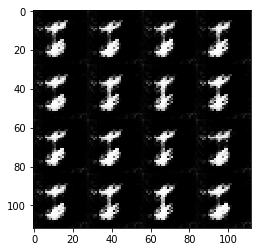

Timestamp 20170804-00-13-07.414 -  Epoch 1/2 -  Step 310 -  D Loss: 0.8076 - G Loss: 4.9680
Timestamp 20170804-00-13-13.943 -  Epoch 1/2 -  Step 320 -  D Loss: 0.4980 - G Loss: 3.2313
Timestamp 20170804-00-13-20.467 -  Epoch 1/2 -  Step 330 -  D Loss: 0.9371 - G Loss: 2.1905
Timestamp 20170804-00-13-26.714 -  Epoch 1/2 -  Step 340 -  D Loss: 0.7648 - G Loss: 2.4181
Timestamp 20170804-00-13-32.968 -  Epoch 1/2 -  Step 350 -  D Loss: 0.7233 - G Loss: 2.1900
Timestamp 20170804-00-13-39.236 -  Epoch 1/2 -  Step 360 -  D Loss: 1.5258 - G Loss: 1.1275
Timestamp 20170804-00-13-45.449 -  Epoch 1/2 -  Step 370 -  D Loss: 0.5682 - G Loss: 4.4591
Timestamp 20170804-00-13-51.723 -  Epoch 1/2 -  Step 380 -  D Loss: 0.4316 - G Loss: 2.8183
Timestamp 20170804-00-13-57.918 -  Epoch 1/2 -  Step 390 -  D Loss: 2.1421 - G Loss: 0.2689
Timestamp 20170804-00-14-04.108 -  Epoch 1/2 -  Step 400 -  D Loss: 0.9103 - G Loss: 2.0301


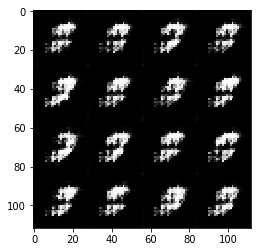

Timestamp 20170804-00-14-11.180 -  Epoch 1/2 -  Step 410 -  D Loss: 0.7054 - G Loss: 1.8961
Timestamp 20170804-00-14-17.460 -  Epoch 1/2 -  Step 420 -  D Loss: 1.1866 - G Loss: 0.9256
Timestamp 20170804-00-14-23.681 -  Epoch 1/2 -  Step 430 -  D Loss: 0.9942 - G Loss: 1.6550
Timestamp 20170804-00-14-29.873 -  Epoch 1/2 -  Step 440 -  D Loss: 1.5215 - G Loss: 1.4549
Timestamp 20170804-00-14-36.069 -  Epoch 1/2 -  Step 450 -  D Loss: 0.8605 - G Loss: 1.3945
Timestamp 20170804-00-14-42.226 -  Epoch 1/2 -  Step 460 -  D Loss: 0.8806 - G Loss: 1.7501
Timestamp 20170804-00-14-48.397 -  Epoch 1/2 -  Step 470 -  D Loss: 1.0701 - G Loss: 1.1062
Timestamp 20170804-00-14-54.705 -  Epoch 1/2 -  Step 480 -  D Loss: 0.6070 - G Loss: 3.2099
Timestamp 20170804-00-15-00.888 -  Epoch 1/2 -  Step 490 -  D Loss: 0.8795 - G Loss: 1.8226
Timestamp 20170804-00-15-07.053 -  Epoch 1/2 -  Step 500 -  D Loss: 0.8763 - G Loss: 1.2583


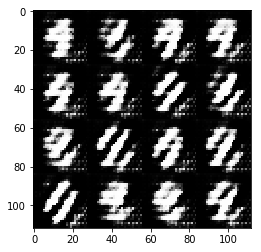

Timestamp 20170804-00-15-14.649 -  Epoch 1/2 -  Step 510 -  D Loss: 0.6701 - G Loss: 4.1352
Timestamp 20170804-00-15-20.832 -  Epoch 1/2 -  Step 520 -  D Loss: 0.7034 - G Loss: 3.0778
Timestamp 20170804-00-15-27.073 -  Epoch 1/2 -  Step 530 -  D Loss: 0.6673 - G Loss: 2.6982
Timestamp 20170804-00-15-33.313 -  Epoch 1/2 -  Step 540 -  D Loss: 0.9278 - G Loss: 1.7029
Timestamp 20170804-00-15-39.469 -  Epoch 1/2 -  Step 550 -  D Loss: 1.0042 - G Loss: 2.5782
Timestamp 20170804-00-15-45.672 -  Epoch 1/2 -  Step 560 -  D Loss: 0.5602 - G Loss: 2.1651
Timestamp 20170804-00-15-51.916 -  Epoch 1/2 -  Step 570 -  D Loss: 0.8571 - G Loss: 1.1560
Timestamp 20170804-00-15-58.155 -  Epoch 1/2 -  Step 580 -  D Loss: 0.7671 - G Loss: 4.8543
Timestamp 20170804-00-16-04.314 -  Epoch 1/2 -  Step 590 -  D Loss: 0.9017 - G Loss: 1.5771
Timestamp 20170804-00-16-10.535 -  Epoch 1/2 -  Step 600 -  D Loss: 0.4744 - G Loss: 3.5469


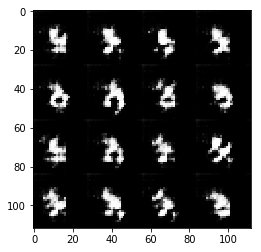

Timestamp 20170804-00-16-17.278 -  Epoch 1/2 -  Step 610 -  D Loss: 0.8373 - G Loss: 1.7036
Timestamp 20170804-00-16-23.514 -  Epoch 1/2 -  Step 620 -  D Loss: 0.5650 - G Loss: 3.5346
Timestamp 20170804-00-16-29.770 -  Epoch 1/2 -  Step 630 -  D Loss: 0.7111 - G Loss: 2.0243
Timestamp 20170804-00-16-35.924 -  Epoch 1/2 -  Step 640 -  D Loss: 1.1512 - G Loss: 1.6892
Timestamp 20170804-00-16-42.132 -  Epoch 1/2 -  Step 650 -  D Loss: 1.0011 - G Loss: 2.3331
Timestamp 20170804-00-16-48.331 -  Epoch 1/2 -  Step 660 -  D Loss: 1.0775 - G Loss: 2.3304
Timestamp 20170804-00-16-54.646 -  Epoch 1/2 -  Step 670 -  D Loss: 0.4847 - G Loss: 2.7422
Timestamp 20170804-00-17-00.905 -  Epoch 1/2 -  Step 680 -  D Loss: 0.6610 - G Loss: 1.9200
Timestamp 20170804-00-17-07.152 -  Epoch 1/2 -  Step 690 -  D Loss: 0.6756 - G Loss: 1.8225
Timestamp 20170804-00-17-13.356 -  Epoch 1/2 -  Step 700 -  D Loss: 0.7044 - G Loss: 1.4438


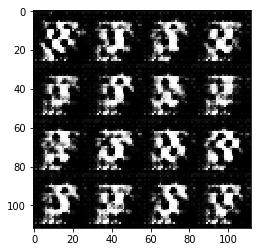

Timestamp 20170804-00-17-20.039 -  Epoch 1/2 -  Step 710 -  D Loss: 0.8638 - G Loss: 3.5680
Timestamp 20170804-00-17-26.322 -  Epoch 1/2 -  Step 720 -  D Loss: 0.6588 - G Loss: 2.1602
Timestamp 20170804-00-17-32.576 -  Epoch 1/2 -  Step 730 -  D Loss: 0.9631 - G Loss: 1.4575
Timestamp 20170804-00-17-38.828 -  Epoch 1/2 -  Step 740 -  D Loss: 0.6314 - G Loss: 1.4874
Timestamp 20170804-00-17-45.036 -  Epoch 1/2 -  Step 750 -  D Loss: 0.8745 - G Loss: 1.7854
Timestamp 20170804-00-17-51.171 -  Epoch 1/2 -  Step 760 -  D Loss: 1.3575 - G Loss: 0.9792
Timestamp 20170804-00-17-57.403 -  Epoch 1/2 -  Step 770 -  D Loss: 0.7621 - G Loss: 2.5172
Timestamp 20170804-00-18-03.785 -  Epoch 1/2 -  Step 780 -  D Loss: 0.8884 - G Loss: 2.3643
Timestamp 20170804-00-18-09.947 -  Epoch 1/2 -  Step 790 -  D Loss: 1.1648 - G Loss: 2.1654
Timestamp 20170804-00-18-16.262 -  Epoch 1/2 -  Step 800 -  D Loss: 0.8863 - G Loss: 1.6428


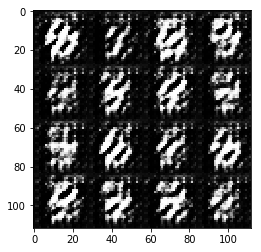

Timestamp 20170804-00-18-23.021 -  Epoch 1/2 -  Step 810 -  D Loss: 0.5226 - G Loss: 2.7724
Timestamp 20170804-00-18-29.219 -  Epoch 1/2 -  Step 820 -  D Loss: 1.2593 - G Loss: 0.9294
Timestamp 20170804-00-18-35.539 -  Epoch 1/2 -  Step 830 -  D Loss: 0.6195 - G Loss: 2.3451
Timestamp 20170804-00-18-41.707 -  Epoch 1/2 -  Step 840 -  D Loss: 0.8745 - G Loss: 2.2952
Timestamp 20170804-00-18-47.954 -  Epoch 1/2 -  Step 850 -  D Loss: 0.8216 - G Loss: 2.9276
Timestamp 20170804-00-18-54.121 -  Epoch 1/2 -  Step 860 -  D Loss: 0.8998 - G Loss: 1.6706
Timestamp 20170804-00-19-00.398 -  Epoch 1/2 -  Step 870 -  D Loss: 1.2168 - G Loss: 1.2796
Timestamp 20170804-00-19-06.665 -  Epoch 1/2 -  Step 880 -  D Loss: 0.9783 - G Loss: 2.4394
Timestamp 20170804-00-19-12.982 -  Epoch 1/2 -  Step 890 -  D Loss: 0.7994 - G Loss: 1.4201
Timestamp 20170804-00-19-19.145 -  Epoch 1/2 -  Step 900 -  D Loss: 1.3131 - G Loss: 1.4050


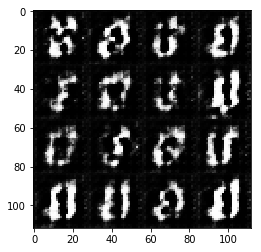

Timestamp 20170804-00-19-25.836 -  Epoch 1/2 -  Step 910 -  D Loss: 0.8045 - G Loss: 1.9857
Timestamp 20170804-00-19-32.241 -  Epoch 1/2 -  Step 920 -  D Loss: 1.2568 - G Loss: 1.3563
Timestamp 20170804-00-19-38.588 -  Epoch 1/2 -  Step 930 -  D Loss: 0.6358 - G Loss: 2.7925
Timestamp 20170804-00-19-44.787 -  Epoch 1/2 -  Step 940 -  D Loss: 0.9828 - G Loss: 1.1024
Timestamp 20170804-00-19-51.071 -  Epoch 1/2 -  Step 950 -  D Loss: 1.0531 - G Loss: 1.3260
Timestamp 20170804-00-19-57.288 -  Epoch 1/2 -  Step 960 -  D Loss: 0.9247 - G Loss: 1.2375
Timestamp 20170804-00-20-03.487 -  Epoch 1/2 -  Step 970 -  D Loss: 0.6487 - G Loss: 3.1062
Timestamp 20170804-00-20-09.945 -  Epoch 1/2 -  Step 980 -  D Loss: 1.5310 - G Loss: 2.3437
Timestamp 20170804-00-20-16.172 -  Epoch 1/2 -  Step 990 -  D Loss: 0.9346 - G Loss: 1.1383
Timestamp 20170804-00-20-22.385 -  Epoch 1/2 -  Step 1000 -  D Loss: 1.5350 - G Loss: 0.5153


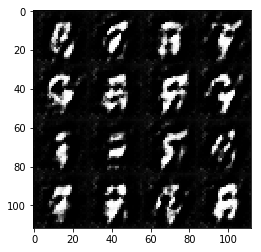

Timestamp 20170804-00-20-29.162 -  Epoch 1/2 -  Step 1010 -  D Loss: 0.7491 - G Loss: 2.5657
Timestamp 20170804-00-20-35.478 -  Epoch 1/2 -  Step 1020 -  D Loss: 1.5962 - G Loss: 0.8920
Timestamp 20170804-00-20-41.757 -  Epoch 1/2 -  Step 1030 -  D Loss: 1.0340 - G Loss: 1.6245
Timestamp 20170804-00-20-48.085 -  Epoch 1/2 -  Step 1040 -  D Loss: 0.7587 - G Loss: 1.7083
Timestamp 20170804-00-20-54.411 -  Epoch 1/2 -  Step 1050 -  D Loss: 1.4239 - G Loss: 1.3129
Timestamp 20170804-00-21-00.798 -  Epoch 1/2 -  Step 1060 -  D Loss: 0.5835 - G Loss: 1.6224
Timestamp 20170804-00-21-07.063 -  Epoch 1/2 -  Step 1070 -  D Loss: 1.1024 - G Loss: 1.7965
Timestamp 20170804-00-21-13.210 -  Epoch 1/2 -  Step 1080 -  D Loss: 0.9928 - G Loss: 1.6900
Timestamp 20170804-00-21-19.446 -  Epoch 1/2 -  Step 1090 -  D Loss: 1.1654 - G Loss: 0.8242
Timestamp 20170804-00-21-25.624 -  Epoch 1/2 -  Step 1100 -  D Loss: 0.9746 - G Loss: 3.6949


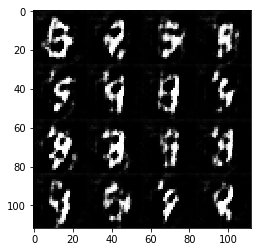

Timestamp 20170804-00-21-32.422 -  Epoch 1/2 -  Step 1110 -  D Loss: 0.8927 - G Loss: 1.5776
Timestamp 20170804-00-21-38.569 -  Epoch 1/2 -  Step 1120 -  D Loss: 1.1227 - G Loss: 1.5468
Timestamp 20170804-00-21-44.860 -  Epoch 1/2 -  Step 1130 -  D Loss: 0.8261 - G Loss: 0.8808
Timestamp 20170804-00-21-51.075 -  Epoch 1/2 -  Step 1140 -  D Loss: 0.6209 - G Loss: 2.5311
Timestamp 20170804-00-21-57.350 -  Epoch 1/2 -  Step 1150 -  D Loss: 0.6794 - G Loss: 1.7589
Timestamp 20170804-00-22-03.548 -  Epoch 1/2 -  Step 1160 -  D Loss: 0.9892 - G Loss: 2.3749
Timestamp 20170804-00-22-09.721 -  Epoch 1/2 -  Step 1170 -  D Loss: 0.9387 - G Loss: 0.8040
Timestamp 20170804-00-22-15.919 -  Epoch 1/2 -  Step 1180 -  D Loss: 0.9285 - G Loss: 1.2664
Timestamp 20170804-00-22-22.436 -  Epoch 1/2 -  Step 1190 -  D Loss: 0.7376 - G Loss: 1.7055
Timestamp 20170804-00-22-28.620 -  Epoch 1/2 -  Step 1200 -  D Loss: 0.9372 - G Loss: 1.5047


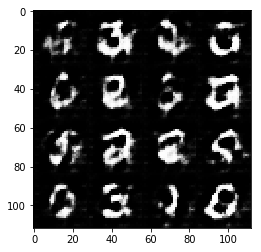

Timestamp 20170804-00-22-35.654 -  Epoch 1/2 -  Step 1210 -  D Loss: 0.8662 - G Loss: 2.3239
Timestamp 20170804-00-22-41.919 -  Epoch 1/2 -  Step 1220 -  D Loss: 0.9923 - G Loss: 4.4058
Timestamp 20170804-00-22-48.077 -  Epoch 1/2 -  Step 1230 -  D Loss: 1.0295 - G Loss: 1.7447
Timestamp 20170804-00-22-54.323 -  Epoch 1/2 -  Step 1240 -  D Loss: 1.0845 - G Loss: 1.7955
Timestamp 20170804-00-23-00.497 -  Epoch 1/2 -  Step 1250 -  D Loss: 0.9343 - G Loss: 1.3767
Timestamp 20170804-00-23-06.721 -  Epoch 1/2 -  Step 1260 -  D Loss: 0.8525 - G Loss: 1.4543
Timestamp 20170804-00-23-12.956 -  Epoch 1/2 -  Step 1270 -  D Loss: 0.8640 - G Loss: 1.4328
Timestamp 20170804-00-23-19.122 -  Epoch 1/2 -  Step 1280 -  D Loss: 0.9854 - G Loss: 1.6090
Timestamp 20170804-00-23-25.410 -  Epoch 1/2 -  Step 1290 -  D Loss: 0.8845 - G Loss: 2.7202
Timestamp 20170804-00-23-31.638 -  Epoch 1/2 -  Step 1300 -  D Loss: 1.2425 - G Loss: 0.9884


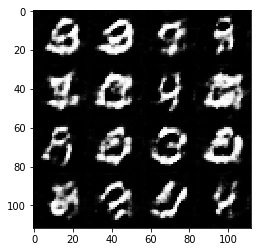

Timestamp 20170804-00-23-38.600 -  Epoch 1/2 -  Step 1310 -  D Loss: 1.1797 - G Loss: 1.5297
Timestamp 20170804-00-23-44.787 -  Epoch 1/2 -  Step 1320 -  D Loss: 0.7007 - G Loss: 1.5090
Timestamp 20170804-00-23-51.032 -  Epoch 1/2 -  Step 1330 -  D Loss: 1.5136 - G Loss: 1.4386
Timestamp 20170804-00-23-57.256 -  Epoch 1/2 -  Step 1340 -  D Loss: 0.9646 - G Loss: 0.6492
Timestamp 20170804-00-24-03.443 -  Epoch 1/2 -  Step 1350 -  D Loss: 0.8216 - G Loss: 1.7215
Timestamp 20170804-00-24-09.697 -  Epoch 1/2 -  Step 1360 -  D Loss: 1.1236 - G Loss: 1.1759
Timestamp 20170804-00-24-16.013 -  Epoch 1/2 -  Step 1370 -  D Loss: 1.1240 - G Loss: 1.1768
Timestamp 20170804-00-24-22.193 -  Epoch 1/2 -  Step 1380 -  D Loss: 0.6026 - G Loss: 1.2566
Timestamp 20170804-00-24-28.441 -  Epoch 1/2 -  Step 1390 -  D Loss: 1.2645 - G Loss: 0.7207
Timestamp 20170804-00-24-34.671 -  Epoch 1/2 -  Step 1400 -  D Loss: 1.0672 - G Loss: 1.2616


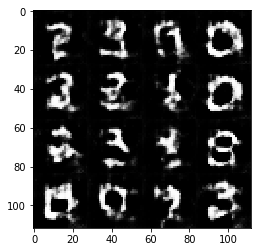

Timestamp 20170804-00-24-41.428 -  Epoch 1/2 -  Step 1410 -  D Loss: 0.9508 - G Loss: 1.2799
Timestamp 20170804-00-24-47.681 -  Epoch 1/2 -  Step 1420 -  D Loss: 0.7611 - G Loss: 1.9671
Timestamp 20170804-00-24-53.836 -  Epoch 1/2 -  Step 1430 -  D Loss: 1.1669 - G Loss: 1.1434
Timestamp 20170804-00-25-00.107 -  Epoch 1/2 -  Step 1440 -  D Loss: 1.7142 - G Loss: 1.4150
Timestamp 20170804-00-25-06.245 -  Epoch 1/2 -  Step 1450 -  D Loss: 0.9515 - G Loss: 2.1051
Timestamp 20170804-00-25-12.442 -  Epoch 1/2 -  Step 1460 -  D Loss: 0.7136 - G Loss: 1.6333
Timestamp 20170804-00-25-18.686 -  Epoch 1/2 -  Step 1470 -  D Loss: 0.8009 - G Loss: 1.4120
Timestamp 20170804-00-25-24.944 -  Epoch 1/2 -  Step 1480 -  D Loss: 0.9804 - G Loss: 1.1424
Timestamp 20170804-00-25-31.103 -  Epoch 1/2 -  Step 1490 -  D Loss: 1.1879 - G Loss: 2.1354
Timestamp 20170804-00-25-37.385 -  Epoch 1/2 -  Step 1500 -  D Loss: 1.0786 - G Loss: 1.6366


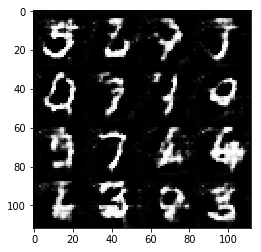

Timestamp 20170804-00-25-44.122 -  Epoch 1/2 -  Step 1510 -  D Loss: 0.8716 - G Loss: 1.3353
Timestamp 20170804-00-25-50.292 -  Epoch 1/2 -  Step 1520 -  D Loss: 1.1058 - G Loss: 0.6814
Timestamp 20170804-00-25-56.502 -  Epoch 1/2 -  Step 1530 -  D Loss: 1.0263 - G Loss: 1.3826
Timestamp 20170804-00-26-02.747 -  Epoch 1/2 -  Step 1540 -  D Loss: 1.1657 - G Loss: 2.3535
Timestamp 20170804-00-26-08.961 -  Epoch 1/2 -  Step 1550 -  D Loss: 0.9195 - G Loss: 1.7992
Timestamp 20170804-00-26-15.126 -  Epoch 1/2 -  Step 1560 -  D Loss: 0.8013 - G Loss: 1.4179
Timestamp 20170804-00-26-21.374 -  Epoch 1/2 -  Step 1570 -  D Loss: 0.9768 - G Loss: 1.0067
Timestamp 20170804-00-26-27.560 -  Epoch 1/2 -  Step 1580 -  D Loss: 0.9264 - G Loss: 1.0758
Timestamp 20170804-00-26-33.805 -  Epoch 1/2 -  Step 1590 -  D Loss: 1.4827 - G Loss: 1.2220
Timestamp 20170804-00-26-39.991 -  Epoch 1/2 -  Step 1600 -  D Loss: 0.8407 - G Loss: 2.4523


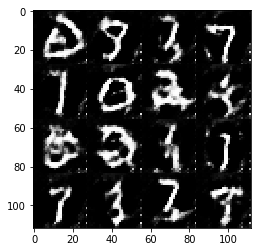

Timestamp 20170804-00-26-46.689 -  Epoch 1/2 -  Step 1610 -  D Loss: 1.0720 - G Loss: 0.9732
Timestamp 20170804-00-26-52.830 -  Epoch 1/2 -  Step 1620 -  D Loss: 0.8208 - G Loss: 1.6734
Timestamp 20170804-00-26-59.054 -  Epoch 1/2 -  Step 1630 -  D Loss: 1.0764 - G Loss: 1.1005
Timestamp 20170804-00-27-05.252 -  Epoch 1/2 -  Step 1640 -  D Loss: 1.0677 - G Loss: 0.7861
Timestamp 20170804-00-27-11.460 -  Epoch 1/2 -  Step 1650 -  D Loss: 0.7654 - G Loss: 1.6147
Timestamp 20170804-00-27-17.746 -  Epoch 1/2 -  Step 1660 -  D Loss: 1.1983 - G Loss: 1.6963
Timestamp 20170804-00-27-23.929 -  Epoch 1/2 -  Step 1670 -  D Loss: 1.0353 - G Loss: 1.6553
Timestamp 20170804-00-27-30.095 -  Epoch 1/2 -  Step 1680 -  D Loss: 0.8287 - G Loss: 1.3091
Timestamp 20170804-00-27-36.301 -  Epoch 1/2 -  Step 1690 -  D Loss: 1.1795 - G Loss: 0.9176
Timestamp 20170804-00-27-42.486 -  Epoch 1/2 -  Step 1700 -  D Loss: 1.1523 - G Loss: 1.0906


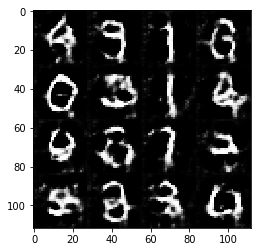

Timestamp 20170804-00-27-49.191 -  Epoch 1/2 -  Step 1710 -  D Loss: 0.8732 - G Loss: 1.9317
Timestamp 20170804-00-27-55.433 -  Epoch 1/2 -  Step 1720 -  D Loss: 0.8902 - G Loss: 1.5653
Timestamp 20170804-00-28-01.651 -  Epoch 1/2 -  Step 1730 -  D Loss: 0.8042 - G Loss: 1.3366
Timestamp 20170804-00-28-07.793 -  Epoch 1/2 -  Step 1740 -  D Loss: 1.0456 - G Loss: 1.3789
Timestamp 20170804-00-28-14.224 -  Epoch 1/2 -  Step 1750 -  D Loss: 0.9031 - G Loss: 1.0223
Timestamp 20170804-00-28-20.386 -  Epoch 1/2 -  Step 1760 -  D Loss: 0.9596 - G Loss: 0.6625
Timestamp 20170804-00-28-26.551 -  Epoch 1/2 -  Step 1770 -  D Loss: 0.8021 - G Loss: 1.8675
Timestamp 20170804-00-28-32.720 -  Epoch 1/2 -  Step 1780 -  D Loss: 1.3936 - G Loss: 1.2691
Timestamp 20170804-00-28-38.976 -  Epoch 1/2 -  Step 1790 -  D Loss: 1.5650 - G Loss: 0.7114
Timestamp 20170804-00-28-45.165 -  Epoch 1/2 -  Step 1800 -  D Loss: 1.2563 - G Loss: 0.8079


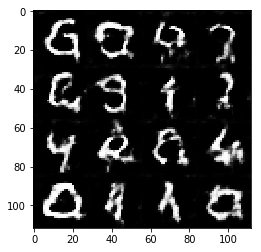

Timestamp 20170804-00-28-51.904 -  Epoch 1/2 -  Step 1810 -  D Loss: 1.1780 - G Loss: 0.9824
Timestamp 20170804-00-28-58.154 -  Epoch 1/2 -  Step 1820 -  D Loss: 1.1717 - G Loss: 1.4061
Timestamp 20170804-00-29-04.297 -  Epoch 1/2 -  Step 1830 -  D Loss: 0.6193 - G Loss: 1.5348
Timestamp 20170804-00-29-10.498 -  Epoch 1/2 -  Step 1840 -  D Loss: 0.8040 - G Loss: 1.3829
Timestamp 20170804-00-29-16.650 -  Epoch 1/2 -  Step 1850 -  D Loss: 1.1403 - G Loss: 1.3967
Timestamp 20170804-00-29-22.839 -  Epoch 1/2 -  Step 1860 -  D Loss: 1.5486 - G Loss: 0.7531
Timestamp 20170804-00-29-29.031 -  Epoch 1/2 -  Step 1870 -  D Loss: 0.8095 - G Loss: 2.3613
Timestamp 20170804-00-29-35.191 -  Epoch 1/2 -  Step 1880 -  D Loss: 0.8045 - G Loss: 1.3340
Timestamp 20170804-00-29-41.369 -  Epoch 1/2 -  Step 1890 -  D Loss: 0.9336 - G Loss: 2.3695
Timestamp 20170804-00-29-47.539 -  Epoch 1/2 -  Step 1900 -  D Loss: 0.6336 - G Loss: 2.4144


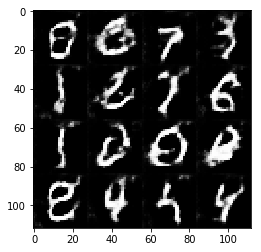

Timestamp 20170804-00-29-54.450 -  Epoch 1/2 -  Step 1910 -  D Loss: 0.8588 - G Loss: 1.8789
Timestamp 20170804-00-30-00.672 -  Epoch 1/2 -  Step 1920 -  D Loss: 0.9550 - G Loss: 1.7517
Timestamp 20170804-00-30-06.935 -  Epoch 1/2 -  Step 1930 -  D Loss: 1.1096 - G Loss: 1.3763
Timestamp 20170804-00-30-13.069 -  Epoch 1/2 -  Step 1940 -  D Loss: 0.7333 - G Loss: 1.6602
Timestamp 20170804-00-30-19.237 -  Epoch 1/2 -  Step 1950 -  D Loss: 1.1029 - G Loss: 1.1559
Timestamp 20170804-00-30-25.435 -  Epoch 1/2 -  Step 1960 -  D Loss: 1.8239 - G Loss: 0.5352
Timestamp 20170804-00-30-31.591 -  Epoch 1/2 -  Step 1970 -  D Loss: 0.8687 - G Loss: 0.4608
Timestamp 20170804-00-30-37.745 -  Epoch 1/2 -  Step 1980 -  D Loss: 0.8350 - G Loss: 1.0320
Timestamp 20170804-00-30-43.911 -  Epoch 1/2 -  Step 1990 -  D Loss: 0.8512 - G Loss: 1.2252
Timestamp 20170804-00-30-50.054 -  Epoch 1/2 -  Step 2000 -  D Loss: 0.8301 - G Loss: 1.8683


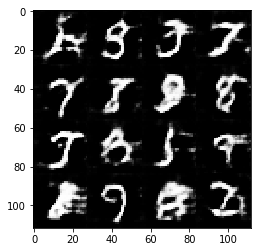

Timestamp 20170804-00-30-56.796 -  Epoch 1/2 -  Step 2010 -  D Loss: 0.9425 - G Loss: 1.3244
Timestamp 20170804-00-31-03.098 -  Epoch 1/2 -  Step 2020 -  D Loss: 1.0772 - G Loss: 1.5129
Timestamp 20170804-00-31-09.300 -  Epoch 1/2 -  Step 2030 -  D Loss: 1.0790 - G Loss: 1.4116
Timestamp 20170804-00-31-15.485 -  Epoch 1/2 -  Step 2040 -  D Loss: 0.9362 - G Loss: 1.1536
Timestamp 20170804-00-31-21.684 -  Epoch 1/2 -  Step 2050 -  D Loss: 0.7726 - G Loss: 1.8697
Timestamp 20170804-00-31-27.894 -  Epoch 1/2 -  Step 2060 -  D Loss: 1.2189 - G Loss: 0.8081
Timestamp 20170804-00-31-34.136 -  Epoch 1/2 -  Step 2070 -  D Loss: 0.9200 - G Loss: 1.2262
Timestamp 20170804-00-31-40.309 -  Epoch 1/2 -  Step 2080 -  D Loss: 1.1537 - G Loss: 1.0200
Timestamp 20170804-00-31-46.578 -  Epoch 1/2 -  Step 2090 -  D Loss: 1.0629 - G Loss: 0.9644
Timestamp 20170804-00-31-52.786 -  Epoch 1/2 -  Step 2100 -  D Loss: 1.0256 - G Loss: 0.7732


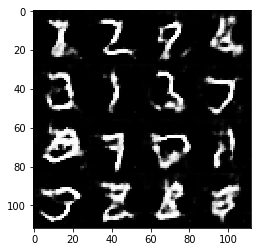

Timestamp 20170804-00-31-59.589 -  Epoch 1/2 -  Step 2110 -  D Loss: 0.9455 - G Loss: 0.8998
Timestamp 20170804-00-32-05.756 -  Epoch 1/2 -  Step 2120 -  D Loss: 1.1500 - G Loss: 1.5474
Timestamp 20170804-00-32-11.944 -  Epoch 1/2 -  Step 2130 -  D Loss: 1.0699 - G Loss: 1.4844
Timestamp 20170804-00-32-18.147 -  Epoch 1/2 -  Step 2140 -  D Loss: 0.9088 - G Loss: 2.2499
Timestamp 20170804-00-32-24.371 -  Epoch 1/2 -  Step 2150 -  D Loss: 1.2254 - G Loss: 0.8198
Timestamp 20170804-00-32-30.552 -  Epoch 1/2 -  Step 2160 -  D Loss: 0.9912 - G Loss: 2.0068
Timestamp 20170804-00-32-36.699 -  Epoch 1/2 -  Step 2170 -  D Loss: 1.2439 - G Loss: 0.8890
Timestamp 20170804-00-32-42.921 -  Epoch 1/2 -  Step 2180 -  D Loss: 0.9613 - G Loss: 1.2168
Timestamp 20170804-00-32-49.118 -  Epoch 1/2 -  Step 2190 -  D Loss: 1.2207 - G Loss: 1.3502
Timestamp 20170804-00-32-55.434 -  Epoch 1/2 -  Step 2200 -  D Loss: 0.8515 - G Loss: 1.0452


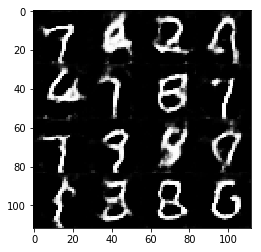

Timestamp 20170804-00-33-02.478 -  Epoch 1/2 -  Step 2210 -  D Loss: 1.1249 - G Loss: 1.1849
Timestamp 20170804-00-33-08.663 -  Epoch 1/2 -  Step 2220 -  D Loss: 1.2481 - G Loss: 1.4298
Timestamp 20170804-00-33-14.875 -  Epoch 1/2 -  Step 2230 -  D Loss: 1.0790 - G Loss: 1.4752
Timestamp 20170804-00-33-21.054 -  Epoch 1/2 -  Step 2240 -  D Loss: 0.8020 - G Loss: 2.5818
Timestamp 20170804-00-33-27.261 -  Epoch 1/2 -  Step 2250 -  D Loss: 0.9623 - G Loss: 1.2996
Timestamp 20170804-00-33-33.453 -  Epoch 1/2 -  Step 2260 -  D Loss: 0.9566 - G Loss: 1.1979
Timestamp 20170804-00-33-39.658 -  Epoch 1/2 -  Step 2270 -  D Loss: 1.2145 - G Loss: 1.1748
Timestamp 20170804-00-33-45.841 -  Epoch 1/2 -  Step 2280 -  D Loss: 0.7164 - G Loss: 1.4340
Timestamp 20170804-00-33-52.024 -  Epoch 1/2 -  Step 2290 -  D Loss: 0.9645 - G Loss: 1.6176
Timestamp 20170804-00-33-58.255 -  Epoch 1/2 -  Step 2300 -  D Loss: 1.1629 - G Loss: 1.0667


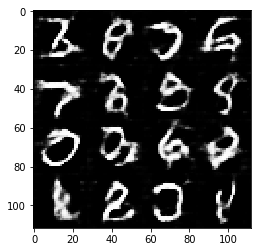

Timestamp 20170804-00-34-05.063 -  Epoch 1/2 -  Step 2310 -  D Loss: 1.0449 - G Loss: 1.2629
Timestamp 20170804-00-34-11.280 -  Epoch 1/2 -  Step 2320 -  D Loss: 0.7690 - G Loss: 1.4756
Timestamp 20170804-00-34-17.437 -  Epoch 1/2 -  Step 2330 -  D Loss: 1.1245 - G Loss: 1.6377
Timestamp 20170804-00-34-23.598 -  Epoch 1/2 -  Step 2340 -  D Loss: 0.9709 - G Loss: 1.6941
Timestamp 20170804-00-34-29.884 -  Epoch 1/2 -  Step 2350 -  D Loss: 1.0993 - G Loss: 0.8318
Timestamp 20170804-00-34-36.038 -  Epoch 1/2 -  Step 2360 -  D Loss: 0.8248 - G Loss: 1.6899
Timestamp 20170804-00-34-42.242 -  Epoch 1/2 -  Step 2370 -  D Loss: 0.9402 - G Loss: 1.0571
Timestamp 20170804-00-34-48.486 -  Epoch 1/2 -  Step 2380 -  D Loss: 0.6988 - G Loss: 1.8304
Timestamp 20170804-00-34-54.671 -  Epoch 1/2 -  Step 2390 -  D Loss: 1.0578 - G Loss: 1.0066
Timestamp 20170804-00-35-00.851 -  Epoch 1/2 -  Step 2400 -  D Loss: 1.0853 - G Loss: 1.4056


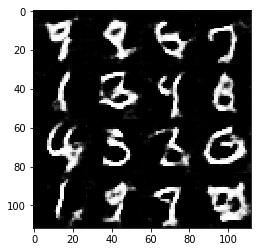

Timestamp 20170804-00-35-07.634 -  Epoch 1/2 -  Step 2410 -  D Loss: 0.9334 - G Loss: 1.7473
Timestamp 20170804-00-35-13.790 -  Epoch 1/2 -  Step 2420 -  D Loss: 0.9658 - G Loss: 1.3911
Timestamp 20170804-00-35-19.970 -  Epoch 1/2 -  Step 2430 -  D Loss: 0.7505 - G Loss: 2.2148
Timestamp 20170804-00-35-26.145 -  Epoch 1/2 -  Step 2440 -  D Loss: 1.1032 - G Loss: 0.8813
Timestamp 20170804-00-35-32.303 -  Epoch 1/2 -  Step 2450 -  D Loss: 0.8642 - G Loss: 2.0060
Timestamp 20170804-00-35-38.491 -  Epoch 1/2 -  Step 2460 -  D Loss: 0.5585 - G Loss: 2.3463
Timestamp 20170804-00-35-44.666 -  Epoch 1/2 -  Step 2470 -  D Loss: 1.1364 - G Loss: 1.4517
Timestamp 20170804-00-35-50.842 -  Epoch 1/2 -  Step 2480 -  D Loss: 1.0367 - G Loss: 1.5386
Timestamp 20170804-00-35-57.052 -  Epoch 1/2 -  Step 2490 -  D Loss: 1.2149 - G Loss: 1.6350
Timestamp 20170804-00-36-03.240 -  Epoch 1/2 -  Step 2500 -  D Loss: 0.9688 - G Loss: 1.2605


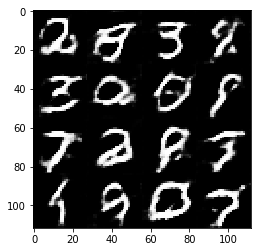

Timestamp 20170804-00-36-10.278 -  Epoch 1/2 -  Step 2510 -  D Loss: 0.6975 - G Loss: 1.7437
Timestamp 20170804-00-36-16.500 -  Epoch 1/2 -  Step 2520 -  D Loss: 1.0860 - G Loss: 1.2017
Timestamp 20170804-00-36-22.861 -  Epoch 1/2 -  Step 2530 -  D Loss: 0.9036 - G Loss: 1.5837
Timestamp 20170804-00-36-29.062 -  Epoch 1/2 -  Step 2540 -  D Loss: 1.0477 - G Loss: 0.9828
Timestamp 20170804-00-36-35.412 -  Epoch 1/2 -  Step 2550 -  D Loss: 1.0887 - G Loss: 1.5870
Timestamp 20170804-00-36-41.585 -  Epoch 1/2 -  Step 2560 -  D Loss: 0.9191 - G Loss: 1.3788
Timestamp 20170804-00-36-48.259 -  Epoch 1/2 -  Step 2570 -  D Loss: 0.9824 - G Loss: 1.3315
Timestamp 20170804-00-36-54.578 -  Epoch 1/2 -  Step 2580 -  D Loss: 0.9390 - G Loss: 2.3612
Timestamp 20170804-00-37-00.832 -  Epoch 1/2 -  Step 2590 -  D Loss: 1.2529 - G Loss: 1.5334
Timestamp 20170804-00-37-07.009 -  Epoch 1/2 -  Step 2600 -  D Loss: 0.8913 - G Loss: 1.5030


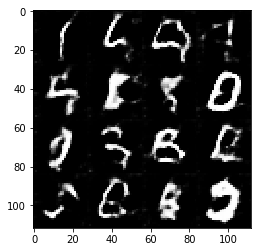

Timestamp 20170804-00-37-13.787 -  Epoch 1/2 -  Step 2610 -  D Loss: 0.9117 - G Loss: 1.6558
Timestamp 20170804-00-37-20.046 -  Epoch 1/2 -  Step 2620 -  D Loss: 1.2045 - G Loss: 1.3981
Timestamp 20170804-00-37-26.593 -  Epoch 1/2 -  Step 2630 -  D Loss: 0.8180 - G Loss: 1.2004
Timestamp 20170804-00-37-33.140 -  Epoch 1/2 -  Step 2640 -  D Loss: 1.1177 - G Loss: 1.0967
Timestamp 20170804-00-37-40.133 -  Epoch 1/2 -  Step 2650 -  D Loss: 0.9516 - G Loss: 1.5698
Timestamp 20170804-00-37-46.388 -  Epoch 1/2 -  Step 2660 -  D Loss: 0.8960 - G Loss: 1.7383
Timestamp 20170804-00-37-52.579 -  Epoch 1/2 -  Step 2670 -  D Loss: 0.7060 - G Loss: 1.4219
Timestamp 20170804-00-37-58.768 -  Epoch 1/2 -  Step 2680 -  D Loss: 1.2432 - G Loss: 1.4689
Timestamp 20170804-00-38-04.973 -  Epoch 1/2 -  Step 2690 -  D Loss: 1.0928 - G Loss: 1.2356
Timestamp 20170804-00-38-11.152 -  Epoch 1/2 -  Step 2700 -  D Loss: 1.0850 - G Loss: 0.9279


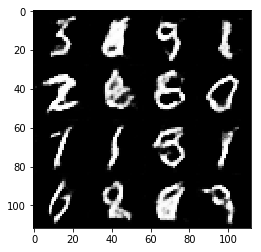

Timestamp 20170804-00-38-17.847 -  Epoch 1/2 -  Step 2710 -  D Loss: 1.1576 - G Loss: 1.1994
Timestamp 20170804-00-38-24.085 -  Epoch 1/2 -  Step 2720 -  D Loss: 0.7575 - G Loss: 1.5902
Timestamp 20170804-00-38-30.237 -  Epoch 1/2 -  Step 2730 -  D Loss: 0.9294 - G Loss: 1.2314
Timestamp 20170804-00-38-36.423 -  Epoch 1/2 -  Step 2740 -  D Loss: 1.5542 - G Loss: 0.8300
Timestamp 20170804-00-38-42.572 -  Epoch 1/2 -  Step 2750 -  D Loss: 0.9217 - G Loss: 0.8672
Timestamp 20170804-00-38-48.837 -  Epoch 1/2 -  Step 2760 -  D Loss: 0.9626 - G Loss: 1.6476
Timestamp 20170804-00-38-55.039 -  Epoch 1/2 -  Step 2770 -  D Loss: 0.7698 - G Loss: 2.6166
Timestamp 20170804-00-39-01.209 -  Epoch 1/2 -  Step 2780 -  D Loss: 0.6245 - G Loss: 1.8786
Timestamp 20170804-00-39-07.420 -  Epoch 1/2 -  Step 2790 -  D Loss: 0.7704 - G Loss: 1.2765
Timestamp 20170804-00-39-13.604 -  Epoch 1/2 -  Step 2800 -  D Loss: 1.1803 - G Loss: 0.9965


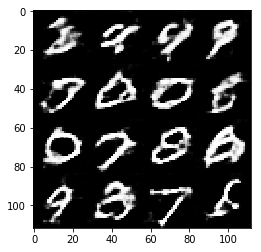

Timestamp 20170804-00-39-20.456 -  Epoch 1/2 -  Step 2810 -  D Loss: 1.2477 - G Loss: 1.2086
Timestamp 20170804-00-39-26.690 -  Epoch 1/2 -  Step 2820 -  D Loss: 0.7691 - G Loss: 1.5757
Timestamp 20170804-00-39-32.905 -  Epoch 1/2 -  Step 2830 -  D Loss: 0.6659 - G Loss: 1.9981
Timestamp 20170804-00-39-39.204 -  Epoch 1/2 -  Step 2840 -  D Loss: 0.9963 - G Loss: 1.1860
Timestamp 20170804-00-39-45.411 -  Epoch 1/2 -  Step 2850 -  D Loss: 0.8180 - G Loss: 1.7069
Timestamp 20170804-00-39-51.586 -  Epoch 1/2 -  Step 2860 -  D Loss: 0.7789 - G Loss: 1.4376
Timestamp 20170804-00-39-57.759 -  Epoch 1/2 -  Step 2870 -  D Loss: 0.7301 - G Loss: 1.2742
Timestamp 20170804-00-40-03.982 -  Epoch 1/2 -  Step 2880 -  D Loss: 1.1265 - G Loss: 1.1247
Timestamp 20170804-00-40-10.262 -  Epoch 1/2 -  Step 2890 -  D Loss: 1.0728 - G Loss: 1.2596
Timestamp 20170804-00-40-16.492 -  Epoch 1/2 -  Step 2900 -  D Loss: 1.1846 - G Loss: 2.2406


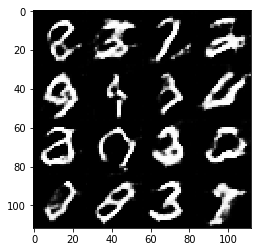

Timestamp 20170804-00-40-23.323 -  Epoch 1/2 -  Step 2910 -  D Loss: 0.6231 - G Loss: 2.0863
Timestamp 20170804-00-40-29.492 -  Epoch 1/2 -  Step 2920 -  D Loss: 0.9227 - G Loss: 1.1331
Timestamp 20170804-00-40-35.719 -  Epoch 1/2 -  Step 2930 -  D Loss: 1.0153 - G Loss: 1.2825
Timestamp 20170804-00-40-41.865 -  Epoch 1/2 -  Step 2940 -  D Loss: 0.9123 - G Loss: 0.9178
Timestamp 20170804-00-40-48.073 -  Epoch 1/2 -  Step 2950 -  D Loss: 0.6881 - G Loss: 1.0942
Timestamp 20170804-00-40-54.236 -  Epoch 1/2 -  Step 2960 -  D Loss: 1.0268 - G Loss: 1.3635
Timestamp 20170804-00-41-00.392 -  Epoch 1/2 -  Step 2970 -  D Loss: 0.7183 - G Loss: 1.6026
Timestamp 20170804-00-41-06.542 -  Epoch 1/2 -  Step 2980 -  D Loss: 1.0689 - G Loss: 1.7343
Timestamp 20170804-00-41-12.703 -  Epoch 1/2 -  Step 2990 -  D Loss: 0.8381 - G Loss: 1.7296
Timestamp 20170804-00-41-18.892 -  Epoch 1/2 -  Step 3000 -  D Loss: 0.8296 - G Loss: 1.1987


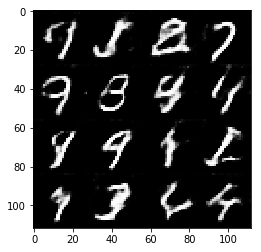

Timestamp 20170804-00-41-25.895 -  Epoch 1/2 -  Step 3010 -  D Loss: 0.8576 - G Loss: 1.6034
Timestamp 20170804-00-41-32.082 -  Epoch 1/2 -  Step 3020 -  D Loss: 1.4769 - G Loss: 0.6007
Timestamp 20170804-00-41-38.223 -  Epoch 1/2 -  Step 3030 -  D Loss: 0.8554 - G Loss: 1.8813
Timestamp 20170804-00-41-44.496 -  Epoch 1/2 -  Step 3040 -  D Loss: 0.9119 - G Loss: 1.6290
Timestamp 20170804-00-41-50.692 -  Epoch 1/2 -  Step 3050 -  D Loss: 0.9111 - G Loss: 1.2237
Timestamp 20170804-00-41-56.830 -  Epoch 1/2 -  Step 3060 -  D Loss: 0.8217 - G Loss: 0.6481
Timestamp 20170804-00-42-03.035 -  Epoch 1/2 -  Step 3070 -  D Loss: 0.6898 - G Loss: 0.7431
Timestamp 20170804-00-42-09.239 -  Epoch 1/2 -  Step 3080 -  D Loss: 0.6000 - G Loss: 2.4422
Timestamp 20170804-00-42-15.494 -  Epoch 1/2 -  Step 3090 -  D Loss: 0.7537 - G Loss: 1.4953
Timestamp 20170804-00-42-21.638 -  Epoch 1/2 -  Step 3100 -  D Loss: 1.1982 - G Loss: 0.9810


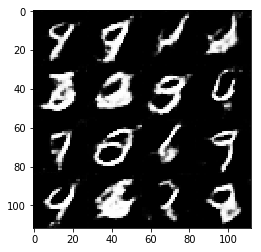

Timestamp 20170804-00-42-28.419 -  Epoch 1/2 -  Step 3110 -  D Loss: 0.8184 - G Loss: 1.2728
Timestamp 20170804-00-42-34.556 -  Epoch 1/2 -  Step 3120 -  D Loss: 1.2063 - G Loss: 1.1883
Timestamp 20170804-00-42-40.799 -  Epoch 1/2 -  Step 3130 -  D Loss: 0.9653 - G Loss: 2.8981
Timestamp 20170804-00-42-47.094 -  Epoch 1/2 -  Step 3140 -  D Loss: 0.9636 - G Loss: 1.2369
Timestamp 20170804-00-42-53.263 -  Epoch 1/2 -  Step 3150 -  D Loss: 1.1741 - G Loss: 1.6445
Timestamp 20170804-00-42-59.414 -  Epoch 1/2 -  Step 3160 -  D Loss: 1.2136 - G Loss: 1.1584
Timestamp 20170804-00-43-05.661 -  Epoch 1/2 -  Step 3170 -  D Loss: 1.2764 - G Loss: 0.8452
Timestamp 20170804-00-43-11.930 -  Epoch 1/2 -  Step 3180 -  D Loss: 0.8512 - G Loss: 1.1037
Timestamp 20170804-00-43-18.185 -  Epoch 1/2 -  Step 3190 -  D Loss: 1.4155 - G Loss: 0.7656
Timestamp 20170804-00-43-24.369 -  Epoch 1/2 -  Step 3200 -  D Loss: 1.1248 - G Loss: 1.5908


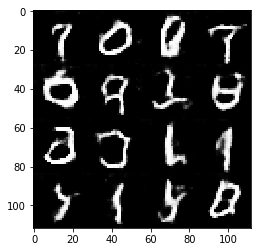

Timestamp 20170804-00-43-31.256 -  Epoch 1/2 -  Step 3210 -  D Loss: 0.8230 - G Loss: 1.9818
Timestamp 20170804-00-43-37.501 -  Epoch 1/2 -  Step 3220 -  D Loss: 0.9331 - G Loss: 1.2544
Timestamp 20170804-00-43-43.739 -  Epoch 1/2 -  Step 3230 -  D Loss: 0.9132 - G Loss: 1.0999
Timestamp 20170804-00-43-49.931 -  Epoch 1/2 -  Step 3240 -  D Loss: 0.7040 - G Loss: 2.1797
Timestamp 20170804-00-43-56.174 -  Epoch 1/2 -  Step 3250 -  D Loss: 0.7844 - G Loss: 2.2249
Timestamp 20170804-00-44-02.337 -  Epoch 1/2 -  Step 3260 -  D Loss: 0.9737 - G Loss: 1.5898
Timestamp 20170804-00-44-08.552 -  Epoch 1/2 -  Step 3270 -  D Loss: 0.8587 - G Loss: 1.5864
Timestamp 20170804-00-44-14.744 -  Epoch 1/2 -  Step 3280 -  D Loss: 1.0199 - G Loss: 1.9449
Timestamp 20170804-00-44-20.970 -  Epoch 1/2 -  Step 3290 -  D Loss: 1.3024 - G Loss: 1.4656
Timestamp 20170804-00-44-27.145 -  Epoch 1/2 -  Step 3300 -  D Loss: 1.2203 - G Loss: 1.9030


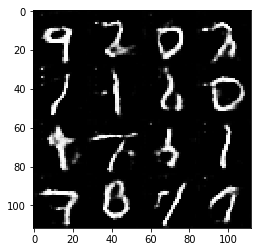

Timestamp 20170804-00-44-34.025 -  Epoch 1/2 -  Step 3310 -  D Loss: 0.8834 - G Loss: 1.1120
Timestamp 20170804-00-44-40.174 -  Epoch 1/2 -  Step 3320 -  D Loss: 1.1785 - G Loss: 1.2372
Timestamp 20170804-00-44-46.330 -  Epoch 1/2 -  Step 3330 -  D Loss: 0.9503 - G Loss: 1.2068
Timestamp 20170804-00-44-52.476 -  Epoch 1/2 -  Step 3340 -  D Loss: 0.9300 - G Loss: 1.7844
Timestamp 20170804-00-44-58.615 -  Epoch 1/2 -  Step 3350 -  D Loss: 0.9805 - G Loss: 1.4457
Timestamp 20170804-00-45-04.820 -  Epoch 1/2 -  Step 3360 -  D Loss: 1.5836 - G Loss: 0.7618
Timestamp 20170804-00-45-10.977 -  Epoch 1/2 -  Step 3370 -  D Loss: 0.8271 - G Loss: 1.8013
Timestamp 20170804-00-45-17.121 -  Epoch 1/2 -  Step 3380 -  D Loss: 1.0547 - G Loss: 0.7798
Timestamp 20170804-00-45-23.371 -  Epoch 1/2 -  Step 3390 -  D Loss: 1.0080 - G Loss: 0.8733
Timestamp 20170804-00-45-29.521 -  Epoch 1/2 -  Step 3400 -  D Loss: 0.9991 - G Loss: 1.0105


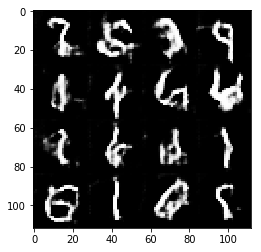

Timestamp 20170804-00-45-36.370 -  Epoch 1/2 -  Step 3410 -  D Loss: 1.1281 - G Loss: 1.1897
Timestamp 20170804-00-45-42.708 -  Epoch 1/2 -  Step 3420 -  D Loss: 1.2186 - G Loss: 1.3200
Timestamp 20170804-00-45-48.859 -  Epoch 1/2 -  Step 3430 -  D Loss: 1.0489 - G Loss: 1.8645
Timestamp 20170804-00-45-55.013 -  Epoch 1/2 -  Step 3440 -  D Loss: 1.0322 - G Loss: 0.8846
Timestamp 20170804-00-46-01.271 -  Epoch 1/2 -  Step 3450 -  D Loss: 1.0991 - G Loss: 1.3834
Timestamp 20170804-00-46-07.477 -  Epoch 1/2 -  Step 3460 -  D Loss: 0.9937 - G Loss: 1.1280
Timestamp 20170804-00-46-13.666 -  Epoch 1/2 -  Step 3470 -  D Loss: 0.7104 - G Loss: 1.6232
Timestamp 20170804-00-46-19.866 -  Epoch 1/2 -  Step 3480 -  D Loss: 0.9965 - G Loss: 0.9206
Timestamp 20170804-00-46-26.076 -  Epoch 1/2 -  Step 3490 -  D Loss: 0.8653 - G Loss: 1.2134
Timestamp 20170804-00-46-32.253 -  Epoch 1/2 -  Step 3500 -  D Loss: 1.1668 - G Loss: 1.0828


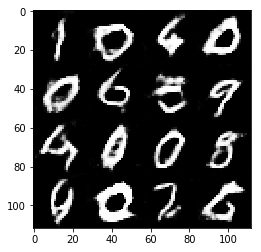

Timestamp 20170804-00-46-39.067 -  Epoch 1/2 -  Step 3510 -  D Loss: 1.1638 - G Loss: 1.1209
Timestamp 20170804-00-46-45.304 -  Epoch 1/2 -  Step 3520 -  D Loss: 1.1825 - G Loss: 1.4219
Timestamp 20170804-00-46-51.547 -  Epoch 1/2 -  Step 3530 -  D Loss: 1.0159 - G Loss: 0.9375
Timestamp 20170804-00-46-57.739 -  Epoch 1/2 -  Step 3540 -  D Loss: 0.9267 - G Loss: 0.6883
Timestamp 20170804-00-47-03.934 -  Epoch 1/2 -  Step 3550 -  D Loss: 0.7999 - G Loss: 1.5164
Timestamp 20170804-00-47-10.121 -  Epoch 1/2 -  Step 3560 -  D Loss: 0.8038 - G Loss: 1.6445
Timestamp 20170804-00-47-16.272 -  Epoch 1/2 -  Step 3570 -  D Loss: 0.6256 - G Loss: 1.6180
Timestamp 20170804-00-47-22.520 -  Epoch 1/2 -  Step 3580 -  D Loss: 0.5380 - G Loss: 2.1944
Timestamp 20170804-00-47-28.665 -  Epoch 1/2 -  Step 3590 -  D Loss: 1.3029 - G Loss: 1.1915
Timestamp 20170804-00-47-34.924 -  Epoch 1/2 -  Step 3600 -  D Loss: 1.3700 - G Loss: 0.7722


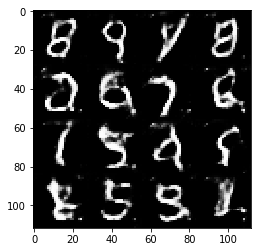

Timestamp 20170804-00-47-41.850 -  Epoch 1/2 -  Step 3610 -  D Loss: 0.7049 - G Loss: 1.6859
Timestamp 20170804-00-47-47.973 -  Epoch 1/2 -  Step 3620 -  D Loss: 0.8794 - G Loss: 2.7793
Timestamp 20170804-00-47-54.248 -  Epoch 1/2 -  Step 3630 -  D Loss: 0.6809 - G Loss: 1.5739
Timestamp 20170804-00-48-00.469 -  Epoch 1/2 -  Step 3640 -  D Loss: 0.9595 - G Loss: 0.9012
Timestamp 20170804-00-48-06.772 -  Epoch 1/2 -  Step 3650 -  D Loss: 0.9146 - G Loss: 0.9198
Timestamp 20170804-00-48-13.046 -  Epoch 1/2 -  Step 3660 -  D Loss: 1.2380 - G Loss: 0.6597
Timestamp 20170804-00-48-19.247 -  Epoch 1/2 -  Step 3670 -  D Loss: 1.2806 - G Loss: 1.1743
Timestamp 20170804-00-48-25.439 -  Epoch 1/2 -  Step 3680 -  D Loss: 1.2443 - G Loss: 1.1165
Timestamp 20170804-00-48-31.627 -  Epoch 1/2 -  Step 3690 -  D Loss: 1.1862 - G Loss: 0.9612
Timestamp 20170804-00-48-37.790 -  Epoch 1/2 -  Step 3700 -  D Loss: 0.7386 - G Loss: 1.1224


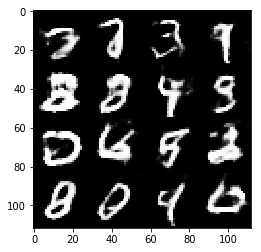

Timestamp 20170804-00-48-44.541 -  Epoch 1/2 -  Step 3710 -  D Loss: 0.8411 - G Loss: 0.8942
Timestamp 20170804-00-48-50.767 -  Epoch 1/2 -  Step 3720 -  D Loss: 1.0942 - G Loss: 1.4348
Timestamp 20170804-00-48-56.929 -  Epoch 1/2 -  Step 3730 -  D Loss: 1.0027 - G Loss: 1.0362
Timestamp 20170804-00-49-03.151 -  Epoch 1/2 -  Step 3740 -  D Loss: 0.9282 - G Loss: 1.0039
Timestamp 20170804-00-49-09.303 -  Epoch 1/2 -  Step 3750 -  D Loss: 0.9284 - G Loss: 1.3380
Timestamp 20170804-00-49-15.467 -  Epoch 1/2 -  Step 3760 -  D Loss: 1.2256 - G Loss: 1.5531
Timestamp 20170804-00-49-21.612 -  Epoch 1/2 -  Step 3770 -  D Loss: 0.7805 - G Loss: 3.0881
Timestamp 20170804-00-49-27.771 -  Epoch 1/2 -  Step 3780 -  D Loss: 0.9890 - G Loss: 1.7163
Timestamp 20170804-00-49-33.997 -  Epoch 1/2 -  Step 3790 -  D Loss: 1.2502 - G Loss: 1.2657
Timestamp 20170804-00-49-40.221 -  Epoch 1/2 -  Step 3800 -  D Loss: 0.7320 - G Loss: 1.8541


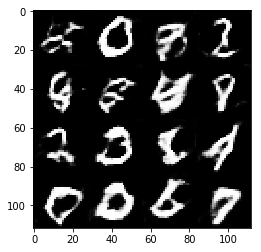

Timestamp 20170804-00-49-47.117 -  Epoch 1/2 -  Step 3810 -  D Loss: 0.7695 - G Loss: 0.9122
Timestamp 20170804-00-49-53.279 -  Epoch 1/2 -  Step 3820 -  D Loss: 0.9758 - G Loss: 1.8241
Timestamp 20170804-00-49-59.467 -  Epoch 1/2 -  Step 3830 -  D Loss: 0.9427 - G Loss: 1.5864
Timestamp 20170804-00-50-05.703 -  Epoch 1/2 -  Step 3840 -  D Loss: 1.0667 - G Loss: 1.2121
Timestamp 20170804-00-50-11.952 -  Epoch 1/2 -  Step 3850 -  D Loss: 0.7722 - G Loss: 2.1234
Timestamp 20170804-00-50-18.548 -  Epoch 1/2 -  Step 3860 -  D Loss: 0.7785 - G Loss: 2.3519
Timestamp 20170804-00-50-24.919 -  Epoch 1/2 -  Step 3870 -  D Loss: 1.0762 - G Loss: 1.3589
Timestamp 20170804-00-50-31.168 -  Epoch 1/2 -  Step 3880 -  D Loss: 0.7272 - G Loss: 1.2232
Timestamp 20170804-00-50-37.474 -  Epoch 1/2 -  Step 3890 -  D Loss: 0.8375 - G Loss: 1.2799
Timestamp 20170804-00-50-43.857 -  Epoch 1/2 -  Step 3900 -  D Loss: 0.7817 - G Loss: 1.6147


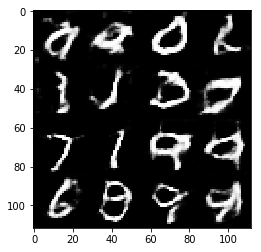

Timestamp 20170804-00-50-50.798 -  Epoch 1/2 -  Step 3910 -  D Loss: 1.0177 - G Loss: 1.5931
Timestamp 20170804-00-50-57.132 -  Epoch 1/2 -  Step 3920 -  D Loss: 0.8297 - G Loss: 1.4954
Timestamp 20170804-00-51-03.465 -  Epoch 1/2 -  Step 3930 -  D Loss: 0.9816 - G Loss: 1.6960
Timestamp 20170804-00-51-09.809 -  Epoch 1/2 -  Step 3940 -  D Loss: 1.1190 - G Loss: 1.0057
Timestamp 20170804-00-51-16.181 -  Epoch 1/2 -  Step 3950 -  D Loss: 0.6908 - G Loss: 1.0750
Timestamp 20170804-00-51-22.522 -  Epoch 1/2 -  Step 3960 -  D Loss: 1.3006 - G Loss: 0.6913
Timestamp 20170804-00-51-28.880 -  Epoch 1/2 -  Step 3970 -  D Loss: 1.1190 - G Loss: 0.9070
Timestamp 20170804-00-51-35.314 -  Epoch 1/2 -  Step 3980 -  D Loss: 0.6868 - G Loss: 1.3877
Timestamp 20170804-00-51-41.667 -  Epoch 1/2 -  Step 3990 -  D Loss: 1.0240 - G Loss: 1.5356
Timestamp 20170804-00-51-48.029 -  Epoch 1/2 -  Step 4000 -  D Loss: 0.9052 - G Loss: 1.2072


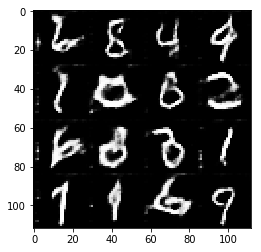

Timestamp 20170804-00-51-55.122 -  Epoch 1/2 -  Step 4010 -  D Loss: 0.7786 - G Loss: 1.6823
Timestamp 20170804-00-52-01.375 -  Epoch 1/2 -  Step 4020 -  D Loss: 1.0067 - G Loss: 1.0450
Timestamp 20170804-00-52-07.624 -  Epoch 1/2 -  Step 4030 -  D Loss: 0.9138 - G Loss: 1.1413
Timestamp 20170804-00-52-13.920 -  Epoch 1/2 -  Step 4040 -  D Loss: 1.1918 - G Loss: 1.6105
Timestamp 20170804-00-52-20.168 -  Epoch 1/2 -  Step 4050 -  D Loss: 0.8365 - G Loss: 1.7786
Timestamp 20170804-00-52-26.412 -  Epoch 1/2 -  Step 4060 -  D Loss: 0.8488 - G Loss: 1.0883
Timestamp 20170804-00-52-32.595 -  Epoch 1/2 -  Step 4070 -  D Loss: 1.0207 - G Loss: 1.4583
Timestamp 20170804-00-52-38.898 -  Epoch 1/2 -  Step 4080 -  D Loss: 0.5897 - G Loss: 1.9539
Timestamp 20170804-00-52-45.245 -  Epoch 1/2 -  Step 4090 -  D Loss: 0.8700 - G Loss: 1.5301
Timestamp 20170804-00-52-51.543 -  Epoch 1/2 -  Step 4100 -  D Loss: 1.1722 - G Loss: 1.5353


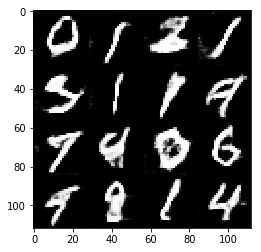

Timestamp 20170804-00-52-58.283 -  Epoch 1/2 -  Step 4110 -  D Loss: 0.6840 - G Loss: 1.0925
Timestamp 20170804-00-53-04.620 -  Epoch 1/2 -  Step 4120 -  D Loss: 1.1261 - G Loss: 0.9287
Timestamp 20170804-00-53-10.979 -  Epoch 1/2 -  Step 4130 -  D Loss: 1.0605 - G Loss: 1.2373
Timestamp 20170804-00-53-17.452 -  Epoch 1/2 -  Step 4140 -  D Loss: 0.9428 - G Loss: 1.3351
Timestamp 20170804-00-53-23.820 -  Epoch 1/2 -  Step 4150 -  D Loss: 0.7113 - G Loss: 1.8506
Timestamp 20170804-00-53-30.096 -  Epoch 1/2 -  Step 4160 -  D Loss: 1.3742 - G Loss: 0.4962
Timestamp 20170804-00-53-36.449 -  Epoch 1/2 -  Step 4170 -  D Loss: 0.7170 - G Loss: 1.8844
Timestamp 20170804-00-53-42.745 -  Epoch 1/2 -  Step 4180 -  D Loss: 0.9668 - G Loss: 1.0855
Timestamp 20170804-00-53-49.054 -  Epoch 1/2 -  Step 4190 -  D Loss: 0.8475 - G Loss: 1.3436
Timestamp 20170804-00-53-55.463 -  Epoch 1/2 -  Step 4200 -  D Loss: 1.0412 - G Loss: 1.3503


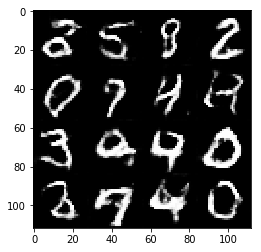

Timestamp 20170804-00-54-02.340 -  Epoch 1/2 -  Step 4210 -  D Loss: 0.8599 - G Loss: 1.1990
Timestamp 20170804-00-54-08.683 -  Epoch 1/2 -  Step 4220 -  D Loss: 1.0688 - G Loss: 1.1251
Timestamp 20170804-00-54-15.014 -  Epoch 1/2 -  Step 4230 -  D Loss: 0.9029 - G Loss: 1.6294
Timestamp 20170804-00-54-21.360 -  Epoch 1/2 -  Step 4240 -  D Loss: 0.9002 - G Loss: 1.7751
Timestamp 20170804-00-54-27.632 -  Epoch 1/2 -  Step 4250 -  D Loss: 0.8221 - G Loss: 1.6218
Timestamp 20170804-00-54-34.034 -  Epoch 1/2 -  Step 4260 -  D Loss: 0.8547 - G Loss: 0.7673
Timestamp 20170804-00-54-40.399 -  Epoch 1/2 -  Step 4270 -  D Loss: 0.9938 - G Loss: 1.6105
Timestamp 20170804-00-54-46.650 -  Epoch 1/2 -  Step 4280 -  D Loss: 1.0627 - G Loss: 2.2150
Timestamp 20170804-00-54-52.989 -  Epoch 1/2 -  Step 4290 -  D Loss: 0.7519 - G Loss: 1.4580
Timestamp 20170804-00-54-59.296 -  Epoch 1/2 -  Step 4300 -  D Loss: 0.8459 - G Loss: 1.4259


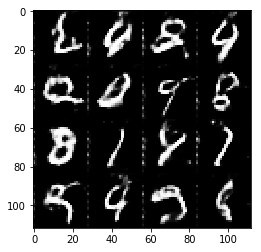

Timestamp 20170804-00-55-06.302 -  Epoch 1/2 -  Step 4310 -  D Loss: 0.9227 - G Loss: 1.0252
Timestamp 20170804-00-55-12.605 -  Epoch 1/2 -  Step 4320 -  D Loss: 1.4580 - G Loss: 0.6382
Timestamp 20170804-00-55-18.980 -  Epoch 1/2 -  Step 4330 -  D Loss: 0.7543 - G Loss: 1.4532
Timestamp 20170804-00-55-25.263 -  Epoch 1/2 -  Step 4340 -  D Loss: 0.5909 - G Loss: 1.7883
Timestamp 20170804-00-55-31.627 -  Epoch 1/2 -  Step 4350 -  D Loss: 0.7436 - G Loss: 1.5279
Timestamp 20170804-00-55-38.161 -  Epoch 1/2 -  Step 4360 -  D Loss: 0.8236 - G Loss: 1.3214
Timestamp 20170804-00-55-44.448 -  Epoch 1/2 -  Step 4370 -  D Loss: 0.8486 - G Loss: 1.2794
Timestamp 20170804-00-55-50.743 -  Epoch 1/2 -  Step 4380 -  D Loss: 0.7515 - G Loss: 1.7166
Timestamp 20170804-00-55-57.052 -  Epoch 1/2 -  Step 4390 -  D Loss: 0.9657 - G Loss: 1.9539
Timestamp 20170804-00-56-03.397 -  Epoch 1/2 -  Step 4400 -  D Loss: 0.8191 - G Loss: 1.6728


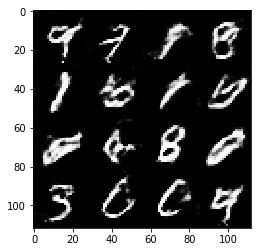

Timestamp 20170804-00-56-10.371 -  Epoch 1/2 -  Step 4410 -  D Loss: 0.9108 - G Loss: 1.5999
Timestamp 20170804-00-56-16.673 -  Epoch 1/2 -  Step 4420 -  D Loss: 0.7570 - G Loss: 1.1228
Timestamp 20170804-00-56-22.962 -  Epoch 1/2 -  Step 4430 -  D Loss: 0.6421 - G Loss: 1.9243
Timestamp 20170804-00-56-29.505 -  Epoch 1/2 -  Step 4440 -  D Loss: 0.8394 - G Loss: 1.2358
Timestamp 20170804-00-56-35.756 -  Epoch 1/2 -  Step 4450 -  D Loss: 0.6721 - G Loss: 1.6330
Timestamp 20170804-00-56-42.052 -  Epoch 1/2 -  Step 4460 -  D Loss: 1.1485 - G Loss: 0.8549
Timestamp 20170804-00-56-48.268 -  Epoch 1/2 -  Step 4470 -  D Loss: 0.8635 - G Loss: 1.8869
Timestamp 20170804-00-56-54.571 -  Epoch 1/2 -  Step 4480 -  D Loss: 0.6822 - G Loss: 1.2994
Timestamp 20170804-00-57-00.847 -  Epoch 1/2 -  Step 4490 -  D Loss: 0.6275 - G Loss: 1.6673
Timestamp 20170804-00-57-07.197 -  Epoch 1/2 -  Step 4500 -  D Loss: 0.8061 - G Loss: 1.8332


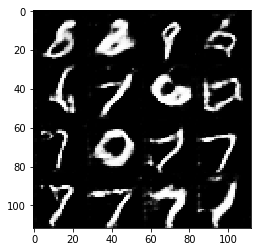

Timestamp 20170804-00-57-14.159 -  Epoch 1/2 -  Step 4510 -  D Loss: 1.2174 - G Loss: 2.7887
Timestamp 20170804-00-57-20.491 -  Epoch 1/2 -  Step 4520 -  D Loss: 1.1311 - G Loss: 1.1797
Timestamp 20170804-00-57-26.845 -  Epoch 1/2 -  Step 4530 -  D Loss: 0.5432 - G Loss: 2.3384
Timestamp 20170804-00-57-33.272 -  Epoch 1/2 -  Step 4540 -  D Loss: 1.0665 - G Loss: 1.4353
Timestamp 20170804-00-57-39.695 -  Epoch 1/2 -  Step 4550 -  D Loss: 0.9151 - G Loss: 1.4285
Timestamp 20170804-00-57-45.983 -  Epoch 1/2 -  Step 4560 -  D Loss: 0.8202 - G Loss: 1.4703
Timestamp 20170804-00-57-52.181 -  Epoch 1/2 -  Step 4570 -  D Loss: 0.9151 - G Loss: 1.1784
Timestamp 20170804-00-57-58.409 -  Epoch 1/2 -  Step 4580 -  D Loss: 0.7734 - G Loss: 1.4821
Timestamp 20170804-00-58-04.621 -  Epoch 1/2 -  Step 4590 -  D Loss: 0.6963 - G Loss: 1.6702
Timestamp 20170804-00-58-10.808 -  Epoch 1/2 -  Step 4600 -  D Loss: 0.9517 - G Loss: 1.1500


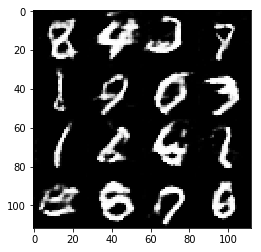

Timestamp 20170804-00-58-17.535 -  Epoch 1/2 -  Step 4610 -  D Loss: 0.7169 - G Loss: 1.3251
Timestamp 20170804-00-58-23.790 -  Epoch 1/2 -  Step 4620 -  D Loss: 0.6997 - G Loss: 1.3908
Timestamp 20170804-00-58-29.926 -  Epoch 1/2 -  Step 4630 -  D Loss: 1.1840 - G Loss: 1.1094
Timestamp 20170804-00-58-36.096 -  Epoch 1/2 -  Step 4640 -  D Loss: 0.8328 - G Loss: 1.7931
Timestamp 20170804-00-58-42.296 -  Epoch 1/2 -  Step 4650 -  D Loss: 1.6354 - G Loss: 1.0250
Timestamp 20170804-00-58-48.510 -  Epoch 1/2 -  Step 4660 -  D Loss: 1.0979 - G Loss: 1.8670
Timestamp 20170804-00-58-54.746 -  Epoch 1/2 -  Step 4670 -  D Loss: 1.1271 - G Loss: 1.5246
Timestamp 20170804-00-59-00.896 -  Epoch 1/2 -  Step 4680 -  D Loss: 0.8656 - G Loss: 1.5538
Timestamp 20170804-00-59-07.054 -  Epoch 1/2 -  Step 4690 -  D Loss: 0.7937 - G Loss: 1.8978
Timestamp 20170804-00-59-13.301 -  Epoch 1/2 -  Step 4700 -  D Loss: 0.9503 - G Loss: 1.4994


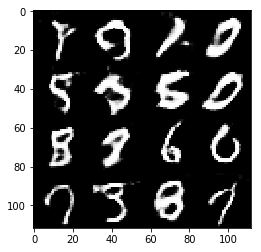

Timestamp 20170804-00-59-20.063 -  Epoch 1/2 -  Step 4710 -  D Loss: 0.9919 - G Loss: 1.2598
Timestamp 20170804-00-59-26.233 -  Epoch 1/2 -  Step 4720 -  D Loss: 0.7556 - G Loss: 1.0307
Timestamp 20170804-00-59-32.384 -  Epoch 1/2 -  Step 4730 -  D Loss: 0.8331 - G Loss: 1.4265
Timestamp 20170804-00-59-38.645 -  Epoch 1/2 -  Step 4740 -  D Loss: 1.0511 - G Loss: 1.8785
Timestamp 20170804-00-59-44.797 -  Epoch 1/2 -  Step 4750 -  D Loss: 0.8594 - G Loss: 2.0884
Timestamp 20170804-00-59-51.067 -  Epoch 1/2 -  Step 4760 -  D Loss: 0.7041 - G Loss: 2.1229
Timestamp 20170804-00-59-57.262 -  Epoch 1/2 -  Step 4770 -  D Loss: 0.9807 - G Loss: 2.0947
Timestamp 20170804-01-00-03.403 -  Epoch 1/2 -  Step 4780 -  D Loss: 0.8146 - G Loss: 1.8052
Timestamp 20170804-01-00-09.718 -  Epoch 1/2 -  Step 4790 -  D Loss: 0.6309 - G Loss: 1.9119
Timestamp 20170804-01-00-15.861 -  Epoch 1/2 -  Step 4800 -  D Loss: 1.4387 - G Loss: 1.5483


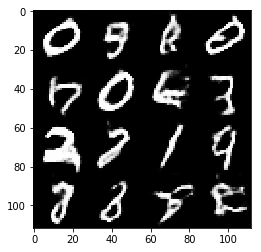

Timestamp 20170804-01-00-22.612 -  Epoch 1/2 -  Step 4810 -  D Loss: 0.9935 - G Loss: 0.9623
Timestamp 20170804-01-00-28.823 -  Epoch 1/2 -  Step 4820 -  D Loss: 0.8346 - G Loss: 1.2281
Timestamp 20170804-01-00-34.988 -  Epoch 1/2 -  Step 4830 -  D Loss: 0.6511 - G Loss: 1.4360
Timestamp 20170804-01-00-41.221 -  Epoch 1/2 -  Step 4840 -  D Loss: 0.8156 - G Loss: 1.7748
Timestamp 20170804-01-00-47.517 -  Epoch 1/2 -  Step 4850 -  D Loss: 1.7823 - G Loss: 0.2760
Timestamp 20170804-01-00-53.766 -  Epoch 1/2 -  Step 4860 -  D Loss: 0.9848 - G Loss: 1.7939
Timestamp 20170804-01-01-00.014 -  Epoch 1/2 -  Step 4870 -  D Loss: 0.9189 - G Loss: 1.4501
Timestamp 20170804-01-01-06.236 -  Epoch 1/2 -  Step 4880 -  D Loss: 1.2356 - G Loss: 1.1001
Timestamp 20170804-01-01-12.481 -  Epoch 1/2 -  Step 4890 -  D Loss: 1.3485 - G Loss: 1.5962
Timestamp 20170804-01-01-18.830 -  Epoch 1/2 -  Step 4900 -  D Loss: 0.8194 - G Loss: 1.7173


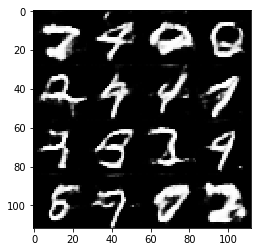

Timestamp 20170804-01-01-25.964 -  Epoch 1/2 -  Step 4910 -  D Loss: 0.9918 - G Loss: 1.1491
Timestamp 20170804-01-01-32.294 -  Epoch 1/2 -  Step 4920 -  D Loss: 0.7630 - G Loss: 1.3396
Timestamp 20170804-01-01-38.614 -  Epoch 1/2 -  Step 4930 -  D Loss: 0.9398 - G Loss: 1.3608
Timestamp 20170804-01-01-44.918 -  Epoch 1/2 -  Step 4940 -  D Loss: 1.0068 - G Loss: 0.5568
Timestamp 20170804-01-01-51.275 -  Epoch 1/2 -  Step 4950 -  D Loss: 1.1233 - G Loss: 1.1601
Timestamp 20170804-01-01-57.515 -  Epoch 1/2 -  Step 4960 -  D Loss: 0.9144 - G Loss: 1.3826
Timestamp 20170804-01-02-03.797 -  Epoch 1/2 -  Step 4970 -  D Loss: 1.2697 - G Loss: 0.9641
Timestamp 20170804-01-02-10.248 -  Epoch 1/2 -  Step 4980 -  D Loss: 0.5464 - G Loss: 1.7217
Timestamp 20170804-01-02-16.523 -  Epoch 1/2 -  Step 4990 -  D Loss: 1.1628 - G Loss: 1.3312
Timestamp 20170804-01-02-22.758 -  Epoch 1/2 -  Step 5000 -  D Loss: 0.8709 - G Loss: 2.5318


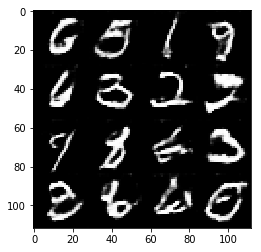

Timestamp 20170804-01-02-29.786 -  Epoch 1/2 -  Step 5010 -  D Loss: 1.1733 - G Loss: 1.7770
Timestamp 20170804-01-02-36.063 -  Epoch 1/2 -  Step 5020 -  D Loss: 0.6991 - G Loss: 1.9355
Timestamp 20170804-01-02-42.273 -  Epoch 1/2 -  Step 5030 -  D Loss: 0.9703 - G Loss: 1.7846
Timestamp 20170804-01-02-48.643 -  Epoch 1/2 -  Step 5040 -  D Loss: 0.8177 - G Loss: 1.0556
Timestamp 20170804-01-02-55.144 -  Epoch 1/2 -  Step 5050 -  D Loss: 0.9294 - G Loss: 1.0752
Timestamp 20170804-01-03-01.436 -  Epoch 1/2 -  Step 5060 -  D Loss: 1.5029 - G Loss: 0.9740
Timestamp 20170804-01-03-07.855 -  Epoch 1/2 -  Step 5070 -  D Loss: 0.8819 - G Loss: 1.7779
Timestamp 20170804-01-03-14.239 -  Epoch 1/2 -  Step 5080 -  D Loss: 0.7703 - G Loss: 1.8847
Timestamp 20170804-01-03-20.775 -  Epoch 1/2 -  Step 5090 -  D Loss: 0.7357 - G Loss: 1.8195
Timestamp 20170804-01-03-27.181 -  Epoch 1/2 -  Step 5100 -  D Loss: 1.0817 - G Loss: 1.5788


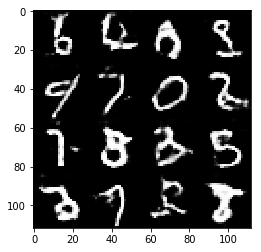

Timestamp 20170804-01-03-34.099 -  Epoch 1/2 -  Step 5110 -  D Loss: 0.9455 - G Loss: 1.5848
Timestamp 20170804-01-03-40.583 -  Epoch 1/2 -  Step 5120 -  D Loss: 0.6203 - G Loss: 2.4139
Timestamp 20170804-01-03-47.021 -  Epoch 1/2 -  Step 5130 -  D Loss: 0.6870 - G Loss: 1.1594
Timestamp 20170804-01-03-53.371 -  Epoch 1/2 -  Step 5140 -  D Loss: 0.9975 - G Loss: 1.0901
Timestamp 20170804-01-03-59.564 -  Epoch 1/2 -  Step 5150 -  D Loss: 0.5483 - G Loss: 2.1296
Timestamp 20170804-01-04-05.864 -  Epoch 1/2 -  Step 5160 -  D Loss: 1.1759 - G Loss: 1.3746
Timestamp 20170804-01-04-12.106 -  Epoch 1/2 -  Step 5170 -  D Loss: 1.0798 - G Loss: 1.3837
Timestamp 20170804-01-04-18.402 -  Epoch 1/2 -  Step 5180 -  D Loss: 1.4259 - G Loss: 1.1415
Timestamp 20170804-01-04-24.642 -  Epoch 1/2 -  Step 5190 -  D Loss: 1.0935 - G Loss: 1.2514
Timestamp 20170804-01-04-30.940 -  Epoch 1/2 -  Step 5200 -  D Loss: 0.8891 - G Loss: 2.2334


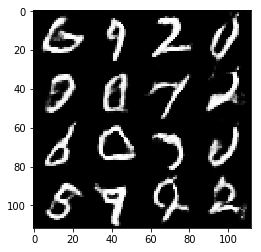

Timestamp 20170804-01-04-37.818 -  Epoch 1/2 -  Step 5210 -  D Loss: 0.5311 - G Loss: 2.8451
Timestamp 20170804-01-04-44.162 -  Epoch 1/2 -  Step 5220 -  D Loss: 1.0717 - G Loss: 1.6339
Timestamp 20170804-01-04-50.548 -  Epoch 1/2 -  Step 5230 -  D Loss: 1.1164 - G Loss: 0.9075
Timestamp 20170804-01-04-56.951 -  Epoch 1/2 -  Step 5240 -  D Loss: 0.8849 - G Loss: 1.3903
Timestamp 20170804-01-05-03.442 -  Epoch 1/2 -  Step 5250 -  D Loss: 0.7260 - G Loss: 1.5777
Timestamp 20170804-01-05-09.740 -  Epoch 1/2 -  Step 5260 -  D Loss: 0.7292 - G Loss: 2.9210
Timestamp 20170804-01-05-15.988 -  Epoch 1/2 -  Step 5270 -  D Loss: 0.8301 - G Loss: 2.0767
Timestamp 20170804-01-05-22.390 -  Epoch 1/2 -  Step 5280 -  D Loss: 1.6772 - G Loss: 0.7623
Timestamp 20170804-01-05-28.695 -  Epoch 1/2 -  Step 5290 -  D Loss: 1.0183 - G Loss: 1.4165
Timestamp 20170804-01-05-35.183 -  Epoch 1/2 -  Step 5300 -  D Loss: 1.0736 - G Loss: 1.5225


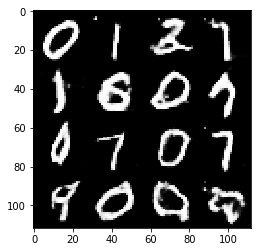

Timestamp 20170804-01-05-42.175 -  Epoch 1/2 -  Step 5310 -  D Loss: 0.9512 - G Loss: 1.1940
Timestamp 20170804-01-05-48.520 -  Epoch 1/2 -  Step 5320 -  D Loss: 1.0166 - G Loss: 1.0274
Timestamp 20170804-01-05-54.799 -  Epoch 1/2 -  Step 5330 -  D Loss: 0.9226 - G Loss: 1.1699
Timestamp 20170804-01-06-01.209 -  Epoch 1/2 -  Step 5340 -  D Loss: 0.5463 - G Loss: 2.0197
Timestamp 20170804-01-06-07.559 -  Epoch 1/2 -  Step 5350 -  D Loss: 0.9173 - G Loss: 1.8358
Timestamp 20170804-01-06-13.942 -  Epoch 1/2 -  Step 5360 -  D Loss: 1.0921 - G Loss: 0.6461
Timestamp 20170804-01-06-20.231 -  Epoch 1/2 -  Step 5370 -  D Loss: 0.6044 - G Loss: 1.5173
Timestamp 20170804-01-06-26.559 -  Epoch 1/2 -  Step 5380 -  D Loss: 0.8477 - G Loss: 1.7025
Timestamp 20170804-01-06-33.078 -  Epoch 1/2 -  Step 5390 -  D Loss: 0.9896 - G Loss: 1.0647
Timestamp 20170804-01-06-39.460 -  Epoch 1/2 -  Step 5400 -  D Loss: 1.0912 - G Loss: 1.5935


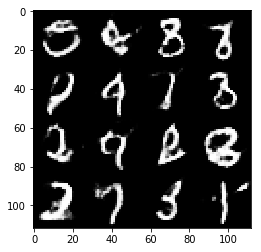

Timestamp 20170804-01-06-46.395 -  Epoch 1/2 -  Step 5410 -  D Loss: 0.4718 - G Loss: 2.4442
Timestamp 20170804-01-06-52.708 -  Epoch 1/2 -  Step 5420 -  D Loss: 0.9641 - G Loss: 1.2930
Timestamp 20170804-01-06-59.162 -  Epoch 1/2 -  Step 5430 -  D Loss: 1.0600 - G Loss: 0.8599
Timestamp 20170804-01-07-05.526 -  Epoch 1/2 -  Step 5440 -  D Loss: 0.7731 - G Loss: 1.4018
Timestamp 20170804-01-07-11.822 -  Epoch 1/2 -  Step 5450 -  D Loss: 0.9421 - G Loss: 1.5787
Timestamp 20170804-01-07-18.150 -  Epoch 1/2 -  Step 5460 -  D Loss: 1.2460 - G Loss: 2.5355
Timestamp 20170804-01-07-24.404 -  Epoch 1/2 -  Step 5470 -  D Loss: 0.6882 - G Loss: 2.5356
Timestamp 20170804-01-07-30.764 -  Epoch 1/2 -  Step 5480 -  D Loss: 1.1712 - G Loss: 0.6484
Timestamp 20170804-01-07-37.049 -  Epoch 1/2 -  Step 5490 -  D Loss: 0.8869 - G Loss: 1.8631
Timestamp 20170804-01-07-43.361 -  Epoch 1/2 -  Step 5500 -  D Loss: 0.9697 - G Loss: 2.2104


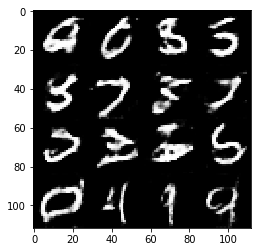

Timestamp 20170804-01-07-50.360 -  Epoch 1/2 -  Step 5510 -  D Loss: 0.8076 - G Loss: 2.1541
Timestamp 20170804-01-07-56.787 -  Epoch 1/2 -  Step 5520 -  D Loss: 0.8369 - G Loss: 2.0549
Timestamp 20170804-01-08-03.169 -  Epoch 1/2 -  Step 5530 -  D Loss: 0.8066 - G Loss: 1.3980
Timestamp 20170804-01-08-09.487 -  Epoch 1/2 -  Step 5540 -  D Loss: 0.5543 - G Loss: 2.6716
Timestamp 20170804-01-08-15.827 -  Epoch 1/2 -  Step 5550 -  D Loss: 0.8279 - G Loss: 1.1704
Timestamp 20170804-01-08-22.075 -  Epoch 1/2 -  Step 5560 -  D Loss: 0.6633 - G Loss: 1.6838
Timestamp 20170804-01-08-28.427 -  Epoch 1/2 -  Step 5570 -  D Loss: 1.9547 - G Loss: 0.7108
Timestamp 20170804-01-08-34.646 -  Epoch 1/2 -  Step 5580 -  D Loss: 0.8897 - G Loss: 2.3011
Timestamp 20170804-01-08-40.867 -  Epoch 1/2 -  Step 5590 -  D Loss: 0.9571 - G Loss: 1.8834
Timestamp 20170804-01-08-47.157 -  Epoch 1/2 -  Step 5600 -  D Loss: 0.8105 - G Loss: 0.9974


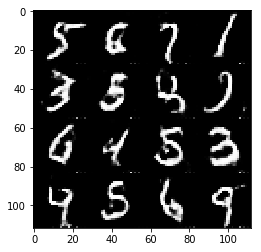

Timestamp 20170804-01-08-54.288 -  Epoch 1/2 -  Step 5610 -  D Loss: 0.9607 - G Loss: 1.6942
Timestamp 20170804-01-09-00.574 -  Epoch 1/2 -  Step 5620 -  D Loss: 0.7113 - G Loss: 1.3122
Timestamp 20170804-01-09-06.855 -  Epoch 1/2 -  Step 5630 -  D Loss: 0.8184 - G Loss: 1.4796
Timestamp 20170804-01-09-13.218 -  Epoch 1/2 -  Step 5640 -  D Loss: 0.4313 - G Loss: 2.1209
Timestamp 20170804-01-09-19.766 -  Epoch 1/2 -  Step 5650 -  D Loss: 0.8272 - G Loss: 1.5419
Timestamp 20170804-01-09-26.131 -  Epoch 1/2 -  Step 5660 -  D Loss: 1.0520 - G Loss: 2.1237
Timestamp 20170804-01-09-32.372 -  Epoch 1/2 -  Step 5670 -  D Loss: 1.0026 - G Loss: 0.7512
Timestamp 20170804-01-09-38.728 -  Epoch 1/2 -  Step 5680 -  D Loss: 1.5567 - G Loss: 0.8232
Timestamp 20170804-01-09-45.123 -  Epoch 1/2 -  Step 5690 -  D Loss: 1.4179 - G Loss: 1.6408
Timestamp 20170804-01-09-51.434 -  Epoch 1/2 -  Step 5700 -  D Loss: 0.6798 - G Loss: 1.5867


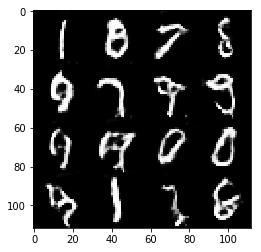

Timestamp 20170804-01-09-58.332 -  Epoch 1/2 -  Step 5710 -  D Loss: 0.6910 - G Loss: 1.5644
Timestamp 20170804-01-10-04.626 -  Epoch 1/2 -  Step 5720 -  D Loss: 0.7749 - G Loss: 1.3695
Timestamp 20170804-01-10-10.882 -  Epoch 1/2 -  Step 5730 -  D Loss: 0.4896 - G Loss: 3.2087
Timestamp 20170804-01-10-17.174 -  Epoch 1/2 -  Step 5740 -  D Loss: 1.1950 - G Loss: 1.1855
Timestamp 20170804-01-10-23.473 -  Epoch 1/2 -  Step 5750 -  D Loss: 0.9161 - G Loss: 0.7809
Timestamp 20170804-01-10-29.940 -  Epoch 1/2 -  Step 5760 -  D Loss: 0.6880 - G Loss: 1.2110
Timestamp 20170804-01-10-36.274 -  Epoch 1/2 -  Step 5770 -  D Loss: 0.5892 - G Loss: 2.1059
Timestamp 20170804-01-10-42.566 -  Epoch 1/2 -  Step 5780 -  D Loss: 0.7273 - G Loss: 3.1839
Timestamp 20170804-01-10-48.910 -  Epoch 1/2 -  Step 5790 -  D Loss: 0.8206 - G Loss: 1.3703
Timestamp 20170804-01-10-55.240 -  Epoch 1/2 -  Step 5800 -  D Loss: 0.6848 - G Loss: 2.3027


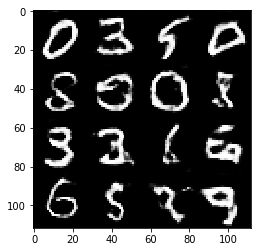

Timestamp 20170804-01-11-02.181 -  Epoch 1/2 -  Step 5810 -  D Loss: 0.6135 - G Loss: 1.5159
Timestamp 20170804-01-11-08.472 -  Epoch 1/2 -  Step 5820 -  D Loss: 0.7144 - G Loss: 1.3855
Timestamp 20170804-01-11-14.756 -  Epoch 1/2 -  Step 5830 -  D Loss: 0.7767 - G Loss: 1.3845
Timestamp 20170804-01-11-21.109 -  Epoch 1/2 -  Step 5840 -  D Loss: 0.6640 - G Loss: 1.8516
Timestamp 20170804-01-11-27.321 -  Epoch 1/2 -  Step 5850 -  D Loss: 0.9930 - G Loss: 2.5330
Timestamp 20170804-01-11-33.745 -  Epoch 1/2 -  Step 5860 -  D Loss: 0.9189 - G Loss: 1.2135
Timestamp 20170804-01-11-39.969 -  Epoch 1/2 -  Step 5870 -  D Loss: 1.0119 - G Loss: 1.5490
Timestamp 20170804-01-11-46.332 -  Epoch 1/2 -  Step 5880 -  D Loss: 1.0932 - G Loss: 1.7123
Timestamp 20170804-01-11-52.547 -  Epoch 1/2 -  Step 5890 -  D Loss: 0.9629 - G Loss: 0.8582
Timestamp 20170804-01-11-58.858 -  Epoch 1/2 -  Step 5900 -  D Loss: 0.8668 - G Loss: 1.7640


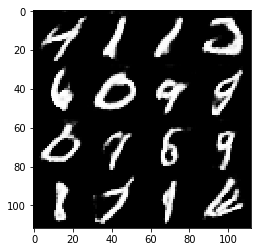

Timestamp 20170804-01-12-05.757 -  Epoch 1/2 -  Step 5910 -  D Loss: 0.6804 - G Loss: 2.3479
Timestamp 20170804-01-12-12.118 -  Epoch 1/2 -  Step 5920 -  D Loss: 1.1127 - G Loss: 1.5587
Timestamp 20170804-01-12-18.552 -  Epoch 1/2 -  Step 5930 -  D Loss: 1.0305 - G Loss: 1.6785
Timestamp 20170804-01-12-24.695 -  Epoch 1/2 -  Step 5940 -  D Loss: 0.6180 - G Loss: 1.2544
Timestamp 20170804-01-12-31.084 -  Epoch 1/2 -  Step 5950 -  D Loss: 0.8766 - G Loss: 1.4555
Timestamp 20170804-01-12-37.505 -  Epoch 1/2 -  Step 5960 -  D Loss: 1.3979 - G Loss: 1.5633
Timestamp 20170804-01-12-43.823 -  Epoch 1/2 -  Step 5970 -  D Loss: 1.1906 - G Loss: 0.6774
Timestamp 20170804-01-12-50.194 -  Epoch 1/2 -  Step 5980 -  D Loss: 0.8643 - G Loss: 1.8185
Timestamp 20170804-01-12-56.469 -  Epoch 1/2 -  Step 5990 -  D Loss: 1.3685 - G Loss: 1.7009
Timestamp 20170804-01-13-02.796 -  Epoch 1/2 -  Step 6000 -  D Loss: 0.9658 - G Loss: 1.2637


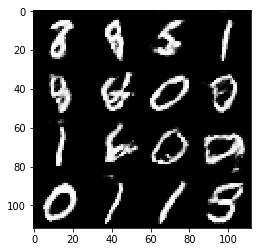

Timestamp 20170804-01-13-11.468 -  Epoch 1/2 -  Step 6010 -  D Loss: 0.6968 - G Loss: 1.2998
Timestamp 20170804-01-13-17.756 -  Epoch 1/2 -  Step 6020 -  D Loss: 0.7114 - G Loss: 1.7651
Timestamp 20170804-01-13-23.986 -  Epoch 1/2 -  Step 6030 -  D Loss: 0.6807 - G Loss: 2.2299
Timestamp 20170804-01-13-30.286 -  Epoch 1/2 -  Step 6040 -  D Loss: 1.0192 - G Loss: 1.6979
Timestamp 20170804-01-13-36.589 -  Epoch 1/2 -  Step 6050 -  D Loss: 0.6862 - G Loss: 1.1964
Timestamp 20170804-01-13-42.886 -  Epoch 1/2 -  Step 6060 -  D Loss: 0.6250 - G Loss: 1.4339
Timestamp 20170804-01-13-49.184 -  Epoch 1/2 -  Step 6070 -  D Loss: 0.7748 - G Loss: 1.2488
Timestamp 20170804-01-13-55.402 -  Epoch 1/2 -  Step 6080 -  D Loss: 0.6260 - G Loss: 1.3443
Timestamp 20170804-01-14-01.863 -  Epoch 1/2 -  Step 6090 -  D Loss: 0.6061 - G Loss: 2.1052
Timestamp 20170804-01-14-08.101 -  Epoch 1/2 -  Step 6100 -  D Loss: 1.0349 - G Loss: 1.7294


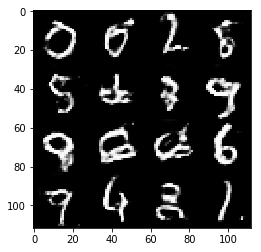

Timestamp 20170804-01-14-15.025 -  Epoch 1/2 -  Step 6110 -  D Loss: 0.5078 - G Loss: 2.3067
Timestamp 20170804-01-14-21.358 -  Epoch 1/2 -  Step 6120 -  D Loss: 0.9075 - G Loss: 2.4708
Timestamp 20170804-01-14-27.751 -  Epoch 1/2 -  Step 6130 -  D Loss: 0.9421 - G Loss: 1.8758
Timestamp 20170804-01-14-34.044 -  Epoch 1/2 -  Step 6140 -  D Loss: 0.8752 - G Loss: 1.7106
Timestamp 20170804-01-14-40.346 -  Epoch 1/2 -  Step 6150 -  D Loss: 0.5312 - G Loss: 1.9276
Timestamp 20170804-01-14-46.587 -  Epoch 1/2 -  Step 6160 -  D Loss: 0.7651 - G Loss: 1.5872
Timestamp 20170804-01-14-52.979 -  Epoch 1/2 -  Step 6170 -  D Loss: 0.8680 - G Loss: 2.1376
Timestamp 20170804-01-14-59.319 -  Epoch 1/2 -  Step 6180 -  D Loss: 0.7002 - G Loss: 1.8343
Timestamp 20170804-01-15-05.723 -  Epoch 1/2 -  Step 6190 -  D Loss: 1.0723 - G Loss: 1.4745
Timestamp 20170804-01-15-12.063 -  Epoch 1/2 -  Step 6200 -  D Loss: 0.9678 - G Loss: 1.4806


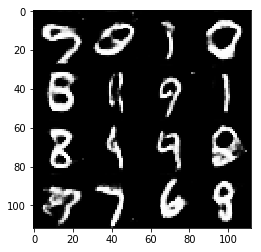

Timestamp 20170804-01-15-18.973 -  Epoch 1/2 -  Step 6210 -  D Loss: 0.9073 - G Loss: 1.6882
Timestamp 20170804-01-15-25.213 -  Epoch 1/2 -  Step 6220 -  D Loss: 0.7227 - G Loss: 1.2445
Timestamp 20170804-01-15-31.466 -  Epoch 1/2 -  Step 6230 -  D Loss: 0.8437 - G Loss: 2.2703
Timestamp 20170804-01-15-37.795 -  Epoch 1/2 -  Step 6240 -  D Loss: 1.4493 - G Loss: 0.9380
Timestamp 20170804-01-15-44.025 -  Epoch 1/2 -  Step 6250 -  D Loss: 0.7796 - G Loss: 1.5063
Timestamp 20170804-01-15-50.424 -  Epoch 1/2 -  Step 6260 -  D Loss: 0.9376 - G Loss: 1.2250
Timestamp 20170804-01-15-56.936 -  Epoch 1/2 -  Step 6270 -  D Loss: 0.6138 - G Loss: 1.6399
Timestamp 20170804-01-16-03.285 -  Epoch 1/2 -  Step 6280 -  D Loss: 1.0910 - G Loss: 1.3807
Timestamp 20170804-01-16-09.633 -  Epoch 1/2 -  Step 6290 -  D Loss: 0.6567 - G Loss: 1.7499
Timestamp 20170804-01-16-15.912 -  Epoch 1/2 -  Step 6300 -  D Loss: 1.1990 - G Loss: 1.2812


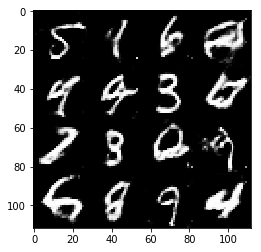

Timestamp 20170804-01-16-22.780 -  Epoch 1/2 -  Step 6310 -  D Loss: 0.8648 - G Loss: 1.4136
Timestamp 20170804-01-16-29.102 -  Epoch 1/2 -  Step 6320 -  D Loss: 1.2508 - G Loss: 1.4505
Timestamp 20170804-01-16-35.537 -  Epoch 1/2 -  Step 6330 -  D Loss: 0.6939 - G Loss: 1.4674
Timestamp 20170804-01-16-41.855 -  Epoch 1/2 -  Step 6340 -  D Loss: 0.9221 - G Loss: 1.4318
Timestamp 20170804-01-16-48.249 -  Epoch 1/2 -  Step 6350 -  D Loss: 0.6628 - G Loss: 1.8455
Timestamp 20170804-01-16-54.532 -  Epoch 1/2 -  Step 6360 -  D Loss: 0.7659 - G Loss: 1.6148
Timestamp 20170804-01-17-00.800 -  Epoch 1/2 -  Step 6370 -  D Loss: 0.6724 - G Loss: 2.0520
Timestamp 20170804-01-17-07.107 -  Epoch 1/2 -  Step 6380 -  D Loss: 0.4854 - G Loss: 2.4458
Timestamp 20170804-01-17-13.490 -  Epoch 1/2 -  Step 6390 -  D Loss: 1.0254 - G Loss: 1.7025
Timestamp 20170804-01-17-19.818 -  Epoch 1/2 -  Step 6400 -  D Loss: 0.8984 - G Loss: 1.7968


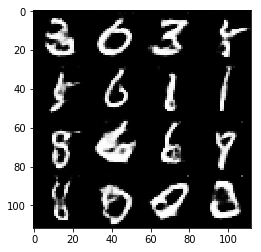

Timestamp 20170804-01-17-26.884 -  Epoch 1/2 -  Step 6410 -  D Loss: 0.9015 - G Loss: 1.8433
Timestamp 20170804-01-17-33.174 -  Epoch 1/2 -  Step 6420 -  D Loss: 1.0558 - G Loss: 1.6239
Timestamp 20170804-01-17-39.540 -  Epoch 1/2 -  Step 6430 -  D Loss: 0.8188 - G Loss: 1.5474
Timestamp 20170804-01-17-45.933 -  Epoch 1/2 -  Step 6440 -  D Loss: 0.7908 - G Loss: 1.2882
Timestamp 20170804-01-17-52.138 -  Epoch 1/2 -  Step 6450 -  D Loss: 0.9357 - G Loss: 1.9414
Timestamp 20170804-01-17-58.534 -  Epoch 1/2 -  Step 6460 -  D Loss: 0.7788 - G Loss: 1.3375
Timestamp 20170804-01-18-04.977 -  Epoch 1/2 -  Step 6470 -  D Loss: 0.7844 - G Loss: 1.3951
Timestamp 20170804-01-18-11.336 -  Epoch 1/2 -  Step 6480 -  D Loss: 0.6281 - G Loss: 2.3502
Timestamp 20170804-01-18-17.698 -  Epoch 1/2 -  Step 6490 -  D Loss: 0.7929 - G Loss: 0.9173
Timestamp 20170804-01-18-24.101 -  Epoch 1/2 -  Step 6500 -  D Loss: 1.4883 - G Loss: 1.0802


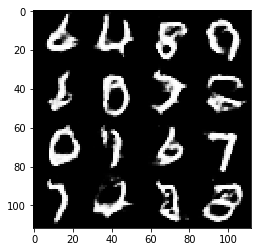

Timestamp 20170804-01-18-31.274 -  Epoch 1/2 -  Step 6510 -  D Loss: 1.1114 - G Loss: 1.4242
Timestamp 20170804-01-18-37.602 -  Epoch 1/2 -  Step 6520 -  D Loss: 0.9447 - G Loss: 2.0629
Timestamp 20170804-01-18-43.931 -  Epoch 1/2 -  Step 6530 -  D Loss: 0.7165 - G Loss: 1.1045
Timestamp 20170804-01-18-50.159 -  Epoch 1/2 -  Step 6540 -  D Loss: 0.4728 - G Loss: 2.0722
Timestamp 20170804-01-18-56.392 -  Epoch 1/2 -  Step 6550 -  D Loss: 0.7953 - G Loss: 1.5489
Timestamp 20170804-01-19-02.830 -  Epoch 1/2 -  Step 6560 -  D Loss: 0.5215 - G Loss: 2.8192
Timestamp 20170804-01-19-09.165 -  Epoch 1/2 -  Step 6570 -  D Loss: 1.0736 - G Loss: 1.2213
Timestamp 20170804-01-19-15.585 -  Epoch 1/2 -  Step 6580 -  D Loss: 0.8261 - G Loss: 1.4341
Timestamp 20170804-01-19-21.958 -  Epoch 1/2 -  Step 6590 -  D Loss: 1.3876 - G Loss: 0.7520
Timestamp 20170804-01-19-28.301 -  Epoch 1/2 -  Step 6600 -  D Loss: 0.6949 - G Loss: 2.1850


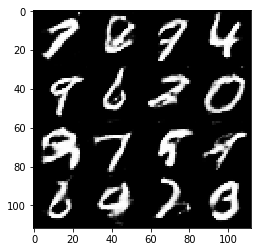

Timestamp 20170804-01-19-35.322 -  Epoch 1/2 -  Step 6610 -  D Loss: 0.8178 - G Loss: 3.3834
Timestamp 20170804-01-19-41.600 -  Epoch 1/2 -  Step 6620 -  D Loss: 0.7656 - G Loss: 1.9209
Timestamp 20170804-01-19-47.867 -  Epoch 1/2 -  Step 6630 -  D Loss: 0.7018 - G Loss: 1.4412
Timestamp 20170804-01-19-54.230 -  Epoch 1/2 -  Step 6640 -  D Loss: 0.6514 - G Loss: 1.9993
Timestamp 20170804-01-20-00.561 -  Epoch 1/2 -  Step 6650 -  D Loss: 0.8190 - G Loss: 1.6103
Timestamp 20170804-01-20-06.827 -  Epoch 1/2 -  Step 6660 -  D Loss: 0.6733 - G Loss: 2.1414
Timestamp 20170804-01-20-13.138 -  Epoch 1/2 -  Step 6670 -  D Loss: 0.9146 - G Loss: 1.4026
Timestamp 20170804-01-20-19.395 -  Epoch 1/2 -  Step 6680 -  D Loss: 0.9562 - G Loss: 0.9613
Timestamp 20170804-01-20-25.756 -  Epoch 1/2 -  Step 6690 -  D Loss: 0.9279 - G Loss: 1.7171
Timestamp 20170804-01-20-32.209 -  Epoch 1/2 -  Step 6700 -  D Loss: 0.4974 - G Loss: 2.2617


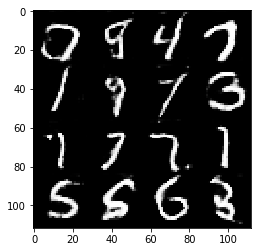

Timestamp 20170804-01-20-39.246 -  Epoch 1/2 -  Step 6710 -  D Loss: 0.5707 - G Loss: 1.1692
Timestamp 20170804-01-20-45.585 -  Epoch 1/2 -  Step 6720 -  D Loss: 0.7637 - G Loss: 1.7359
Timestamp 20170804-01-20-51.944 -  Epoch 1/2 -  Step 6730 -  D Loss: 0.8428 - G Loss: 1.5657
Timestamp 20170804-01-20-58.320 -  Epoch 1/2 -  Step 6740 -  D Loss: 0.7035 - G Loss: 2.8909
Timestamp 20170804-01-21-04.740 -  Epoch 1/2 -  Step 6750 -  D Loss: 0.9661 - G Loss: 1.4635
Timestamp 20170804-01-21-11.040 -  Epoch 1/2 -  Step 6760 -  D Loss: 0.9796 - G Loss: 2.1968
Timestamp 20170804-01-21-17.236 -  Epoch 1/2 -  Step 6770 -  D Loss: 0.6735 - G Loss: 1.8112
Timestamp 20170804-01-21-23.562 -  Epoch 1/2 -  Step 6780 -  D Loss: 0.9465 - G Loss: 0.9541
Timestamp 20170804-01-21-29.978 -  Epoch 1/2 -  Step 6790 -  D Loss: 0.4414 - G Loss: 2.4305
Timestamp 20170804-01-21-36.295 -  Epoch 1/2 -  Step 6800 -  D Loss: 0.7242 - G Loss: 2.1844


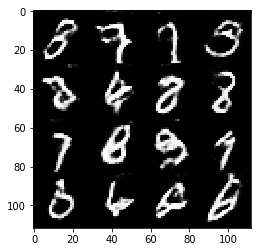

Timestamp 20170804-01-21-43.172 -  Epoch 1/2 -  Step 6810 -  D Loss: 0.5620 - G Loss: 1.9505
Timestamp 20170804-01-21-49.565 -  Epoch 1/2 -  Step 6820 -  D Loss: 0.8435 - G Loss: 1.6646
Timestamp 20170804-01-21-55.836 -  Epoch 1/2 -  Step 6830 -  D Loss: 0.8727 - G Loss: 2.5139
Timestamp 20170804-01-22-01.957 -  Epoch 1/2 -  Step 6840 -  D Loss: 0.7398 - G Loss: 1.0842
Timestamp 20170804-01-22-08.235 -  Epoch 1/2 -  Step 6850 -  D Loss: 0.7668 - G Loss: 1.7615
Timestamp 20170804-01-22-14.583 -  Epoch 1/2 -  Step 6860 -  D Loss: 1.1301 - G Loss: 0.7405
Timestamp 20170804-01-22-20.824 -  Epoch 1/2 -  Step 6870 -  D Loss: 0.5964 - G Loss: 2.1505
Timestamp 20170804-01-22-26.954 -  Epoch 1/2 -  Step 6880 -  D Loss: 0.7226 - G Loss: 1.9528
Timestamp 20170804-01-22-33.177 -  Epoch 1/2 -  Step 6890 -  D Loss: 0.7853 - G Loss: 1.2348
Timestamp 20170804-01-22-39.407 -  Epoch 1/2 -  Step 6900 -  D Loss: 0.7768 - G Loss: 1.5902


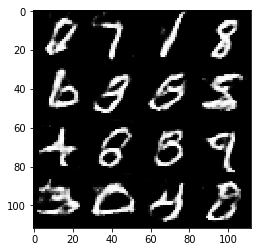

Timestamp 20170804-01-22-46.348 -  Epoch 1/2 -  Step 6910 -  D Loss: 0.7163 - G Loss: 0.8177
Timestamp 20170804-01-22-52.599 -  Epoch 1/2 -  Step 6920 -  D Loss: 0.8160 - G Loss: 2.2163
Timestamp 20170804-01-22-58.842 -  Epoch 1/2 -  Step 6930 -  D Loss: 0.5310 - G Loss: 2.5867
Timestamp 20170804-01-23-05.088 -  Epoch 1/2 -  Step 6940 -  D Loss: 0.5448 - G Loss: 2.3034
Timestamp 20170804-01-23-11.331 -  Epoch 1/2 -  Step 6950 -  D Loss: 1.1790 - G Loss: 1.9130
Timestamp 20170804-01-23-17.470 -  Epoch 1/2 -  Step 6960 -  D Loss: 1.1757 - G Loss: 1.5313
Timestamp 20170804-01-23-23.642 -  Epoch 1/2 -  Step 6970 -  D Loss: 0.6711 - G Loss: 2.7335
Timestamp 20170804-01-23-29.814 -  Epoch 1/2 -  Step 6980 -  D Loss: 0.7552 - G Loss: 2.2985
Timestamp 20170804-01-23-36.001 -  Epoch 1/2 -  Step 6990 -  D Loss: 0.6247 - G Loss: 1.3940
Timestamp 20170804-01-23-42.232 -  Epoch 1/2 -  Step 7000 -  D Loss: 1.0300 - G Loss: 1.1219


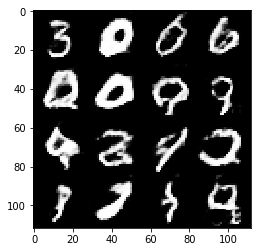

Timestamp 20170804-01-23-49.050 -  Epoch 1/2 -  Step 7010 -  D Loss: 0.7641 - G Loss: 1.9050
Timestamp 20170804-01-23-55.298 -  Epoch 1/2 -  Step 7020 -  D Loss: 0.6427 - G Loss: 3.2975
Timestamp 20170804-01-24-01.520 -  Epoch 1/2 -  Step 7030 -  D Loss: 1.2437 - G Loss: 0.9113
Timestamp 20170804-01-24-07.689 -  Epoch 1/2 -  Step 7040 -  D Loss: 0.8735 - G Loss: 2.0396
Timestamp 20170804-01-24-14.016 -  Epoch 1/2 -  Step 7050 -  D Loss: 1.0319 - G Loss: 1.4054
Timestamp 20170804-01-24-20.151 -  Epoch 1/2 -  Step 7060 -  D Loss: 1.5256 - G Loss: 1.0094
Timestamp 20170804-01-24-26.286 -  Epoch 1/2 -  Step 7070 -  D Loss: 0.7801 - G Loss: 1.3314
Timestamp 20170804-01-24-32.448 -  Epoch 1/2 -  Step 7080 -  D Loss: 0.8671 - G Loss: 0.6981
Timestamp 20170804-01-24-38.628 -  Epoch 1/2 -  Step 7090 -  D Loss: 0.6817 - G Loss: 1.0437
Timestamp 20170804-01-24-44.864 -  Epoch 1/2 -  Step 7100 -  D Loss: 0.9085 - G Loss: 1.5697


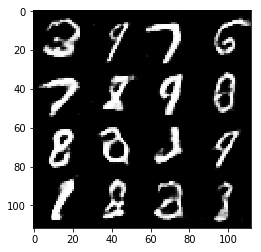

Timestamp 20170804-01-24-51.654 -  Epoch 1/2 -  Step 7110 -  D Loss: 0.9868 - G Loss: 0.9967
Timestamp 20170804-01-24-57.809 -  Epoch 1/2 -  Step 7120 -  D Loss: 0.7947 - G Loss: 1.1185
Timestamp 20170804-01-25-04.272 -  Epoch 1/2 -  Step 7130 -  D Loss: 0.5417 - G Loss: 1.9861
Timestamp 20170804-01-25-10.428 -  Epoch 1/2 -  Step 7140 -  D Loss: 1.5721 - G Loss: 0.8713
Timestamp 20170804-01-25-16.677 -  Epoch 1/2 -  Step 7150 -  D Loss: 0.7570 - G Loss: 1.9512
Timestamp 20170804-01-25-22.874 -  Epoch 1/2 -  Step 7160 -  D Loss: 1.0796 - G Loss: 1.1585
Timestamp 20170804-01-25-29.032 -  Epoch 1/2 -  Step 7170 -  D Loss: 0.5936 - G Loss: 1.5646
Timestamp 20170804-01-25-35.169 -  Epoch 1/2 -  Step 7180 -  D Loss: 1.0263 - G Loss: 1.2786
Timestamp 20170804-01-25-41.416 -  Epoch 1/2 -  Step 7190 -  D Loss: 0.8902 - G Loss: 2.2269
Timestamp 20170804-01-25-47.706 -  Epoch 1/2 -  Step 7200 -  D Loss: 0.7530 - G Loss: 2.1985


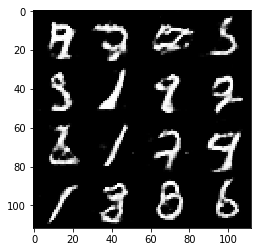

Timestamp 20170804-01-25-54.565 -  Epoch 1/2 -  Step 7210 -  D Loss: 0.8512 - G Loss: 2.0579
Timestamp 20170804-01-26-00.805 -  Epoch 1/2 -  Step 7220 -  D Loss: 0.9696 - G Loss: 1.5284
Timestamp 20170804-01-26-06.976 -  Epoch 1/2 -  Step 7230 -  D Loss: 0.6779 - G Loss: 1.8133
Timestamp 20170804-01-26-13.289 -  Epoch 1/2 -  Step 7240 -  D Loss: 0.6272 - G Loss: 2.2399
Timestamp 20170804-01-26-19.523 -  Epoch 1/2 -  Step 7250 -  D Loss: 1.0841 - G Loss: 2.0336
Timestamp 20170804-01-26-25.788 -  Epoch 1/2 -  Step 7260 -  D Loss: 1.0212 - G Loss: 1.4535
Timestamp 20170804-01-26-31.934 -  Epoch 1/2 -  Step 7270 -  D Loss: 0.7630 - G Loss: 1.4213
Timestamp 20170804-01-26-38.077 -  Epoch 1/2 -  Step 7280 -  D Loss: 0.5186 - G Loss: 2.7666
Timestamp 20170804-01-26-44.264 -  Epoch 1/2 -  Step 7290 -  D Loss: 0.7527 - G Loss: 2.1852
Timestamp 20170804-01-26-50.464 -  Epoch 1/2 -  Step 7300 -  D Loss: 1.0407 - G Loss: 1.7429


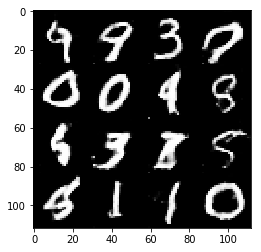

Timestamp 20170804-01-26-57.381 -  Epoch 1/2 -  Step 7310 -  D Loss: 0.6997 - G Loss: 0.8370
Timestamp 20170804-01-27-03.644 -  Epoch 1/2 -  Step 7320 -  D Loss: 1.1220 - G Loss: 1.0130
Timestamp 20170804-01-27-09.842 -  Epoch 1/2 -  Step 7330 -  D Loss: 1.1717 - G Loss: 1.7717
Timestamp 20170804-01-27-15.979 -  Epoch 1/2 -  Step 7340 -  D Loss: 0.8874 - G Loss: 1.6474
Timestamp 20170804-01-27-22.193 -  Epoch 1/2 -  Step 7350 -  D Loss: 0.7157 - G Loss: 1.5410
Timestamp 20170804-01-27-28.339 -  Epoch 1/2 -  Step 7360 -  D Loss: 0.9690 - G Loss: 2.2377
Timestamp 20170804-01-27-34.556 -  Epoch 1/2 -  Step 7370 -  D Loss: 0.5597 - G Loss: 2.6074
Timestamp 20170804-01-27-40.696 -  Epoch 1/2 -  Step 7380 -  D Loss: 1.0758 - G Loss: 1.2636
Timestamp 20170804-01-27-47.147 -  Epoch 1/2 -  Step 7390 -  D Loss: 0.6087 - G Loss: 1.3939
Timestamp 20170804-01-27-53.311 -  Epoch 1/2 -  Step 7400 -  D Loss: 0.7751 - G Loss: 1.5018


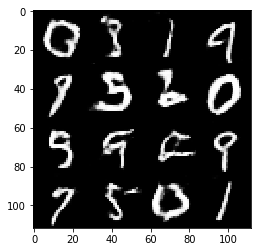

Timestamp 20170804-01-28-00.264 -  Epoch 1/2 -  Step 7410 -  D Loss: 0.8913 - G Loss: 1.4332
Timestamp 20170804-01-28-06.430 -  Epoch 1/2 -  Step 7420 -  D Loss: 1.1581 - G Loss: 1.0064
Timestamp 20170804-01-28-12.625 -  Epoch 1/2 -  Step 7430 -  D Loss: 0.7112 - G Loss: 1.3142
Timestamp 20170804-01-28-18.809 -  Epoch 1/2 -  Step 7440 -  D Loss: 0.5910 - G Loss: 2.0244
Timestamp 20170804-01-28-25.026 -  Epoch 1/2 -  Step 7450 -  D Loss: 0.8195 - G Loss: 1.2497
Timestamp 20170804-01-28-31.178 -  Epoch 1/2 -  Step 7460 -  D Loss: 0.6562 - G Loss: 1.3937
Timestamp 20170804-01-28-37.442 -  Epoch 1/2 -  Step 7470 -  D Loss: 0.7609 - G Loss: 1.0794
Timestamp 20170804-01-28-43.707 -  Epoch 1/2 -  Step 7480 -  D Loss: 0.6790 - G Loss: 2.1707
Timestamp 20170804-01-28-49.965 -  Epoch 1/2 -  Step 7490 -  D Loss: 1.0128 - G Loss: 1.1730
Timestamp 20170804-01-28-56.148 -  Epoch 1/2 -  Step 7500 -  D Loss: 0.4194 - G Loss: 3.3715


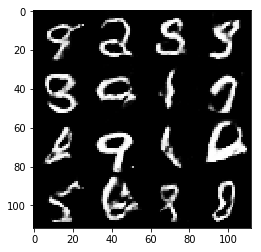

Timestamp 20170804-01-29-02.913 -  Epoch 2/2 -  Step 7510 -  D Loss: 0.7332 - G Loss: 3.6122
Timestamp 20170804-01-29-09.016 -  Epoch 2/2 -  Step 7520 -  D Loss: 0.8356 - G Loss: 1.7852
Timestamp 20170804-01-29-15.127 -  Epoch 2/2 -  Step 7530 -  D Loss: 1.3912 - G Loss: 0.8527
Timestamp 20170804-01-29-21.236 -  Epoch 2/2 -  Step 7540 -  D Loss: 0.9661 - G Loss: 1.1150
Timestamp 20170804-01-29-27.374 -  Epoch 2/2 -  Step 7550 -  D Loss: 0.6047 - G Loss: 2.4194
Timestamp 20170804-01-29-33.500 -  Epoch 2/2 -  Step 7560 -  D Loss: 1.3704 - G Loss: 0.8019
Timestamp 20170804-01-29-39.604 -  Epoch 2/2 -  Step 7570 -  D Loss: 0.9030 - G Loss: 1.1796
Timestamp 20170804-01-29-45.716 -  Epoch 2/2 -  Step 7580 -  D Loss: 0.6262 - G Loss: 1.4979
Timestamp 20170804-01-29-51.821 -  Epoch 2/2 -  Step 7590 -  D Loss: 0.7642 - G Loss: 1.4260
Timestamp 20170804-01-29-57.918 -  Epoch 2/2 -  Step 7600 -  D Loss: 0.6500 - G Loss: 1.9162


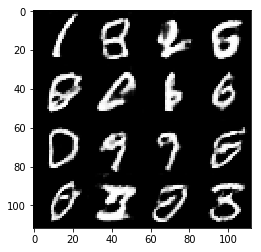

Timestamp 20170804-01-30-04.737 -  Epoch 2/2 -  Step 7610 -  D Loss: 0.8093 - G Loss: 2.5340
Timestamp 20170804-01-30-10.843 -  Epoch 2/2 -  Step 7620 -  D Loss: 0.9120 - G Loss: 2.9189
Timestamp 20170804-01-30-16.978 -  Epoch 2/2 -  Step 7630 -  D Loss: 1.2143 - G Loss: 0.9183
Timestamp 20170804-01-30-23.094 -  Epoch 2/2 -  Step 7640 -  D Loss: 0.6557 - G Loss: 1.8661
Timestamp 20170804-01-30-29.208 -  Epoch 2/2 -  Step 7650 -  D Loss: 0.5355 - G Loss: 1.9144
Timestamp 20170804-01-30-35.316 -  Epoch 2/2 -  Step 7660 -  D Loss: 0.8325 - G Loss: 1.1284
Timestamp 20170804-01-30-41.421 -  Epoch 2/2 -  Step 7670 -  D Loss: 1.2242 - G Loss: 1.5826
Timestamp 20170804-01-30-47.541 -  Epoch 2/2 -  Step 7680 -  D Loss: 0.5944 - G Loss: 3.2612
Timestamp 20170804-01-30-53.644 -  Epoch 2/2 -  Step 7690 -  D Loss: 0.7786 - G Loss: 2.2569
Timestamp 20170804-01-30-59.755 -  Epoch 2/2 -  Step 7700 -  D Loss: 0.8840 - G Loss: 2.1263


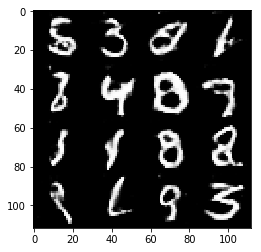

Timestamp 20170804-01-31-06.524 -  Epoch 2/2 -  Step 7710 -  D Loss: 0.9570 - G Loss: 1.5732
Timestamp 20170804-01-31-12.631 -  Epoch 2/2 -  Step 7720 -  D Loss: 0.8786 - G Loss: 2.4349
Timestamp 20170804-01-31-18.752 -  Epoch 2/2 -  Step 7730 -  D Loss: 0.8888 - G Loss: 1.5251
Timestamp 20170804-01-31-24.901 -  Epoch 2/2 -  Step 7740 -  D Loss: 1.1723 - G Loss: 0.8253
Timestamp 20170804-01-31-31.026 -  Epoch 2/2 -  Step 7750 -  D Loss: 0.6391 - G Loss: 1.5000
Timestamp 20170804-01-31-37.138 -  Epoch 2/2 -  Step 7760 -  D Loss: 0.8122 - G Loss: 1.9200
Timestamp 20170804-01-31-43.238 -  Epoch 2/2 -  Step 7770 -  D Loss: 0.9451 - G Loss: 0.6912
Timestamp 20170804-01-31-49.342 -  Epoch 2/2 -  Step 7780 -  D Loss: 0.6651 - G Loss: 2.6059
Timestamp 20170804-01-31-55.448 -  Epoch 2/2 -  Step 7790 -  D Loss: 0.9310 - G Loss: 2.1856
Timestamp 20170804-01-32-01.580 -  Epoch 2/2 -  Step 7800 -  D Loss: 0.7803 - G Loss: 1.8429


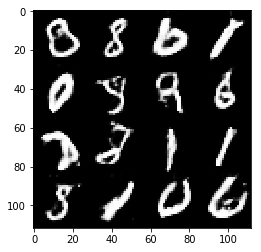

Timestamp 20170804-01-32-08.361 -  Epoch 2/2 -  Step 7810 -  D Loss: 0.8273 - G Loss: 1.9545
Timestamp 20170804-01-32-14.459 -  Epoch 2/2 -  Step 7820 -  D Loss: 0.7405 - G Loss: 1.8570
Timestamp 20170804-01-32-20.580 -  Epoch 2/2 -  Step 7830 -  D Loss: 1.1519 - G Loss: 1.2218
Timestamp 20170804-01-32-26.686 -  Epoch 2/2 -  Step 7840 -  D Loss: 0.8168 - G Loss: 1.1257
Timestamp 20170804-01-32-32.786 -  Epoch 2/2 -  Step 7850 -  D Loss: 0.9507 - G Loss: 1.4527
Timestamp 20170804-01-32-38.883 -  Epoch 2/2 -  Step 7860 -  D Loss: 0.8163 - G Loss: 2.0777
Timestamp 20170804-01-32-44.979 -  Epoch 2/2 -  Step 7870 -  D Loss: 0.7759 - G Loss: 2.1632
Timestamp 20170804-01-32-51.089 -  Epoch 2/2 -  Step 7880 -  D Loss: 0.8607 - G Loss: 2.4101
Timestamp 20170804-01-32-57.190 -  Epoch 2/2 -  Step 7890 -  D Loss: 0.7355 - G Loss: 2.4682
Timestamp 20170804-01-33-03.293 -  Epoch 2/2 -  Step 7900 -  D Loss: 0.6443 - G Loss: 1.9270


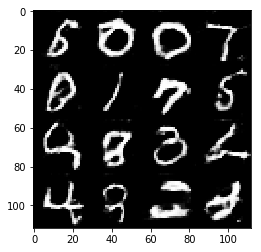

Timestamp 20170804-01-33-10.086 -  Epoch 2/2 -  Step 7910 -  D Loss: 1.2042 - G Loss: 1.5588
Timestamp 20170804-01-33-16.191 -  Epoch 2/2 -  Step 7920 -  D Loss: 0.6398 - G Loss: 3.0142
Timestamp 20170804-01-33-22.317 -  Epoch 2/2 -  Step 7930 -  D Loss: 0.7447 - G Loss: 2.1668
Timestamp 20170804-01-33-28.422 -  Epoch 2/2 -  Step 7940 -  D Loss: 0.4731 - G Loss: 3.1240
Timestamp 20170804-01-33-34.528 -  Epoch 2/2 -  Step 7950 -  D Loss: 0.6999 - G Loss: 2.4615
Timestamp 20170804-01-33-40.613 -  Epoch 2/2 -  Step 7960 -  D Loss: 0.5360 - G Loss: 1.8505
Timestamp 20170804-01-33-46.745 -  Epoch 2/2 -  Step 7970 -  D Loss: 1.7702 - G Loss: 1.0044
Timestamp 20170804-01-33-52.861 -  Epoch 2/2 -  Step 7980 -  D Loss: 1.0446 - G Loss: 0.6664
Timestamp 20170804-01-33-58.969 -  Epoch 2/2 -  Step 7990 -  D Loss: 0.5234 - G Loss: 1.3888
Timestamp 20170804-01-34-05.089 -  Epoch 2/2 -  Step 8000 -  D Loss: 1.4490 - G Loss: 0.9202


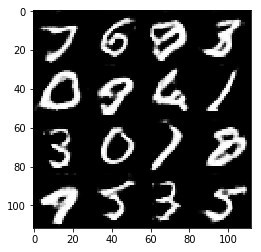

Timestamp 20170804-01-34-11.870 -  Epoch 2/2 -  Step 8010 -  D Loss: 0.8593 - G Loss: 1.7446
Timestamp 20170804-01-34-17.987 -  Epoch 2/2 -  Step 8020 -  D Loss: 0.9913 - G Loss: 2.0249
Timestamp 20170804-01-34-24.097 -  Epoch 2/2 -  Step 8030 -  D Loss: 0.6755 - G Loss: 3.4981
Timestamp 20170804-01-34-30.207 -  Epoch 2/2 -  Step 8040 -  D Loss: 0.7739 - G Loss: 1.8424
Timestamp 20170804-01-34-36.317 -  Epoch 2/2 -  Step 8050 -  D Loss: 0.9628 - G Loss: 2.5543
Timestamp 20170804-01-34-42.428 -  Epoch 2/2 -  Step 8060 -  D Loss: 1.0143 - G Loss: 0.8936
Timestamp 20170804-01-34-48.536 -  Epoch 2/2 -  Step 8070 -  D Loss: 0.6306 - G Loss: 1.1656
Timestamp 20170804-01-34-54.653 -  Epoch 2/2 -  Step 8080 -  D Loss: 0.7174 - G Loss: 1.2817
Timestamp 20170804-01-35-00.768 -  Epoch 2/2 -  Step 8090 -  D Loss: 0.7448 - G Loss: 2.5015
Timestamp 20170804-01-35-06.873 -  Epoch 2/2 -  Step 8100 -  D Loss: 0.9763 - G Loss: 0.8221


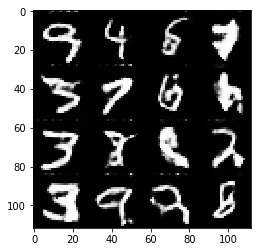

Timestamp 20170804-01-35-13.656 -  Epoch 2/2 -  Step 8110 -  D Loss: 0.9860 - G Loss: 2.0065
Timestamp 20170804-01-35-19.788 -  Epoch 2/2 -  Step 8120 -  D Loss: 0.5764 - G Loss: 2.8142
Timestamp 20170804-01-35-25.886 -  Epoch 2/2 -  Step 8130 -  D Loss: 0.9044 - G Loss: 1.2811
Timestamp 20170804-01-35-32.012 -  Epoch 2/2 -  Step 8140 -  D Loss: 0.7652 - G Loss: 2.7149
Timestamp 20170804-01-35-38.126 -  Epoch 2/2 -  Step 8150 -  D Loss: 0.8433 - G Loss: 2.9373
Timestamp 20170804-01-35-44.243 -  Epoch 2/2 -  Step 8160 -  D Loss: 0.4830 - G Loss: 2.5439
Timestamp 20170804-01-35-50.337 -  Epoch 2/2 -  Step 8170 -  D Loss: 0.8056 - G Loss: 2.3607
Timestamp 20170804-01-35-56.439 -  Epoch 2/2 -  Step 8180 -  D Loss: 1.0518 - G Loss: 1.9010
Timestamp 20170804-01-36-02.541 -  Epoch 2/2 -  Step 8190 -  D Loss: 0.4587 - G Loss: 2.6482
Timestamp 20170804-01-36-08.664 -  Epoch 2/2 -  Step 8200 -  D Loss: 0.7557 - G Loss: 2.8999


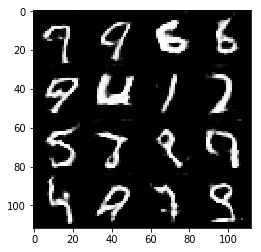

Timestamp 20170804-01-36-15.479 -  Epoch 2/2 -  Step 8210 -  D Loss: 1.1155 - G Loss: 1.2110
Timestamp 20170804-01-36-21.576 -  Epoch 2/2 -  Step 8220 -  D Loss: 0.7801 - G Loss: 1.8175
Timestamp 20170804-01-36-27.677 -  Epoch 2/2 -  Step 8230 -  D Loss: 1.1108 - G Loss: 1.8575
Timestamp 20170804-01-36-33.789 -  Epoch 2/2 -  Step 8240 -  D Loss: 0.6155 - G Loss: 1.4434
Timestamp 20170804-01-36-39.897 -  Epoch 2/2 -  Step 8250 -  D Loss: 0.7272 - G Loss: 2.8006
Timestamp 20170804-01-36-46.001 -  Epoch 2/2 -  Step 8260 -  D Loss: 0.6571 - G Loss: 1.9036
Timestamp 20170804-01-36-52.105 -  Epoch 2/2 -  Step 8270 -  D Loss: 0.6645 - G Loss: 2.1557
Timestamp 20170804-01-36-58.226 -  Epoch 2/2 -  Step 8280 -  D Loss: 0.5655 - G Loss: 2.6822
Timestamp 20170804-01-37-04.332 -  Epoch 2/2 -  Step 8290 -  D Loss: 0.7718 - G Loss: 1.4198
Timestamp 20170804-01-37-10.439 -  Epoch 2/2 -  Step 8300 -  D Loss: 0.6560 - G Loss: 2.8863


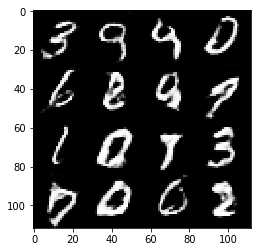

Timestamp 20170804-01-37-17.242 -  Epoch 2/2 -  Step 8310 -  D Loss: 0.4979 - G Loss: 4.6232
Timestamp 20170804-01-37-23.377 -  Epoch 2/2 -  Step 8320 -  D Loss: 0.9742 - G Loss: 0.7586
Timestamp 20170804-01-37-29.480 -  Epoch 2/2 -  Step 8330 -  D Loss: 0.9886 - G Loss: 1.8647
Timestamp 20170804-01-37-35.603 -  Epoch 2/2 -  Step 8340 -  D Loss: 1.0616 - G Loss: 2.0641
Timestamp 20170804-01-37-41.717 -  Epoch 2/2 -  Step 8350 -  D Loss: 0.7006 - G Loss: 2.4459
Timestamp 20170804-01-37-47.824 -  Epoch 2/2 -  Step 8360 -  D Loss: 0.7228 - G Loss: 1.8756
Timestamp 20170804-01-37-53.932 -  Epoch 2/2 -  Step 8370 -  D Loss: 0.5360 - G Loss: 3.4629
Timestamp 20170804-01-38-00.043 -  Epoch 2/2 -  Step 8380 -  D Loss: 0.8031 - G Loss: 1.7550
Timestamp 20170804-01-38-06.145 -  Epoch 2/2 -  Step 8390 -  D Loss: 0.8687 - G Loss: 1.4865
Timestamp 20170804-01-38-12.256 -  Epoch 2/2 -  Step 8400 -  D Loss: 0.9468 - G Loss: 1.8415


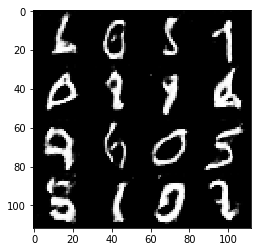

Timestamp 20170804-01-38-19.056 -  Epoch 2/2 -  Step 8410 -  D Loss: 0.7519 - G Loss: 2.6448
Timestamp 20170804-01-38-25.160 -  Epoch 2/2 -  Step 8420 -  D Loss: 0.8968 - G Loss: 1.5532
Timestamp 20170804-01-38-31.297 -  Epoch 2/2 -  Step 8430 -  D Loss: 0.6981 - G Loss: 2.7265
Timestamp 20170804-01-38-37.405 -  Epoch 2/2 -  Step 8440 -  D Loss: 0.7672 - G Loss: 1.0601
Timestamp 20170804-01-38-43.523 -  Epoch 2/2 -  Step 8450 -  D Loss: 0.5729 - G Loss: 2.0069
Timestamp 20170804-01-38-49.620 -  Epoch 2/2 -  Step 8460 -  D Loss: 1.2318 - G Loss: 0.4334
Timestamp 20170804-01-38-55.753 -  Epoch 2/2 -  Step 8470 -  D Loss: 0.8435 - G Loss: 1.6977
Timestamp 20170804-01-39-01.872 -  Epoch 2/2 -  Step 8480 -  D Loss: 1.4128 - G Loss: 1.2971
Timestamp 20170804-01-39-07.989 -  Epoch 2/2 -  Step 8490 -  D Loss: 0.5334 - G Loss: 2.0929
Timestamp 20170804-01-39-14.101 -  Epoch 2/2 -  Step 8500 -  D Loss: 0.5293 - G Loss: 2.8894


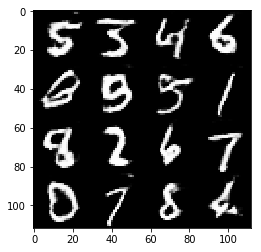

Timestamp 20170804-01-39-20.888 -  Epoch 2/2 -  Step 8510 -  D Loss: 0.5711 - G Loss: 3.0861
Timestamp 20170804-01-39-26.980 -  Epoch 2/2 -  Step 8520 -  D Loss: 0.5914 - G Loss: 1.4188
Timestamp 20170804-01-39-33.101 -  Epoch 2/2 -  Step 8530 -  D Loss: 1.7020 - G Loss: 1.0644
Timestamp 20170804-01-39-39.215 -  Epoch 2/2 -  Step 8540 -  D Loss: 0.8982 - G Loss: 1.0934
Timestamp 20170804-01-39-45.347 -  Epoch 2/2 -  Step 8550 -  D Loss: 0.5417 - G Loss: 1.8806
Timestamp 20170804-01-39-51.445 -  Epoch 2/2 -  Step 8560 -  D Loss: 1.0634 - G Loss: 1.4527
Timestamp 20170804-01-39-57.541 -  Epoch 2/2 -  Step 8570 -  D Loss: 0.7765 - G Loss: 2.1917
Timestamp 20170804-01-40-03.677 -  Epoch 2/2 -  Step 8580 -  D Loss: 0.4647 - G Loss: 3.6056
Timestamp 20170804-01-40-09.785 -  Epoch 2/2 -  Step 8590 -  D Loss: 0.7520 - G Loss: 2.3411
Timestamp 20170804-01-40-15.921 -  Epoch 2/2 -  Step 8600 -  D Loss: 1.3671 - G Loss: 1.1356


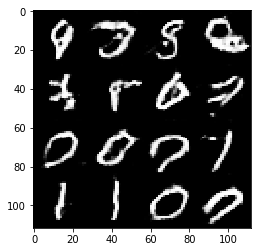

Timestamp 20170804-01-40-22.723 -  Epoch 2/2 -  Step 8610 -  D Loss: 0.8523 - G Loss: 1.9631
Timestamp 20170804-01-40-28.827 -  Epoch 2/2 -  Step 8620 -  D Loss: 0.6796 - G Loss: 2.2630
Timestamp 20170804-01-40-34.938 -  Epoch 2/2 -  Step 8630 -  D Loss: 1.2154 - G Loss: 0.9763
Timestamp 20170804-01-40-41.047 -  Epoch 2/2 -  Step 8640 -  D Loss: 0.9092 - G Loss: 2.1279
Timestamp 20170804-01-40-47.177 -  Epoch 2/2 -  Step 8650 -  D Loss: 0.4917 - G Loss: 2.3366
Timestamp 20170804-01-40-53.293 -  Epoch 2/2 -  Step 8660 -  D Loss: 0.9219 - G Loss: 2.2801
Timestamp 20170804-01-40-59.416 -  Epoch 2/2 -  Step 8670 -  D Loss: 0.7847 - G Loss: 1.4741
Timestamp 20170804-01-41-05.530 -  Epoch 2/2 -  Step 8680 -  D Loss: 0.6682 - G Loss: 1.8355
Timestamp 20170804-01-41-11.640 -  Epoch 2/2 -  Step 8690 -  D Loss: 0.9270 - G Loss: 2.8413
Timestamp 20170804-01-41-17.753 -  Epoch 2/2 -  Step 8700 -  D Loss: 0.4673 - G Loss: 2.0700


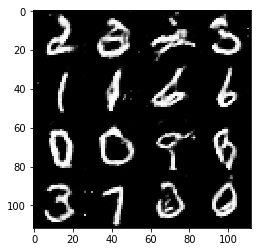

Timestamp 20170804-01-41-24.541 -  Epoch 2/2 -  Step 8710 -  D Loss: 0.9588 - G Loss: 1.9704
Timestamp 20170804-01-41-30.654 -  Epoch 2/2 -  Step 8720 -  D Loss: 0.7187 - G Loss: 2.0382
Timestamp 20170804-01-41-36.773 -  Epoch 2/2 -  Step 8730 -  D Loss: 0.6593 - G Loss: 2.8854
Timestamp 20170804-01-41-42.881 -  Epoch 2/2 -  Step 8740 -  D Loss: 1.1875 - G Loss: 0.9354
Timestamp 20170804-01-41-48.999 -  Epoch 2/2 -  Step 8750 -  D Loss: 0.5297 - G Loss: 1.8056
Timestamp 20170804-01-41-55.110 -  Epoch 2/2 -  Step 8760 -  D Loss: 0.6465 - G Loss: 3.8718
Timestamp 20170804-01-42-01.225 -  Epoch 2/2 -  Step 8770 -  D Loss: 0.6784 - G Loss: 1.4454
Timestamp 20170804-01-42-07.329 -  Epoch 2/2 -  Step 8780 -  D Loss: 1.0443 - G Loss: 1.7022
Timestamp 20170804-01-42-13.442 -  Epoch 2/2 -  Step 8790 -  D Loss: 0.9808 - G Loss: 1.4294
Timestamp 20170804-01-42-19.561 -  Epoch 2/2 -  Step 8800 -  D Loss: 0.8024 - G Loss: 1.1275


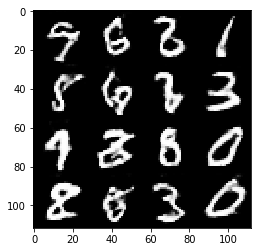

Timestamp 20170804-01-42-26.404 -  Epoch 2/2 -  Step 8810 -  D Loss: 0.7252 - G Loss: 2.1779
Timestamp 20170804-01-42-32.501 -  Epoch 2/2 -  Step 8820 -  D Loss: 0.7419 - G Loss: 1.5469
Timestamp 20170804-01-42-38.603 -  Epoch 2/2 -  Step 8830 -  D Loss: 0.9544 - G Loss: 1.6806
Timestamp 20170804-01-42-44.720 -  Epoch 2/2 -  Step 8840 -  D Loss: 0.6637 - G Loss: 1.5330
Timestamp 20170804-01-42-50.818 -  Epoch 2/2 -  Step 8850 -  D Loss: 0.6788 - G Loss: 1.6383
Timestamp 20170804-01-42-56.947 -  Epoch 2/2 -  Step 8860 -  D Loss: 1.1196 - G Loss: 1.8171
Timestamp 20170804-01-43-03.058 -  Epoch 2/2 -  Step 8870 -  D Loss: 0.9321 - G Loss: 1.3126
Timestamp 20170804-01-43-09.186 -  Epoch 2/2 -  Step 8880 -  D Loss: 0.6378 - G Loss: 2.5060
Timestamp 20170804-01-43-15.292 -  Epoch 2/2 -  Step 8890 -  D Loss: 0.8407 - G Loss: 2.1869
Timestamp 20170804-01-43-21.405 -  Epoch 2/2 -  Step 8900 -  D Loss: 0.5947 - G Loss: 2.5370


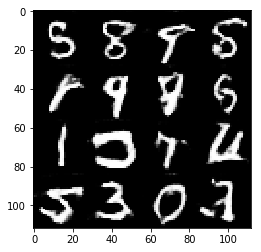

Timestamp 20170804-01-43-28.357 -  Epoch 2/2 -  Step 8910 -  D Loss: 0.6711 - G Loss: 1.5822
Timestamp 20170804-01-43-34.477 -  Epoch 2/2 -  Step 8920 -  D Loss: 0.5048 - G Loss: 1.8700
Timestamp 20170804-01-43-40.588 -  Epoch 2/2 -  Step 8930 -  D Loss: 0.6240 - G Loss: 2.1043
Timestamp 20170804-01-43-46.733 -  Epoch 2/2 -  Step 8940 -  D Loss: 1.0624 - G Loss: 1.6603
Timestamp 20170804-01-43-52.836 -  Epoch 2/2 -  Step 8950 -  D Loss: 0.4711 - G Loss: 2.9422
Timestamp 20170804-01-43-58.951 -  Epoch 2/2 -  Step 8960 -  D Loss: 0.8611 - G Loss: 1.3850
Timestamp 20170804-01-44-05.068 -  Epoch 2/2 -  Step 8970 -  D Loss: 0.4511 - G Loss: 2.6161
Timestamp 20170804-01-44-11.191 -  Epoch 2/2 -  Step 8980 -  D Loss: 0.8274 - G Loss: 2.7528
Timestamp 20170804-01-44-17.318 -  Epoch 2/2 -  Step 8990 -  D Loss: 0.9241 - G Loss: 0.9418
Timestamp 20170804-01-44-23.445 -  Epoch 2/2 -  Step 9000 -  D Loss: 1.0455 - G Loss: 1.5111


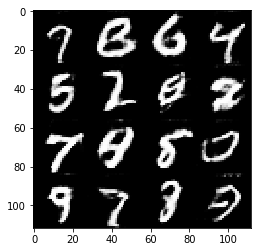

Timestamp 20170804-01-44-30.353 -  Epoch 2/2 -  Step 9010 -  D Loss: 0.9838 - G Loss: 1.2931
Timestamp 20170804-01-44-36.459 -  Epoch 2/2 -  Step 9020 -  D Loss: 0.6039 - G Loss: 2.7206
Timestamp 20170804-01-44-42.554 -  Epoch 2/2 -  Step 9030 -  D Loss: 0.5729 - G Loss: 1.8632
Timestamp 20170804-01-44-48.689 -  Epoch 2/2 -  Step 9040 -  D Loss: 0.8085 - G Loss: 1.3027
Timestamp 20170804-01-44-54.794 -  Epoch 2/2 -  Step 9050 -  D Loss: 0.5082 - G Loss: 1.8513
Timestamp 20170804-01-45-00.896 -  Epoch 2/2 -  Step 9060 -  D Loss: 0.6846 - G Loss: 2.4581
Timestamp 20170804-01-45-06.997 -  Epoch 2/2 -  Step 9070 -  D Loss: 0.9121 - G Loss: 1.6855
Timestamp 20170804-01-45-13.103 -  Epoch 2/2 -  Step 9080 -  D Loss: 0.8978 - G Loss: 1.7040
Timestamp 20170804-01-45-19.222 -  Epoch 2/2 -  Step 9090 -  D Loss: 0.6750 - G Loss: 1.0871
Timestamp 20170804-01-45-25.337 -  Epoch 2/2 -  Step 9100 -  D Loss: 0.6261 - G Loss: 2.0892


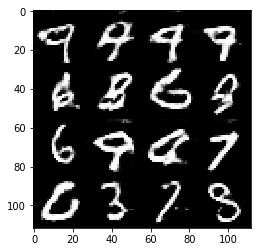

Timestamp 20170804-01-45-32.186 -  Epoch 2/2 -  Step 9110 -  D Loss: 0.6599 - G Loss: 1.2853
Timestamp 20170804-01-45-38.276 -  Epoch 2/2 -  Step 9120 -  D Loss: 0.6596 - G Loss: 1.7536
Timestamp 20170804-01-45-44.414 -  Epoch 2/2 -  Step 9130 -  D Loss: 0.7144 - G Loss: 2.7710
Timestamp 20170804-01-45-50.524 -  Epoch 2/2 -  Step 9140 -  D Loss: 0.5019 - G Loss: 3.7353
Timestamp 20170804-01-45-56.626 -  Epoch 2/2 -  Step 9150 -  D Loss: 0.4926 - G Loss: 2.1446
Timestamp 20170804-01-46-02.732 -  Epoch 2/2 -  Step 9160 -  D Loss: 0.8042 - G Loss: 1.6754
Timestamp 20170804-01-46-08.852 -  Epoch 2/2 -  Step 9170 -  D Loss: 1.4882 - G Loss: 0.6900
Timestamp 20170804-01-46-14.951 -  Epoch 2/2 -  Step 9180 -  D Loss: 0.6142 - G Loss: 2.8209
Timestamp 20170804-01-46-21.067 -  Epoch 2/2 -  Step 9190 -  D Loss: 0.5705 - G Loss: 3.0592
Timestamp 20170804-01-46-27.197 -  Epoch 2/2 -  Step 9200 -  D Loss: 0.5012 - G Loss: 2.1511


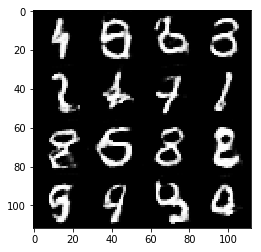

Timestamp 20170804-01-46-34.238 -  Epoch 2/2 -  Step 9210 -  D Loss: 1.1355 - G Loss: 1.1666
Timestamp 20170804-01-46-40.330 -  Epoch 2/2 -  Step 9220 -  D Loss: 1.0824 - G Loss: 0.6050
Timestamp 20170804-01-46-46.460 -  Epoch 2/2 -  Step 9230 -  D Loss: 0.9846 - G Loss: 1.0830
Timestamp 20170804-01-46-52.563 -  Epoch 2/2 -  Step 9240 -  D Loss: 0.7769 - G Loss: 1.7590
Timestamp 20170804-01-46-58.678 -  Epoch 2/2 -  Step 9250 -  D Loss: 0.6171 - G Loss: 2.3759
Timestamp 20170804-01-47-04.797 -  Epoch 2/2 -  Step 9260 -  D Loss: 1.1106 - G Loss: 1.5214
Timestamp 20170804-01-47-10.932 -  Epoch 2/2 -  Step 9270 -  D Loss: 1.0181 - G Loss: 1.7550
Timestamp 20170804-01-47-17.053 -  Epoch 2/2 -  Step 9280 -  D Loss: 0.8019 - G Loss: 1.3471
Timestamp 20170804-01-47-23.156 -  Epoch 2/2 -  Step 9290 -  D Loss: 0.9879 - G Loss: 1.0713
Timestamp 20170804-01-47-29.265 -  Epoch 2/2 -  Step 9300 -  D Loss: 0.7597 - G Loss: 1.9722


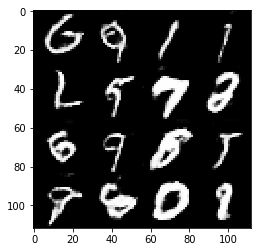

Timestamp 20170804-01-47-36.087 -  Epoch 2/2 -  Step 9310 -  D Loss: 0.5069 - G Loss: 1.2888
Timestamp 20170804-01-47-42.220 -  Epoch 2/2 -  Step 9320 -  D Loss: 0.8126 - G Loss: 1.7515
Timestamp 20170804-01-47-48.334 -  Epoch 2/2 -  Step 9330 -  D Loss: 0.7045 - G Loss: 1.7531
Timestamp 20170804-01-47-54.442 -  Epoch 2/2 -  Step 9340 -  D Loss: 0.5928 - G Loss: 2.6602
Timestamp 20170804-01-48-00.550 -  Epoch 2/2 -  Step 9350 -  D Loss: 0.7104 - G Loss: 2.2166
Timestamp 20170804-01-48-06.666 -  Epoch 2/2 -  Step 9360 -  D Loss: 1.6908 - G Loss: 1.5233
Timestamp 20170804-01-48-12.769 -  Epoch 2/2 -  Step 9370 -  D Loss: 0.5030 - G Loss: 2.2488
Timestamp 20170804-01-48-18.882 -  Epoch 2/2 -  Step 9380 -  D Loss: 1.4193 - G Loss: 1.4202
Timestamp 20170804-01-48-24.995 -  Epoch 2/2 -  Step 9390 -  D Loss: 0.6875 - G Loss: 2.1148
Timestamp 20170804-01-48-31.096 -  Epoch 2/2 -  Step 9400 -  D Loss: 0.7628 - G Loss: 2.0794


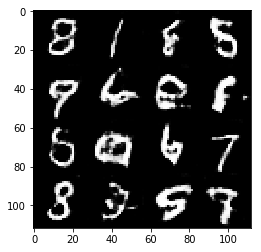

Timestamp 20170804-01-48-37.941 -  Epoch 2/2 -  Step 9410 -  D Loss: 0.4342 - G Loss: 2.8050
Timestamp 20170804-01-48-44.079 -  Epoch 2/2 -  Step 9420 -  D Loss: 0.7184 - G Loss: 1.1021
Timestamp 20170804-01-48-50.204 -  Epoch 2/2 -  Step 9430 -  D Loss: 0.4735 - G Loss: 2.3538
Timestamp 20170804-01-48-56.316 -  Epoch 2/2 -  Step 9440 -  D Loss: 0.7971 - G Loss: 2.0065
Timestamp 20170804-01-49-02.429 -  Epoch 2/2 -  Step 9450 -  D Loss: 0.7079 - G Loss: 2.2860
Timestamp 20170804-01-49-08.537 -  Epoch 2/2 -  Step 9460 -  D Loss: 0.8696 - G Loss: 1.2210
Timestamp 20170804-01-49-14.655 -  Epoch 2/2 -  Step 9470 -  D Loss: 0.5310 - G Loss: 1.9195
Timestamp 20170804-01-49-20.762 -  Epoch 2/2 -  Step 9480 -  D Loss: 1.3219 - G Loss: 1.8241
Timestamp 20170804-01-49-26.872 -  Epoch 2/2 -  Step 9490 -  D Loss: 0.5196 - G Loss: 1.8611
Timestamp 20170804-01-49-32.991 -  Epoch 2/2 -  Step 9500 -  D Loss: 0.6144 - G Loss: 2.7767


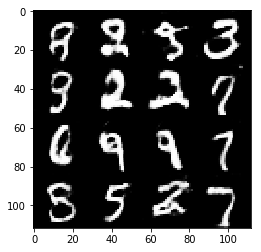

Timestamp 20170804-01-49-39.819 -  Epoch 2/2 -  Step 9510 -  D Loss: 1.3180 - G Loss: 3.0321
Timestamp 20170804-01-49-45.927 -  Epoch 2/2 -  Step 9520 -  D Loss: 0.4986 - G Loss: 2.5987
Timestamp 20170804-01-49-52.035 -  Epoch 2/2 -  Step 9530 -  D Loss: 0.8250 - G Loss: 1.7488
Timestamp 20170804-01-49-58.163 -  Epoch 2/2 -  Step 9540 -  D Loss: 0.8315 - G Loss: 1.6059
Timestamp 20170804-01-50-04.282 -  Epoch 2/2 -  Step 9550 -  D Loss: 0.6717 - G Loss: 3.3156
Timestamp 20170804-01-50-10.420 -  Epoch 2/2 -  Step 9560 -  D Loss: 0.6538 - G Loss: 0.8536
Timestamp 20170804-01-50-16.538 -  Epoch 2/2 -  Step 9570 -  D Loss: 0.6669 - G Loss: 1.3823
Timestamp 20170804-01-50-22.653 -  Epoch 2/2 -  Step 9580 -  D Loss: 0.5618 - G Loss: 1.6011
Timestamp 20170804-01-50-28.779 -  Epoch 2/2 -  Step 9590 -  D Loss: 0.7877 - G Loss: 2.8015
Timestamp 20170804-01-50-34.883 -  Epoch 2/2 -  Step 9600 -  D Loss: 0.5560 - G Loss: 3.0749


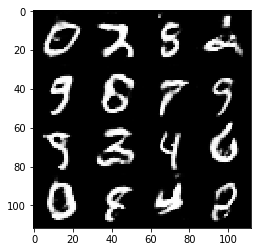

Timestamp 20170804-01-50-41.714 -  Epoch 2/2 -  Step 9610 -  D Loss: 0.7437 - G Loss: 1.4004
Timestamp 20170804-01-50-47.830 -  Epoch 2/2 -  Step 9620 -  D Loss: 0.6688 - G Loss: 1.6948
Timestamp 20170804-01-50-53.917 -  Epoch 2/2 -  Step 9630 -  D Loss: 1.1597 - G Loss: 1.4271
Timestamp 20170804-01-51-00.045 -  Epoch 2/2 -  Step 9640 -  D Loss: 0.6087 - G Loss: 3.9505
Timestamp 20170804-01-51-06.151 -  Epoch 2/2 -  Step 9650 -  D Loss: 0.7085 - G Loss: 3.1835
Timestamp 20170804-01-51-12.273 -  Epoch 2/2 -  Step 9660 -  D Loss: 0.6019 - G Loss: 1.6475
Timestamp 20170804-01-51-18.370 -  Epoch 2/2 -  Step 9670 -  D Loss: 0.8022 - G Loss: 1.5044
Timestamp 20170804-01-51-24.488 -  Epoch 2/2 -  Step 9680 -  D Loss: 0.4502 - G Loss: 0.8250
Timestamp 20170804-01-51-30.606 -  Epoch 2/2 -  Step 9690 -  D Loss: 0.5770 - G Loss: 2.8650
Timestamp 20170804-01-51-36.744 -  Epoch 2/2 -  Step 9700 -  D Loss: 0.9280 - G Loss: 1.3434


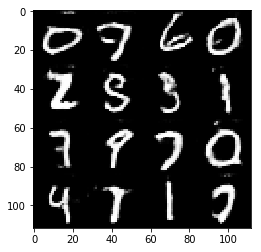

Timestamp 20170804-01-51-43.592 -  Epoch 2/2 -  Step 9710 -  D Loss: 0.9365 - G Loss: 2.2086
Timestamp 20170804-01-51-49.740 -  Epoch 2/2 -  Step 9720 -  D Loss: 0.8634 - G Loss: 2.0604
Timestamp 20170804-01-51-55.863 -  Epoch 2/2 -  Step 9730 -  D Loss: 0.7856 - G Loss: 1.5381
Timestamp 20170804-01-52-01.972 -  Epoch 2/2 -  Step 9740 -  D Loss: 0.6630 - G Loss: 1.7544
Timestamp 20170804-01-52-08.078 -  Epoch 2/2 -  Step 9750 -  D Loss: 0.5174 - G Loss: 1.9701
Timestamp 20170804-01-52-14.177 -  Epoch 2/2 -  Step 9760 -  D Loss: 0.8318 - G Loss: 2.4009
Timestamp 20170804-01-52-20.284 -  Epoch 2/2 -  Step 9770 -  D Loss: 0.9932 - G Loss: 1.8908
Timestamp 20170804-01-52-26.389 -  Epoch 2/2 -  Step 9780 -  D Loss: 0.7953 - G Loss: 1.8734
Timestamp 20170804-01-52-32.495 -  Epoch 2/2 -  Step 9790 -  D Loss: 0.7267 - G Loss: 1.4237
Timestamp 20170804-01-52-38.612 -  Epoch 2/2 -  Step 9800 -  D Loss: 0.5595 - G Loss: 1.8709


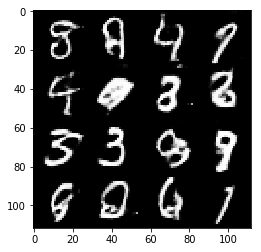

Timestamp 20170804-01-52-45.447 -  Epoch 2/2 -  Step 9810 -  D Loss: 1.0870 - G Loss: 1.0618
Timestamp 20170804-01-52-51.572 -  Epoch 2/2 -  Step 9820 -  D Loss: 0.7193 - G Loss: 1.8363
Timestamp 20170804-01-52-57.686 -  Epoch 2/2 -  Step 9830 -  D Loss: 0.6317 - G Loss: 1.6286
Timestamp 20170804-01-53-03.794 -  Epoch 2/2 -  Step 9840 -  D Loss: 0.9602 - G Loss: 1.0551
Timestamp 20170804-01-53-09.902 -  Epoch 2/2 -  Step 9850 -  D Loss: 0.8755 - G Loss: 1.1750
Timestamp 20170804-01-53-16.008 -  Epoch 2/2 -  Step 9860 -  D Loss: 0.6151 - G Loss: 3.2840
Timestamp 20170804-01-53-22.141 -  Epoch 2/2 -  Step 9870 -  D Loss: 0.8277 - G Loss: 1.5840
Timestamp 20170804-01-53-28.277 -  Epoch 2/2 -  Step 9880 -  D Loss: 1.0716 - G Loss: 1.1585
Timestamp 20170804-01-53-34.372 -  Epoch 2/2 -  Step 9890 -  D Loss: 1.3470 - G Loss: 0.9741
Timestamp 20170804-01-53-40.502 -  Epoch 2/2 -  Step 9900 -  D Loss: 0.8037 - G Loss: 1.1532


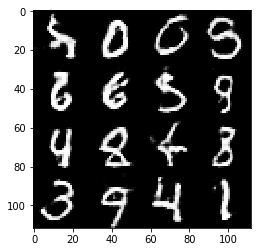

Timestamp 20170804-01-53-47.502 -  Epoch 2/2 -  Step 9910 -  D Loss: 0.6536 - G Loss: 2.8933
Timestamp 20170804-01-53-53.615 -  Epoch 2/2 -  Step 9920 -  D Loss: 0.9284 - G Loss: 1.3683
Timestamp 20170804-01-53-59.744 -  Epoch 2/2 -  Step 9930 -  D Loss: 0.5369 - G Loss: 2.0608
Timestamp 20170804-01-54-05.842 -  Epoch 2/2 -  Step 9940 -  D Loss: 0.6806 - G Loss: 1.0628
Timestamp 20170804-01-54-11.974 -  Epoch 2/2 -  Step 9950 -  D Loss: 0.5631 - G Loss: 1.6669
Timestamp 20170804-01-54-18.077 -  Epoch 2/2 -  Step 9960 -  D Loss: 0.6061 - G Loss: 2.9054
Timestamp 20170804-01-54-24.183 -  Epoch 2/2 -  Step 9970 -  D Loss: 0.7059 - G Loss: 1.2398
Timestamp 20170804-01-54-30.293 -  Epoch 2/2 -  Step 9980 -  D Loss: 0.5507 - G Loss: 2.8729
Timestamp 20170804-01-54-36.417 -  Epoch 2/2 -  Step 9990 -  D Loss: 0.8822 - G Loss: 1.5520
Timestamp 20170804-01-54-42.519 -  Epoch 2/2 -  Step 10000 -  D Loss: 0.5777 - G Loss: 2.2522


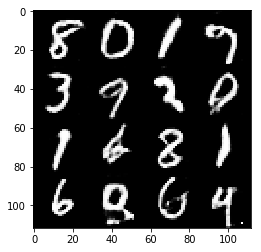

Timestamp 20170804-01-54-49.379 -  Epoch 2/2 -  Step 10010 -  D Loss: 0.5234 - G Loss: 3.1217
Timestamp 20170804-01-54-55.484 -  Epoch 2/2 -  Step 10020 -  D Loss: 0.8943 - G Loss: 1.7492
Timestamp 20170804-01-55-01.594 -  Epoch 2/2 -  Step 10030 -  D Loss: 0.6600 - G Loss: 1.0644
Timestamp 20170804-01-55-07.709 -  Epoch 2/2 -  Step 10040 -  D Loss: 0.6132 - G Loss: 2.2651
Timestamp 20170804-01-55-13.802 -  Epoch 2/2 -  Step 10050 -  D Loss: 1.2272 - G Loss: 1.5754
Timestamp 20170804-01-55-19.943 -  Epoch 2/2 -  Step 10060 -  D Loss: 1.1760 - G Loss: 1.4755
Timestamp 20170804-01-55-26.064 -  Epoch 2/2 -  Step 10070 -  D Loss: 0.6307 - G Loss: 1.3446
Timestamp 20170804-01-55-32.215 -  Epoch 2/2 -  Step 10080 -  D Loss: 0.4298 - G Loss: 2.2113
Timestamp 20170804-01-55-38.322 -  Epoch 2/2 -  Step 10090 -  D Loss: 0.5578 - G Loss: 1.9374
Timestamp 20170804-01-55-44.430 -  Epoch 2/2 -  Step 10100 -  D Loss: 1.0733 - G Loss: 0.9958


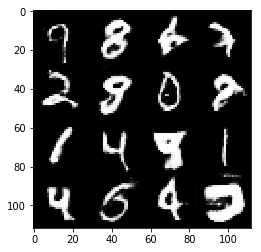

Timestamp 20170804-01-55-51.290 -  Epoch 2/2 -  Step 10110 -  D Loss: 0.5649 - G Loss: 1.2395
Timestamp 20170804-01-55-57.391 -  Epoch 2/2 -  Step 10120 -  D Loss: 1.0692 - G Loss: 1.1662
Timestamp 20170804-01-56-03.510 -  Epoch 2/2 -  Step 10130 -  D Loss: 0.7576 - G Loss: 2.0231
Timestamp 20170804-01-56-09.616 -  Epoch 2/2 -  Step 10140 -  D Loss: 0.9590 - G Loss: 2.7959
Timestamp 20170804-01-56-15.725 -  Epoch 2/2 -  Step 10150 -  D Loss: 0.6833 - G Loss: 1.3995
Timestamp 20170804-01-56-21.833 -  Epoch 2/2 -  Step 10160 -  D Loss: 0.5322 - G Loss: 2.3441
Timestamp 20170804-01-56-27.955 -  Epoch 2/2 -  Step 10170 -  D Loss: 0.8334 - G Loss: 2.6987
Timestamp 20170804-01-56-34.047 -  Epoch 2/2 -  Step 10180 -  D Loss: 0.9684 - G Loss: 1.6075
Timestamp 20170804-01-56-40.175 -  Epoch 2/2 -  Step 10190 -  D Loss: 0.8785 - G Loss: 1.8532
Timestamp 20170804-01-56-46.292 -  Epoch 2/2 -  Step 10200 -  D Loss: 0.9068 - G Loss: 1.1250


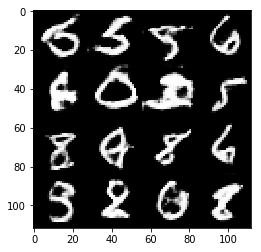

Timestamp 20170804-01-56-53.133 -  Epoch 2/2 -  Step 10210 -  D Loss: 0.7242 - G Loss: 1.1862
Timestamp 20170804-01-56-59.247 -  Epoch 2/2 -  Step 10220 -  D Loss: 0.5007 - G Loss: 2.5809
Timestamp 20170804-01-57-05.344 -  Epoch 2/2 -  Step 10230 -  D Loss: 0.7825 - G Loss: 2.0593
Timestamp 20170804-01-57-11.460 -  Epoch 2/2 -  Step 10240 -  D Loss: 0.6903 - G Loss: 1.1911
Timestamp 20170804-01-57-17.571 -  Epoch 2/2 -  Step 10250 -  D Loss: 0.5285 - G Loss: 2.6214
Timestamp 20170804-01-57-23.686 -  Epoch 2/2 -  Step 10260 -  D Loss: 0.7057 - G Loss: 1.7491
Timestamp 20170804-01-57-29.785 -  Epoch 2/2 -  Step 10270 -  D Loss: 1.0288 - G Loss: 2.4513
Timestamp 20170804-01-57-35.887 -  Epoch 2/2 -  Step 10280 -  D Loss: 0.6973 - G Loss: 1.2902
Timestamp 20170804-01-57-41.999 -  Epoch 2/2 -  Step 10290 -  D Loss: 0.9664 - G Loss: 1.3599
Timestamp 20170804-01-57-48.105 -  Epoch 2/2 -  Step 10300 -  D Loss: 1.1359 - G Loss: 2.6204


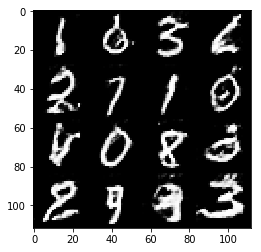

Timestamp 20170804-01-57-54.944 -  Epoch 2/2 -  Step 10310 -  D Loss: 0.9636 - G Loss: 1.8798
Timestamp 20170804-01-58-01.072 -  Epoch 2/2 -  Step 10320 -  D Loss: 0.8387 - G Loss: 1.2799
Timestamp 20170804-01-58-07.193 -  Epoch 2/2 -  Step 10330 -  D Loss: 0.6469 - G Loss: 2.1643
Timestamp 20170804-01-58-13.316 -  Epoch 2/2 -  Step 10340 -  D Loss: 0.6397 - G Loss: 2.2213
Timestamp 20170804-01-58-19.428 -  Epoch 2/2 -  Step 10350 -  D Loss: 1.1409 - G Loss: 1.4548
Timestamp 20170804-01-58-25.540 -  Epoch 2/2 -  Step 10360 -  D Loss: 0.7621 - G Loss: 1.3113
Timestamp 20170804-01-58-31.659 -  Epoch 2/2 -  Step 10370 -  D Loss: 0.6296 - G Loss: 2.3106
Timestamp 20170804-01-58-37.766 -  Epoch 2/2 -  Step 10380 -  D Loss: 0.5461 - G Loss: 1.1037
Timestamp 20170804-01-58-43.874 -  Epoch 2/2 -  Step 10390 -  D Loss: 0.9669 - G Loss: 0.4480
Timestamp 20170804-01-58-49.984 -  Epoch 2/2 -  Step 10400 -  D Loss: 0.9354 - G Loss: 1.6200


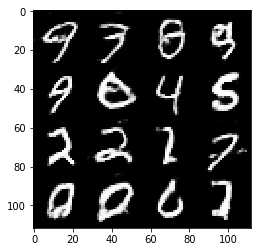

Timestamp 20170804-01-58-56.827 -  Epoch 2/2 -  Step 10410 -  D Loss: 0.6538 - G Loss: 1.4633
Timestamp 20170804-01-59-02.935 -  Epoch 2/2 -  Step 10420 -  D Loss: 0.6011 - G Loss: 2.0897
Timestamp 20170804-01-59-09.070 -  Epoch 2/2 -  Step 10430 -  D Loss: 0.6560 - G Loss: 0.9799
Timestamp 20170804-01-59-15.190 -  Epoch 2/2 -  Step 10440 -  D Loss: 0.3940 - G Loss: 2.7291
Timestamp 20170804-01-59-21.296 -  Epoch 2/2 -  Step 10450 -  D Loss: 0.5404 - G Loss: 2.8193
Timestamp 20170804-01-59-27.406 -  Epoch 2/2 -  Step 10460 -  D Loss: 1.0589 - G Loss: 1.3342
Timestamp 20170804-01-59-33.534 -  Epoch 2/2 -  Step 10470 -  D Loss: 0.4915 - G Loss: 3.1315
Timestamp 20170804-01-59-39.646 -  Epoch 2/2 -  Step 10480 -  D Loss: 0.6927 - G Loss: 2.5879
Timestamp 20170804-01-59-45.760 -  Epoch 2/2 -  Step 10490 -  D Loss: 0.9470 - G Loss: 1.5247
Timestamp 20170804-01-59-51.871 -  Epoch 2/2 -  Step 10500 -  D Loss: 0.9824 - G Loss: 2.4723


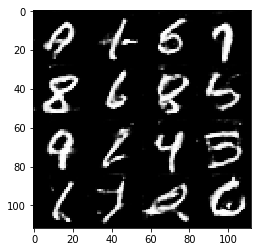

Timestamp 20170804-01-59-58.695 -  Epoch 2/2 -  Step 10510 -  D Loss: 0.5760 - G Loss: 2.6013
Timestamp 20170804-02-00-04.810 -  Epoch 2/2 -  Step 10520 -  D Loss: 0.6432 - G Loss: 1.2409
Timestamp 20170804-02-00-10.943 -  Epoch 2/2 -  Step 10530 -  D Loss: 0.4986 - G Loss: 2.7118
Timestamp 20170804-02-00-17.064 -  Epoch 2/2 -  Step 10540 -  D Loss: 0.4244 - G Loss: 2.8252
Timestamp 20170804-02-00-23.183 -  Epoch 2/2 -  Step 10550 -  D Loss: 1.3402 - G Loss: 0.9139
Timestamp 20170804-02-00-29.314 -  Epoch 2/2 -  Step 10560 -  D Loss: 0.8148 - G Loss: 1.6743
Timestamp 20170804-02-00-35.417 -  Epoch 2/2 -  Step 10570 -  D Loss: 0.5699 - G Loss: 1.4946
Timestamp 20170804-02-00-41.515 -  Epoch 2/2 -  Step 10580 -  D Loss: 0.4490 - G Loss: 2.4967
Timestamp 20170804-02-00-47.628 -  Epoch 2/2 -  Step 10590 -  D Loss: 0.7491 - G Loss: 1.4384
Timestamp 20170804-02-00-53.726 -  Epoch 2/2 -  Step 10600 -  D Loss: 1.1365 - G Loss: 1.4721


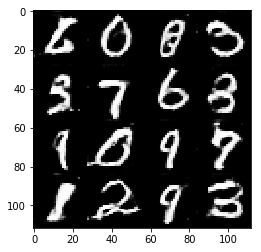

Timestamp 20170804-02-01-00.591 -  Epoch 2/2 -  Step 10610 -  D Loss: 0.8515 - G Loss: 1.3594
Timestamp 20170804-02-01-06.694 -  Epoch 2/2 -  Step 10620 -  D Loss: 1.7161 - G Loss: 0.7605
Timestamp 20170804-02-01-12.829 -  Epoch 2/2 -  Step 10630 -  D Loss: 1.0124 - G Loss: 1.0531
Timestamp 20170804-02-01-18.923 -  Epoch 2/2 -  Step 10640 -  D Loss: 0.7513 - G Loss: 1.7496
Timestamp 20170804-02-01-25.049 -  Epoch 2/2 -  Step 10650 -  D Loss: 1.1630 - G Loss: 1.0482
Timestamp 20170804-02-01-31.153 -  Epoch 2/2 -  Step 10660 -  D Loss: 1.1506 - G Loss: 1.8759
Timestamp 20170804-02-01-37.268 -  Epoch 2/2 -  Step 10670 -  D Loss: 0.7524 - G Loss: 1.3911
Timestamp 20170804-02-01-43.396 -  Epoch 2/2 -  Step 10680 -  D Loss: 0.8109 - G Loss: 1.1292
Timestamp 20170804-02-01-49.536 -  Epoch 2/2 -  Step 10690 -  D Loss: 0.6601 - G Loss: 1.7781
Timestamp 20170804-02-01-55.652 -  Epoch 2/2 -  Step 10700 -  D Loss: 0.8975 - G Loss: 1.0812


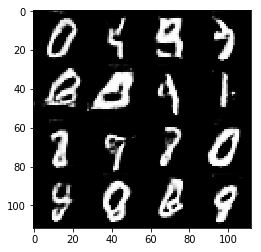

Timestamp 20170804-02-02-02.512 -  Epoch 2/2 -  Step 10710 -  D Loss: 0.6138 - G Loss: 2.0906
Timestamp 20170804-02-02-08.634 -  Epoch 2/2 -  Step 10720 -  D Loss: 0.6848 - G Loss: 1.4747
Timestamp 20170804-02-02-14.746 -  Epoch 2/2 -  Step 10730 -  D Loss: 1.6078 - G Loss: 0.7091
Timestamp 20170804-02-02-20.867 -  Epoch 2/2 -  Step 10740 -  D Loss: 0.6095 - G Loss: 2.8642
Timestamp 20170804-02-02-26.993 -  Epoch 2/2 -  Step 10750 -  D Loss: 0.4988 - G Loss: 2.1039
Timestamp 20170804-02-02-33.107 -  Epoch 2/2 -  Step 10760 -  D Loss: 0.4595 - G Loss: 2.0413
Timestamp 20170804-02-02-39.244 -  Epoch 2/2 -  Step 10770 -  D Loss: 0.7455 - G Loss: 0.8770
Timestamp 20170804-02-02-45.376 -  Epoch 2/2 -  Step 10780 -  D Loss: 0.7022 - G Loss: 3.4354
Timestamp 20170804-02-02-51.488 -  Epoch 2/2 -  Step 10790 -  D Loss: 0.7689 - G Loss: 1.6025
Timestamp 20170804-02-02-57.605 -  Epoch 2/2 -  Step 10800 -  D Loss: 0.8901 - G Loss: 1.2267


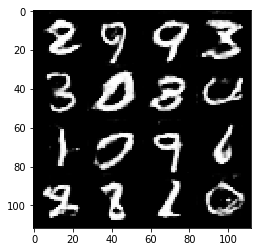

Timestamp 20170804-02-03-04.521 -  Epoch 2/2 -  Step 10810 -  D Loss: 0.6934 - G Loss: 1.1522
Timestamp 20170804-02-03-10.625 -  Epoch 2/2 -  Step 10820 -  D Loss: 0.6760 - G Loss: 1.1719
Timestamp 20170804-02-03-16.730 -  Epoch 2/2 -  Step 10830 -  D Loss: 0.7834 - G Loss: 2.3863
Timestamp 20170804-02-03-22.839 -  Epoch 2/2 -  Step 10840 -  D Loss: 0.7579 - G Loss: 1.9593
Timestamp 20170804-02-03-28.946 -  Epoch 2/2 -  Step 10850 -  D Loss: 0.4973 - G Loss: 1.7820
Timestamp 20170804-02-03-35.057 -  Epoch 2/2 -  Step 10860 -  D Loss: 0.6757 - G Loss: 2.8372
Timestamp 20170804-02-03-41.168 -  Epoch 2/2 -  Step 10870 -  D Loss: 0.6582 - G Loss: 1.5314
Timestamp 20170804-02-03-47.280 -  Epoch 2/2 -  Step 10880 -  D Loss: 0.8737 - G Loss: 2.4594
Timestamp 20170804-02-03-53.388 -  Epoch 2/2 -  Step 10890 -  D Loss: 1.0739 - G Loss: 0.8701
Timestamp 20170804-02-03-59.496 -  Epoch 2/2 -  Step 10900 -  D Loss: 1.0132 - G Loss: 2.7391


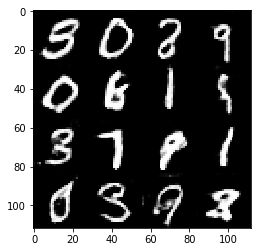

Timestamp 20170804-02-04-06.363 -  Epoch 2/2 -  Step 10910 -  D Loss: 1.0141 - G Loss: 2.1118
Timestamp 20170804-02-04-12.483 -  Epoch 2/2 -  Step 10920 -  D Loss: 1.5516 - G Loss: 1.7943
Timestamp 20170804-02-04-18.595 -  Epoch 2/2 -  Step 10930 -  D Loss: 0.4744 - G Loss: 1.5699
Timestamp 20170804-02-04-24.709 -  Epoch 2/2 -  Step 10940 -  D Loss: 0.5966 - G Loss: 1.4110
Timestamp 20170804-02-04-30.827 -  Epoch 2/2 -  Step 10950 -  D Loss: 0.5734 - G Loss: 0.6983
Timestamp 20170804-02-04-36.939 -  Epoch 2/2 -  Step 10960 -  D Loss: 0.4929 - G Loss: 1.5867
Timestamp 20170804-02-04-43.036 -  Epoch 2/2 -  Step 10970 -  D Loss: 0.6438 - G Loss: 1.2295
Timestamp 20170804-02-04-49.149 -  Epoch 2/2 -  Step 10980 -  D Loss: 0.6137 - G Loss: 1.5884
Timestamp 20170804-02-04-55.295 -  Epoch 2/2 -  Step 10990 -  D Loss: 0.5724 - G Loss: 3.8040
Timestamp 20170804-02-05-01.476 -  Epoch 2/2 -  Step 11000 -  D Loss: 0.7492 - G Loss: 1.2143


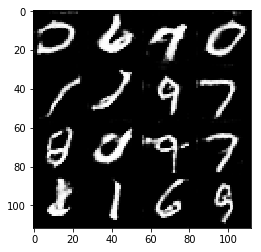

Timestamp 20170804-02-05-08.469 -  Epoch 2/2 -  Step 11010 -  D Loss: 0.4402 - G Loss: 2.1312
Timestamp 20170804-02-05-14.568 -  Epoch 2/2 -  Step 11020 -  D Loss: 0.7361 - G Loss: 2.6095
Timestamp 20170804-02-05-20.690 -  Epoch 2/2 -  Step 11030 -  D Loss: 0.8391 - G Loss: 1.7369
Timestamp 20170804-02-05-26.810 -  Epoch 2/2 -  Step 11040 -  D Loss: 0.8282 - G Loss: 1.0600
Timestamp 20170804-02-05-32.908 -  Epoch 2/2 -  Step 11050 -  D Loss: 0.8011 - G Loss: 1.5354
Timestamp 20170804-02-05-39.029 -  Epoch 2/2 -  Step 11060 -  D Loss: 1.0998 - G Loss: 1.2879
Timestamp 20170804-02-05-45.137 -  Epoch 2/2 -  Step 11070 -  D Loss: 0.7434 - G Loss: 1.7290
Timestamp 20170804-02-05-51.249 -  Epoch 2/2 -  Step 11080 -  D Loss: 0.6366 - G Loss: 2.8248
Timestamp 20170804-02-05-57.366 -  Epoch 2/2 -  Step 11090 -  D Loss: 1.6963 - G Loss: 0.9252
Timestamp 20170804-02-06-03.474 -  Epoch 2/2 -  Step 11100 -  D Loss: 1.2493 - G Loss: 1.0812


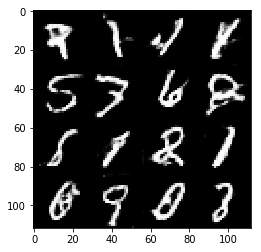

Timestamp 20170804-02-06-10.647 -  Epoch 2/2 -  Step 11110 -  D Loss: 0.6427 - G Loss: 1.2714
Timestamp 20170804-02-06-16.788 -  Epoch 2/2 -  Step 11120 -  D Loss: 0.5693 - G Loss: 1.4288
Timestamp 20170804-02-06-22.884 -  Epoch 2/2 -  Step 11130 -  D Loss: 0.6299 - G Loss: 1.9615
Timestamp 20170804-02-06-28.996 -  Epoch 2/2 -  Step 11140 -  D Loss: 0.6530 - G Loss: 2.2905
Timestamp 20170804-02-06-35.105 -  Epoch 2/2 -  Step 11150 -  D Loss: 0.5377 - G Loss: 1.7504
Timestamp 20170804-02-06-41.232 -  Epoch 2/2 -  Step 11160 -  D Loss: 0.6007 - G Loss: 1.8989
Timestamp 20170804-02-06-47.348 -  Epoch 2/2 -  Step 11170 -  D Loss: 1.2033 - G Loss: 0.9557
Timestamp 20170804-02-06-53.464 -  Epoch 2/2 -  Step 11180 -  D Loss: 0.9674 - G Loss: 0.8865
Timestamp 20170804-02-06-59.580 -  Epoch 2/2 -  Step 11190 -  D Loss: 0.7815 - G Loss: 1.9402
Timestamp 20170804-02-07-05.714 -  Epoch 2/2 -  Step 11200 -  D Loss: 1.3213 - G Loss: 0.8220


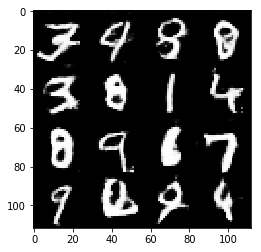

Timestamp 20170804-02-07-12.587 -  Epoch 2/2 -  Step 11210 -  D Loss: 0.5905 - G Loss: 1.8060
Timestamp 20170804-02-07-18.721 -  Epoch 2/2 -  Step 11220 -  D Loss: 0.5788 - G Loss: 2.3075
Timestamp 20170804-02-07-24.838 -  Epoch 2/2 -  Step 11230 -  D Loss: 0.6719 - G Loss: 2.2326
Timestamp 20170804-02-07-30.981 -  Epoch 2/2 -  Step 11240 -  D Loss: 0.9403 - G Loss: 1.5783
Timestamp 20170804-02-07-37.093 -  Epoch 2/2 -  Step 11250 -  D Loss: 0.6135 - G Loss: 2.5336
Timestamp 20170804-02-07-43.208 -  Epoch 2/2 -  Step 11260 -  D Loss: 1.2578 - G Loss: 1.9619
Timestamp 20170804-02-07-49.324 -  Epoch 2/2 -  Step 11270 -  D Loss: 0.6245 - G Loss: 1.7229
Timestamp 20170804-02-07-55.437 -  Epoch 2/2 -  Step 11280 -  D Loss: 0.7367 - G Loss: 1.4532
Timestamp 20170804-02-08-01.568 -  Epoch 2/2 -  Step 11290 -  D Loss: 0.4992 - G Loss: 1.8808
Timestamp 20170804-02-08-07.696 -  Epoch 2/2 -  Step 11300 -  D Loss: 0.4355 - G Loss: 3.1039


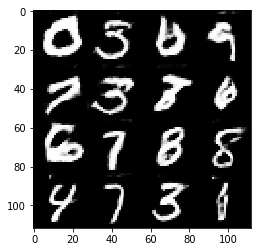

Timestamp 20170804-02-08-14.573 -  Epoch 2/2 -  Step 11310 -  D Loss: 1.0417 - G Loss: 2.3152
Timestamp 20170804-02-08-20.694 -  Epoch 2/2 -  Step 11320 -  D Loss: 0.8755 - G Loss: 2.2757
Timestamp 20170804-02-08-26.808 -  Epoch 2/2 -  Step 11330 -  D Loss: 0.5477 - G Loss: 3.1395
Timestamp 20170804-02-08-32.919 -  Epoch 2/2 -  Step 11340 -  D Loss: 0.8666 - G Loss: 2.0273
Timestamp 20170804-02-08-39.038 -  Epoch 2/2 -  Step 11350 -  D Loss: 0.6667 - G Loss: 1.2472
Timestamp 20170804-02-08-45.150 -  Epoch 2/2 -  Step 11360 -  D Loss: 0.7791 - G Loss: 2.0630
Timestamp 20170804-02-08-51.255 -  Epoch 2/2 -  Step 11370 -  D Loss: 0.5856 - G Loss: 3.0461
Timestamp 20170804-02-08-57.362 -  Epoch 2/2 -  Step 11380 -  D Loss: 0.7824 - G Loss: 1.5974
Timestamp 20170804-02-09-03.468 -  Epoch 2/2 -  Step 11390 -  D Loss: 1.0086 - G Loss: 1.5952
Timestamp 20170804-02-09-09.594 -  Epoch 2/2 -  Step 11400 -  D Loss: 0.6977 - G Loss: 1.9010


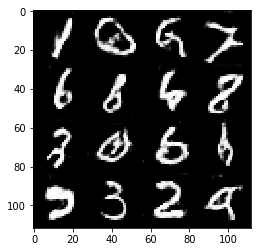

Timestamp 20170804-02-09-16.447 -  Epoch 2/2 -  Step 11410 -  D Loss: 0.5685 - G Loss: 1.8398
Timestamp 20170804-02-09-22.600 -  Epoch 2/2 -  Step 11420 -  D Loss: 0.5494 - G Loss: 1.4756
Timestamp 20170804-02-09-28.729 -  Epoch 2/2 -  Step 11430 -  D Loss: 0.6900 - G Loss: 2.5508
Timestamp 20170804-02-09-34.840 -  Epoch 2/2 -  Step 11440 -  D Loss: 0.7512 - G Loss: 2.2563
Timestamp 20170804-02-09-40.929 -  Epoch 2/2 -  Step 11450 -  D Loss: 0.6411 - G Loss: 1.7187
Timestamp 20170804-02-09-47.061 -  Epoch 2/2 -  Step 11460 -  D Loss: 0.9085 - G Loss: 1.5336
Timestamp 20170804-02-09-53.175 -  Epoch 2/2 -  Step 11470 -  D Loss: 0.6971 - G Loss: 1.5508
Timestamp 20170804-02-09-59.282 -  Epoch 2/2 -  Step 11480 -  D Loss: 0.4830 - G Loss: 3.2529
Timestamp 20170804-02-10-05.432 -  Epoch 2/2 -  Step 11490 -  D Loss: 0.8290 - G Loss: 1.1720
Timestamp 20170804-02-10-11.544 -  Epoch 2/2 -  Step 11500 -  D Loss: 0.9990 - G Loss: 2.2381


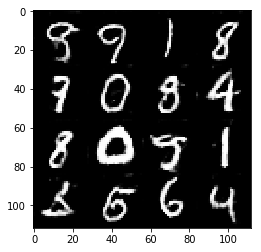

Timestamp 20170804-02-10-18.410 -  Epoch 2/2 -  Step 11510 -  D Loss: 0.4546 - G Loss: 2.1206
Timestamp 20170804-02-10-24.540 -  Epoch 2/2 -  Step 11520 -  D Loss: 0.5116 - G Loss: 1.6737
Timestamp 20170804-02-10-30.653 -  Epoch 2/2 -  Step 11530 -  D Loss: 0.5314 - G Loss: 2.5096
Timestamp 20170804-02-10-36.770 -  Epoch 2/2 -  Step 11540 -  D Loss: 0.5537 - G Loss: 3.4278
Timestamp 20170804-02-10-42.870 -  Epoch 2/2 -  Step 11550 -  D Loss: 0.6812 - G Loss: 2.5295
Timestamp 20170804-02-10-48.963 -  Epoch 2/2 -  Step 11560 -  D Loss: 0.5681 - G Loss: 2.4058
Timestamp 20170804-02-10-55.096 -  Epoch 2/2 -  Step 11570 -  D Loss: 0.4881 - G Loss: 1.7278
Timestamp 20170804-02-11-01.207 -  Epoch 2/2 -  Step 11580 -  D Loss: 0.5557 - G Loss: 1.9362
Timestamp 20170804-02-11-07.328 -  Epoch 2/2 -  Step 11590 -  D Loss: 0.8982 - G Loss: 2.5086
Timestamp 20170804-02-11-13.434 -  Epoch 2/2 -  Step 11600 -  D Loss: 0.7048 - G Loss: 2.4572


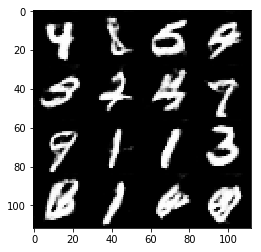

Timestamp 20170804-02-11-20.296 -  Epoch 2/2 -  Step 11610 -  D Loss: 0.7871 - G Loss: 1.1057
Timestamp 20170804-02-11-26.408 -  Epoch 2/2 -  Step 11620 -  D Loss: 0.6081 - G Loss: 2.4960
Timestamp 20170804-02-11-32.527 -  Epoch 2/2 -  Step 11630 -  D Loss: 0.7530 - G Loss: 2.3939
Timestamp 20170804-02-11-38.634 -  Epoch 2/2 -  Step 11640 -  D Loss: 0.7053 - G Loss: 1.2602
Timestamp 20170804-02-11-44.738 -  Epoch 2/2 -  Step 11650 -  D Loss: 0.9419 - G Loss: 1.7061
Timestamp 20170804-02-11-50.846 -  Epoch 2/2 -  Step 11660 -  D Loss: 0.8162 - G Loss: 0.8643
Timestamp 20170804-02-11-56.976 -  Epoch 2/2 -  Step 11670 -  D Loss: 0.6322 - G Loss: 2.2148
Timestamp 20170804-02-12-03.086 -  Epoch 2/2 -  Step 11680 -  D Loss: 1.1811 - G Loss: 1.2988
Timestamp 20170804-02-12-09.193 -  Epoch 2/2 -  Step 11690 -  D Loss: 0.6140 - G Loss: 1.4212
Timestamp 20170804-02-12-15.311 -  Epoch 2/2 -  Step 11700 -  D Loss: 1.4438 - G Loss: 3.5260


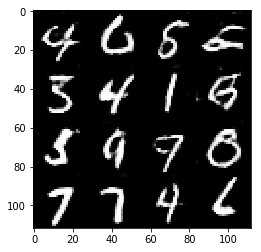

Timestamp 20170804-02-12-22.220 -  Epoch 2/2 -  Step 11710 -  D Loss: 1.0081 - G Loss: 0.7522
Timestamp 20170804-02-12-28.332 -  Epoch 2/2 -  Step 11720 -  D Loss: 0.6095 - G Loss: 1.6349
Timestamp 20170804-02-12-34.446 -  Epoch 2/2 -  Step 11730 -  D Loss: 0.8147 - G Loss: 3.0999
Timestamp 20170804-02-12-40.549 -  Epoch 2/2 -  Step 11740 -  D Loss: 0.5204 - G Loss: 2.7344
Timestamp 20170804-02-12-46.652 -  Epoch 2/2 -  Step 11750 -  D Loss: 0.6584 - G Loss: 2.7442
Timestamp 20170804-02-12-52.765 -  Epoch 2/2 -  Step 11760 -  D Loss: 1.5341 - G Loss: 1.9271
Timestamp 20170804-02-12-58.892 -  Epoch 2/2 -  Step 11770 -  D Loss: 0.9451 - G Loss: 1.6311
Timestamp 20170804-02-13-05.014 -  Epoch 2/2 -  Step 11780 -  D Loss: 0.5191 - G Loss: 1.7555
Timestamp 20170804-02-13-11.143 -  Epoch 2/2 -  Step 11790 -  D Loss: 0.6842 - G Loss: 2.1306
Timestamp 20170804-02-13-17.249 -  Epoch 2/2 -  Step 11800 -  D Loss: 0.5125 - G Loss: 3.5608


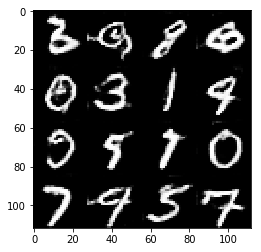

Timestamp 20170804-02-13-24.145 -  Epoch 2/2 -  Step 11810 -  D Loss: 0.9459 - G Loss: 2.1785
Timestamp 20170804-02-13-30.256 -  Epoch 2/2 -  Step 11820 -  D Loss: 1.2089 - G Loss: 1.5902
Timestamp 20170804-02-13-36.373 -  Epoch 2/2 -  Step 11830 -  D Loss: 0.6610 - G Loss: 1.1009
Timestamp 20170804-02-13-42.473 -  Epoch 2/2 -  Step 11840 -  D Loss: 0.4901 - G Loss: 2.7989
Timestamp 20170804-02-13-48.604 -  Epoch 2/2 -  Step 11850 -  D Loss: 0.8765 - G Loss: 2.8632
Timestamp 20170804-02-13-54.709 -  Epoch 2/2 -  Step 11860 -  D Loss: 0.8240 - G Loss: 0.6544
Timestamp 20170804-02-14-00.826 -  Epoch 2/2 -  Step 11870 -  D Loss: 0.5234 - G Loss: 2.2349
Timestamp 20170804-02-14-06.925 -  Epoch 2/2 -  Step 11880 -  D Loss: 0.5107 - G Loss: 2.3947
Timestamp 20170804-02-14-13.048 -  Epoch 2/2 -  Step 11890 -  D Loss: 1.1004 - G Loss: 2.4536
Timestamp 20170804-02-14-19.158 -  Epoch 2/2 -  Step 11900 -  D Loss: 0.5950 - G Loss: 2.8769


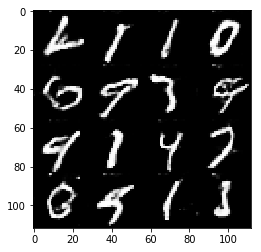

Timestamp 20170804-02-14-26.081 -  Epoch 2/2 -  Step 11910 -  D Loss: 0.4735 - G Loss: 1.8671
Timestamp 20170804-02-14-32.201 -  Epoch 2/2 -  Step 11920 -  D Loss: 0.7886 - G Loss: 0.9478
Timestamp 20170804-02-14-38.322 -  Epoch 2/2 -  Step 11930 -  D Loss: 0.9938 - G Loss: 1.2880
Timestamp 20170804-02-14-44.441 -  Epoch 2/2 -  Step 11940 -  D Loss: 1.3405 - G Loss: 1.3163
Timestamp 20170804-02-14-50.547 -  Epoch 2/2 -  Step 11950 -  D Loss: 0.6541 - G Loss: 1.6899
Timestamp 20170804-02-14-56.651 -  Epoch 2/2 -  Step 11960 -  D Loss: 0.6019 - G Loss: 2.5052
Timestamp 20170804-02-15-02.763 -  Epoch 2/2 -  Step 11970 -  D Loss: 0.8085 - G Loss: 1.7897
Timestamp 20170804-02-15-08.870 -  Epoch 2/2 -  Step 11980 -  D Loss: 0.6333 - G Loss: 2.6310
Timestamp 20170804-02-15-14.999 -  Epoch 2/2 -  Step 11990 -  D Loss: 0.6394 - G Loss: 3.5513
Timestamp 20170804-02-15-21.113 -  Epoch 2/2 -  Step 12000 -  D Loss: 0.7445 - G Loss: 2.3822


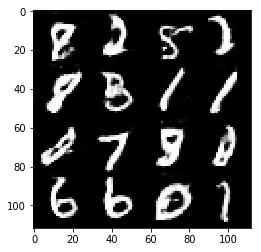

Timestamp 20170804-02-15-28.157 -  Epoch 2/2 -  Step 12010 -  D Loss: 0.7685 - G Loss: 1.2653
Timestamp 20170804-02-15-34.269 -  Epoch 2/2 -  Step 12020 -  D Loss: 0.6188 - G Loss: 1.8264
Timestamp 20170804-02-15-40.386 -  Epoch 2/2 -  Step 12030 -  D Loss: 0.7746 - G Loss: 1.1828
Timestamp 20170804-02-15-46.505 -  Epoch 2/2 -  Step 12040 -  D Loss: 0.9685 - G Loss: 2.3810
Timestamp 20170804-02-15-52.618 -  Epoch 2/2 -  Step 12050 -  D Loss: 1.0632 - G Loss: 1.1845
Timestamp 20170804-02-15-58.755 -  Epoch 2/2 -  Step 12060 -  D Loss: 0.5103 - G Loss: 2.1405
Timestamp 20170804-02-16-04.863 -  Epoch 2/2 -  Step 12070 -  D Loss: 0.9019 - G Loss: 1.8165
Timestamp 20170804-02-16-10.989 -  Epoch 2/2 -  Step 12080 -  D Loss: 0.5157 - G Loss: 2.3942
Timestamp 20170804-02-16-17.106 -  Epoch 2/2 -  Step 12090 -  D Loss: 0.4029 - G Loss: 2.4025
Timestamp 20170804-02-16-23.214 -  Epoch 2/2 -  Step 12100 -  D Loss: 0.6410 - G Loss: 2.3187


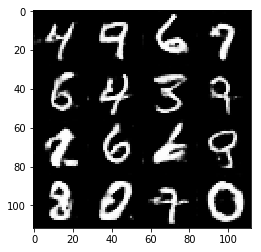

Timestamp 20170804-02-16-30.138 -  Epoch 2/2 -  Step 12110 -  D Loss: 1.3326 - G Loss: 1.2853
Timestamp 20170804-02-16-36.256 -  Epoch 2/2 -  Step 12120 -  D Loss: 0.6602 - G Loss: 4.7700
Timestamp 20170804-02-16-42.387 -  Epoch 2/2 -  Step 12130 -  D Loss: 0.7469 - G Loss: 2.9809
Timestamp 20170804-02-16-48.524 -  Epoch 2/2 -  Step 12140 -  D Loss: 0.9612 - G Loss: 1.2937
Timestamp 20170804-02-16-54.645 -  Epoch 2/2 -  Step 12150 -  D Loss: 0.8479 - G Loss: 2.0128
Timestamp 20170804-02-17-00.772 -  Epoch 2/2 -  Step 12160 -  D Loss: 0.8630 - G Loss: 2.2861
Timestamp 20170804-02-17-06.879 -  Epoch 2/2 -  Step 12170 -  D Loss: 1.0875 - G Loss: 2.1047
Timestamp 20170804-02-17-12.986 -  Epoch 2/2 -  Step 12180 -  D Loss: 0.6343 - G Loss: 2.6706
Timestamp 20170804-02-17-19.113 -  Epoch 2/2 -  Step 12190 -  D Loss: 0.5400 - G Loss: 2.2117
Timestamp 20170804-02-17-25.238 -  Epoch 2/2 -  Step 12200 -  D Loss: 0.6623 - G Loss: 2.9512


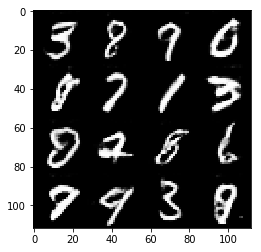

Timestamp 20170804-02-17-32.130 -  Epoch 2/2 -  Step 12210 -  D Loss: 0.7584 - G Loss: 1.9841
Timestamp 20170804-02-17-38.232 -  Epoch 2/2 -  Step 12220 -  D Loss: 0.5470 - G Loss: 1.8624
Timestamp 20170804-02-17-44.330 -  Epoch 2/2 -  Step 12230 -  D Loss: 0.6160 - G Loss: 1.7060
Timestamp 20170804-02-17-50.457 -  Epoch 2/2 -  Step 12240 -  D Loss: 0.6533 - G Loss: 1.9409
Timestamp 20170804-02-17-56.569 -  Epoch 2/2 -  Step 12250 -  D Loss: 0.6678 - G Loss: 2.8189
Timestamp 20170804-02-18-02.677 -  Epoch 2/2 -  Step 12260 -  D Loss: 0.4948 - G Loss: 1.5481
Timestamp 20170804-02-18-08.794 -  Epoch 2/2 -  Step 12270 -  D Loss: 0.7141 - G Loss: 2.9351
Timestamp 20170804-02-18-14.895 -  Epoch 2/2 -  Step 12280 -  D Loss: 0.6410 - G Loss: 2.5788
Timestamp 20170804-02-18-21.008 -  Epoch 2/2 -  Step 12290 -  D Loss: 0.4772 - G Loss: 2.4205
Timestamp 20170804-02-18-27.126 -  Epoch 2/2 -  Step 12300 -  D Loss: 0.5666 - G Loss: 2.0526


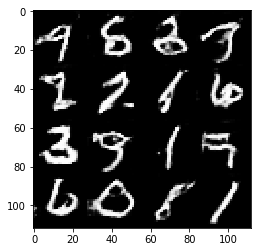

Timestamp 20170804-02-18-34.040 -  Epoch 2/2 -  Step 12310 -  D Loss: 0.6466 - G Loss: 1.9538
Timestamp 20170804-02-18-40.171 -  Epoch 2/2 -  Step 12320 -  D Loss: 0.8318 - G Loss: 2.4441
Timestamp 20170804-02-18-46.286 -  Epoch 2/2 -  Step 12330 -  D Loss: 0.4724 - G Loss: 2.6525
Timestamp 20170804-02-18-52.400 -  Epoch 2/2 -  Step 12340 -  D Loss: 0.6872 - G Loss: 1.5814
Timestamp 20170804-02-18-58.514 -  Epoch 2/2 -  Step 12350 -  D Loss: 2.0220 - G Loss: 0.7806
Timestamp 20170804-02-19-04.624 -  Epoch 2/2 -  Step 12360 -  D Loss: 0.9270 - G Loss: 1.7724
Timestamp 20170804-02-19-10.735 -  Epoch 2/2 -  Step 12370 -  D Loss: 0.6649 - G Loss: 1.9471
Timestamp 20170804-02-19-16.850 -  Epoch 2/2 -  Step 12380 -  D Loss: 0.5918 - G Loss: 3.2832
Timestamp 20170804-02-19-22.955 -  Epoch 2/2 -  Step 12390 -  D Loss: 0.9215 - G Loss: 1.5100
Timestamp 20170804-02-19-29.080 -  Epoch 2/2 -  Step 12400 -  D Loss: 0.5075 - G Loss: 2.0402


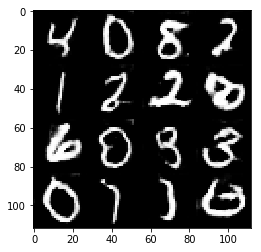

Timestamp 20170804-02-19-37.076 -  Epoch 2/2 -  Step 12410 -  D Loss: 0.8966 - G Loss: 1.4143
Timestamp 20170804-02-19-43.210 -  Epoch 2/2 -  Step 12420 -  D Loss: 0.9025 - G Loss: 1.1988
Timestamp 20170804-02-19-49.324 -  Epoch 2/2 -  Step 12430 -  D Loss: 0.7931 - G Loss: 0.5401
Timestamp 20170804-02-19-55.445 -  Epoch 2/2 -  Step 12440 -  D Loss: 0.5113 - G Loss: 2.0328
Timestamp 20170804-02-20-01.585 -  Epoch 2/2 -  Step 12450 -  D Loss: 0.5282 - G Loss: 1.7808
Timestamp 20170804-02-20-07.714 -  Epoch 2/2 -  Step 12460 -  D Loss: 0.8606 - G Loss: 1.0622
Timestamp 20170804-02-20-13.829 -  Epoch 2/2 -  Step 12470 -  D Loss: 1.2882 - G Loss: 1.5311
Timestamp 20170804-02-20-19.947 -  Epoch 2/2 -  Step 12480 -  D Loss: 0.4626 - G Loss: 2.3811
Timestamp 20170804-02-20-26.062 -  Epoch 2/2 -  Step 12490 -  D Loss: 1.0872 - G Loss: 0.9299
Timestamp 20170804-02-20-32.179 -  Epoch 2/2 -  Step 12500 -  D Loss: 0.6268 - G Loss: 2.4452


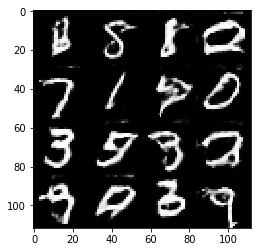

Timestamp 20170804-02-20-39.082 -  Epoch 2/2 -  Step 12510 -  D Loss: 0.4739 - G Loss: 2.7524
Timestamp 20170804-02-20-45.219 -  Epoch 2/2 -  Step 12520 -  D Loss: 0.8258 - G Loss: 1.1873
Timestamp 20170804-02-20-51.334 -  Epoch 2/2 -  Step 12530 -  D Loss: 0.8913 - G Loss: 1.4644
Timestamp 20170804-02-20-57.440 -  Epoch 2/2 -  Step 12540 -  D Loss: 0.9877 - G Loss: 2.2543
Timestamp 20170804-02-21-03.574 -  Epoch 2/2 -  Step 12550 -  D Loss: 0.8807 - G Loss: 2.4689
Timestamp 20170804-02-21-09.708 -  Epoch 2/2 -  Step 12560 -  D Loss: 0.6536 - G Loss: 1.9526
Timestamp 20170804-02-21-15.827 -  Epoch 2/2 -  Step 12570 -  D Loss: 0.4314 - G Loss: 2.5058
Timestamp 20170804-02-21-21.964 -  Epoch 2/2 -  Step 12580 -  D Loss: 0.6819 - G Loss: 1.7937
Timestamp 20170804-02-21-28.079 -  Epoch 2/2 -  Step 12590 -  D Loss: 0.6112 - G Loss: 1.7432
Timestamp 20170804-02-21-34.191 -  Epoch 2/2 -  Step 12600 -  D Loss: 0.6516 - G Loss: 1.9026


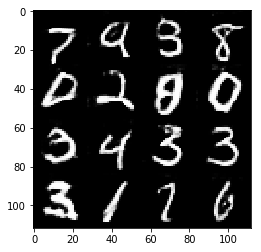

Timestamp 20170804-02-21-41.096 -  Epoch 2/2 -  Step 12610 -  D Loss: 0.8475 - G Loss: 2.4480
Timestamp 20170804-02-21-47.199 -  Epoch 2/2 -  Step 12620 -  D Loss: 0.6663 - G Loss: 1.5564
Timestamp 20170804-02-21-53.321 -  Epoch 2/2 -  Step 12630 -  D Loss: 0.7664 - G Loss: 2.8663
Timestamp 20170804-02-21-59.432 -  Epoch 2/2 -  Step 12640 -  D Loss: 0.6061 - G Loss: 1.4405
Timestamp 20170804-02-22-05.560 -  Epoch 2/2 -  Step 12650 -  D Loss: 0.7661 - G Loss: 2.1938
Timestamp 20170804-02-22-11.706 -  Epoch 2/2 -  Step 12660 -  D Loss: 0.8953 - G Loss: 2.0657
Timestamp 20170804-02-22-17.821 -  Epoch 2/2 -  Step 12670 -  D Loss: 0.8625 - G Loss: 0.9080
Timestamp 20170804-02-22-23.934 -  Epoch 2/2 -  Step 12680 -  D Loss: 1.0448 - G Loss: 2.2462
Timestamp 20170804-02-22-30.050 -  Epoch 2/2 -  Step 12690 -  D Loss: 0.6152 - G Loss: 2.2538
Timestamp 20170804-02-22-36.190 -  Epoch 2/2 -  Step 12700 -  D Loss: 0.6191 - G Loss: 2.0588


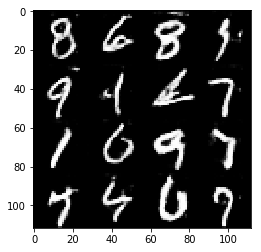

Timestamp 20170804-02-22-43.129 -  Epoch 2/2 -  Step 12710 -  D Loss: 0.7521 - G Loss: 1.2484
Timestamp 20170804-02-22-49.246 -  Epoch 2/2 -  Step 12720 -  D Loss: 1.0628 - G Loss: 1.8567
Timestamp 20170804-02-22-55.372 -  Epoch 2/2 -  Step 12730 -  D Loss: 1.0613 - G Loss: 2.5002
Timestamp 20170804-02-23-01.496 -  Epoch 2/2 -  Step 12740 -  D Loss: 0.4567 - G Loss: 2.7544
Timestamp 20170804-02-23-07.626 -  Epoch 2/2 -  Step 12750 -  D Loss: 0.7299 - G Loss: 1.9807
Timestamp 20170804-02-23-13.770 -  Epoch 2/2 -  Step 12760 -  D Loss: 0.4514 - G Loss: 1.7591
Timestamp 20170804-02-23-19.886 -  Epoch 2/2 -  Step 12770 -  D Loss: 1.1686 - G Loss: 1.4407
Timestamp 20170804-02-23-25.997 -  Epoch 2/2 -  Step 12780 -  D Loss: 0.5989 - G Loss: 0.9528
Timestamp 20170804-02-23-32.114 -  Epoch 2/2 -  Step 12790 -  D Loss: 1.1314 - G Loss: 1.9886
Timestamp 20170804-02-23-38.230 -  Epoch 2/2 -  Step 12800 -  D Loss: 0.7852 - G Loss: 1.3756


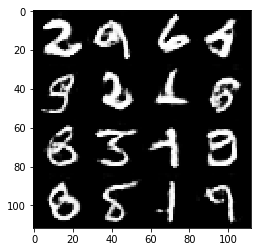

Timestamp 20170804-02-23-45.155 -  Epoch 2/2 -  Step 12810 -  D Loss: 0.3753 - G Loss: 2.7984
Timestamp 20170804-02-23-51.279 -  Epoch 2/2 -  Step 12820 -  D Loss: 0.8682 - G Loss: 0.7832
Timestamp 20170804-02-23-57.398 -  Epoch 2/2 -  Step 12830 -  D Loss: 1.1878 - G Loss: 2.0133
Timestamp 20170804-02-24-03.509 -  Epoch 2/2 -  Step 12840 -  D Loss: 1.0160 - G Loss: 1.1380
Timestamp 20170804-02-24-09.642 -  Epoch 2/2 -  Step 12850 -  D Loss: 0.5469 - G Loss: 0.7255
Timestamp 20170804-02-24-15.766 -  Epoch 2/2 -  Step 12860 -  D Loss: 0.7667 - G Loss: 3.5621
Timestamp 20170804-02-24-21.887 -  Epoch 2/2 -  Step 12870 -  D Loss: 0.4449 - G Loss: 1.6671
Timestamp 20170804-02-24-28.001 -  Epoch 2/2 -  Step 12880 -  D Loss: 0.7205 - G Loss: 0.8614
Timestamp 20170804-02-24-34.123 -  Epoch 2/2 -  Step 12890 -  D Loss: 0.6431 - G Loss: 1.9589
Timestamp 20170804-02-24-40.248 -  Epoch 2/2 -  Step 12900 -  D Loss: 0.6728 - G Loss: 2.4150


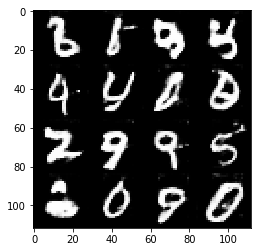

Timestamp 20170804-02-24-47.196 -  Epoch 2/2 -  Step 12910 -  D Loss: 0.7993 - G Loss: 2.0310
Timestamp 20170804-02-24-53.318 -  Epoch 2/2 -  Step 12920 -  D Loss: 0.6432 - G Loss: 3.1754
Timestamp 20170804-02-24-59.418 -  Epoch 2/2 -  Step 12930 -  D Loss: 0.8516 - G Loss: 0.7247
Timestamp 20170804-02-25-05.542 -  Epoch 2/2 -  Step 12940 -  D Loss: 0.7192 - G Loss: 1.2153
Timestamp 20170804-02-25-11.644 -  Epoch 2/2 -  Step 12950 -  D Loss: 0.6872 - G Loss: 2.1910
Timestamp 20170804-02-25-17.786 -  Epoch 2/2 -  Step 12960 -  D Loss: 0.6864 - G Loss: 2.2844
Timestamp 20170804-02-25-23.942 -  Epoch 2/2 -  Step 12970 -  D Loss: 0.4468 - G Loss: 2.2728
Timestamp 20170804-02-25-30.040 -  Epoch 2/2 -  Step 12980 -  D Loss: 0.6884 - G Loss: 0.9613
Timestamp 20170804-02-25-36.159 -  Epoch 2/2 -  Step 12990 -  D Loss: 0.9617 - G Loss: 0.9249
Timestamp 20170804-02-25-42.290 -  Epoch 2/2 -  Step 13000 -  D Loss: 0.6262 - G Loss: 2.2260


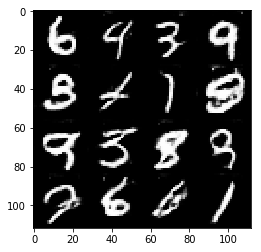

Timestamp 20170804-02-25-49.209 -  Epoch 2/2 -  Step 13010 -  D Loss: 0.9689 - G Loss: 1.4997
Timestamp 20170804-02-25-55.341 -  Epoch 2/2 -  Step 13020 -  D Loss: 0.6144 - G Loss: 1.8953
Timestamp 20170804-02-26-01.460 -  Epoch 2/2 -  Step 13030 -  D Loss: 0.6660 - G Loss: 2.9286
Timestamp 20170804-02-26-07.586 -  Epoch 2/2 -  Step 13040 -  D Loss: 0.4187 - G Loss: 2.7843
Timestamp 20170804-02-26-13.695 -  Epoch 2/2 -  Step 13050 -  D Loss: 0.6413 - G Loss: 2.4808
Timestamp 20170804-02-26-19.817 -  Epoch 2/2 -  Step 13060 -  D Loss: 0.6269 - G Loss: 2.1718
Timestamp 20170804-02-26-25.926 -  Epoch 2/2 -  Step 13070 -  D Loss: 0.8943 - G Loss: 2.5009
Timestamp 20170804-02-26-32.056 -  Epoch 2/2 -  Step 13080 -  D Loss: 0.6787 - G Loss: 0.8207
Timestamp 20170804-02-26-38.178 -  Epoch 2/2 -  Step 13090 -  D Loss: 0.4627 - G Loss: 2.7806
Timestamp 20170804-02-26-44.305 -  Epoch 2/2 -  Step 13100 -  D Loss: 1.0174 - G Loss: 1.9123


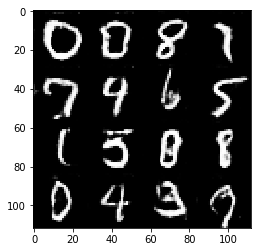

Timestamp 20170804-02-26-51.223 -  Epoch 2/2 -  Step 13110 -  D Loss: 1.0059 - G Loss: 4.1545
Timestamp 20170804-02-26-57.360 -  Epoch 2/2 -  Step 13120 -  D Loss: 0.7330 - G Loss: 1.2440
Timestamp 20170804-02-27-03.479 -  Epoch 2/2 -  Step 13130 -  D Loss: 0.7481 - G Loss: 1.4214
Timestamp 20170804-02-27-09.598 -  Epoch 2/2 -  Step 13140 -  D Loss: 0.8148 - G Loss: 3.4677
Timestamp 20170804-02-27-15.707 -  Epoch 2/2 -  Step 13150 -  D Loss: 0.3766 - G Loss: 2.8612
Timestamp 20170804-02-27-21.837 -  Epoch 2/2 -  Step 13160 -  D Loss: 0.7352 - G Loss: 2.3124
Timestamp 20170804-02-27-27.934 -  Epoch 2/2 -  Step 13170 -  D Loss: 0.4835 - G Loss: 1.9565
Timestamp 20170804-02-27-34.047 -  Epoch 2/2 -  Step 13180 -  D Loss: 0.6872 - G Loss: 2.3529
Timestamp 20170804-02-27-40.154 -  Epoch 2/2 -  Step 13190 -  D Loss: 0.8312 - G Loss: 2.2438
Timestamp 20170804-02-27-46.278 -  Epoch 2/2 -  Step 13200 -  D Loss: 0.7429 - G Loss: 2.3558


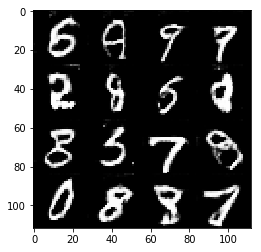

Timestamp 20170804-02-27-53.203 -  Epoch 2/2 -  Step 13210 -  D Loss: 0.6759 - G Loss: 3.6090
Timestamp 20170804-02-27-59.325 -  Epoch 2/2 -  Step 13220 -  D Loss: 0.6639 - G Loss: 2.0574
Timestamp 20170804-02-28-05.456 -  Epoch 2/2 -  Step 13230 -  D Loss: 0.5773 - G Loss: 1.1671
Timestamp 20170804-02-28-11.576 -  Epoch 2/2 -  Step 13240 -  D Loss: 0.6179 - G Loss: 2.6066
Timestamp 20170804-02-28-17.697 -  Epoch 2/2 -  Step 13250 -  D Loss: 0.9738 - G Loss: 1.5359
Timestamp 20170804-02-28-23.822 -  Epoch 2/2 -  Step 13260 -  D Loss: 0.7155 - G Loss: 1.5729
Timestamp 20170804-02-28-29.944 -  Epoch 2/2 -  Step 13270 -  D Loss: 0.7807 - G Loss: 1.4606
Timestamp 20170804-02-28-36.063 -  Epoch 2/2 -  Step 13280 -  D Loss: 0.5502 - G Loss: 1.6794
Timestamp 20170804-02-28-42.181 -  Epoch 2/2 -  Step 13290 -  D Loss: 0.8397 - G Loss: 1.7765
Timestamp 20170804-02-28-48.297 -  Epoch 2/2 -  Step 13300 -  D Loss: 0.9157 - G Loss: 1.8214


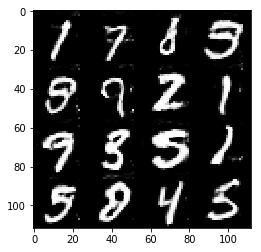

Timestamp 20170804-02-28-55.278 -  Epoch 2/2 -  Step 13310 -  D Loss: 0.9729 - G Loss: 1.2917
Timestamp 20170804-02-29-01.410 -  Epoch 2/2 -  Step 13320 -  D Loss: 0.7308 - G Loss: 1.8566
Timestamp 20170804-02-29-07.534 -  Epoch 2/2 -  Step 13330 -  D Loss: 1.2012 - G Loss: 2.1633
Timestamp 20170804-02-29-13.655 -  Epoch 2/2 -  Step 13340 -  D Loss: 0.6439 - G Loss: 1.9291
Timestamp 20170804-02-29-19.773 -  Epoch 2/2 -  Step 13350 -  D Loss: 0.5730 - G Loss: 2.0861
Timestamp 20170804-02-29-25.899 -  Epoch 2/2 -  Step 13360 -  D Loss: 0.7198 - G Loss: 0.7940
Timestamp 20170804-02-29-32.009 -  Epoch 2/2 -  Step 13370 -  D Loss: 0.7960 - G Loss: 2.1526
Timestamp 20170804-02-29-38.140 -  Epoch 2/2 -  Step 13380 -  D Loss: 0.5835 - G Loss: 1.5410
Timestamp 20170804-02-29-44.240 -  Epoch 2/2 -  Step 13390 -  D Loss: 0.5653 - G Loss: 2.1127
Timestamp 20170804-02-29-50.373 -  Epoch 2/2 -  Step 13400 -  D Loss: 0.5055 - G Loss: 2.2364


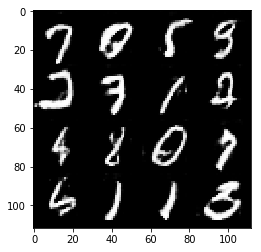

Timestamp 20170804-02-29-57.315 -  Epoch 2/2 -  Step 13410 -  D Loss: 0.6622 - G Loss: 2.7695
Timestamp 20170804-02-30-03.441 -  Epoch 2/2 -  Step 13420 -  D Loss: 0.5293 - G Loss: 2.1776
Timestamp 20170804-02-30-09.541 -  Epoch 2/2 -  Step 13430 -  D Loss: 0.6411 - G Loss: 1.0576
Timestamp 20170804-02-30-15.670 -  Epoch 2/2 -  Step 13440 -  D Loss: 0.9455 - G Loss: 2.1545
Timestamp 20170804-02-30-21.810 -  Epoch 2/2 -  Step 13450 -  D Loss: 0.7950 - G Loss: 2.7458
Timestamp 20170804-02-30-27.914 -  Epoch 2/2 -  Step 13460 -  D Loss: 1.4492 - G Loss: 0.7851
Timestamp 20170804-02-30-34.032 -  Epoch 2/2 -  Step 13470 -  D Loss: 0.9959 - G Loss: 2.6088
Timestamp 20170804-02-30-40.159 -  Epoch 2/2 -  Step 13480 -  D Loss: 1.3281 - G Loss: 1.7762
Timestamp 20170804-02-30-46.279 -  Epoch 2/2 -  Step 13490 -  D Loss: 0.5088 - G Loss: 2.4448
Timestamp 20170804-02-30-52.401 -  Epoch 2/2 -  Step 13500 -  D Loss: 0.6012 - G Loss: 2.6354


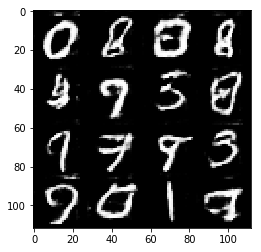

Timestamp 20170804-02-30-59.366 -  Epoch 2/2 -  Step 13510 -  D Loss: 0.8898 - G Loss: 1.1454
Timestamp 20170804-02-31-05.487 -  Epoch 2/2 -  Step 13520 -  D Loss: 0.8727 - G Loss: 1.7583
Timestamp 20170804-02-31-11.603 -  Epoch 2/2 -  Step 13530 -  D Loss: 0.4841 - G Loss: 4.0634
Timestamp 20170804-02-31-17.710 -  Epoch 2/2 -  Step 13540 -  D Loss: 1.2048 - G Loss: 1.4752
Timestamp 20170804-02-31-23.839 -  Epoch 2/2 -  Step 13550 -  D Loss: 0.4665 - G Loss: 3.0071
Timestamp 20170804-02-31-29.940 -  Epoch 2/2 -  Step 13560 -  D Loss: 0.7158 - G Loss: 1.3996
Timestamp 20170804-02-31-36.060 -  Epoch 2/2 -  Step 13570 -  D Loss: 1.0248 - G Loss: 0.5620
Timestamp 20170804-02-31-42.171 -  Epoch 2/2 -  Step 13580 -  D Loss: 0.5631 - G Loss: 2.1212
Timestamp 20170804-02-31-48.273 -  Epoch 2/2 -  Step 13590 -  D Loss: 0.4368 - G Loss: 3.7260
Timestamp 20170804-02-31-54.390 -  Epoch 2/2 -  Step 13600 -  D Loss: 0.8458 - G Loss: 3.0000


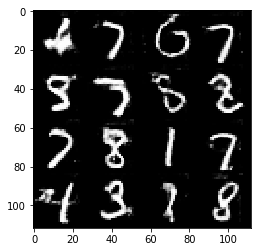

Timestamp 20170804-02-32-01.344 -  Epoch 2/2 -  Step 13610 -  D Loss: 0.5416 - G Loss: 2.6890
Timestamp 20170804-02-32-07.455 -  Epoch 2/2 -  Step 13620 -  D Loss: 1.0509 - G Loss: 1.0482
Timestamp 20170804-02-32-13.600 -  Epoch 2/2 -  Step 13630 -  D Loss: 0.4843 - G Loss: 3.4240
Timestamp 20170804-02-32-19.715 -  Epoch 2/2 -  Step 13640 -  D Loss: 1.1240 - G Loss: 1.8430
Timestamp 20170804-02-32-25.828 -  Epoch 2/2 -  Step 13650 -  D Loss: 0.5010 - G Loss: 3.0672
Timestamp 20170804-02-32-31.958 -  Epoch 2/2 -  Step 13660 -  D Loss: 1.3170 - G Loss: 2.3993
Timestamp 20170804-02-32-38.085 -  Epoch 2/2 -  Step 13670 -  D Loss: 0.5310 - G Loss: 2.0961
Timestamp 20170804-02-32-44.188 -  Epoch 2/2 -  Step 13680 -  D Loss: 0.9113 - G Loss: 1.8251
Timestamp 20170804-02-32-50.329 -  Epoch 2/2 -  Step 13690 -  D Loss: 1.0583 - G Loss: 1.4374
Timestamp 20170804-02-32-56.444 -  Epoch 2/2 -  Step 13700 -  D Loss: 0.9257 - G Loss: 1.6473


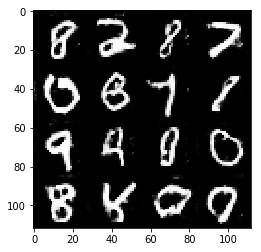

Timestamp 20170804-02-33-03.422 -  Epoch 2/2 -  Step 13710 -  D Loss: 0.6222 - G Loss: 1.9285
Timestamp 20170804-02-33-09.539 -  Epoch 2/2 -  Step 13720 -  D Loss: 0.8343 - G Loss: 2.8079
Timestamp 20170804-02-33-15.636 -  Epoch 2/2 -  Step 13730 -  D Loss: 0.6743 - G Loss: 3.1774
Timestamp 20170804-02-33-21.777 -  Epoch 2/2 -  Step 13740 -  D Loss: 0.8459 - G Loss: 1.6000
Timestamp 20170804-02-33-27.899 -  Epoch 2/2 -  Step 13750 -  D Loss: 0.5979 - G Loss: 2.2035
Timestamp 20170804-02-33-34.028 -  Epoch 2/2 -  Step 13760 -  D Loss: 0.4953 - G Loss: 2.5006
Timestamp 20170804-02-33-40.148 -  Epoch 2/2 -  Step 13770 -  D Loss: 0.5982 - G Loss: 1.3939
Timestamp 20170804-02-33-46.269 -  Epoch 2/2 -  Step 13780 -  D Loss: 0.7259 - G Loss: 2.4276
Timestamp 20170804-02-33-52.386 -  Epoch 2/2 -  Step 13790 -  D Loss: 1.0548 - G Loss: 1.6594
Timestamp 20170804-02-33-58.508 -  Epoch 2/2 -  Step 13800 -  D Loss: 1.2893 - G Loss: 1.4765


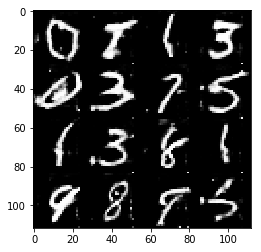

Timestamp 20170804-02-34-05.418 -  Epoch 2/2 -  Step 13810 -  D Loss: 0.5565 - G Loss: 4.1079
Timestamp 20170804-02-34-11.546 -  Epoch 2/2 -  Step 13820 -  D Loss: 0.8952 - G Loss: 2.1986
Timestamp 20170804-02-34-17.659 -  Epoch 2/2 -  Step 13830 -  D Loss: 0.8829 - G Loss: 1.7195
Timestamp 20170804-02-34-23.785 -  Epoch 2/2 -  Step 13840 -  D Loss: 0.7849 - G Loss: 1.5415
Timestamp 20170804-02-34-29.911 -  Epoch 2/2 -  Step 13850 -  D Loss: 0.5181 - G Loss: 1.6735
Timestamp 20170804-02-34-36.036 -  Epoch 2/2 -  Step 13860 -  D Loss: 0.9326 - G Loss: 3.1702
Timestamp 20170804-02-34-42.156 -  Epoch 2/2 -  Step 13870 -  D Loss: 0.5844 - G Loss: 3.1100
Timestamp 20170804-02-34-48.272 -  Epoch 2/2 -  Step 13880 -  D Loss: 0.8490 - G Loss: 3.7836
Timestamp 20170804-02-34-54.390 -  Epoch 2/2 -  Step 13890 -  D Loss: 1.0321 - G Loss: 1.9236
Timestamp 20170804-02-35-00.510 -  Epoch 2/2 -  Step 13900 -  D Loss: 0.5995 - G Loss: 1.7511


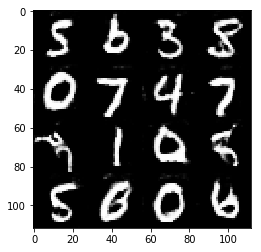

Timestamp 20170804-02-35-07.459 -  Epoch 2/2 -  Step 13910 -  D Loss: 0.6928 - G Loss: 0.8780
Timestamp 20170804-02-35-13.576 -  Epoch 2/2 -  Step 13920 -  D Loss: 1.0593 - G Loss: 3.1052
Timestamp 20170804-02-35-19.694 -  Epoch 2/2 -  Step 13930 -  D Loss: 0.4482 - G Loss: 3.4852
Timestamp 20170804-02-35-25.827 -  Epoch 2/2 -  Step 13940 -  D Loss: 0.9847 - G Loss: 1.7197
Timestamp 20170804-02-35-31.957 -  Epoch 2/2 -  Step 13950 -  D Loss: 0.6608 - G Loss: 1.9708
Timestamp 20170804-02-35-38.074 -  Epoch 2/2 -  Step 13960 -  D Loss: 0.6181 - G Loss: 1.1336
Timestamp 20170804-02-35-44.190 -  Epoch 2/2 -  Step 13970 -  D Loss: 0.6761 - G Loss: 2.4173
Timestamp 20170804-02-35-50.311 -  Epoch 2/2 -  Step 13980 -  D Loss: 0.7867 - G Loss: 2.0452
Timestamp 20170804-02-35-56.439 -  Epoch 2/2 -  Step 13990 -  D Loss: 0.8107 - G Loss: 1.4949
Timestamp 20170804-02-36-02.583 -  Epoch 2/2 -  Step 14000 -  D Loss: 1.0614 - G Loss: 1.2538


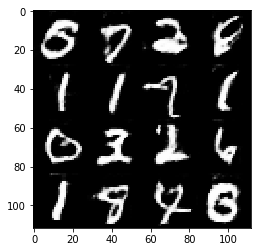

Timestamp 20170804-02-36-09.537 -  Epoch 2/2 -  Step 14010 -  D Loss: 0.8821 - G Loss: 0.6824
Timestamp 20170804-02-36-15.647 -  Epoch 2/2 -  Step 14020 -  D Loss: 0.4566 - G Loss: 2.4198
Timestamp 20170804-02-36-21.778 -  Epoch 2/2 -  Step 14030 -  D Loss: 0.7594 - G Loss: 1.9409
Timestamp 20170804-02-36-27.917 -  Epoch 2/2 -  Step 14040 -  D Loss: 0.8920 - G Loss: 0.9126
Timestamp 20170804-02-36-34.038 -  Epoch 2/2 -  Step 14050 -  D Loss: 0.5011 - G Loss: 2.1298
Timestamp 20170804-02-36-40.153 -  Epoch 2/2 -  Step 14060 -  D Loss: 0.3604 - G Loss: 3.0150
Timestamp 20170804-02-36-46.261 -  Epoch 2/2 -  Step 14070 -  D Loss: 0.4537 - G Loss: 2.0575
Timestamp 20170804-02-36-52.383 -  Epoch 2/2 -  Step 14080 -  D Loss: 0.7579 - G Loss: 1.0676
Timestamp 20170804-02-36-58.497 -  Epoch 2/2 -  Step 14090 -  D Loss: 0.5369 - G Loss: 2.6953
Timestamp 20170804-02-37-04.614 -  Epoch 2/2 -  Step 14100 -  D Loss: 0.4521 - G Loss: 2.6251


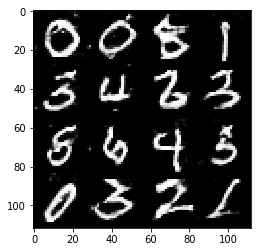

Timestamp 20170804-02-37-11.597 -  Epoch 2/2 -  Step 14110 -  D Loss: 0.5190 - G Loss: 1.7401
Timestamp 20170804-02-37-17.721 -  Epoch 2/2 -  Step 14120 -  D Loss: 1.0061 - G Loss: 2.1406
Timestamp 20170804-02-37-23.843 -  Epoch 2/2 -  Step 14130 -  D Loss: 1.0686 - G Loss: 1.4643
Timestamp 20170804-02-37-29.957 -  Epoch 2/2 -  Step 14140 -  D Loss: 0.8144 - G Loss: 2.1155
Timestamp 20170804-02-37-36.085 -  Epoch 2/2 -  Step 14150 -  D Loss: 0.7627 - G Loss: 1.3906
Timestamp 20170804-02-37-42.213 -  Epoch 2/2 -  Step 14160 -  D Loss: 0.6178 - G Loss: 3.1571
Timestamp 20170804-02-37-48.332 -  Epoch 2/2 -  Step 14170 -  D Loss: 0.6017 - G Loss: 1.4851
Timestamp 20170804-02-37-54.449 -  Epoch 2/2 -  Step 14180 -  D Loss: 1.0671 - G Loss: 1.4010
Timestamp 20170804-02-38-00.569 -  Epoch 2/2 -  Step 14190 -  D Loss: 0.8209 - G Loss: 0.7515
Timestamp 20170804-02-38-06.711 -  Epoch 2/2 -  Step 14200 -  D Loss: 0.5423 - G Loss: 3.1649


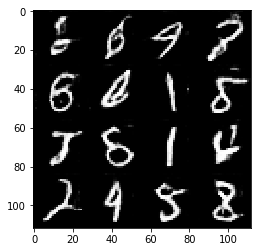

Timestamp 20170804-02-38-13.677 -  Epoch 2/2 -  Step 14210 -  D Loss: 0.6616 - G Loss: 2.0489
Timestamp 20170804-02-38-19.800 -  Epoch 2/2 -  Step 14220 -  D Loss: 0.4866 - G Loss: 3.2728
Timestamp 20170804-02-38-25.924 -  Epoch 2/2 -  Step 14230 -  D Loss: 0.8708 - G Loss: 3.8137
Timestamp 20170804-02-38-32.041 -  Epoch 2/2 -  Step 14240 -  D Loss: 1.0101 - G Loss: 1.6179
Timestamp 20170804-02-38-38.151 -  Epoch 2/2 -  Step 14250 -  D Loss: 0.5331 - G Loss: 3.7916
Timestamp 20170804-02-38-44.273 -  Epoch 2/2 -  Step 14260 -  D Loss: 1.0309 - G Loss: 1.3556
Timestamp 20170804-02-38-50.388 -  Epoch 2/2 -  Step 14270 -  D Loss: 0.4587 - G Loss: 1.9926
Timestamp 20170804-02-38-56.513 -  Epoch 2/2 -  Step 14280 -  D Loss: 0.8320 - G Loss: 1.7941
Timestamp 20170804-02-39-02.631 -  Epoch 2/2 -  Step 14290 -  D Loss: 0.5491 - G Loss: 3.7175
Timestamp 20170804-02-39-08.759 -  Epoch 2/2 -  Step 14300 -  D Loss: 0.5082 - G Loss: 2.4963


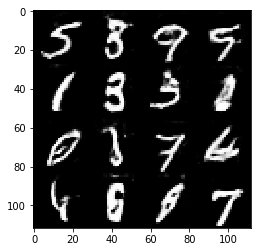

Timestamp 20170804-02-39-15.737 -  Epoch 2/2 -  Step 14310 -  D Loss: 0.5779 - G Loss: 2.1376
Timestamp 20170804-02-39-21.856 -  Epoch 2/2 -  Step 14320 -  D Loss: 0.6191 - G Loss: 1.6320
Timestamp 20170804-02-39-27.983 -  Epoch 2/2 -  Step 14330 -  D Loss: 0.9777 - G Loss: 2.2600
Timestamp 20170804-02-39-34.105 -  Epoch 2/2 -  Step 14340 -  D Loss: 1.4444 - G Loss: 0.6959
Timestamp 20170804-02-39-40.231 -  Epoch 2/2 -  Step 14350 -  D Loss: 0.5038 - G Loss: 3.2993
Timestamp 20170804-02-39-46.356 -  Epoch 2/2 -  Step 14360 -  D Loss: 0.5373 - G Loss: 1.9572
Timestamp 20170804-02-39-52.460 -  Epoch 2/2 -  Step 14370 -  D Loss: 0.8403 - G Loss: 1.0656
Timestamp 20170804-02-39-58.587 -  Epoch 2/2 -  Step 14380 -  D Loss: 0.4860 - G Loss: 2.8834
Timestamp 20170804-02-40-04.718 -  Epoch 2/2 -  Step 14390 -  D Loss: 0.5684 - G Loss: 1.9018
Timestamp 20170804-02-40-10.821 -  Epoch 2/2 -  Step 14400 -  D Loss: 0.8434 - G Loss: 1.2042


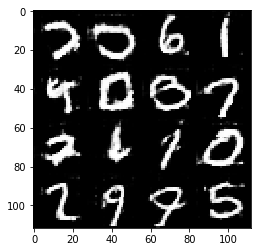

Timestamp 20170804-02-40-17.786 -  Epoch 2/2 -  Step 14410 -  D Loss: 1.5614 - G Loss: 1.7440
Timestamp 20170804-02-40-23.904 -  Epoch 2/2 -  Step 14420 -  D Loss: 0.8166 - G Loss: 3.0767
Timestamp 20170804-02-40-30.016 -  Epoch 2/2 -  Step 14430 -  D Loss: 0.6592 - G Loss: 2.5254
Timestamp 20170804-02-40-36.138 -  Epoch 2/2 -  Step 14440 -  D Loss: 0.8344 - G Loss: 1.5035
Timestamp 20170804-02-40-42.273 -  Epoch 2/2 -  Step 14450 -  D Loss: 1.1707 - G Loss: 2.2458
Timestamp 20170804-02-40-48.390 -  Epoch 2/2 -  Step 14460 -  D Loss: 0.6844 - G Loss: 1.5265
Timestamp 20170804-02-40-54.522 -  Epoch 2/2 -  Step 14470 -  D Loss: 0.4032 - G Loss: 2.7032
Timestamp 20170804-02-41-00.622 -  Epoch 2/2 -  Step 14480 -  D Loss: 0.8542 - G Loss: 1.8373
Timestamp 20170804-02-41-06.775 -  Epoch 2/2 -  Step 14490 -  D Loss: 0.9216 - G Loss: 2.7316
Timestamp 20170804-02-41-12.886 -  Epoch 2/2 -  Step 14500 -  D Loss: 0.6635 - G Loss: 3.5745


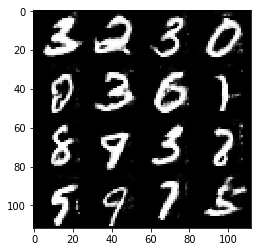

Timestamp 20170804-02-41-19.910 -  Epoch 2/2 -  Step 14510 -  D Loss: 0.8495 - G Loss: 2.5566
Timestamp 20170804-02-41-26.029 -  Epoch 2/2 -  Step 14520 -  D Loss: 0.7048 - G Loss: 3.1563
Timestamp 20170804-02-41-32.150 -  Epoch 2/2 -  Step 14530 -  D Loss: 0.9887 - G Loss: 2.1258
Timestamp 20170804-02-41-38.266 -  Epoch 2/2 -  Step 14540 -  D Loss: 0.6072 - G Loss: 2.4927
Timestamp 20170804-02-41-44.382 -  Epoch 2/2 -  Step 14550 -  D Loss: 0.8426 - G Loss: 2.0058
Timestamp 20170804-02-41-50.521 -  Epoch 2/2 -  Step 14560 -  D Loss: 0.8923 - G Loss: 1.8207
Timestamp 20170804-02-41-56.643 -  Epoch 2/2 -  Step 14570 -  D Loss: 1.4096 - G Loss: 2.0785
Timestamp 20170804-02-42-02.770 -  Epoch 2/2 -  Step 14580 -  D Loss: 0.7697 - G Loss: 1.5221
Timestamp 20170804-02-42-08.897 -  Epoch 2/2 -  Step 14590 -  D Loss: 0.6985 - G Loss: 1.4891
Timestamp 20170804-02-42-15.020 -  Epoch 2/2 -  Step 14600 -  D Loss: 0.4578 - G Loss: 2.2531


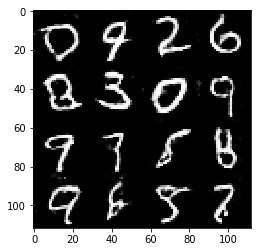

Timestamp 20170804-02-42-21.968 -  Epoch 2/2 -  Step 14610 -  D Loss: 0.5828 - G Loss: 1.8596
Timestamp 20170804-02-42-28.115 -  Epoch 2/2 -  Step 14620 -  D Loss: 0.7738 - G Loss: 3.8369
Timestamp 20170804-02-42-34.234 -  Epoch 2/2 -  Step 14630 -  D Loss: 0.5824 - G Loss: 2.0398
Timestamp 20170804-02-42-40.351 -  Epoch 2/2 -  Step 14640 -  D Loss: 0.6878 - G Loss: 2.5246
Timestamp 20170804-02-42-46.479 -  Epoch 2/2 -  Step 14650 -  D Loss: 1.3668 - G Loss: 1.9135
Timestamp 20170804-02-42-52.618 -  Epoch 2/2 -  Step 14660 -  D Loss: 1.0801 - G Loss: 2.3006
Timestamp 20170804-02-42-58.735 -  Epoch 2/2 -  Step 14670 -  D Loss: 0.6209 - G Loss: 2.5442
Timestamp 20170804-02-43-04.862 -  Epoch 2/2 -  Step 14680 -  D Loss: 0.5305 - G Loss: 1.7242
Timestamp 20170804-02-43-10.974 -  Epoch 2/2 -  Step 14690 -  D Loss: 0.6968 - G Loss: 1.9087
Timestamp 20170804-02-43-17.099 -  Epoch 2/2 -  Step 14700 -  D Loss: 1.3537 - G Loss: 1.1033


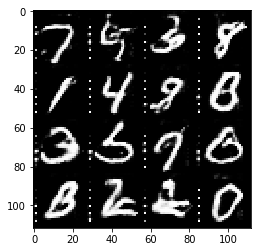

Timestamp 20170804-02-43-24.058 -  Epoch 2/2 -  Step 14710 -  D Loss: 0.8068 - G Loss: 1.8055
Timestamp 20170804-02-43-30.192 -  Epoch 2/2 -  Step 14720 -  D Loss: 0.7618 - G Loss: 2.0451
Timestamp 20170804-02-43-36.304 -  Epoch 2/2 -  Step 14730 -  D Loss: 0.7478 - G Loss: 1.2174
Timestamp 20170804-02-43-42.421 -  Epoch 2/2 -  Step 14740 -  D Loss: 0.8508 - G Loss: 1.5445
Timestamp 20170804-02-43-48.543 -  Epoch 2/2 -  Step 14750 -  D Loss: 0.8089 - G Loss: 1.3402
Timestamp 20170804-02-43-54.657 -  Epoch 2/2 -  Step 14760 -  D Loss: 1.0097 - G Loss: 1.2676
Timestamp 20170804-02-44-00.783 -  Epoch 2/2 -  Step 14770 -  D Loss: 0.6347 - G Loss: 2.9603
Timestamp 20170804-02-44-06.912 -  Epoch 2/2 -  Step 14780 -  D Loss: 0.5648 - G Loss: 1.5350
Timestamp 20170804-02-44-13.046 -  Epoch 2/2 -  Step 14790 -  D Loss: 0.4793 - G Loss: 3.2336
Timestamp 20170804-02-44-19.172 -  Epoch 2/2 -  Step 14800 -  D Loss: 1.0467 - G Loss: 0.4825


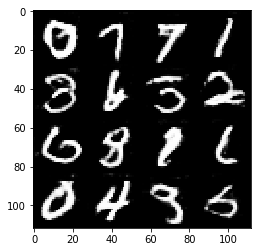

Timestamp 20170804-02-44-26.152 -  Epoch 2/2 -  Step 14810 -  D Loss: 0.9110 - G Loss: 1.6842
Timestamp 20170804-02-44-32.272 -  Epoch 2/2 -  Step 14820 -  D Loss: 0.6450 - G Loss: 1.8340
Timestamp 20170804-02-44-38.386 -  Epoch 2/2 -  Step 14830 -  D Loss: 0.7645 - G Loss: 1.7488
Timestamp 20170804-02-44-44.499 -  Epoch 2/2 -  Step 14840 -  D Loss: 0.7477 - G Loss: 2.1916
Timestamp 20170804-02-44-50.622 -  Epoch 2/2 -  Step 14850 -  D Loss: 0.9247 - G Loss: 1.8442
Timestamp 20170804-02-44-56.750 -  Epoch 2/2 -  Step 14860 -  D Loss: 0.7326 - G Loss: 1.5185
Timestamp 20170804-02-45-02.881 -  Epoch 2/2 -  Step 14870 -  D Loss: 0.6368 - G Loss: 2.6005
Timestamp 20170804-02-45-08.997 -  Epoch 2/2 -  Step 14880 -  D Loss: 0.8893 - G Loss: 0.7906
Timestamp 20170804-02-45-15.113 -  Epoch 2/2 -  Step 14890 -  D Loss: 0.5317 - G Loss: 3.0412
Timestamp 20170804-02-45-21.230 -  Epoch 2/2 -  Step 14900 -  D Loss: 0.6084 - G Loss: 1.5099


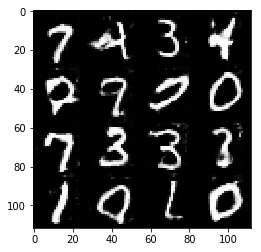

Timestamp 20170804-02-45-28.443 -  Epoch 2/2 -  Step 14910 -  D Loss: 0.7095 - G Loss: 2.5858
Timestamp 20170804-02-45-34.576 -  Epoch 2/2 -  Step 14920 -  D Loss: 1.0682 - G Loss: 0.8349
Timestamp 20170804-02-45-40.716 -  Epoch 2/2 -  Step 14930 -  D Loss: 1.0890 - G Loss: 1.9514
Timestamp 20170804-02-45-46.832 -  Epoch 2/2 -  Step 14940 -  D Loss: 0.5704 - G Loss: 2.7137
Timestamp 20170804-02-45-52.976 -  Epoch 2/2 -  Step 14950 -  D Loss: 0.6436 - G Loss: 2.1139
Timestamp 20170804-02-45-59.091 -  Epoch 2/2 -  Step 14960 -  D Loss: 0.7176 - G Loss: 3.0590
Timestamp 20170804-02-46-05.218 -  Epoch 2/2 -  Step 14970 -  D Loss: 0.7827 - G Loss: 2.9426
Timestamp 20170804-02-46-11.339 -  Epoch 2/2 -  Step 14980 -  D Loss: 0.5944 - G Loss: 2.4400
Timestamp 20170804-02-46-17.451 -  Epoch 2/2 -  Step 14990 -  D Loss: 0.5287 - G Loss: 2.6291
Timestamp 20170804-02-46-23.602 -  Epoch 2/2 -  Step 15000 -  D Loss: 0.6065 - G Loss: 2.4767


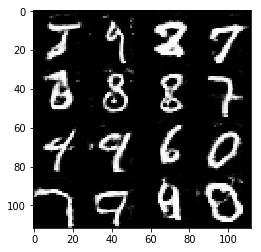

In [13]:
batch_size = 8
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Timestamp 20170803-17-47-16.769 -  Epoch 1/1 -  Step 10 -  D Loss: 0.6936 - G Loss: 2.1200
Timestamp 20170803-17-47-22.942 -  Epoch 1/1 -  Step 20 -  D Loss: 0.4740 - G Loss: 3.5230
Timestamp 20170803-17-47-29.094 -  Epoch 1/1 -  Step 30 -  D Loss: 0.4540 - G Loss: 5.5912
Timestamp 20170803-17-47-35.280 -  Epoch 1/1 -  Step 40 -  D Loss: 1.1730 - G Loss: 0.8239
Timestamp 20170803-17-47-41.461 -  Epoch 1/1 -  Step 50 -  D Loss: 0.6443 - G Loss: 3.6650
Timestamp 20170803-17-47-47.626 -  Epoch 1/1 -  Step 60 -  D Loss: 0.5778 - G Loss: 9.1156
Timestamp 20170803-17-47-53.805 -  Epoch 1/1 -  Step 70 -  D Loss: 2.9592 - G Loss: 0.2995
Timestamp 20170803-17-47-59.980 -  Epoch 1/1 -  Step 80 -  D Loss: 1.4655 - G Loss: 8.1755
Timestamp 20170803-17-48-06.143 -  Epoch 1/1 -  Step 90 -  D Loss: 0.6396 - G Loss: 7.1864
Timestamp 20170803-17-48-12.289 -  Epoch 1/1 -  Step 100 -  D Loss: 2.5066 - G Loss: 0.5415


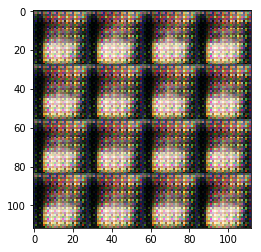

Timestamp 20170803-17-48-19.352 -  Epoch 1/1 -  Step 110 -  D Loss: 1.3039 - G Loss: 1.4286
Timestamp 20170803-17-48-25.531 -  Epoch 1/1 -  Step 120 -  D Loss: 0.6828 - G Loss: 1.3339
Timestamp 20170803-17-48-31.709 -  Epoch 1/1 -  Step 130 -  D Loss: 0.7312 - G Loss: 1.0681
Timestamp 20170803-17-48-37.866 -  Epoch 1/1 -  Step 140 -  D Loss: 0.5925 - G Loss: 6.4258
Timestamp 20170803-17-48-44.045 -  Epoch 1/1 -  Step 150 -  D Loss: 0.7734 - G Loss: 2.8120
Timestamp 20170803-17-48-50.219 -  Epoch 1/1 -  Step 160 -  D Loss: 0.6601 - G Loss: 3.2768
Timestamp 20170803-17-48-56.373 -  Epoch 1/1 -  Step 170 -  D Loss: 0.6947 - G Loss: 3.6704
Timestamp 20170803-17-49-02.557 -  Epoch 1/1 -  Step 180 -  D Loss: 0.5988 - G Loss: 2.4412
Timestamp 20170803-17-49-08.735 -  Epoch 1/1 -  Step 190 -  D Loss: 0.6108 - G Loss: 3.3889
Timestamp 20170803-17-49-14.905 -  Epoch 1/1 -  Step 200 -  D Loss: 0.7372 - G Loss: 2.1109


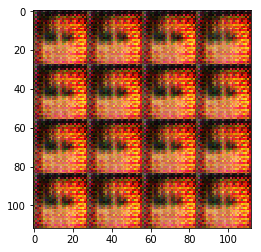

Timestamp 20170803-17-49-21.545 -  Epoch 1/1 -  Step 210 -  D Loss: 0.4356 - G Loss: 3.8694
Timestamp 20170803-17-49-27.715 -  Epoch 1/1 -  Step 220 -  D Loss: 0.8143 - G Loss: 2.5918
Timestamp 20170803-17-49-33.880 -  Epoch 1/1 -  Step 230 -  D Loss: 0.4188 - G Loss: 4.7439
Timestamp 20170803-17-49-40.049 -  Epoch 1/1 -  Step 240 -  D Loss: 0.5435 - G Loss: 2.5665
Timestamp 20170803-17-49-46.230 -  Epoch 1/1 -  Step 250 -  D Loss: 0.4677 - G Loss: 3.3862
Timestamp 20170803-17-49-52.402 -  Epoch 1/1 -  Step 260 -  D Loss: 0.5458 - G Loss: 3.5869
Timestamp 20170803-17-49-58.571 -  Epoch 1/1 -  Step 270 -  D Loss: 0.4867 - G Loss: 3.7485
Timestamp 20170803-17-50-04.733 -  Epoch 1/1 -  Step 280 -  D Loss: 0.5639 - G Loss: 4.8585
Timestamp 20170803-17-50-10.916 -  Epoch 1/1 -  Step 290 -  D Loss: 0.3854 - G Loss: 3.9022
Timestamp 20170803-17-50-17.086 -  Epoch 1/1 -  Step 300 -  D Loss: 0.5723 - G Loss: 2.6758


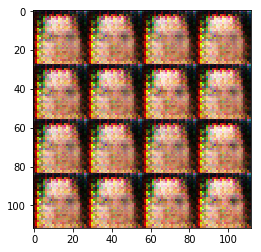

Timestamp 20170803-17-50-23.817 -  Epoch 1/1 -  Step 310 -  D Loss: 0.5256 - G Loss: 3.7443
Timestamp 20170803-17-50-29.989 -  Epoch 1/1 -  Step 320 -  D Loss: 0.4539 - G Loss: 2.2568
Timestamp 20170803-17-50-36.205 -  Epoch 1/1 -  Step 330 -  D Loss: 0.6533 - G Loss: 1.8865
Timestamp 20170803-17-50-42.373 -  Epoch 1/1 -  Step 340 -  D Loss: 0.5475 - G Loss: 3.2709
Timestamp 20170803-17-50-48.550 -  Epoch 1/1 -  Step 350 -  D Loss: 0.4549 - G Loss: 3.3100
Timestamp 20170803-17-50-54.713 -  Epoch 1/1 -  Step 360 -  D Loss: 0.7483 - G Loss: 2.0710
Timestamp 20170803-17-51-00.892 -  Epoch 1/1 -  Step 370 -  D Loss: 0.7615 - G Loss: 2.4802
Timestamp 20170803-17-51-07.065 -  Epoch 1/1 -  Step 380 -  D Loss: 0.4120 - G Loss: 3.6174
Timestamp 20170803-17-51-13.252 -  Epoch 1/1 -  Step 390 -  D Loss: 0.4178 - G Loss: 4.5806
Timestamp 20170803-17-51-19.424 -  Epoch 1/1 -  Step 400 -  D Loss: 0.3879 - G Loss: 4.6347


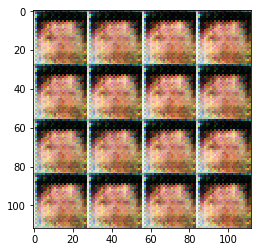

Timestamp 20170803-17-51-26.099 -  Epoch 1/1 -  Step 410 -  D Loss: 0.4671 - G Loss: 3.7232
Timestamp 20170803-17-51-32.288 -  Epoch 1/1 -  Step 420 -  D Loss: 0.4277 - G Loss: 2.9883
Timestamp 20170803-17-51-38.460 -  Epoch 1/1 -  Step 430 -  D Loss: 0.4449 - G Loss: 3.8419
Timestamp 20170803-17-51-44.644 -  Epoch 1/1 -  Step 440 -  D Loss: 0.5534 - G Loss: 2.5106
Timestamp 20170803-17-51-50.816 -  Epoch 1/1 -  Step 450 -  D Loss: 0.5286 - G Loss: 3.4361
Timestamp 20170803-17-51-56.978 -  Epoch 1/1 -  Step 460 -  D Loss: 0.4515 - G Loss: 2.9339
Timestamp 20170803-17-52-03.137 -  Epoch 1/1 -  Step 470 -  D Loss: 0.4422 - G Loss: 3.2196
Timestamp 20170803-17-52-09.310 -  Epoch 1/1 -  Step 480 -  D Loss: 0.4452 - G Loss: 3.8518
Timestamp 20170803-17-52-15.495 -  Epoch 1/1 -  Step 490 -  D Loss: 0.4430 - G Loss: 3.2913
Timestamp 20170803-17-52-21.662 -  Epoch 1/1 -  Step 500 -  D Loss: 0.3970 - G Loss: 3.9404


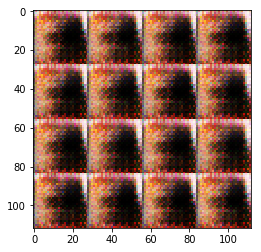

Timestamp 20170803-17-52-28.335 -  Epoch 1/1 -  Step 510 -  D Loss: 0.5204 - G Loss: 2.9397
Timestamp 20170803-17-52-34.506 -  Epoch 1/1 -  Step 520 -  D Loss: 0.4084 - G Loss: 4.4071
Timestamp 20170803-17-52-40.675 -  Epoch 1/1 -  Step 530 -  D Loss: 0.4232 - G Loss: 3.4395
Timestamp 20170803-17-52-46.838 -  Epoch 1/1 -  Step 540 -  D Loss: 0.5756 - G Loss: 2.4639
Timestamp 20170803-17-52-53.025 -  Epoch 1/1 -  Step 550 -  D Loss: 0.4172 - G Loss: 4.3927
Timestamp 20170803-17-52-59.183 -  Epoch 1/1 -  Step 560 -  D Loss: 0.4140 - G Loss: 3.6365
Timestamp 20170803-17-53-05.354 -  Epoch 1/1 -  Step 570 -  D Loss: 0.6014 - G Loss: 2.9314
Timestamp 20170803-17-53-11.533 -  Epoch 1/1 -  Step 580 -  D Loss: 0.4726 - G Loss: 2.1419
Timestamp 20170803-17-53-17.711 -  Epoch 1/1 -  Step 590 -  D Loss: 0.4300 - G Loss: 2.7160
Timestamp 20170803-17-53-23.904 -  Epoch 1/1 -  Step 600 -  D Loss: 0.3978 - G Loss: 5.2967


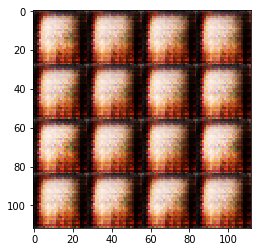

Timestamp 20170803-17-53-30.561 -  Epoch 1/1 -  Step 610 -  D Loss: 0.5176 - G Loss: 2.3255
Timestamp 20170803-17-53-36.758 -  Epoch 1/1 -  Step 620 -  D Loss: 0.6586 - G Loss: 1.4469
Timestamp 20170803-17-53-42.927 -  Epoch 1/1 -  Step 630 -  D Loss: 0.9743 - G Loss: 1.2626
Timestamp 20170803-17-53-49.134 -  Epoch 1/1 -  Step 640 -  D Loss: 0.7983 - G Loss: 1.8666
Timestamp 20170803-17-53-55.316 -  Epoch 1/1 -  Step 650 -  D Loss: 1.2505 - G Loss: 1.1153
Timestamp 20170803-17-54-01.484 -  Epoch 1/1 -  Step 660 -  D Loss: 0.7576 - G Loss: 2.3316
Timestamp 20170803-17-54-07.650 -  Epoch 1/1 -  Step 670 -  D Loss: 1.2370 - G Loss: 0.7387
Timestamp 20170803-17-54-13.808 -  Epoch 1/1 -  Step 680 -  D Loss: 0.9988 - G Loss: 1.4572
Timestamp 20170803-17-54-19.988 -  Epoch 1/1 -  Step 690 -  D Loss: 0.9027 - G Loss: 0.9560
Timestamp 20170803-17-54-26.172 -  Epoch 1/1 -  Step 700 -  D Loss: 0.6505 - G Loss: 2.3532


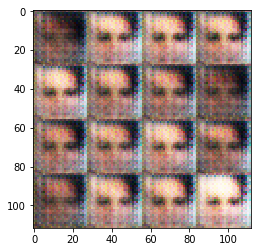

Timestamp 20170803-17-54-33.001 -  Epoch 1/1 -  Step 710 -  D Loss: 1.0724 - G Loss: 1.6785
Timestamp 20170803-17-54-39.166 -  Epoch 1/1 -  Step 720 -  D Loss: 0.5896 - G Loss: 3.1279
Timestamp 20170803-17-54-45.361 -  Epoch 1/1 -  Step 730 -  D Loss: 1.0283 - G Loss: 0.8763
Timestamp 20170803-17-54-51.529 -  Epoch 1/1 -  Step 740 -  D Loss: 0.7947 - G Loss: 1.1118
Timestamp 20170803-17-54-57.728 -  Epoch 1/1 -  Step 750 -  D Loss: 0.6036 - G Loss: 1.9003
Timestamp 20170803-17-55-03.890 -  Epoch 1/1 -  Step 760 -  D Loss: 0.5859 - G Loss: 3.8405
Timestamp 20170803-17-55-10.058 -  Epoch 1/1 -  Step 770 -  D Loss: 0.6104 - G Loss: 1.7101
Timestamp 20170803-17-55-16.234 -  Epoch 1/1 -  Step 780 -  D Loss: 0.5876 - G Loss: 1.8576
Timestamp 20170803-17-55-22.426 -  Epoch 1/1 -  Step 790 -  D Loss: 0.5036 - G Loss: 2.7652
Timestamp 20170803-17-55-28.599 -  Epoch 1/1 -  Step 800 -  D Loss: 0.5570 - G Loss: 4.4727


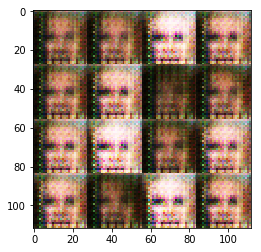

Timestamp 20170803-17-55-35.279 -  Epoch 1/1 -  Step 810 -  D Loss: 0.9541 - G Loss: 1.7186
Timestamp 20170803-17-55-41.450 -  Epoch 1/1 -  Step 820 -  D Loss: 0.6144 - G Loss: 2.2269
Timestamp 20170803-17-55-47.620 -  Epoch 1/1 -  Step 830 -  D Loss: 0.5565 - G Loss: 3.1919
Timestamp 20170803-17-55-53.784 -  Epoch 1/1 -  Step 840 -  D Loss: 0.4207 - G Loss: 4.0102
Timestamp 20170803-17-55-59.971 -  Epoch 1/1 -  Step 850 -  D Loss: 0.6206 - G Loss: 2.2484
Timestamp 20170803-17-56-06.152 -  Epoch 1/1 -  Step 860 -  D Loss: 0.4770 - G Loss: 1.9346
Timestamp 20170803-17-56-12.337 -  Epoch 1/1 -  Step 870 -  D Loss: 0.5150 - G Loss: 3.1063
Timestamp 20170803-17-56-18.530 -  Epoch 1/1 -  Step 880 -  D Loss: 1.0825 - G Loss: 0.8342
Timestamp 20170803-17-56-24.694 -  Epoch 1/1 -  Step 890 -  D Loss: 0.8076 - G Loss: 2.0372
Timestamp 20170803-17-56-30.855 -  Epoch 1/1 -  Step 900 -  D Loss: 0.8312 - G Loss: 1.6074


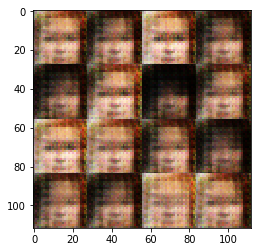

Timestamp 20170803-17-56-37.525 -  Epoch 1/1 -  Step 910 -  D Loss: 0.5221 - G Loss: 2.3812
Timestamp 20170803-17-56-43.688 -  Epoch 1/1 -  Step 920 -  D Loss: 0.7607 - G Loss: 2.1058
Timestamp 20170803-17-56-49.856 -  Epoch 1/1 -  Step 930 -  D Loss: 0.5414 - G Loss: 2.6707
Timestamp 20170803-17-56-56.031 -  Epoch 1/1 -  Step 940 -  D Loss: 0.8401 - G Loss: 3.3076
Timestamp 20170803-17-57-02.231 -  Epoch 1/1 -  Step 950 -  D Loss: 0.5934 - G Loss: 1.9217
Timestamp 20170803-17-57-08.396 -  Epoch 1/1 -  Step 960 -  D Loss: 0.6006 - G Loss: 2.7450
Timestamp 20170803-17-57-14.560 -  Epoch 1/1 -  Step 970 -  D Loss: 0.7788 - G Loss: 1.6743
Timestamp 20170803-17-57-20.741 -  Epoch 1/1 -  Step 980 -  D Loss: 1.2000 - G Loss: 0.6702
Timestamp 20170803-17-57-26.907 -  Epoch 1/1 -  Step 990 -  D Loss: 1.6491 - G Loss: 0.7483
Timestamp 20170803-17-57-33.071 -  Epoch 1/1 -  Step 1000 -  D Loss: 0.5132 - G Loss: 2.4913


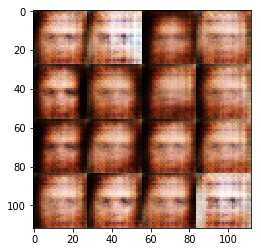

Timestamp 20170803-17-57-39.743 -  Epoch 1/1 -  Step 1010 -  D Loss: 0.8111 - G Loss: 1.9003
Timestamp 20170803-17-57-45.906 -  Epoch 1/1 -  Step 1020 -  D Loss: 1.8660 - G Loss: 0.6400
Timestamp 20170803-17-57-52.081 -  Epoch 1/1 -  Step 1030 -  D Loss: 1.5397 - G Loss: 1.4565
Timestamp 20170803-17-57-58.298 -  Epoch 1/1 -  Step 1040 -  D Loss: 0.6534 - G Loss: 2.0779
Timestamp 20170803-17-58-04.464 -  Epoch 1/1 -  Step 1050 -  D Loss: 0.8978 - G Loss: 1.1176
Timestamp 20170803-17-58-10.646 -  Epoch 1/1 -  Step 1060 -  D Loss: 0.6039 - G Loss: 1.7350
Timestamp 20170803-17-58-16.811 -  Epoch 1/1 -  Step 1070 -  D Loss: 1.2808 - G Loss: 1.2904
Timestamp 20170803-17-58-22.945 -  Epoch 1/1 -  Step 1080 -  D Loss: 0.9692 - G Loss: 1.7609
Timestamp 20170803-17-58-29.114 -  Epoch 1/1 -  Step 1090 -  D Loss: 0.8009 - G Loss: 1.3994
Timestamp 20170803-17-58-35.285 -  Epoch 1/1 -  Step 1100 -  D Loss: 0.5675 - G Loss: 1.7948


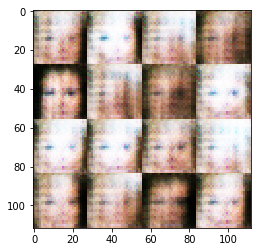

Timestamp 20170803-17-58-41.957 -  Epoch 1/1 -  Step 1110 -  D Loss: 2.6186 - G Loss: 0.1940
Timestamp 20170803-17-58-48.123 -  Epoch 1/1 -  Step 1120 -  D Loss: 1.0840 - G Loss: 1.0538
Timestamp 20170803-17-58-54.300 -  Epoch 1/1 -  Step 1130 -  D Loss: 0.9778 - G Loss: 1.4018
Timestamp 20170803-17-59-00.475 -  Epoch 1/1 -  Step 1140 -  D Loss: 0.9742 - G Loss: 2.2045
Timestamp 20170803-17-59-06.643 -  Epoch 1/1 -  Step 1150 -  D Loss: 1.0006 - G Loss: 0.7419
Timestamp 20170803-17-59-12.811 -  Epoch 1/1 -  Step 1160 -  D Loss: 0.9665 - G Loss: 1.3103
Timestamp 20170803-17-59-18.973 -  Epoch 1/1 -  Step 1170 -  D Loss: 1.3492 - G Loss: 0.9824
Timestamp 20170803-17-59-25.138 -  Epoch 1/1 -  Step 1180 -  D Loss: 1.0758 - G Loss: 1.5910
Timestamp 20170803-17-59-31.295 -  Epoch 1/1 -  Step 1190 -  D Loss: 1.1035 - G Loss: 1.1440
Timestamp 20170803-17-59-37.464 -  Epoch 1/1 -  Step 1200 -  D Loss: 1.2339 - G Loss: 0.5506


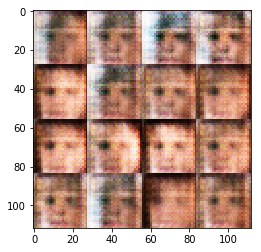

Timestamp 20170803-17-59-44.121 -  Epoch 1/1 -  Step 1210 -  D Loss: 1.1751 - G Loss: 1.0506
Timestamp 20170803-17-59-50.341 -  Epoch 1/1 -  Step 1220 -  D Loss: 0.7218 - G Loss: 1.9050
Timestamp 20170803-17-59-56.508 -  Epoch 1/1 -  Step 1230 -  D Loss: 0.7790 - G Loss: 1.3620
Timestamp 20170803-18-00-02.670 -  Epoch 1/1 -  Step 1240 -  D Loss: 1.0426 - G Loss: 4.2164
Timestamp 20170803-18-00-08.848 -  Epoch 1/1 -  Step 1250 -  D Loss: 0.5349 - G Loss: 2.1839
Timestamp 20170803-18-00-15.014 -  Epoch 1/1 -  Step 1260 -  D Loss: 0.7595 - G Loss: 2.1632
Timestamp 20170803-18-00-21.168 -  Epoch 1/1 -  Step 1270 -  D Loss: 0.7568 - G Loss: 1.7272
Timestamp 20170803-18-00-27.321 -  Epoch 1/1 -  Step 1280 -  D Loss: 0.7254 - G Loss: 2.7283
Timestamp 20170803-18-00-33.515 -  Epoch 1/1 -  Step 1290 -  D Loss: 1.1161 - G Loss: 1.2924
Timestamp 20170803-18-00-39.680 -  Epoch 1/1 -  Step 1300 -  D Loss: 0.8914 - G Loss: 2.2067


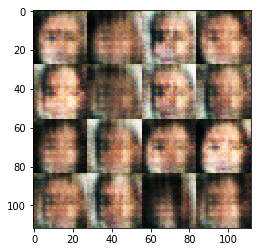

Timestamp 20170803-18-00-46.355 -  Epoch 1/1 -  Step 1310 -  D Loss: 1.2061 - G Loss: 1.3945
Timestamp 20170803-18-00-52.540 -  Epoch 1/1 -  Step 1320 -  D Loss: 0.9251 - G Loss: 1.5186
Timestamp 20170803-18-00-58.702 -  Epoch 1/1 -  Step 1330 -  D Loss: 0.8511 - G Loss: 2.4373
Timestamp 20170803-18-01-04.863 -  Epoch 1/1 -  Step 1340 -  D Loss: 1.2708 - G Loss: 1.0755
Timestamp 20170803-18-01-11.063 -  Epoch 1/1 -  Step 1350 -  D Loss: 0.9287 - G Loss: 1.1948
Timestamp 20170803-18-01-17.239 -  Epoch 1/1 -  Step 1360 -  D Loss: 0.8322 - G Loss: 1.2106
Timestamp 20170803-18-01-23.396 -  Epoch 1/1 -  Step 1370 -  D Loss: 0.7559 - G Loss: 1.0564
Timestamp 20170803-18-01-29.566 -  Epoch 1/1 -  Step 1380 -  D Loss: 0.8667 - G Loss: 1.2210
Timestamp 20170803-18-01-35.723 -  Epoch 1/1 -  Step 1390 -  D Loss: 0.8251 - G Loss: 4.5679
Timestamp 20170803-18-01-41.895 -  Epoch 1/1 -  Step 1400 -  D Loss: 1.2604 - G Loss: 1.1336


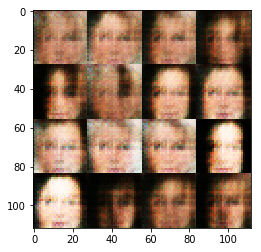

Timestamp 20170803-18-01-48.680 -  Epoch 1/1 -  Step 1410 -  D Loss: 1.0254 - G Loss: 1.2284
Timestamp 20170803-18-01-54.856 -  Epoch 1/1 -  Step 1420 -  D Loss: 0.8792 - G Loss: 2.1803
Timestamp 20170803-18-02-01.040 -  Epoch 1/1 -  Step 1430 -  D Loss: 0.6414 - G Loss: 2.2029
Timestamp 20170803-18-02-07.206 -  Epoch 1/1 -  Step 1440 -  D Loss: 0.6274 - G Loss: 1.6449
Timestamp 20170803-18-02-13.384 -  Epoch 1/1 -  Step 1450 -  D Loss: 0.5675 - G Loss: 2.8315
Timestamp 20170803-18-02-19.547 -  Epoch 1/1 -  Step 1460 -  D Loss: 0.5758 - G Loss: 2.8209
Timestamp 20170803-18-02-25.714 -  Epoch 1/1 -  Step 1470 -  D Loss: 0.5995 - G Loss: 3.1483
Timestamp 20170803-18-02-31.871 -  Epoch 1/1 -  Step 1480 -  D Loss: 0.5444 - G Loss: 4.2598
Timestamp 20170803-18-02-38.042 -  Epoch 1/1 -  Step 1490 -  D Loss: 0.9375 - G Loss: 2.2408
Timestamp 20170803-18-02-44.221 -  Epoch 1/1 -  Step 1500 -  D Loss: 0.6106 - G Loss: 2.1721


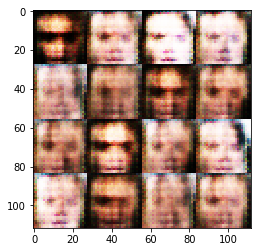

Timestamp 20170803-18-02-50.907 -  Epoch 1/1 -  Step 1510 -  D Loss: 0.8952 - G Loss: 0.8646
Timestamp 20170803-18-02-57.083 -  Epoch 1/1 -  Step 1520 -  D Loss: 0.7294 - G Loss: 1.3412
Timestamp 20170803-18-03-03.249 -  Epoch 1/1 -  Step 1530 -  D Loss: 0.7443 - G Loss: 1.6743
Timestamp 20170803-18-03-09.414 -  Epoch 1/1 -  Step 1540 -  D Loss: 0.5235 - G Loss: 1.5771
Timestamp 20170803-18-03-15.597 -  Epoch 1/1 -  Step 1550 -  D Loss: 0.7552 - G Loss: 1.8627
Timestamp 20170803-18-03-21.759 -  Epoch 1/1 -  Step 1560 -  D Loss: 0.8777 - G Loss: 1.2166
Timestamp 20170803-18-03-27.911 -  Epoch 1/1 -  Step 1570 -  D Loss: 0.7133 - G Loss: 1.8275
Timestamp 20170803-18-03-34.082 -  Epoch 1/1 -  Step 1580 -  D Loss: 0.5095 - G Loss: 2.2822
Timestamp 20170803-18-03-40.260 -  Epoch 1/1 -  Step 1590 -  D Loss: 1.3421 - G Loss: 1.9249
Timestamp 20170803-18-03-46.446 -  Epoch 1/1 -  Step 1600 -  D Loss: 0.6120 - G Loss: 4.3169


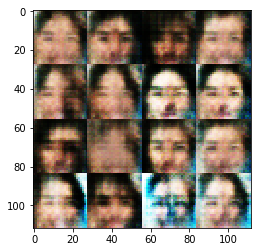

Timestamp 20170803-18-03-53.140 -  Epoch 1/1 -  Step 1610 -  D Loss: 1.3954 - G Loss: 0.8356
Timestamp 20170803-18-03-59.304 -  Epoch 1/1 -  Step 1620 -  D Loss: 1.0489 - G Loss: 2.5608
Timestamp 20170803-18-04-05.464 -  Epoch 1/1 -  Step 1630 -  D Loss: 0.8285 - G Loss: 1.2328
Timestamp 20170803-18-04-11.638 -  Epoch 1/1 -  Step 1640 -  D Loss: 0.6691 - G Loss: 2.6709
Timestamp 20170803-18-04-17.795 -  Epoch 1/1 -  Step 1650 -  D Loss: 0.7708 - G Loss: 1.3211
Timestamp 20170803-18-04-23.949 -  Epoch 1/1 -  Step 1660 -  D Loss: 0.7470 - G Loss: 1.3334
Timestamp 20170803-18-04-30.126 -  Epoch 1/1 -  Step 1670 -  D Loss: 0.4677 - G Loss: 2.1267
Timestamp 20170803-18-04-36.312 -  Epoch 1/1 -  Step 1680 -  D Loss: 0.6579 - G Loss: 2.6195
Timestamp 20170803-18-04-42.471 -  Epoch 1/1 -  Step 1690 -  D Loss: 0.8495 - G Loss: 1.5697
Timestamp 20170803-18-04-48.626 -  Epoch 1/1 -  Step 1700 -  D Loss: 0.8674 - G Loss: 1.2257


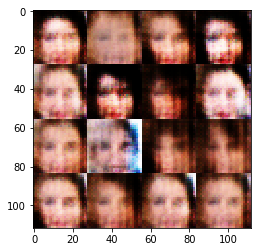

Timestamp 20170803-18-04-55.330 -  Epoch 1/1 -  Step 1710 -  D Loss: 0.4743 - G Loss: 3.9493
Timestamp 20170803-18-05-01.506 -  Epoch 1/1 -  Step 1720 -  D Loss: 0.8864 - G Loss: 1.6575
Timestamp 20170803-18-05-07.699 -  Epoch 1/1 -  Step 1730 -  D Loss: 1.4738 - G Loss: 1.0448
Timestamp 20170803-18-05-13.895 -  Epoch 1/1 -  Step 1740 -  D Loss: 0.5173 - G Loss: 2.4859
Timestamp 20170803-18-05-20.093 -  Epoch 1/1 -  Step 1750 -  D Loss: 0.7488 - G Loss: 0.9122
Timestamp 20170803-18-05-26.294 -  Epoch 1/1 -  Step 1760 -  D Loss: 1.1593 - G Loss: 0.6894
Timestamp 20170803-18-05-32.487 -  Epoch 1/1 -  Step 1770 -  D Loss: 1.6606 - G Loss: 0.7552
Timestamp 20170803-18-05-38.655 -  Epoch 1/1 -  Step 1780 -  D Loss: 0.6915 - G Loss: 1.9389
Timestamp 20170803-18-05-44.824 -  Epoch 1/1 -  Step 1790 -  D Loss: 0.8933 - G Loss: 2.2938
Timestamp 20170803-18-05-51.083 -  Epoch 1/1 -  Step 1800 -  D Loss: 0.7396 - G Loss: 2.3893


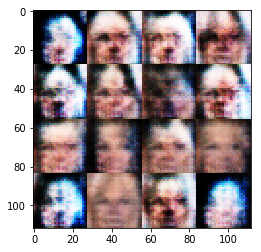

Timestamp 20170803-18-05-57.941 -  Epoch 1/1 -  Step 1810 -  D Loss: 0.6607 - G Loss: 2.2918
Timestamp 20170803-18-06-04.097 -  Epoch 1/1 -  Step 1820 -  D Loss: 0.9023 - G Loss: 4.0703
Timestamp 20170803-18-06-10.290 -  Epoch 1/1 -  Step 1830 -  D Loss: 0.5521 - G Loss: 1.9626
Timestamp 20170803-18-06-16.474 -  Epoch 1/1 -  Step 1840 -  D Loss: 0.6150 - G Loss: 1.5068
Timestamp 20170803-18-06-22.666 -  Epoch 1/1 -  Step 1850 -  D Loss: 0.8064 - G Loss: 3.2109
Timestamp 20170803-18-06-28.863 -  Epoch 1/1 -  Step 1860 -  D Loss: 0.8706 - G Loss: 2.2222
Timestamp 20170803-18-06-35.093 -  Epoch 1/1 -  Step 1870 -  D Loss: 0.5183 - G Loss: 4.6593
Timestamp 20170803-18-06-41.324 -  Epoch 1/1 -  Step 1880 -  D Loss: 1.1402 - G Loss: 0.8730
Timestamp 20170803-18-06-47.509 -  Epoch 1/1 -  Step 1890 -  D Loss: 0.4919 - G Loss: 4.6644
Timestamp 20170803-18-06-53.678 -  Epoch 1/1 -  Step 1900 -  D Loss: 0.5148 - G Loss: 2.3007


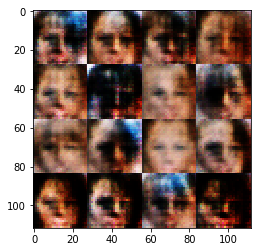

Timestamp 20170803-18-07-00.364 -  Epoch 1/1 -  Step 1910 -  D Loss: 0.7334 - G Loss: 3.2896
Timestamp 20170803-18-07-06.535 -  Epoch 1/1 -  Step 1920 -  D Loss: 1.4025 - G Loss: 1.1041
Timestamp 20170803-18-07-12.714 -  Epoch 1/1 -  Step 1930 -  D Loss: 0.6336 - G Loss: 2.8591
Timestamp 20170803-18-07-18.879 -  Epoch 1/1 -  Step 1940 -  D Loss: 0.7849 - G Loss: 4.2087
Timestamp 20170803-18-07-25.045 -  Epoch 1/1 -  Step 1950 -  D Loss: 0.7753 - G Loss: 1.3053
Timestamp 20170803-18-07-31.216 -  Epoch 1/1 -  Step 1960 -  D Loss: 0.7872 - G Loss: 1.6200
Timestamp 20170803-18-07-37.386 -  Epoch 1/1 -  Step 1970 -  D Loss: 0.7189 - G Loss: 2.6185
Timestamp 20170803-18-07-43.536 -  Epoch 1/1 -  Step 1980 -  D Loss: 0.7888 - G Loss: 2.4389
Timestamp 20170803-18-07-49.700 -  Epoch 1/1 -  Step 1990 -  D Loss: 0.4677 - G Loss: 3.1173
Timestamp 20170803-18-07-55.863 -  Epoch 1/1 -  Step 2000 -  D Loss: 1.0563 - G Loss: 1.6514


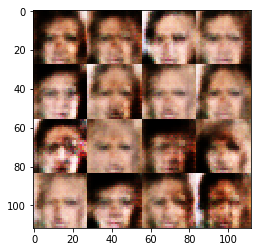

Timestamp 20170803-18-08-02.546 -  Epoch 1/1 -  Step 2010 -  D Loss: 0.8597 - G Loss: 2.3272
Timestamp 20170803-18-08-08.703 -  Epoch 1/1 -  Step 2020 -  D Loss: 0.8060 - G Loss: 1.6199
Timestamp 20170803-18-08-14.915 -  Epoch 1/1 -  Step 2030 -  D Loss: 0.9840 - G Loss: 3.1334
Timestamp 20170803-18-08-21.092 -  Epoch 1/1 -  Step 2040 -  D Loss: 1.0780 - G Loss: 1.0157
Timestamp 20170803-18-08-27.252 -  Epoch 1/1 -  Step 2050 -  D Loss: 0.8936 - G Loss: 1.3766
Timestamp 20170803-18-08-33.429 -  Epoch 1/1 -  Step 2060 -  D Loss: 0.9719 - G Loss: 2.1577
Timestamp 20170803-18-08-39.626 -  Epoch 1/1 -  Step 2070 -  D Loss: 0.6213 - G Loss: 1.5242
Timestamp 20170803-18-08-45.820 -  Epoch 1/1 -  Step 2080 -  D Loss: 0.6119 - G Loss: 2.4659
Timestamp 20170803-18-08-52.003 -  Epoch 1/1 -  Step 2090 -  D Loss: 0.6874 - G Loss: 1.4713
Timestamp 20170803-18-08-58.208 -  Epoch 1/1 -  Step 2100 -  D Loss: 0.7119 - G Loss: 2.6203


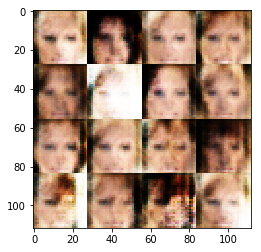

Timestamp 20170803-18-09-04.922 -  Epoch 1/1 -  Step 2110 -  D Loss: 0.6701 - G Loss: 4.7970
Timestamp 20170803-18-09-11.089 -  Epoch 1/1 -  Step 2120 -  D Loss: 0.5869 - G Loss: 3.0043
Timestamp 20170803-18-09-17.256 -  Epoch 1/1 -  Step 2130 -  D Loss: 0.7913 - G Loss: 1.7554
Timestamp 20170803-18-09-23.445 -  Epoch 1/1 -  Step 2140 -  D Loss: 0.6576 - G Loss: 1.6771
Timestamp 20170803-18-09-29.638 -  Epoch 1/1 -  Step 2150 -  D Loss: 0.6452 - G Loss: 2.6768
Timestamp 20170803-18-09-35.795 -  Epoch 1/1 -  Step 2160 -  D Loss: 1.0045 - G Loss: 3.0689
Timestamp 20170803-18-09-41.969 -  Epoch 1/1 -  Step 2170 -  D Loss: 0.6407 - G Loss: 4.3570
Timestamp 20170803-18-09-48.141 -  Epoch 1/1 -  Step 2180 -  D Loss: 0.5866 - G Loss: 2.3726
Timestamp 20170803-18-09-54.300 -  Epoch 1/1 -  Step 2190 -  D Loss: 1.6395 - G Loss: 5.2933
Timestamp 20170803-18-10-00.469 -  Epoch 1/1 -  Step 2200 -  D Loss: 0.7575 - G Loss: 1.9373


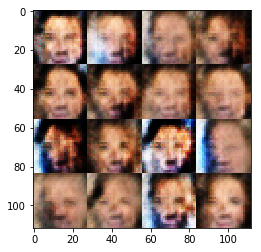

Timestamp 20170803-18-10-07.214 -  Epoch 1/1 -  Step 2210 -  D Loss: 0.7912 - G Loss: 1.4617
Timestamp 20170803-18-10-13.397 -  Epoch 1/1 -  Step 2220 -  D Loss: 0.5222 - G Loss: 2.3576
Timestamp 20170803-18-10-19.635 -  Epoch 1/1 -  Step 2230 -  D Loss: 0.7277 - G Loss: 2.2793
Timestamp 20170803-18-10-25.908 -  Epoch 1/1 -  Step 2240 -  D Loss: 0.7472 - G Loss: 1.1759
Timestamp 20170803-18-10-32.100 -  Epoch 1/1 -  Step 2250 -  D Loss: 1.0041 - G Loss: 1.3539
Timestamp 20170803-18-10-38.295 -  Epoch 1/1 -  Step 2260 -  D Loss: 0.5566 - G Loss: 1.9171
Timestamp 20170803-18-10-44.475 -  Epoch 1/1 -  Step 2270 -  D Loss: 0.5873 - G Loss: 1.6364
Timestamp 20170803-18-10-50.693 -  Epoch 1/1 -  Step 2280 -  D Loss: 0.6301 - G Loss: 1.5595
Timestamp 20170803-18-10-56.908 -  Epoch 1/1 -  Step 2290 -  D Loss: 0.7792 - G Loss: 1.3650
Timestamp 20170803-18-11-03.092 -  Epoch 1/1 -  Step 2300 -  D Loss: 0.7906 - G Loss: 2.7283


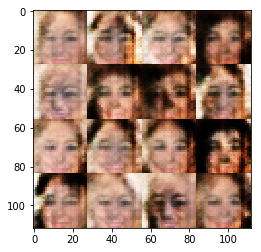

Timestamp 20170803-18-11-09.803 -  Epoch 1/1 -  Step 2310 -  D Loss: 0.6393 - G Loss: 2.4430
Timestamp 20170803-18-11-15.983 -  Epoch 1/1 -  Step 2320 -  D Loss: 0.8704 - G Loss: 1.8414
Timestamp 20170803-18-11-22.166 -  Epoch 1/1 -  Step 2330 -  D Loss: 2.0486 - G Loss: 0.3537
Timestamp 20170803-18-11-28.362 -  Epoch 1/1 -  Step 2340 -  D Loss: 1.1645 - G Loss: 0.8130
Timestamp 20170803-18-11-34.529 -  Epoch 1/1 -  Step 2350 -  D Loss: 0.3955 - G Loss: 5.1589
Timestamp 20170803-18-11-40.709 -  Epoch 1/1 -  Step 2360 -  D Loss: 1.1738 - G Loss: 0.9800
Timestamp 20170803-18-11-46.863 -  Epoch 1/1 -  Step 2370 -  D Loss: 0.6024 - G Loss: 4.3239
Timestamp 20170803-18-11-53.042 -  Epoch 1/1 -  Step 2380 -  D Loss: 0.7670 - G Loss: 1.7180
Timestamp 20170803-18-11-59.216 -  Epoch 1/1 -  Step 2390 -  D Loss: 0.8883 - G Loss: 1.0644
Timestamp 20170803-18-12-05.380 -  Epoch 1/1 -  Step 2400 -  D Loss: 0.5925 - G Loss: 1.6874


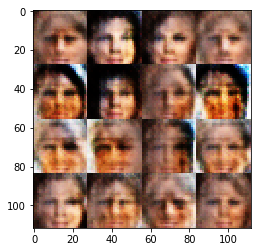

Timestamp 20170803-18-12-12.071 -  Epoch 1/1 -  Step 2410 -  D Loss: 0.7262 - G Loss: 1.3035
Timestamp 20170803-18-12-18.260 -  Epoch 1/1 -  Step 2420 -  D Loss: 0.3862 - G Loss: 3.3980
Timestamp 20170803-18-12-24.437 -  Epoch 1/1 -  Step 2430 -  D Loss: 0.3984 - G Loss: 4.9576
Timestamp 20170803-18-12-30.630 -  Epoch 1/1 -  Step 2440 -  D Loss: 0.5153 - G Loss: 2.1590
Timestamp 20170803-18-12-36.790 -  Epoch 1/1 -  Step 2450 -  D Loss: 2.3761 - G Loss: 0.1361
Timestamp 20170803-18-12-42.945 -  Epoch 1/1 -  Step 2460 -  D Loss: 1.1609 - G Loss: 2.4380
Timestamp 20170803-18-12-49.111 -  Epoch 1/1 -  Step 2470 -  D Loss: 0.5946 - G Loss: 2.1777
Timestamp 20170803-18-12-55.283 -  Epoch 1/1 -  Step 2480 -  D Loss: 1.2240 - G Loss: 0.7531
Timestamp 20170803-18-13-01.455 -  Epoch 1/1 -  Step 2490 -  D Loss: 0.6905 - G Loss: 1.9731
Timestamp 20170803-18-13-07.620 -  Epoch 1/1 -  Step 2500 -  D Loss: 0.9508 - G Loss: 1.1164


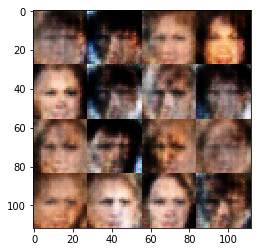

Timestamp 20170803-18-13-14.431 -  Epoch 1/1 -  Step 2510 -  D Loss: 0.5783 - G Loss: 3.0391
Timestamp 20170803-18-13-20.595 -  Epoch 1/1 -  Step 2520 -  D Loss: 1.4659 - G Loss: 0.8384
Timestamp 20170803-18-13-26.842 -  Epoch 1/1 -  Step 2530 -  D Loss: 0.5289 - G Loss: 2.0998
Timestamp 20170803-18-13-33.006 -  Epoch 1/1 -  Step 2540 -  D Loss: 0.3978 - G Loss: 3.4336
Timestamp 20170803-18-13-39.181 -  Epoch 1/1 -  Step 2550 -  D Loss: 0.7712 - G Loss: 2.0154
Timestamp 20170803-18-13-45.346 -  Epoch 1/1 -  Step 2560 -  D Loss: 0.5730 - G Loss: 2.3646
Timestamp 20170803-18-13-51.519 -  Epoch 1/1 -  Step 2570 -  D Loss: 0.4225 - G Loss: 3.3658
Timestamp 20170803-18-13-57.698 -  Epoch 1/1 -  Step 2580 -  D Loss: 1.1018 - G Loss: 0.7590
Timestamp 20170803-18-14-03.875 -  Epoch 1/1 -  Step 2590 -  D Loss: 0.7373 - G Loss: 4.0873
Timestamp 20170803-18-14-10.063 -  Epoch 1/1 -  Step 2600 -  D Loss: 0.6013 - G Loss: 3.4013


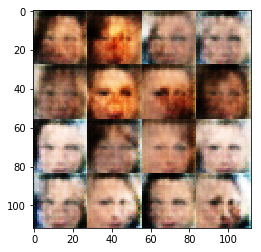

Timestamp 20170803-18-14-16.770 -  Epoch 1/1 -  Step 2610 -  D Loss: 0.4468 - G Loss: 2.5267
Timestamp 20170803-18-14-22.970 -  Epoch 1/1 -  Step 2620 -  D Loss: 1.0503 - G Loss: 0.4702
Timestamp 20170803-18-14-29.149 -  Epoch 1/1 -  Step 2630 -  D Loss: 0.9264 - G Loss: 0.8392
Timestamp 20170803-18-14-35.320 -  Epoch 1/1 -  Step 2640 -  D Loss: 0.7164 - G Loss: 2.0381
Timestamp 20170803-18-14-41.507 -  Epoch 1/1 -  Step 2650 -  D Loss: 0.4573 - G Loss: 2.5372
Timestamp 20170803-18-14-47.681 -  Epoch 1/1 -  Step 2660 -  D Loss: 0.9488 - G Loss: 1.3987
Timestamp 20170803-18-14-53.851 -  Epoch 1/1 -  Step 2670 -  D Loss: 1.1331 - G Loss: 2.8983
Timestamp 20170803-18-15-00.013 -  Epoch 1/1 -  Step 2680 -  D Loss: 0.6479 - G Loss: 1.8400
Timestamp 20170803-18-15-06.179 -  Epoch 1/1 -  Step 2690 -  D Loss: 0.6882 - G Loss: 1.6368
Timestamp 20170803-18-15-12.360 -  Epoch 1/1 -  Step 2700 -  D Loss: 0.7370 - G Loss: 2.4033


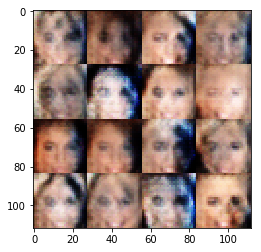

Timestamp 20170803-18-15-19.075 -  Epoch 1/1 -  Step 2710 -  D Loss: 0.8411 - G Loss: 4.9254
Timestamp 20170803-18-15-25.282 -  Epoch 1/1 -  Step 2720 -  D Loss: 1.6995 - G Loss: 0.5443
Timestamp 20170803-18-15-31.462 -  Epoch 1/1 -  Step 2730 -  D Loss: 1.1059 - G Loss: 0.9942
Timestamp 20170803-18-15-37.656 -  Epoch 1/1 -  Step 2740 -  D Loss: 1.0922 - G Loss: 3.3705
Timestamp 20170803-18-15-43.836 -  Epoch 1/1 -  Step 2750 -  D Loss: 0.6233 - G Loss: 4.0672
Timestamp 20170803-18-15-50.026 -  Epoch 1/1 -  Step 2760 -  D Loss: 0.7923 - G Loss: 2.5527
Timestamp 20170803-18-15-56.190 -  Epoch 1/1 -  Step 2770 -  D Loss: 0.6353 - G Loss: 1.9292
Timestamp 20170803-18-16-02.345 -  Epoch 1/1 -  Step 2780 -  D Loss: 1.3192 - G Loss: 0.6083
Timestamp 20170803-18-16-08.505 -  Epoch 1/1 -  Step 2790 -  D Loss: 1.3629 - G Loss: 1.0258
Timestamp 20170803-18-16-14.679 -  Epoch 1/1 -  Step 2800 -  D Loss: 0.7877 - G Loss: 2.1825


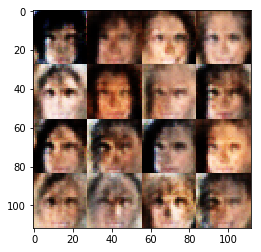

Timestamp 20170803-18-16-21.367 -  Epoch 1/1 -  Step 2810 -  D Loss: 0.5946 - G Loss: 1.8278
Timestamp 20170803-18-16-27.526 -  Epoch 1/1 -  Step 2820 -  D Loss: 0.5130 - G Loss: 3.9113
Timestamp 20170803-18-16-33.695 -  Epoch 1/1 -  Step 2830 -  D Loss: 0.9114 - G Loss: 1.6614
Timestamp 20170803-18-16-39.857 -  Epoch 1/1 -  Step 2840 -  D Loss: 0.5010 - G Loss: 2.8184
Timestamp 20170803-18-16-46.030 -  Epoch 1/1 -  Step 2850 -  D Loss: 0.6917 - G Loss: 1.3885
Timestamp 20170803-18-16-52.198 -  Epoch 1/1 -  Step 2860 -  D Loss: 0.5272 - G Loss: 2.9996
Timestamp 20170803-18-16-58.363 -  Epoch 1/1 -  Step 2870 -  D Loss: 0.5951 - G Loss: 3.4819
Timestamp 20170803-18-17-04.544 -  Epoch 1/1 -  Step 2880 -  D Loss: 0.9022 - G Loss: 1.4033
Timestamp 20170803-18-17-10.708 -  Epoch 1/1 -  Step 2890 -  D Loss: 0.5474 - G Loss: 2.5112
Timestamp 20170803-18-17-16.876 -  Epoch 1/1 -  Step 2900 -  D Loss: 0.5856 - G Loss: 2.5379


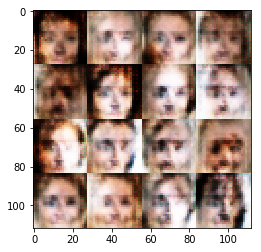

Timestamp 20170803-18-17-23.571 -  Epoch 1/1 -  Step 2910 -  D Loss: 0.5863 - G Loss: 3.7735
Timestamp 20170803-18-17-29.746 -  Epoch 1/1 -  Step 2920 -  D Loss: 0.6513 - G Loss: 2.2078
Timestamp 20170803-18-17-35.923 -  Epoch 1/1 -  Step 2930 -  D Loss: 1.2543 - G Loss: 1.4107
Timestamp 20170803-18-17-42.079 -  Epoch 1/1 -  Step 2940 -  D Loss: 1.3633 - G Loss: 0.5699
Timestamp 20170803-18-17-48.267 -  Epoch 1/1 -  Step 2950 -  D Loss: 1.0581 - G Loss: 0.9710
Timestamp 20170803-18-17-54.438 -  Epoch 1/1 -  Step 2960 -  D Loss: 1.0131 - G Loss: 0.8845
Timestamp 20170803-18-18-00.611 -  Epoch 1/1 -  Step 2970 -  D Loss: 0.9725 - G Loss: 1.0433
Timestamp 20170803-18-18-06.784 -  Epoch 1/1 -  Step 2980 -  D Loss: 1.0721 - G Loss: 1.2784
Timestamp 20170803-18-18-12.992 -  Epoch 1/1 -  Step 2990 -  D Loss: 1.0962 - G Loss: 1.4150
Timestamp 20170803-18-18-19.190 -  Epoch 1/1 -  Step 3000 -  D Loss: 0.7378 - G Loss: 1.7527


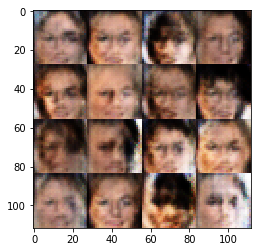

Timestamp 20170803-18-18-25.914 -  Epoch 1/1 -  Step 3010 -  D Loss: 0.6132 - G Loss: 1.5823
Timestamp 20170803-18-18-32.095 -  Epoch 1/1 -  Step 3020 -  D Loss: 0.4242 - G Loss: 3.5895
Timestamp 20170803-18-18-38.251 -  Epoch 1/1 -  Step 3030 -  D Loss: 0.7613 - G Loss: 1.6314
Timestamp 20170803-18-18-44.438 -  Epoch 1/1 -  Step 3040 -  D Loss: 0.8327 - G Loss: 1.8188
Timestamp 20170803-18-18-50.636 -  Epoch 1/1 -  Step 3050 -  D Loss: 0.7253 - G Loss: 2.6814
Timestamp 20170803-18-18-56.838 -  Epoch 1/1 -  Step 3060 -  D Loss: 0.8910 - G Loss: 1.1072
Timestamp 20170803-18-19-03.008 -  Epoch 1/1 -  Step 3070 -  D Loss: 0.5479 - G Loss: 2.5517
Timestamp 20170803-18-19-09.193 -  Epoch 1/1 -  Step 3080 -  D Loss: 1.1893 - G Loss: 1.2261
Timestamp 20170803-18-19-15.362 -  Epoch 1/1 -  Step 3090 -  D Loss: 0.5526 - G Loss: 2.3056
Timestamp 20170803-18-19-21.555 -  Epoch 1/1 -  Step 3100 -  D Loss: 1.0177 - G Loss: 0.9772


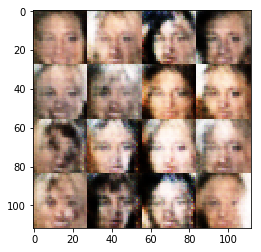

Timestamp 20170803-18-19-28.621 -  Epoch 1/1 -  Step 3110 -  D Loss: 0.6482 - G Loss: 3.0040
Timestamp 20170803-18-19-34.780 -  Epoch 1/1 -  Step 3120 -  D Loss: 0.7554 - G Loss: 1.8519
Timestamp 20170803-18-19-40.961 -  Epoch 1/1 -  Step 3130 -  D Loss: 0.7788 - G Loss: 1.3770
Timestamp 20170803-18-19-47.134 -  Epoch 1/1 -  Step 3140 -  D Loss: 0.9016 - G Loss: 1.6930
Timestamp 20170803-18-19-53.303 -  Epoch 1/1 -  Step 3150 -  D Loss: 1.0103 - G Loss: 1.1024
Timestamp 20170803-18-19-59.479 -  Epoch 1/1 -  Step 3160 -  D Loss: 0.6443 - G Loss: 1.6231
Timestamp 20170803-18-20-05.652 -  Epoch 1/1 -  Step 3170 -  D Loss: 0.8951 - G Loss: 1.3254
Timestamp 20170803-18-20-11.839 -  Epoch 1/1 -  Step 3180 -  D Loss: 0.8854 - G Loss: 2.7886
Timestamp 20170803-18-20-18.030 -  Epoch 1/1 -  Step 3190 -  D Loss: 0.7229 - G Loss: 2.1222
Timestamp 20170803-18-20-24.204 -  Epoch 1/1 -  Step 3200 -  D Loss: 0.7172 - G Loss: 1.2441


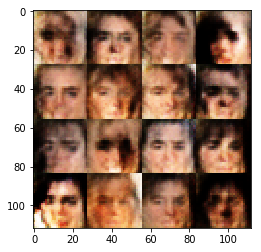

Timestamp 20170803-18-20-30.950 -  Epoch 1/1 -  Step 3210 -  D Loss: 0.7802 - G Loss: 3.5559
Timestamp 20170803-18-20-37.117 -  Epoch 1/1 -  Step 3220 -  D Loss: 0.9841 - G Loss: 1.4885
Timestamp 20170803-18-20-43.288 -  Epoch 1/1 -  Step 3230 -  D Loss: 0.7726 - G Loss: 1.9096
Timestamp 20170803-18-20-49.472 -  Epoch 1/1 -  Step 3240 -  D Loss: 1.1174 - G Loss: 0.7576
Timestamp 20170803-18-20-55.659 -  Epoch 1/1 -  Step 3250 -  D Loss: 1.1235 - G Loss: 1.1890
Timestamp 20170803-18-21-01.859 -  Epoch 1/1 -  Step 3260 -  D Loss: 1.2156 - G Loss: 0.7082
Timestamp 20170803-18-21-08.063 -  Epoch 1/1 -  Step 3270 -  D Loss: 0.7949 - G Loss: 1.9880
Timestamp 20170803-18-21-14.240 -  Epoch 1/1 -  Step 3280 -  D Loss: 1.0304 - G Loss: 1.3388
Timestamp 20170803-18-21-20.436 -  Epoch 1/1 -  Step 3290 -  D Loss: 0.6343 - G Loss: 5.8378
Timestamp 20170803-18-21-26.625 -  Epoch 1/1 -  Step 3300 -  D Loss: 0.5052 - G Loss: 2.5334


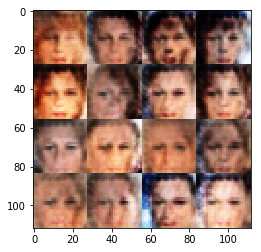

Timestamp 20170803-18-21-33.448 -  Epoch 1/1 -  Step 3310 -  D Loss: 0.5030 - G Loss: 1.7770
Timestamp 20170803-20-17-58.955 -  Epoch 1/1 -  Step 3320 -  D Loss: 0.8678 - G Loss: 2.3480
Timestamp 20170803-20-18-05.980 -  Epoch 1/1 -  Step 3330 -  D Loss: 0.9553 - G Loss: 1.8598
Timestamp 20170803-20-18-12.367 -  Epoch 1/1 -  Step 3340 -  D Loss: 0.5147 - G Loss: 4.1284
Timestamp 20170803-20-18-18.621 -  Epoch 1/1 -  Step 3350 -  D Loss: 0.9976 - G Loss: 1.2315
Timestamp 20170803-20-18-24.944 -  Epoch 1/1 -  Step 3360 -  D Loss: 0.5842 - G Loss: 2.0181
Timestamp 20170803-20-18-31.209 -  Epoch 1/1 -  Step 3370 -  D Loss: 0.8805 - G Loss: 2.2970
Timestamp 20170803-20-18-37.495 -  Epoch 1/1 -  Step 3380 -  D Loss: 1.2349 - G Loss: 0.8221
Timestamp 20170803-20-18-43.826 -  Epoch 1/1 -  Step 3390 -  D Loss: 1.1728 - G Loss: 1.2464
Timestamp 20170803-20-18-50.343 -  Epoch 1/1 -  Step 3400 -  D Loss: 1.2126 - G Loss: 0.8544


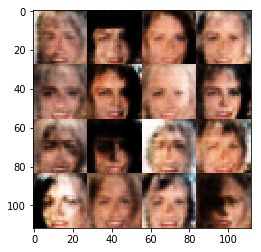

Timestamp 20170803-20-18-57.483 -  Epoch 1/1 -  Step 3410 -  D Loss: 1.1582 - G Loss: 2.6503
Timestamp 20170803-20-19-03.753 -  Epoch 1/1 -  Step 3420 -  D Loss: 0.5862 - G Loss: 1.6458
Timestamp 20170803-20-19-10.173 -  Epoch 1/1 -  Step 3430 -  D Loss: 0.9848 - G Loss: 2.7460
Timestamp 20170803-20-19-16.493 -  Epoch 1/1 -  Step 3440 -  D Loss: 0.5972 - G Loss: 1.1585
Timestamp 20170803-20-19-22.898 -  Epoch 1/1 -  Step 3450 -  D Loss: 0.5825 - G Loss: 3.9374
Timestamp 20170803-20-19-29.190 -  Epoch 1/1 -  Step 3460 -  D Loss: 0.9141 - G Loss: 4.3987
Timestamp 20170803-20-19-35.495 -  Epoch 1/1 -  Step 3470 -  D Loss: 0.8031 - G Loss: 1.3053
Timestamp 20170803-20-19-41.776 -  Epoch 1/1 -  Step 3480 -  D Loss: 1.1716 - G Loss: 0.8636
Timestamp 20170803-20-19-48.092 -  Epoch 1/1 -  Step 3490 -  D Loss: 1.0850 - G Loss: 2.7203
Timestamp 20170803-20-19-54.405 -  Epoch 1/1 -  Step 3500 -  D Loss: 0.7956 - G Loss: 2.6186


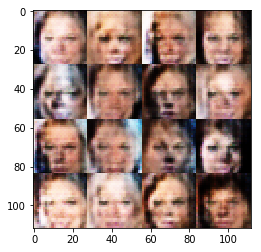

Timestamp 20170803-20-20-01.341 -  Epoch 1/1 -  Step 3510 -  D Loss: 0.5572 - G Loss: 3.0133
Timestamp 20170803-20-20-07.565 -  Epoch 1/1 -  Step 3520 -  D Loss: 0.5209 - G Loss: 3.2399
Timestamp 20170803-20-20-13.838 -  Epoch 1/1 -  Step 3530 -  D Loss: 1.2925 - G Loss: 0.7325
Timestamp 20170803-20-20-20.142 -  Epoch 1/1 -  Step 3540 -  D Loss: 0.9797 - G Loss: 1.2660
Timestamp 20170803-20-20-26.401 -  Epoch 1/1 -  Step 3550 -  D Loss: 0.5703 - G Loss: 2.8340
Timestamp 20170803-20-20-32.680 -  Epoch 1/1 -  Step 3560 -  D Loss: 0.8044 - G Loss: 0.7905
Timestamp 20170803-20-20-38.935 -  Epoch 1/1 -  Step 3570 -  D Loss: 1.5173 - G Loss: 0.8939
Timestamp 20170803-20-20-45.315 -  Epoch 1/1 -  Step 3580 -  D Loss: 0.7622 - G Loss: 1.1866
Timestamp 20170803-20-20-51.727 -  Epoch 1/1 -  Step 3590 -  D Loss: 0.9593 - G Loss: 1.1383
Timestamp 20170803-20-20-58.684 -  Epoch 1/1 -  Step 3600 -  D Loss: 0.7412 - G Loss: 1.5758


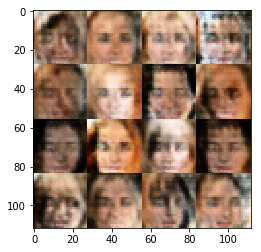

Timestamp 20170803-20-21-05.951 -  Epoch 1/1 -  Step 3610 -  D Loss: 1.2983 - G Loss: 0.7309
Timestamp 20170803-20-21-12.462 -  Epoch 1/1 -  Step 3620 -  D Loss: 0.9700 - G Loss: 1.6677
Timestamp 20170803-20-21-18.795 -  Epoch 1/1 -  Step 3630 -  D Loss: 0.8553 - G Loss: 1.6426
Timestamp 20170803-20-21-25.212 -  Epoch 1/1 -  Step 3640 -  D Loss: 1.0130 - G Loss: 2.8004
Timestamp 20170803-20-21-31.514 -  Epoch 1/1 -  Step 3650 -  D Loss: 1.2106 - G Loss: 0.8095
Timestamp 20170803-20-21-37.772 -  Epoch 1/1 -  Step 3660 -  D Loss: 0.5138 - G Loss: 2.6511
Timestamp 20170803-20-21-44.055 -  Epoch 1/1 -  Step 3670 -  D Loss: 1.0737 - G Loss: 1.2199
Timestamp 20170803-20-21-50.288 -  Epoch 1/1 -  Step 3680 -  D Loss: 0.5561 - G Loss: 4.4249
Timestamp 20170803-20-21-56.573 -  Epoch 1/1 -  Step 3690 -  D Loss: 1.2125 - G Loss: 0.7972
Timestamp 20170803-20-22-02.874 -  Epoch 1/1 -  Step 3700 -  D Loss: 0.9124 - G Loss: 3.3755


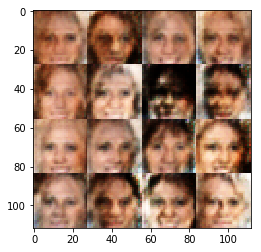

Timestamp 20170803-20-22-09.728 -  Epoch 1/1 -  Step 3710 -  D Loss: 0.8846 - G Loss: 1.4604
Timestamp 20170803-20-22-15.974 -  Epoch 1/1 -  Step 3720 -  D Loss: 0.9169 - G Loss: 0.9923
Timestamp 20170803-20-22-22.226 -  Epoch 1/1 -  Step 3730 -  D Loss: 0.8131 - G Loss: 1.1642
Timestamp 20170803-20-22-28.454 -  Epoch 1/1 -  Step 3740 -  D Loss: 0.4967 - G Loss: 4.8357
Timestamp 20170803-20-22-34.721 -  Epoch 1/1 -  Step 3750 -  D Loss: 1.0975 - G Loss: 1.8496
Timestamp 20170803-20-22-41.069 -  Epoch 1/1 -  Step 3760 -  D Loss: 0.9494 - G Loss: 1.5301
Timestamp 20170803-20-22-47.313 -  Epoch 1/1 -  Step 3770 -  D Loss: 1.1046 - G Loss: 1.3689
Timestamp 20170803-20-22-53.553 -  Epoch 1/1 -  Step 3780 -  D Loss: 0.7680 - G Loss: 1.7227
Timestamp 20170803-20-22-59.906 -  Epoch 1/1 -  Step 3790 -  D Loss: 0.9185 - G Loss: 2.0095
Timestamp 20170803-20-23-06.174 -  Epoch 1/1 -  Step 3800 -  D Loss: 1.2617 - G Loss: 0.7983


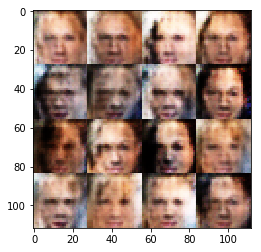

Timestamp 20170803-20-23-13.214 -  Epoch 1/1 -  Step 3810 -  D Loss: 1.4148 - G Loss: 0.4710
Timestamp 20170803-20-23-19.616 -  Epoch 1/1 -  Step 3820 -  D Loss: 0.7464 - G Loss: 2.8974
Timestamp 20170803-20-23-25.978 -  Epoch 1/1 -  Step 3830 -  D Loss: 0.7864 - G Loss: 1.1780
Timestamp 20170803-20-23-32.257 -  Epoch 1/1 -  Step 3840 -  D Loss: 0.8122 - G Loss: 1.5775
Timestamp 20170803-20-23-38.496 -  Epoch 1/1 -  Step 3850 -  D Loss: 0.8877 - G Loss: 1.6374
Timestamp 20170803-20-23-44.732 -  Epoch 1/1 -  Step 3860 -  D Loss: 1.1145 - G Loss: 0.9717
Timestamp 20170803-20-23-51.031 -  Epoch 1/1 -  Step 3870 -  D Loss: 1.6377 - G Loss: 0.4556
Timestamp 20170803-20-23-57.311 -  Epoch 1/1 -  Step 3880 -  D Loss: 1.1707 - G Loss: 1.1615
Timestamp 20170803-20-24-03.654 -  Epoch 1/1 -  Step 3890 -  D Loss: 0.8975 - G Loss: 1.4440
Timestamp 20170803-20-24-09.923 -  Epoch 1/1 -  Step 3900 -  D Loss: 0.5511 - G Loss: 2.1127


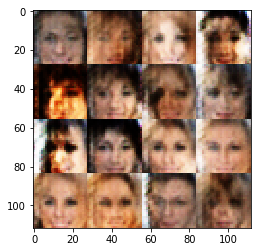

Timestamp 20170803-20-24-16.829 -  Epoch 1/1 -  Step 3910 -  D Loss: 0.8264 - G Loss: 1.0917
Timestamp 20170803-20-24-23.338 -  Epoch 1/1 -  Step 3920 -  D Loss: 0.6890 - G Loss: 1.8825
Timestamp 20170803-20-24-29.586 -  Epoch 1/1 -  Step 3930 -  D Loss: 1.0629 - G Loss: 1.0871
Timestamp 20170803-20-24-35.900 -  Epoch 1/1 -  Step 3940 -  D Loss: 0.9154 - G Loss: 1.0715
Timestamp 20170803-20-24-42.157 -  Epoch 1/1 -  Step 3950 -  D Loss: 0.7361 - G Loss: 1.1829
Timestamp 20170803-20-24-48.477 -  Epoch 1/1 -  Step 3960 -  D Loss: 0.5144 - G Loss: 1.9900
Timestamp 20170803-20-24-54.783 -  Epoch 1/1 -  Step 3970 -  D Loss: 1.0766 - G Loss: 1.0782
Timestamp 20170803-20-25-01.050 -  Epoch 1/1 -  Step 3980 -  D Loss: 0.7347 - G Loss: 1.9282
Timestamp 20170803-20-25-07.271 -  Epoch 1/1 -  Step 3990 -  D Loss: 0.8577 - G Loss: 2.0225
Timestamp 20170803-20-25-13.560 -  Epoch 1/1 -  Step 4000 -  D Loss: 1.1723 - G Loss: 0.5809


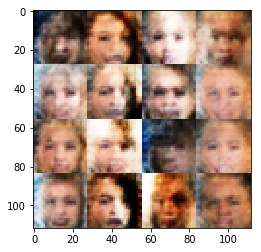

Timestamp 20170803-20-25-20.434 -  Epoch 1/1 -  Step 4010 -  D Loss: 0.4771 - G Loss: 3.0651
Timestamp 20170803-20-25-26.878 -  Epoch 1/1 -  Step 4020 -  D Loss: 1.8570 - G Loss: 0.3594
Timestamp 20170803-20-25-33.566 -  Epoch 1/1 -  Step 4030 -  D Loss: 0.9131 - G Loss: 1.1720
Timestamp 20170803-20-25-39.939 -  Epoch 1/1 -  Step 4040 -  D Loss: 0.6476 - G Loss: 1.6879
Timestamp 20170803-20-25-46.325 -  Epoch 1/1 -  Step 4050 -  D Loss: 0.7638 - G Loss: 1.8561
Timestamp 20170803-20-25-52.685 -  Epoch 1/1 -  Step 4060 -  D Loss: 1.0876 - G Loss: 1.2799
Timestamp 20170803-20-25-58.928 -  Epoch 1/1 -  Step 4070 -  D Loss: 0.8450 - G Loss: 1.9822
Timestamp 20170803-20-26-05.188 -  Epoch 1/1 -  Step 4080 -  D Loss: 1.1551 - G Loss: 0.9128
Timestamp 20170803-20-26-11.448 -  Epoch 1/1 -  Step 4090 -  D Loss: 0.8224 - G Loss: 2.2664
Timestamp 20170803-20-26-17.707 -  Epoch 1/1 -  Step 4100 -  D Loss: 0.5205 - G Loss: 2.1556


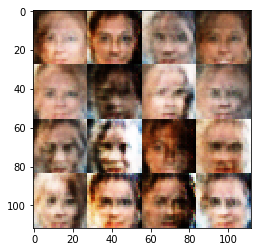

Timestamp 20170803-20-26-24.555 -  Epoch 1/1 -  Step 4110 -  D Loss: 0.4632 - G Loss: 2.7489
Timestamp 20170803-20-26-30.808 -  Epoch 1/1 -  Step 4120 -  D Loss: 1.1511 - G Loss: 1.0219
Timestamp 20170803-20-26-37.071 -  Epoch 1/1 -  Step 4130 -  D Loss: 0.8505 - G Loss: 2.8165
Timestamp 20170803-20-26-43.313 -  Epoch 1/1 -  Step 4140 -  D Loss: 0.8355 - G Loss: 1.5954
Timestamp 20170803-20-26-49.568 -  Epoch 1/1 -  Step 4150 -  D Loss: 0.7908 - G Loss: 1.2625
Timestamp 20170803-20-26-55.821 -  Epoch 1/1 -  Step 4160 -  D Loss: 0.6915 - G Loss: 2.9616
Timestamp 20170803-20-27-02.077 -  Epoch 1/1 -  Step 4170 -  D Loss: 0.9650 - G Loss: 0.7689
Timestamp 20170803-20-27-08.343 -  Epoch 1/1 -  Step 4180 -  D Loss: 1.0436 - G Loss: 0.6439
Timestamp 20170803-20-27-14.614 -  Epoch 1/1 -  Step 4190 -  D Loss: 0.7255 - G Loss: 1.8832
Timestamp 20170803-20-27-20.843 -  Epoch 1/1 -  Step 4200 -  D Loss: 0.7992 - G Loss: 1.0386


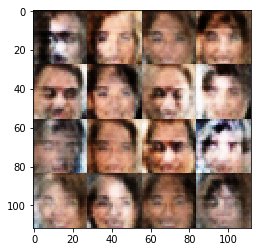

Timestamp 20170803-20-27-27.866 -  Epoch 1/1 -  Step 4210 -  D Loss: 0.6790 - G Loss: 2.1014
Timestamp 20170803-20-27-34.150 -  Epoch 1/1 -  Step 4220 -  D Loss: 0.7304 - G Loss: 2.0410
Timestamp 20170803-20-27-40.502 -  Epoch 1/1 -  Step 4230 -  D Loss: 0.4838 - G Loss: 3.5373
Timestamp 20170803-20-27-46.894 -  Epoch 1/1 -  Step 4240 -  D Loss: 0.6349 - G Loss: 1.7999
Timestamp 20170803-20-27-53.276 -  Epoch 1/1 -  Step 4250 -  D Loss: 0.7193 - G Loss: 1.5736
Timestamp 20170803-20-27-59.604 -  Epoch 1/1 -  Step 4260 -  D Loss: 0.9267 - G Loss: 0.7289
Timestamp 20170803-20-28-06.031 -  Epoch 1/1 -  Step 4270 -  D Loss: 0.6507 - G Loss: 1.3978
Timestamp 20170803-20-28-12.438 -  Epoch 1/1 -  Step 4280 -  D Loss: 0.6503 - G Loss: 2.2491
Timestamp 20170803-20-28-18.852 -  Epoch 1/1 -  Step 4290 -  D Loss: 0.7842 - G Loss: 1.6046
Timestamp 20170803-20-28-25.135 -  Epoch 1/1 -  Step 4300 -  D Loss: 0.7120 - G Loss: 1.4523


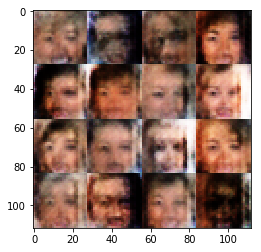

Timestamp 20170803-20-28-32.004 -  Epoch 1/1 -  Step 4310 -  D Loss: 0.7680 - G Loss: 2.9557
Timestamp 20170803-20-28-38.396 -  Epoch 1/1 -  Step 4320 -  D Loss: 0.3952 - G Loss: 7.0863
Timestamp 20170803-20-28-44.702 -  Epoch 1/1 -  Step 4330 -  D Loss: 0.8653 - G Loss: 2.0625
Timestamp 20170803-20-28-51.019 -  Epoch 1/1 -  Step 4340 -  D Loss: 0.9410 - G Loss: 3.0951
Timestamp 20170803-20-28-57.290 -  Epoch 1/1 -  Step 4350 -  D Loss: 1.3757 - G Loss: 0.7107
Timestamp 20170803-20-29-03.599 -  Epoch 1/1 -  Step 4360 -  D Loss: 1.2094 - G Loss: 1.0188
Timestamp 20170803-20-29-09.921 -  Epoch 1/1 -  Step 4370 -  D Loss: 0.7785 - G Loss: 2.3301
Timestamp 20170803-20-29-16.288 -  Epoch 1/1 -  Step 4380 -  D Loss: 0.8234 - G Loss: 1.7349
Timestamp 20170803-20-29-22.697 -  Epoch 1/1 -  Step 4390 -  D Loss: 1.0157 - G Loss: 1.8632
Timestamp 20170803-20-29-29.052 -  Epoch 1/1 -  Step 4400 -  D Loss: 0.4698 - G Loss: 5.2072


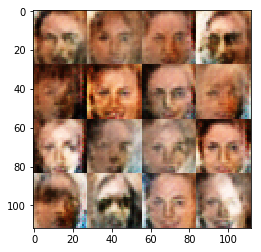

Timestamp 20170803-20-29-35.985 -  Epoch 1/1 -  Step 4410 -  D Loss: 1.0056 - G Loss: 1.4070
Timestamp 20170803-20-29-42.293 -  Epoch 1/1 -  Step 4420 -  D Loss: 1.0896 - G Loss: 1.6885
Timestamp 20170803-20-29-48.576 -  Epoch 1/1 -  Step 4430 -  D Loss: 0.6954 - G Loss: 3.0820
Timestamp 20170803-20-29-54.874 -  Epoch 1/1 -  Step 4440 -  D Loss: 1.3090 - G Loss: 0.9138
Timestamp 20170803-20-30-01.283 -  Epoch 1/1 -  Step 4450 -  D Loss: 1.1397 - G Loss: 0.8171
Timestamp 20170803-20-30-07.600 -  Epoch 1/1 -  Step 4460 -  D Loss: 1.0184 - G Loss: 2.2174
Timestamp 20170803-20-30-13.904 -  Epoch 1/1 -  Step 4470 -  D Loss: 0.9196 - G Loss: 1.6101
Timestamp 20170803-20-30-20.277 -  Epoch 1/1 -  Step 4480 -  D Loss: 0.8469 - G Loss: 1.8268
Timestamp 20170803-20-30-26.620 -  Epoch 1/1 -  Step 4490 -  D Loss: 0.8779 - G Loss: 1.2980
Timestamp 20170803-20-30-32.909 -  Epoch 1/1 -  Step 4500 -  D Loss: 1.5698 - G Loss: 0.8678


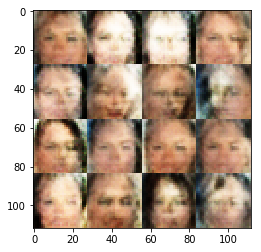

Timestamp 20170803-20-30-40.020 -  Epoch 1/1 -  Step 4510 -  D Loss: 1.0476 - G Loss: 1.5350
Timestamp 20170803-20-30-46.364 -  Epoch 1/1 -  Step 4520 -  D Loss: 0.6087 - G Loss: 2.2278
Timestamp 20170803-20-30-52.585 -  Epoch 1/1 -  Step 4530 -  D Loss: 1.0373 - G Loss: 0.9985
Timestamp 20170803-20-30-58.848 -  Epoch 1/1 -  Step 4540 -  D Loss: 1.8018 - G Loss: 0.4119
Timestamp 20170803-20-31-05.112 -  Epoch 1/1 -  Step 4550 -  D Loss: 1.8373 - G Loss: 0.3007
Timestamp 20170803-20-31-11.362 -  Epoch 1/1 -  Step 4560 -  D Loss: 0.5598 - G Loss: 2.6314
Timestamp 20170803-20-31-17.598 -  Epoch 1/1 -  Step 4570 -  D Loss: 0.6580 - G Loss: 1.2573
Timestamp 20170803-20-31-23.856 -  Epoch 1/1 -  Step 4580 -  D Loss: 0.5934 - G Loss: 4.4924
Timestamp 20170803-20-31-30.078 -  Epoch 1/1 -  Step 4590 -  D Loss: 0.9505 - G Loss: 1.7679
Timestamp 20170803-20-31-36.328 -  Epoch 1/1 -  Step 4600 -  D Loss: 0.4941 - G Loss: 1.9674


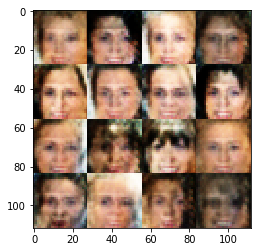

Timestamp 20170803-20-31-43.164 -  Epoch 1/1 -  Step 4610 -  D Loss: 1.4013 - G Loss: 0.6997
Timestamp 20170803-20-31-49.418 -  Epoch 1/1 -  Step 4620 -  D Loss: 0.7790 - G Loss: 1.8242
Timestamp 20170803-20-31-55.677 -  Epoch 1/1 -  Step 4630 -  D Loss: 0.8778 - G Loss: 1.7489
Timestamp 20170803-20-32-01.940 -  Epoch 1/1 -  Step 4640 -  D Loss: 0.5114 - G Loss: 2.7745
Timestamp 20170803-20-32-08.238 -  Epoch 1/1 -  Step 4650 -  D Loss: 0.5865 - G Loss: 2.8403
Timestamp 20170803-20-32-14.500 -  Epoch 1/1 -  Step 4660 -  D Loss: 0.5322 - G Loss: 2.4201
Timestamp 20170803-20-32-20.856 -  Epoch 1/1 -  Step 4670 -  D Loss: 0.7965 - G Loss: 1.2021
Timestamp 20170803-20-32-27.162 -  Epoch 1/1 -  Step 4680 -  D Loss: 0.7984 - G Loss: 1.3929
Timestamp 20170803-20-32-33.502 -  Epoch 1/1 -  Step 4690 -  D Loss: 1.3130 - G Loss: 2.0428
Timestamp 20170803-20-32-39.791 -  Epoch 1/1 -  Step 4700 -  D Loss: 0.9824 - G Loss: 1.5853


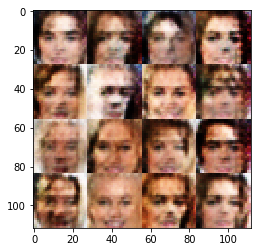

Timestamp 20170803-20-32-46.818 -  Epoch 1/1 -  Step 4710 -  D Loss: 0.5680 - G Loss: 2.3724
Timestamp 20170803-20-32-53.121 -  Epoch 1/1 -  Step 4720 -  D Loss: 0.7422 - G Loss: 1.8041
Timestamp 20170803-20-32-59.421 -  Epoch 1/1 -  Step 4730 -  D Loss: 1.3220 - G Loss: 0.7069
Timestamp 20170803-20-33-05.700 -  Epoch 1/1 -  Step 4740 -  D Loss: 0.5937 - G Loss: 1.4085
Timestamp 20170803-20-33-11.932 -  Epoch 1/1 -  Step 4750 -  D Loss: 0.7222 - G Loss: 1.3593
Timestamp 20170803-20-33-18.219 -  Epoch 1/1 -  Step 4760 -  D Loss: 0.4755 - G Loss: 2.5268
Timestamp 20170803-20-33-24.516 -  Epoch 1/1 -  Step 4770 -  D Loss: 1.2810 - G Loss: 1.3805
Timestamp 20170803-20-33-30.749 -  Epoch 1/1 -  Step 4780 -  D Loss: 0.7447 - G Loss: 2.4532
Timestamp 20170803-20-33-36.995 -  Epoch 1/1 -  Step 4790 -  D Loss: 1.1765 - G Loss: 0.6443
Timestamp 20170803-20-33-43.214 -  Epoch 1/1 -  Step 4800 -  D Loss: 0.7213 - G Loss: 1.9867


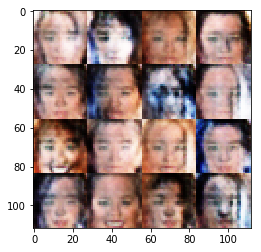

Timestamp 20170803-20-33-50.117 -  Epoch 1/1 -  Step 4810 -  D Loss: 0.7040 - G Loss: 1.5167
Timestamp 20170803-20-33-56.389 -  Epoch 1/1 -  Step 4820 -  D Loss: 0.9274 - G Loss: 0.7440
Timestamp 20170803-20-34-02.624 -  Epoch 1/1 -  Step 4830 -  D Loss: 0.7516 - G Loss: 1.5485
Timestamp 20170803-20-34-08.938 -  Epoch 1/1 -  Step 4840 -  D Loss: 0.8140 - G Loss: 1.2957
Timestamp 20170803-20-34-15.230 -  Epoch 1/1 -  Step 4850 -  D Loss: 0.9429 - G Loss: 1.2338
Timestamp 20170803-20-34-21.732 -  Epoch 1/1 -  Step 4860 -  D Loss: 1.4291 - G Loss: 0.9959
Timestamp 20170803-20-34-28.063 -  Epoch 1/1 -  Step 4870 -  D Loss: 1.0546 - G Loss: 1.0749
Timestamp 20170803-20-34-34.399 -  Epoch 1/1 -  Step 4880 -  D Loss: 0.8001 - G Loss: 1.3341
Timestamp 20170803-20-34-40.709 -  Epoch 1/1 -  Step 4890 -  D Loss: 0.8048 - G Loss: 1.4483
Timestamp 20170803-20-34-47.123 -  Epoch 1/1 -  Step 4900 -  D Loss: 0.6399 - G Loss: 1.4693


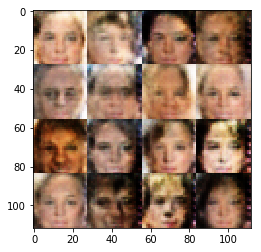

Timestamp 20170803-20-34-54.080 -  Epoch 1/1 -  Step 4910 -  D Loss: 1.3188 - G Loss: 1.3105
Timestamp 20170803-20-35-00.411 -  Epoch 1/1 -  Step 4920 -  D Loss: 0.5167 - G Loss: 2.3738
Timestamp 20170803-20-35-06.723 -  Epoch 1/1 -  Step 4930 -  D Loss: 1.0093 - G Loss: 1.4726
Timestamp 20170803-20-35-13.048 -  Epoch 1/1 -  Step 4940 -  D Loss: 0.7822 - G Loss: 1.6428
Timestamp 20170803-20-35-19.447 -  Epoch 1/1 -  Step 4950 -  D Loss: 0.7460 - G Loss: 1.8050
Timestamp 20170803-20-35-25.845 -  Epoch 1/1 -  Step 4960 -  D Loss: 0.8375 - G Loss: 1.6970
Timestamp 20170803-20-35-32.088 -  Epoch 1/1 -  Step 4970 -  D Loss: 0.5254 - G Loss: 2.8688
Timestamp 20170803-20-35-38.318 -  Epoch 1/1 -  Step 4980 -  D Loss: 0.6318 - G Loss: 1.6288
Timestamp 20170803-20-35-44.575 -  Epoch 1/1 -  Step 4990 -  D Loss: 0.7256 - G Loss: 1.4201
Timestamp 20170803-20-35-50.853 -  Epoch 1/1 -  Step 5000 -  D Loss: 0.5027 - G Loss: 1.8408


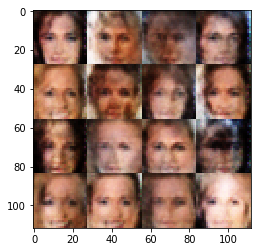

Timestamp 20170803-20-35-57.665 -  Epoch 1/1 -  Step 5010 -  D Loss: 1.0634 - G Loss: 1.1079
Timestamp 20170803-20-36-04.320 -  Epoch 1/1 -  Step 5020 -  D Loss: 0.8427 - G Loss: 1.2840
Timestamp 20170803-20-36-10.566 -  Epoch 1/1 -  Step 5030 -  D Loss: 0.6959 - G Loss: 1.2400
Timestamp 20170803-20-36-16.833 -  Epoch 1/1 -  Step 5040 -  D Loss: 1.1416 - G Loss: 1.4097
Timestamp 20170803-20-36-23.142 -  Epoch 1/1 -  Step 5050 -  D Loss: 0.7043 - G Loss: 1.6480
Timestamp 20170803-20-36-29.355 -  Epoch 1/1 -  Step 5060 -  D Loss: 0.5288 - G Loss: 2.5213
Timestamp 20170803-20-36-35.621 -  Epoch 1/1 -  Step 5070 -  D Loss: 1.0054 - G Loss: 1.2898
Timestamp 20170803-20-36-42.000 -  Epoch 1/1 -  Step 5080 -  D Loss: 0.9594 - G Loss: 2.1416
Timestamp 20170803-20-36-48.433 -  Epoch 1/1 -  Step 5090 -  D Loss: 0.7752 - G Loss: 1.6012
Timestamp 20170803-20-36-54.830 -  Epoch 1/1 -  Step 5100 -  D Loss: 0.9612 - G Loss: 1.2945


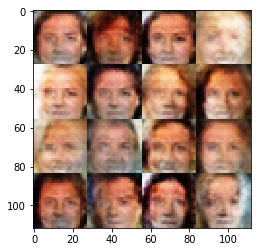

Timestamp 20170803-20-37-01.768 -  Epoch 1/1 -  Step 5110 -  D Loss: 0.4880 - G Loss: 3.1210
Timestamp 20170803-20-37-08.052 -  Epoch 1/1 -  Step 5120 -  D Loss: 0.8977 - G Loss: 1.5290
Timestamp 20170803-20-37-14.348 -  Epoch 1/1 -  Step 5130 -  D Loss: 0.8097 - G Loss: 1.1365
Timestamp 20170803-20-37-20.619 -  Epoch 1/1 -  Step 5140 -  D Loss: 0.8196 - G Loss: 1.9595
Timestamp 20170803-20-37-26.978 -  Epoch 1/1 -  Step 5150 -  D Loss: 1.2650 - G Loss: 0.8530
Timestamp 20170803-20-37-33.302 -  Epoch 1/1 -  Step 5160 -  D Loss: 0.9801 - G Loss: 1.5352
Timestamp 20170803-20-37-39.543 -  Epoch 1/1 -  Step 5170 -  D Loss: 0.6543 - G Loss: 1.5576
Timestamp 20170803-20-37-45.824 -  Epoch 1/1 -  Step 5180 -  D Loss: 0.6822 - G Loss: 1.6927
Timestamp 20170803-20-37-52.226 -  Epoch 1/1 -  Step 5190 -  D Loss: 0.8984 - G Loss: 0.5460
Timestamp 20170803-20-37-58.473 -  Epoch 1/1 -  Step 5200 -  D Loss: 1.1867 - G Loss: 0.9545


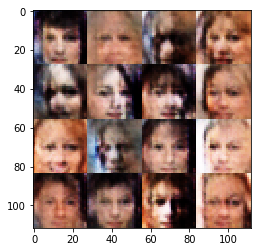

Timestamp 20170803-20-38-05.337 -  Epoch 1/1 -  Step 5210 -  D Loss: 0.9525 - G Loss: 1.2708
Timestamp 20170803-20-38-11.613 -  Epoch 1/1 -  Step 5220 -  D Loss: 0.7984 - G Loss: 1.6612
Timestamp 20170803-20-38-17.850 -  Epoch 1/1 -  Step 5230 -  D Loss: 1.0903 - G Loss: 1.1309
Timestamp 20170803-20-38-24.103 -  Epoch 1/1 -  Step 5240 -  D Loss: 0.7745 - G Loss: 1.6760
Timestamp 20170803-20-38-30.540 -  Epoch 1/1 -  Step 5250 -  D Loss: 0.8868 - G Loss: 1.0546
Timestamp 20170803-20-38-36.782 -  Epoch 1/1 -  Step 5260 -  D Loss: 0.8399 - G Loss: 1.3166
Timestamp 20170803-20-38-43.093 -  Epoch 1/1 -  Step 5270 -  D Loss: 0.6415 - G Loss: 1.0327
Timestamp 20170803-20-38-49.480 -  Epoch 1/1 -  Step 5280 -  D Loss: 0.9998 - G Loss: 1.2646
Timestamp 20170803-20-38-55.823 -  Epoch 1/1 -  Step 5290 -  D Loss: 1.2114 - G Loss: 0.9915
Timestamp 20170803-20-39-02.107 -  Epoch 1/1 -  Step 5300 -  D Loss: 1.5346 - G Loss: 0.4578


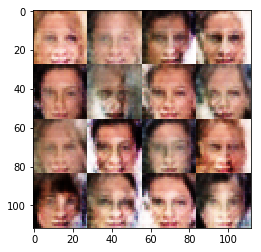

Timestamp 20170803-20-39-09.066 -  Epoch 1/1 -  Step 5310 -  D Loss: 0.6161 - G Loss: 1.5343
Timestamp 20170803-20-39-15.335 -  Epoch 1/1 -  Step 5320 -  D Loss: 0.8789 - G Loss: 1.2160
Timestamp 20170803-20-39-21.714 -  Epoch 1/1 -  Step 5330 -  D Loss: 0.8995 - G Loss: 1.1534
Timestamp 20170803-20-39-28.053 -  Epoch 1/1 -  Step 5340 -  D Loss: 0.9491 - G Loss: 1.3887
Timestamp 20170803-20-39-34.347 -  Epoch 1/1 -  Step 5350 -  D Loss: 0.6647 - G Loss: 1.2913
Timestamp 20170803-20-39-40.572 -  Epoch 1/1 -  Step 5360 -  D Loss: 1.0835 - G Loss: 0.9239
Timestamp 20170803-20-39-46.886 -  Epoch 1/1 -  Step 5370 -  D Loss: 0.8083 - G Loss: 1.9042
Timestamp 20170803-20-39-53.139 -  Epoch 1/1 -  Step 5380 -  D Loss: 0.8535 - G Loss: 1.1872
Timestamp 20170803-20-39-59.366 -  Epoch 1/1 -  Step 5390 -  D Loss: 1.3303 - G Loss: 0.4978
Timestamp 20170803-20-40-05.605 -  Epoch 1/1 -  Step 5400 -  D Loss: 1.0979 - G Loss: 1.5477


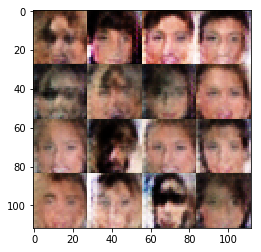

Timestamp 20170803-20-40-12.596 -  Epoch 1/1 -  Step 5410 -  D Loss: 0.8683 - G Loss: 2.0546
Timestamp 20170803-20-40-18.845 -  Epoch 1/1 -  Step 5420 -  D Loss: 0.6276 - G Loss: 2.3591
Timestamp 20170803-20-40-25.109 -  Epoch 1/1 -  Step 5430 -  D Loss: 1.0985 - G Loss: 1.2927
Timestamp 20170803-20-40-31.466 -  Epoch 1/1 -  Step 5440 -  D Loss: 1.0646 - G Loss: 1.7047
Timestamp 20170803-20-40-37.896 -  Epoch 1/1 -  Step 5450 -  D Loss: 1.2736 - G Loss: 0.9864
Timestamp 20170803-20-40-44.200 -  Epoch 1/1 -  Step 5460 -  D Loss: 0.7876 - G Loss: 2.3659
Timestamp 20170803-20-40-50.522 -  Epoch 1/1 -  Step 5470 -  D Loss: 1.6648 - G Loss: 0.8529
Timestamp 20170803-20-40-56.814 -  Epoch 1/1 -  Step 5480 -  D Loss: 1.0392 - G Loss: 0.9484
Timestamp 20170803-20-41-03.216 -  Epoch 1/1 -  Step 5490 -  D Loss: 0.8305 - G Loss: 1.0645
Timestamp 20170803-20-41-09.475 -  Epoch 1/1 -  Step 5500 -  D Loss: 0.5720 - G Loss: 1.7572


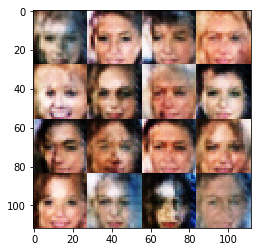

Timestamp 20170803-20-41-16.344 -  Epoch 1/1 -  Step 5510 -  D Loss: 0.6164 - G Loss: 2.6589
Timestamp 20170803-20-41-22.721 -  Epoch 1/1 -  Step 5520 -  D Loss: 1.2945 - G Loss: 0.7828
Timestamp 20170803-20-41-29.036 -  Epoch 1/1 -  Step 5530 -  D Loss: 1.0005 - G Loss: 1.0459
Timestamp 20170803-20-41-35.411 -  Epoch 1/1 -  Step 5540 -  D Loss: 0.9933 - G Loss: 1.6247
Timestamp 20170803-20-41-41.717 -  Epoch 1/1 -  Step 5550 -  D Loss: 0.8112 - G Loss: 1.3119
Timestamp 20170803-20-41-48.103 -  Epoch 1/1 -  Step 5560 -  D Loss: 1.1766 - G Loss: 0.7096
Timestamp 20170803-20-41-54.379 -  Epoch 1/1 -  Step 5570 -  D Loss: 0.7652 - G Loss: 1.9723
Timestamp 20170803-20-42-00.691 -  Epoch 1/1 -  Step 5580 -  D Loss: 0.8765 - G Loss: 1.4016
Timestamp 20170803-20-42-06.948 -  Epoch 1/1 -  Step 5590 -  D Loss: 1.2866 - G Loss: 1.5474
Timestamp 20170803-20-42-13.193 -  Epoch 1/1 -  Step 5600 -  D Loss: 1.1718 - G Loss: 1.4708


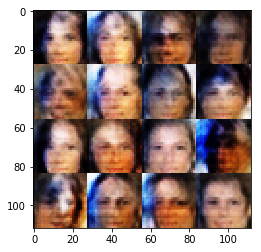

Timestamp 20170803-20-42-20.147 -  Epoch 1/1 -  Step 5610 -  D Loss: 0.8313 - G Loss: 1.3967
Timestamp 20170803-20-42-26.361 -  Epoch 1/1 -  Step 5620 -  D Loss: 0.7501 - G Loss: 1.3460
Timestamp 20170803-20-42-32.619 -  Epoch 1/1 -  Step 5630 -  D Loss: 1.0621 - G Loss: 1.4900
Timestamp 20170803-20-42-38.877 -  Epoch 1/1 -  Step 5640 -  D Loss: 1.5594 - G Loss: 0.7360
Timestamp 20170803-20-42-45.231 -  Epoch 1/1 -  Step 5650 -  D Loss: 0.6651 - G Loss: 1.8509
Timestamp 20170803-20-42-51.553 -  Epoch 1/1 -  Step 5660 -  D Loss: 1.2869 - G Loss: 1.6676
Timestamp 20170803-20-42-57.828 -  Epoch 1/1 -  Step 5670 -  D Loss: 0.7923 - G Loss: 0.9458
Timestamp 20170803-20-43-04.084 -  Epoch 1/1 -  Step 5680 -  D Loss: 1.1773 - G Loss: 0.7208
Timestamp 20170803-20-43-10.390 -  Epoch 1/1 -  Step 5690 -  D Loss: 0.8649 - G Loss: 1.1576
Timestamp 20170803-20-43-16.668 -  Epoch 1/1 -  Step 5700 -  D Loss: 0.9228 - G Loss: 1.0558


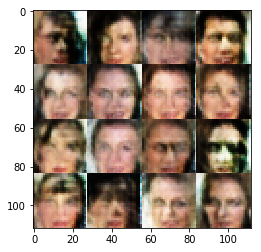

Timestamp 20170803-20-43-23.601 -  Epoch 1/1 -  Step 5710 -  D Loss: 0.9273 - G Loss: 0.9074
Timestamp 20170803-20-43-30.564 -  Epoch 1/1 -  Step 5720 -  D Loss: 1.0520 - G Loss: 0.9619
Timestamp 20170803-20-43-36.954 -  Epoch 1/1 -  Step 5730 -  D Loss: 0.6230 - G Loss: 2.0874
Timestamp 20170803-20-43-43.614 -  Epoch 1/1 -  Step 5740 -  D Loss: 0.5533 - G Loss: 2.6964
Timestamp 20170803-20-43-49.990 -  Epoch 1/1 -  Step 5750 -  D Loss: 0.5326 - G Loss: 2.5692
Timestamp 20170803-20-43-56.297 -  Epoch 1/1 -  Step 5760 -  D Loss: 1.0865 - G Loss: 1.0083
Timestamp 20170803-20-44-02.781 -  Epoch 1/1 -  Step 5770 -  D Loss: 0.6209 - G Loss: 2.1489
Timestamp 20170803-20-44-09.380 -  Epoch 1/1 -  Step 5780 -  D Loss: 0.9235 - G Loss: 1.6025
Timestamp 20170803-20-44-15.853 -  Epoch 1/1 -  Step 5790 -  D Loss: 1.3303 - G Loss: 2.3059
Timestamp 20170803-20-44-22.678 -  Epoch 1/1 -  Step 5800 -  D Loss: 0.8871 - G Loss: 1.7044


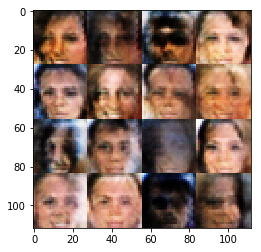

Timestamp 20170803-20-44-29.661 -  Epoch 1/1 -  Step 5810 -  D Loss: 0.9325 - G Loss: 1.6595
Timestamp 20170803-20-44-35.993 -  Epoch 1/1 -  Step 5820 -  D Loss: 1.3682 - G Loss: 0.9320
Timestamp 20170803-20-44-42.377 -  Epoch 1/1 -  Step 5830 -  D Loss: 1.1101 - G Loss: 0.9114
Timestamp 20170803-20-44-48.711 -  Epoch 1/1 -  Step 5840 -  D Loss: 1.1511 - G Loss: 0.8283
Timestamp 20170803-20-44-55.101 -  Epoch 1/1 -  Step 5850 -  D Loss: 1.0948 - G Loss: 1.0745
Timestamp 20170803-20-45-01.556 -  Epoch 1/1 -  Step 5860 -  D Loss: 1.2775 - G Loss: 0.8807
Timestamp 20170803-20-45-07.879 -  Epoch 1/1 -  Step 5870 -  D Loss: 0.9614 - G Loss: 1.3267
Timestamp 20170803-20-45-14.261 -  Epoch 1/1 -  Step 5880 -  D Loss: 0.8719 - G Loss: 1.4648
Timestamp 20170803-20-45-20.655 -  Epoch 1/1 -  Step 5890 -  D Loss: 0.8834 - G Loss: 1.5459
Timestamp 20170803-20-45-27.164 -  Epoch 1/1 -  Step 5900 -  D Loss: 0.7964 - G Loss: 2.4769


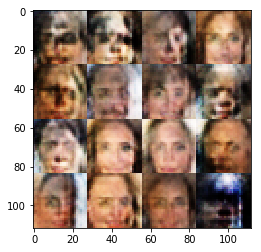

Timestamp 20170803-20-45-34.193 -  Epoch 1/1 -  Step 5910 -  D Loss: 0.9164 - G Loss: 0.8137
Timestamp 20170803-20-45-40.475 -  Epoch 1/1 -  Step 5920 -  D Loss: 0.8035 - G Loss: 2.0096
Timestamp 20170803-20-45-46.806 -  Epoch 1/1 -  Step 5930 -  D Loss: 1.2566 - G Loss: 0.5380
Timestamp 20170803-20-45-53.117 -  Epoch 1/1 -  Step 5940 -  D Loss: 0.7301 - G Loss: 2.3241
Timestamp 20170803-20-46-00.741 -  Epoch 1/1 -  Step 5950 -  D Loss: 0.8330 - G Loss: 1.9215
Timestamp 20170803-20-46-07.552 -  Epoch 1/1 -  Step 5960 -  D Loss: 1.1154 - G Loss: 1.1480
Timestamp 20170803-20-46-13.905 -  Epoch 1/1 -  Step 5970 -  D Loss: 0.7959 - G Loss: 1.2764
Timestamp 20170803-20-46-20.177 -  Epoch 1/1 -  Step 5980 -  D Loss: 1.3794 - G Loss: 1.2989
Timestamp 20170803-20-46-26.450 -  Epoch 1/1 -  Step 5990 -  D Loss: 0.5994 - G Loss: 3.4579
Timestamp 20170803-20-46-32.710 -  Epoch 1/1 -  Step 6000 -  D Loss: 0.8528 - G Loss: 1.3238


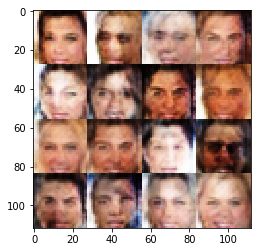

Timestamp 20170803-20-46-39.576 -  Epoch 1/1 -  Step 6010 -  D Loss: 1.0740 - G Loss: 1.5598
Timestamp 20170803-20-46-45.825 -  Epoch 1/1 -  Step 6020 -  D Loss: 0.7522 - G Loss: 2.3660
Timestamp 20170803-20-46-52.151 -  Epoch 1/1 -  Step 6030 -  D Loss: 0.8019 - G Loss: 1.4828
Timestamp 20170803-20-46-58.627 -  Epoch 1/1 -  Step 6040 -  D Loss: 1.1129 - G Loss: 0.7910
Timestamp 20170803-20-47-04.951 -  Epoch 1/1 -  Step 6050 -  D Loss: 1.2769 - G Loss: 0.8776
Timestamp 20170803-20-47-11.415 -  Epoch 1/1 -  Step 6060 -  D Loss: 1.5618 - G Loss: 0.9091
Timestamp 20170803-20-47-17.887 -  Epoch 1/1 -  Step 6070 -  D Loss: 1.3945 - G Loss: 1.1161
Timestamp 20170803-20-47-24.261 -  Epoch 1/1 -  Step 6080 -  D Loss: 0.9803 - G Loss: 1.6126
Timestamp 20170803-20-47-30.622 -  Epoch 1/1 -  Step 6090 -  D Loss: 1.0677 - G Loss: 0.9845
Timestamp 20170803-20-47-36.905 -  Epoch 1/1 -  Step 6100 -  D Loss: 0.8150 - G Loss: 0.9393


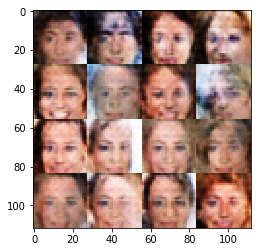

Timestamp 20170803-20-47-43.802 -  Epoch 1/1 -  Step 6110 -  D Loss: 1.0511 - G Loss: 1.3101
Timestamp 20170803-20-47-50.110 -  Epoch 1/1 -  Step 6120 -  D Loss: 0.9779 - G Loss: 1.6731
Timestamp 20170803-20-47-56.378 -  Epoch 1/1 -  Step 6130 -  D Loss: 0.9994 - G Loss: 1.9017
Timestamp 20170803-20-48-02.692 -  Epoch 1/1 -  Step 6140 -  D Loss: 0.6059 - G Loss: 1.3719
Timestamp 20170803-20-48-08.973 -  Epoch 1/1 -  Step 6150 -  D Loss: 1.4979 - G Loss: 0.9380
Timestamp 20170803-20-48-15.308 -  Epoch 1/1 -  Step 6160 -  D Loss: 0.9941 - G Loss: 0.9322
Timestamp 20170803-20-48-22.901 -  Epoch 1/1 -  Step 6170 -  D Loss: 0.8987 - G Loss: 1.0767
Timestamp 20170803-20-48-30.095 -  Epoch 1/1 -  Step 6180 -  D Loss: 1.0764 - G Loss: 0.9335
Timestamp 20170803-20-48-36.736 -  Epoch 1/1 -  Step 6190 -  D Loss: 0.7164 - G Loss: 1.5396
Timestamp 20170803-20-48-43.464 -  Epoch 1/1 -  Step 6200 -  D Loss: 1.5265 - G Loss: 1.2394


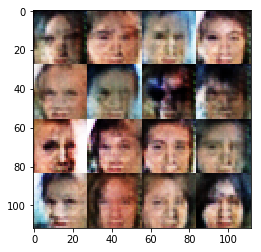

Timestamp 20170803-20-48-56.101 -  Epoch 1/1 -  Step 6210 -  D Loss: 1.1186 - G Loss: 2.2396
Timestamp 20170803-20-49-02.668 -  Epoch 1/1 -  Step 6220 -  D Loss: 1.0277 - G Loss: 1.1091
Timestamp 20170803-20-49-08.988 -  Epoch 1/1 -  Step 6230 -  D Loss: 0.7945 - G Loss: 1.1501
Timestamp 20170803-20-49-15.614 -  Epoch 1/1 -  Step 6240 -  D Loss: 1.0194 - G Loss: 1.8776
Timestamp 20170803-20-49-21.967 -  Epoch 1/1 -  Step 6250 -  D Loss: 1.2320 - G Loss: 1.3095
Timestamp 20170803-20-49-28.321 -  Epoch 1/1 -  Step 6260 -  D Loss: 1.1040 - G Loss: 1.3651
Timestamp 20170803-20-49-34.776 -  Epoch 1/1 -  Step 6270 -  D Loss: 1.6991 - G Loss: 0.7321
Timestamp 20170803-20-49-41.346 -  Epoch 1/1 -  Step 6280 -  D Loss: 0.8453 - G Loss: 1.4086
Timestamp 20170803-20-49-47.738 -  Epoch 1/1 -  Step 6290 -  D Loss: 1.0152 - G Loss: 0.8514
Timestamp 20170803-20-49-54.202 -  Epoch 1/1 -  Step 6300 -  D Loss: 1.1565 - G Loss: 1.1488


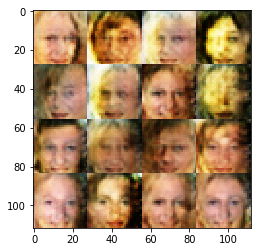

Timestamp 20170803-20-50-01.245 -  Epoch 1/1 -  Step 6310 -  D Loss: 0.8294 - G Loss: 1.1411
Timestamp 20170803-20-50-07.958 -  Epoch 1/1 -  Step 6320 -  D Loss: 1.0301 - G Loss: 1.3198
Timestamp 20170803-20-50-15.337 -  Epoch 1/1 -  Step 6330 -  D Loss: 0.8605 - G Loss: 1.6964
Timestamp 20170803-20-50-21.789 -  Epoch 1/1 -  Step 6340 -  D Loss: 0.9898 - G Loss: 1.4923
Timestamp 20170803-20-50-28.200 -  Epoch 1/1 -  Step 6350 -  D Loss: 1.1359 - G Loss: 1.2868
Timestamp 20170803-20-50-34.740 -  Epoch 1/1 -  Step 6360 -  D Loss: 1.0204 - G Loss: 1.0797
Timestamp 20170803-20-50-41.225 -  Epoch 1/1 -  Step 6370 -  D Loss: 0.9197 - G Loss: 1.1764
Timestamp 20170803-20-50-47.510 -  Epoch 1/1 -  Step 6380 -  D Loss: 1.0304 - G Loss: 1.5939
Timestamp 20170803-20-50-53.940 -  Epoch 1/1 -  Step 6390 -  D Loss: 1.1654 - G Loss: 1.0695
Timestamp 20170803-20-51-00.280 -  Epoch 1/1 -  Step 6400 -  D Loss: 0.8081 - G Loss: 1.3506


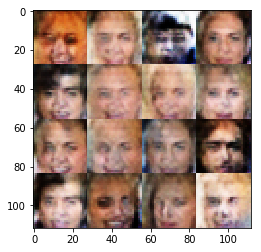

Timestamp 20170803-20-51-07.562 -  Epoch 1/1 -  Step 6410 -  D Loss: 0.7504 - G Loss: 1.7957
Timestamp 20170803-20-51-13.808 -  Epoch 1/1 -  Step 6420 -  D Loss: 1.1004 - G Loss: 1.6191
Timestamp 20170803-20-51-20.167 -  Epoch 1/1 -  Step 6430 -  D Loss: 0.8024 - G Loss: 1.4845
Timestamp 20170803-20-51-26.570 -  Epoch 1/1 -  Step 6440 -  D Loss: 1.2747 - G Loss: 1.6519
Timestamp 20170803-20-51-32.793 -  Epoch 1/1 -  Step 6450 -  D Loss: 0.5706 - G Loss: 2.0733
Timestamp 20170803-20-51-39.005 -  Epoch 1/1 -  Step 6460 -  D Loss: 0.9184 - G Loss: 1.5707
Timestamp 20170803-20-51-45.218 -  Epoch 1/1 -  Step 6470 -  D Loss: 0.7927 - G Loss: 2.1055
Timestamp 20170803-20-51-51.469 -  Epoch 1/1 -  Step 6480 -  D Loss: 0.9306 - G Loss: 1.8237
Timestamp 20170803-20-51-57.647 -  Epoch 1/1 -  Step 6490 -  D Loss: 0.7467 - G Loss: 1.4899
Timestamp 20170803-20-52-03.849 -  Epoch 1/1 -  Step 6500 -  D Loss: 0.8280 - G Loss: 1.9149


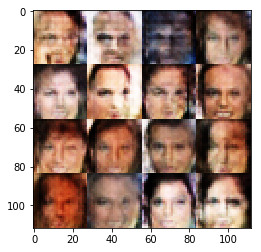

Timestamp 20170803-20-52-10.645 -  Epoch 1/1 -  Step 6510 -  D Loss: 1.5927 - G Loss: 0.8258
Timestamp 20170803-20-52-16.853 -  Epoch 1/1 -  Step 6520 -  D Loss: 0.9518 - G Loss: 1.8637
Timestamp 20170803-20-52-23.037 -  Epoch 1/1 -  Step 6530 -  D Loss: 0.6898 - G Loss: 1.5419
Timestamp 20170803-20-52-29.211 -  Epoch 1/1 -  Step 6540 -  D Loss: 0.7209 - G Loss: 2.4552
Timestamp 20170803-20-52-35.394 -  Epoch 1/1 -  Step 6550 -  D Loss: 1.6764 - G Loss: 0.7898
Timestamp 20170803-20-52-41.597 -  Epoch 1/1 -  Step 6560 -  D Loss: 1.5409 - G Loss: 0.6798
Timestamp 20170803-20-52-47.798 -  Epoch 1/1 -  Step 6570 -  D Loss: 1.1268 - G Loss: 1.2629
Timestamp 20170803-20-52-53.982 -  Epoch 1/1 -  Step 6580 -  D Loss: 0.7179 - G Loss: 1.4196
Timestamp 20170803-20-53-00.156 -  Epoch 1/1 -  Step 6590 -  D Loss: 1.1944 - G Loss: 0.8883
Timestamp 20170803-20-53-06.349 -  Epoch 1/1 -  Step 6600 -  D Loss: 0.6639 - G Loss: 1.5081


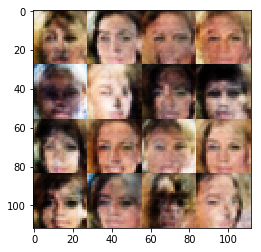

Timestamp 20170803-20-53-13.194 -  Epoch 1/1 -  Step 6610 -  D Loss: 0.9478 - G Loss: 1.0570
Timestamp 20170803-20-53-19.326 -  Epoch 1/1 -  Step 6620 -  D Loss: 1.2864 - G Loss: 1.2761
Timestamp 20170803-20-53-25.515 -  Epoch 1/1 -  Step 6630 -  D Loss: 0.6379 - G Loss: 2.0608
Timestamp 20170803-20-53-31.691 -  Epoch 1/1 -  Step 6640 -  D Loss: 1.0595 - G Loss: 1.3851
Timestamp 20170803-20-53-37.875 -  Epoch 1/1 -  Step 6650 -  D Loss: 1.0453 - G Loss: 1.5173
Timestamp 20170803-20-53-44.078 -  Epoch 1/1 -  Step 6660 -  D Loss: 1.0396 - G Loss: 0.9029
Timestamp 20170803-20-53-50.236 -  Epoch 1/1 -  Step 6670 -  D Loss: 0.7906 - G Loss: 1.7104
Timestamp 20170803-20-53-56.409 -  Epoch 1/1 -  Step 6680 -  D Loss: 0.6410 - G Loss: 1.4757
Timestamp 20170803-20-54-02.624 -  Epoch 1/1 -  Step 6690 -  D Loss: 0.7861 - G Loss: 1.6907
Timestamp 20170803-20-54-08.839 -  Epoch 1/1 -  Step 6700 -  D Loss: 1.2701 - G Loss: 0.6569


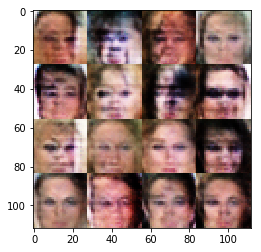

Timestamp 20170803-20-54-15.869 -  Epoch 1/1 -  Step 6710 -  D Loss: 0.9961 - G Loss: 1.3355
Timestamp 20170803-20-54-22.058 -  Epoch 1/1 -  Step 6720 -  D Loss: 1.3412 - G Loss: 2.5474
Timestamp 20170803-20-54-28.245 -  Epoch 1/1 -  Step 6730 -  D Loss: 0.9000 - G Loss: 1.4363
Timestamp 20170803-20-54-34.429 -  Epoch 1/1 -  Step 6740 -  D Loss: 1.1213 - G Loss: 1.1733
Timestamp 20170803-20-54-40.616 -  Epoch 1/1 -  Step 6750 -  D Loss: 0.7084 - G Loss: 2.5880
Timestamp 20170803-20-54-46.787 -  Epoch 1/1 -  Step 6760 -  D Loss: 1.0279 - G Loss: 1.4804
Timestamp 20170803-20-54-52.960 -  Epoch 1/1 -  Step 6770 -  D Loss: 0.7503 - G Loss: 1.2698
Timestamp 20170803-20-54-59.128 -  Epoch 1/1 -  Step 6780 -  D Loss: 1.1555 - G Loss: 1.1504
Timestamp 20170803-20-55-05.279 -  Epoch 1/1 -  Step 6790 -  D Loss: 0.9933 - G Loss: 1.3775
Timestamp 20170803-20-55-11.461 -  Epoch 1/1 -  Step 6800 -  D Loss: 0.7936 - G Loss: 1.5127


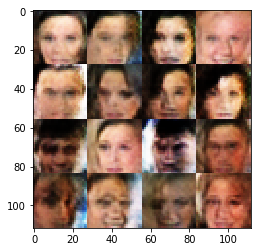

Timestamp 20170803-20-55-18.282 -  Epoch 1/1 -  Step 6810 -  D Loss: 0.6853 - G Loss: 2.7814
Timestamp 20170803-20-55-24.459 -  Epoch 1/1 -  Step 6820 -  D Loss: 0.6530 - G Loss: 2.0004
Timestamp 20170803-20-55-30.630 -  Epoch 1/1 -  Step 6830 -  D Loss: 0.7077 - G Loss: 1.7854
Timestamp 20170803-20-55-36.804 -  Epoch 1/1 -  Step 6840 -  D Loss: 0.6976 - G Loss: 1.4747
Timestamp 20170803-20-55-42.980 -  Epoch 1/1 -  Step 6850 -  D Loss: 0.9785 - G Loss: 1.1069
Timestamp 20170803-20-55-49.162 -  Epoch 1/1 -  Step 6860 -  D Loss: 0.6076 - G Loss: 1.0645
Timestamp 20170803-20-55-55.329 -  Epoch 1/1 -  Step 6870 -  D Loss: 1.1751 - G Loss: 1.0136
Timestamp 20170803-20-56-01.498 -  Epoch 1/1 -  Step 6880 -  D Loss: 1.0038 - G Loss: 1.0745
Timestamp 20170803-20-56-07.663 -  Epoch 1/1 -  Step 6890 -  D Loss: 1.0996 - G Loss: 1.6656
Timestamp 20170803-20-56-13.842 -  Epoch 1/1 -  Step 6900 -  D Loss: 0.7740 - G Loss: 1.4006


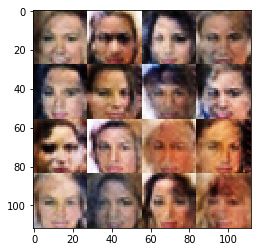

Timestamp 20170803-20-56-20.680 -  Epoch 1/1 -  Step 6910 -  D Loss: 1.0646 - G Loss: 1.2578
Timestamp 20170803-20-56-26.853 -  Epoch 1/1 -  Step 6920 -  D Loss: 0.7908 - G Loss: 0.8566
Timestamp 20170803-20-56-33.037 -  Epoch 1/1 -  Step 6930 -  D Loss: 1.1354 - G Loss: 2.6282
Timestamp 20170803-20-56-39.196 -  Epoch 1/1 -  Step 6940 -  D Loss: 0.9679 - G Loss: 1.2864
Timestamp 20170803-20-56-45.390 -  Epoch 1/1 -  Step 6950 -  D Loss: 1.2163 - G Loss: 1.2087
Timestamp 20170803-20-56-51.552 -  Epoch 1/1 -  Step 6960 -  D Loss: 1.1703 - G Loss: 0.9696
Timestamp 20170803-20-56-57.738 -  Epoch 1/1 -  Step 6970 -  D Loss: 0.8503 - G Loss: 1.7693
Timestamp 20170803-20-57-03.902 -  Epoch 1/1 -  Step 6980 -  D Loss: 1.1012 - G Loss: 1.4243
Timestamp 20170803-20-57-10.081 -  Epoch 1/1 -  Step 6990 -  D Loss: 0.8642 - G Loss: 1.1661
Timestamp 20170803-20-57-16.253 -  Epoch 1/1 -  Step 7000 -  D Loss: 0.7820 - G Loss: 1.6593


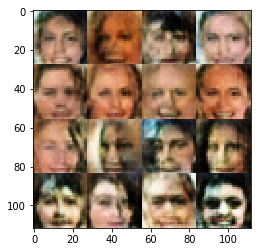

Timestamp 20170803-20-57-23.076 -  Epoch 1/1 -  Step 7010 -  D Loss: 0.7959 - G Loss: 1.5027
Timestamp 20170803-20-57-29.256 -  Epoch 1/1 -  Step 7020 -  D Loss: 0.9368 - G Loss: 1.4866
Timestamp 20170803-20-57-35.437 -  Epoch 1/1 -  Step 7030 -  D Loss: 1.0763 - G Loss: 1.4640
Timestamp 20170803-20-57-41.638 -  Epoch 1/1 -  Step 7040 -  D Loss: 1.0169 - G Loss: 1.2747
Timestamp 20170803-20-57-47.799 -  Epoch 1/1 -  Step 7050 -  D Loss: 0.8431 - G Loss: 2.2099
Timestamp 20170803-20-57-54.017 -  Epoch 1/1 -  Step 7060 -  D Loss: 0.8260 - G Loss: 1.1588
Timestamp 20170803-20-58-00.173 -  Epoch 1/1 -  Step 7070 -  D Loss: 0.9509 - G Loss: 1.2048
Timestamp 20170803-20-58-06.363 -  Epoch 1/1 -  Step 7080 -  D Loss: 1.0381 - G Loss: 1.4112
Timestamp 20170803-20-58-12.552 -  Epoch 1/1 -  Step 7090 -  D Loss: 0.7883 - G Loss: 1.2438
Timestamp 20170803-20-58-18.728 -  Epoch 1/1 -  Step 7100 -  D Loss: 0.9659 - G Loss: 1.6132


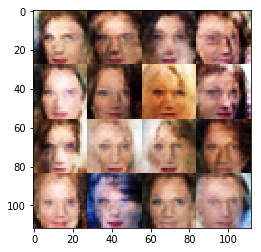

Timestamp 20170803-20-58-25.557 -  Epoch 1/1 -  Step 7110 -  D Loss: 0.9656 - G Loss: 1.2302
Timestamp 20170803-20-58-31.736 -  Epoch 1/1 -  Step 7120 -  D Loss: 1.2057 - G Loss: 0.7344
Timestamp 20170803-20-58-37.901 -  Epoch 1/1 -  Step 7130 -  D Loss: 0.9973 - G Loss: 1.3171
Timestamp 20170803-20-58-44.074 -  Epoch 1/1 -  Step 7140 -  D Loss: 0.7149 - G Loss: 1.0190
Timestamp 20170803-20-58-50.248 -  Epoch 1/1 -  Step 7150 -  D Loss: 0.6964 - G Loss: 2.6124
Timestamp 20170803-20-58-56.428 -  Epoch 1/1 -  Step 7160 -  D Loss: 1.0850 - G Loss: 1.2097
Timestamp 20170803-20-59-02.575 -  Epoch 1/1 -  Step 7170 -  D Loss: 0.8310 - G Loss: 1.2454
Timestamp 20170803-20-59-08.787 -  Epoch 1/1 -  Step 7180 -  D Loss: 1.1352 - G Loss: 1.1935
Timestamp 20170803-20-59-14.948 -  Epoch 1/1 -  Step 7190 -  D Loss: 0.9493 - G Loss: 1.8098
Timestamp 20170803-20-59-21.133 -  Epoch 1/1 -  Step 7200 -  D Loss: 0.7483 - G Loss: 1.4634


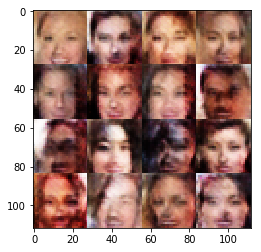

Timestamp 20170803-20-59-28.137 -  Epoch 1/1 -  Step 7210 -  D Loss: 1.3186 - G Loss: 1.3685
Timestamp 20170803-20-59-34.303 -  Epoch 1/1 -  Step 7220 -  D Loss: 1.2023 - G Loss: 1.2772
Timestamp 20170803-20-59-40.480 -  Epoch 1/1 -  Step 7230 -  D Loss: 1.0172 - G Loss: 0.9198
Timestamp 20170803-20-59-46.658 -  Epoch 1/1 -  Step 7240 -  D Loss: 0.7956 - G Loss: 1.2533
Timestamp 20170803-20-59-52.831 -  Epoch 1/1 -  Step 7250 -  D Loss: 0.7848 - G Loss: 0.6100
Timestamp 20170803-20-59-58.998 -  Epoch 1/1 -  Step 7260 -  D Loss: 1.3547 - G Loss: 1.2682
Timestamp 20170803-21-00-05.160 -  Epoch 1/1 -  Step 7270 -  D Loss: 0.7161 - G Loss: 1.6509
Timestamp 20170803-21-00-11.331 -  Epoch 1/1 -  Step 7280 -  D Loss: 1.3361 - G Loss: 0.5916
Timestamp 20170803-21-00-17.488 -  Epoch 1/1 -  Step 7290 -  D Loss: 0.8382 - G Loss: 1.7400
Timestamp 20170803-21-00-23.652 -  Epoch 1/1 -  Step 7300 -  D Loss: 1.3756 - G Loss: 0.6545


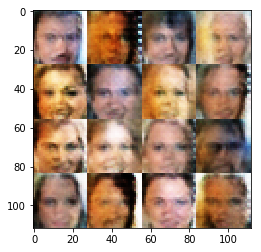

Timestamp 20170803-21-00-30.511 -  Epoch 1/1 -  Step 7310 -  D Loss: 1.2000 - G Loss: 1.3651
Timestamp 20170803-21-00-36.667 -  Epoch 1/1 -  Step 7320 -  D Loss: 1.3541 - G Loss: 0.8025
Timestamp 20170803-21-00-42.856 -  Epoch 1/1 -  Step 7330 -  D Loss: 0.7684 - G Loss: 2.0612
Timestamp 20170803-21-00-49.018 -  Epoch 1/1 -  Step 7340 -  D Loss: 0.9259 - G Loss: 1.3301
Timestamp 20170803-21-00-55.193 -  Epoch 1/1 -  Step 7350 -  D Loss: 0.5597 - G Loss: 2.1829
Timestamp 20170803-21-01-01.395 -  Epoch 1/1 -  Step 7360 -  D Loss: 1.2219 - G Loss: 0.8490
Timestamp 20170803-21-01-07.562 -  Epoch 1/1 -  Step 7370 -  D Loss: 0.9935 - G Loss: 1.9013
Timestamp 20170803-21-01-13.732 -  Epoch 1/1 -  Step 7380 -  D Loss: 1.0086 - G Loss: 1.1973
Timestamp 20170803-21-01-19.914 -  Epoch 1/1 -  Step 7390 -  D Loss: 0.5845 - G Loss: 2.6047
Timestamp 20170803-21-01-26.068 -  Epoch 1/1 -  Step 7400 -  D Loss: 0.8097 - G Loss: 1.3186


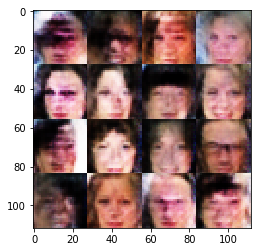

Timestamp 20170803-21-01-32.907 -  Epoch 1/1 -  Step 7410 -  D Loss: 1.4127 - G Loss: 0.8141
Timestamp 20170803-21-01-39.080 -  Epoch 1/1 -  Step 7420 -  D Loss: 0.7817 - G Loss: 0.9911
Timestamp 20170803-21-01-45.258 -  Epoch 1/1 -  Step 7430 -  D Loss: 0.9909 - G Loss: 0.8479
Timestamp 20170803-21-01-51.432 -  Epoch 1/1 -  Step 7440 -  D Loss: 0.9591 - G Loss: 1.9585
Timestamp 20170803-21-01-57.621 -  Epoch 1/1 -  Step 7450 -  D Loss: 0.7708 - G Loss: 1.9679
Timestamp 20170803-21-02-03.787 -  Epoch 1/1 -  Step 7460 -  D Loss: 0.7442 - G Loss: 1.1990
Timestamp 20170803-21-02-09.951 -  Epoch 1/1 -  Step 7470 -  D Loss: 0.7360 - G Loss: 1.9948
Timestamp 20170803-21-02-16.122 -  Epoch 1/1 -  Step 7480 -  D Loss: 0.7348 - G Loss: 1.5942
Timestamp 20170803-21-02-22.304 -  Epoch 1/1 -  Step 7490 -  D Loss: 0.6261 - G Loss: 2.6010
Timestamp 20170803-21-02-28.462 -  Epoch 1/1 -  Step 7500 -  D Loss: 0.7791 - G Loss: 2.0792


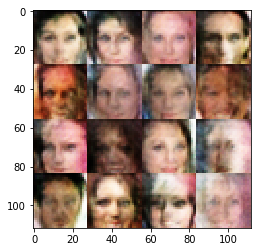

Timestamp 20170803-21-02-35.307 -  Epoch 1/1 -  Step 7510 -  D Loss: 1.1078 - G Loss: 1.6518
Timestamp 20170803-21-02-41.532 -  Epoch 1/1 -  Step 7520 -  D Loss: 1.1138 - G Loss: 1.1212
Timestamp 20170803-21-02-47.720 -  Epoch 1/1 -  Step 7530 -  D Loss: 0.9242 - G Loss: 0.9627
Timestamp 20170803-21-02-53.897 -  Epoch 1/1 -  Step 7540 -  D Loss: 0.6786 - G Loss: 1.8938
Timestamp 20170803-21-03-00.062 -  Epoch 1/1 -  Step 7550 -  D Loss: 1.3739 - G Loss: 0.6814
Timestamp 20170803-21-03-06.222 -  Epoch 1/1 -  Step 7560 -  D Loss: 1.2734 - G Loss: 1.0311
Timestamp 20170803-21-03-12.383 -  Epoch 1/1 -  Step 7570 -  D Loss: 1.2623 - G Loss: 2.0491
Timestamp 20170803-21-03-18.588 -  Epoch 1/1 -  Step 7580 -  D Loss: 1.7325 - G Loss: 0.6193
Timestamp 20170803-21-03-24.775 -  Epoch 1/1 -  Step 7590 -  D Loss: 1.1485 - G Loss: 1.1658
Timestamp 20170803-21-03-30.958 -  Epoch 1/1 -  Step 7600 -  D Loss: 1.5255 - G Loss: 0.6019


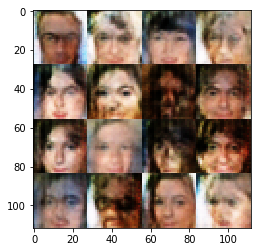

Timestamp 20170803-21-03-37.908 -  Epoch 1/1 -  Step 7610 -  D Loss: 1.0143 - G Loss: 1.1383
Timestamp 20170803-21-03-44.098 -  Epoch 1/1 -  Step 7620 -  D Loss: 1.1962 - G Loss: 0.8004
Timestamp 20170803-21-03-50.288 -  Epoch 1/1 -  Step 7630 -  D Loss: 0.8085 - G Loss: 1.6063
Timestamp 20170803-21-03-56.487 -  Epoch 1/1 -  Step 7640 -  D Loss: 1.3456 - G Loss: 0.8581
Timestamp 20170803-21-04-02.673 -  Epoch 1/1 -  Step 7650 -  D Loss: 1.2734 - G Loss: 1.1159
Timestamp 20170803-21-04-08.880 -  Epoch 1/1 -  Step 7660 -  D Loss: 0.7215 - G Loss: 1.2399
Timestamp 20170803-21-04-15.080 -  Epoch 1/1 -  Step 7670 -  D Loss: 1.5779 - G Loss: 0.9044
Timestamp 20170803-21-04-21.302 -  Epoch 1/1 -  Step 7680 -  D Loss: 0.8324 - G Loss: 1.6711
Timestamp 20170803-21-04-27.475 -  Epoch 1/1 -  Step 7690 -  D Loss: 0.9201 - G Loss: 1.1800
Timestamp 20170803-21-04-33.679 -  Epoch 1/1 -  Step 7700 -  D Loss: 0.9297 - G Loss: 1.7751


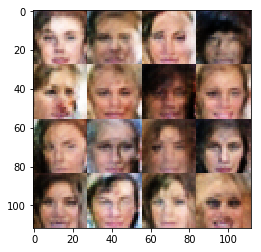

Timestamp 20170803-21-04-40.539 -  Epoch 1/1 -  Step 7710 -  D Loss: 0.6836 - G Loss: 1.6417
Timestamp 20170803-21-04-46.722 -  Epoch 1/1 -  Step 7720 -  D Loss: 0.9308 - G Loss: 1.5510
Timestamp 20170803-21-04-52.919 -  Epoch 1/1 -  Step 7730 -  D Loss: 0.9459 - G Loss: 1.4732
Timestamp 20170803-21-04-59.096 -  Epoch 1/1 -  Step 7740 -  D Loss: 1.1803 - G Loss: 1.1803
Timestamp 20170803-21-05-05.266 -  Epoch 1/1 -  Step 7750 -  D Loss: 0.6708 - G Loss: 1.6920
Timestamp 20170803-21-05-11.462 -  Epoch 1/1 -  Step 7760 -  D Loss: 0.9953 - G Loss: 1.4501
Timestamp 20170803-21-05-17.630 -  Epoch 1/1 -  Step 7770 -  D Loss: 0.7998 - G Loss: 0.9555
Timestamp 20170803-21-05-23.839 -  Epoch 1/1 -  Step 7780 -  D Loss: 0.9574 - G Loss: 1.2634
Timestamp 20170803-21-05-30.030 -  Epoch 1/1 -  Step 7790 -  D Loss: 0.9190 - G Loss: 1.9294
Timestamp 20170803-21-05-36.214 -  Epoch 1/1 -  Step 7800 -  D Loss: 1.6128 - G Loss: 0.7462


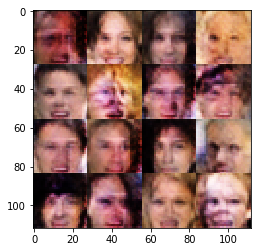

Timestamp 20170803-21-05-43.145 -  Epoch 1/1 -  Step 7810 -  D Loss: 1.2651 - G Loss: 0.6493
Timestamp 20170803-21-05-49.316 -  Epoch 1/1 -  Step 7820 -  D Loss: 0.8983 - G Loss: 1.0123
Timestamp 20170803-21-05-55.499 -  Epoch 1/1 -  Step 7830 -  D Loss: 0.9368 - G Loss: 1.2570
Timestamp 20170803-21-06-01.692 -  Epoch 1/1 -  Step 7840 -  D Loss: 0.9552 - G Loss: 1.1118
Timestamp 20170803-21-06-07.860 -  Epoch 1/1 -  Step 7850 -  D Loss: 1.0387 - G Loss: 1.1859
Timestamp 20170803-21-06-14.039 -  Epoch 1/1 -  Step 7860 -  D Loss: 0.7309 - G Loss: 1.5724
Timestamp 20170803-21-06-20.262 -  Epoch 1/1 -  Step 7870 -  D Loss: 1.1503 - G Loss: 1.1268
Timestamp 20170803-21-06-26.445 -  Epoch 1/1 -  Step 7880 -  D Loss: 1.0940 - G Loss: 0.7665
Timestamp 20170803-21-06-32.629 -  Epoch 1/1 -  Step 7890 -  D Loss: 0.8101 - G Loss: 2.3783
Timestamp 20170803-21-06-38.814 -  Epoch 1/1 -  Step 7900 -  D Loss: 0.9341 - G Loss: 0.8131


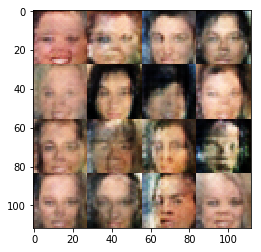

Timestamp 20170803-21-06-45.657 -  Epoch 1/1 -  Step 7910 -  D Loss: 0.7339 - G Loss: 1.6376
Timestamp 20170803-21-06-51.847 -  Epoch 1/1 -  Step 7920 -  D Loss: 0.8157 - G Loss: 1.4369
Timestamp 20170803-21-06-58.039 -  Epoch 1/1 -  Step 7930 -  D Loss: 1.1573 - G Loss: 1.0810
Timestamp 20170803-21-07-04.236 -  Epoch 1/1 -  Step 7940 -  D Loss: 1.1010 - G Loss: 1.9358
Timestamp 20170803-21-07-10.418 -  Epoch 1/1 -  Step 7950 -  D Loss: 1.3297 - G Loss: 0.7322
Timestamp 20170803-21-07-16.592 -  Epoch 1/1 -  Step 7960 -  D Loss: 0.7686 - G Loss: 1.5842
Timestamp 20170803-21-07-22.772 -  Epoch 1/1 -  Step 7970 -  D Loss: 1.0832 - G Loss: 0.7781
Timestamp 20170803-21-07-28.959 -  Epoch 1/1 -  Step 7980 -  D Loss: 1.0715 - G Loss: 0.4232
Timestamp 20170803-21-07-35.138 -  Epoch 1/1 -  Step 7990 -  D Loss: 0.6322 - G Loss: 1.9085
Timestamp 20170803-21-07-41.336 -  Epoch 1/1 -  Step 8000 -  D Loss: 1.0134 - G Loss: 1.0831


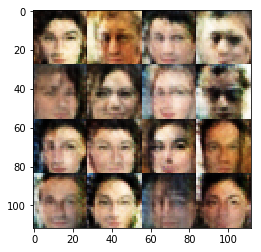

Timestamp 20170803-21-07-48.209 -  Epoch 1/1 -  Step 8010 -  D Loss: 0.6654 - G Loss: 1.5345
Timestamp 20170803-21-07-54.387 -  Epoch 1/1 -  Step 8020 -  D Loss: 1.0545 - G Loss: 0.9976
Timestamp 20170803-21-08-00.605 -  Epoch 1/1 -  Step 8030 -  D Loss: 0.9723 - G Loss: 1.3774
Timestamp 20170803-21-08-06.812 -  Epoch 1/1 -  Step 8040 -  D Loss: 0.9591 - G Loss: 1.0030
Timestamp 20170803-21-08-12.997 -  Epoch 1/1 -  Step 8050 -  D Loss: 1.2871 - G Loss: 1.1755
Timestamp 20170803-21-08-19.179 -  Epoch 1/1 -  Step 8060 -  D Loss: 0.9113 - G Loss: 1.0473
Timestamp 20170803-21-08-25.369 -  Epoch 1/1 -  Step 8070 -  D Loss: 1.2385 - G Loss: 0.9448
Timestamp 20170803-21-08-31.543 -  Epoch 1/1 -  Step 8080 -  D Loss: 0.9115 - G Loss: 1.1884
Timestamp 20170803-21-08-37.737 -  Epoch 1/1 -  Step 8090 -  D Loss: 1.2551 - G Loss: 1.8099
Timestamp 20170803-21-08-43.932 -  Epoch 1/1 -  Step 8100 -  D Loss: 0.7840 - G Loss: 1.4944


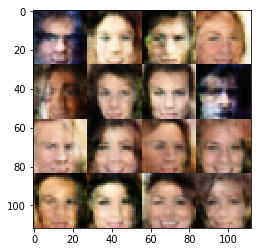

Timestamp 20170803-21-08-50.807 -  Epoch 1/1 -  Step 8110 -  D Loss: 1.2412 - G Loss: 0.6918
Timestamp 20170803-21-08-56.994 -  Epoch 1/1 -  Step 8120 -  D Loss: 1.4622 - G Loss: 0.4039
Timestamp 20170803-21-09-03.171 -  Epoch 1/1 -  Step 8130 -  D Loss: 0.7460 - G Loss: 1.1717
Timestamp 20170803-21-09-09.373 -  Epoch 1/1 -  Step 8140 -  D Loss: 1.1073 - G Loss: 1.7791
Timestamp 20170803-21-09-15.587 -  Epoch 1/1 -  Step 8150 -  D Loss: 0.8308 - G Loss: 1.1682
Timestamp 20170803-21-09-21.771 -  Epoch 1/1 -  Step 8160 -  D Loss: 0.8308 - G Loss: 2.0516
Timestamp 20170803-21-09-27.945 -  Epoch 1/1 -  Step 8170 -  D Loss: 0.9819 - G Loss: 1.1821
Timestamp 20170803-21-09-34.153 -  Epoch 1/1 -  Step 8180 -  D Loss: 0.7408 - G Loss: 1.3931
Timestamp 20170803-21-09-40.373 -  Epoch 1/1 -  Step 8190 -  D Loss: 1.5493 - G Loss: 0.2969
Timestamp 20170803-21-09-46.548 -  Epoch 1/1 -  Step 8200 -  D Loss: 0.6944 - G Loss: 2.3768


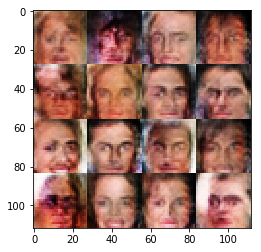

Timestamp 20170803-21-09-53.750 -  Epoch 1/1 -  Step 8210 -  D Loss: 0.8898 - G Loss: 0.9282
Timestamp 20170803-21-09-59.926 -  Epoch 1/1 -  Step 8220 -  D Loss: 0.8167 - G Loss: 1.8464
Timestamp 20170803-21-10-06.125 -  Epoch 1/1 -  Step 8230 -  D Loss: 1.0070 - G Loss: 1.1222
Timestamp 20170803-21-10-12.302 -  Epoch 1/1 -  Step 8240 -  D Loss: 0.6923 - G Loss: 1.3241
Timestamp 20170803-21-10-18.484 -  Epoch 1/1 -  Step 8250 -  D Loss: 1.0637 - G Loss: 1.3084
Timestamp 20170803-21-10-24.690 -  Epoch 1/1 -  Step 8260 -  D Loss: 0.8816 - G Loss: 1.2116
Timestamp 20170803-21-10-30.890 -  Epoch 1/1 -  Step 8270 -  D Loss: 1.2301 - G Loss: 1.0612
Timestamp 20170803-21-10-37.098 -  Epoch 1/1 -  Step 8280 -  D Loss: 0.9691 - G Loss: 1.1944
Timestamp 20170803-21-10-43.289 -  Epoch 1/1 -  Step 8290 -  D Loss: 0.9643 - G Loss: 0.7081
Timestamp 20170803-21-10-49.497 -  Epoch 1/1 -  Step 8300 -  D Loss: 0.6553 - G Loss: 1.7335


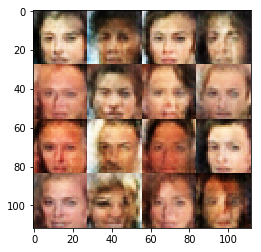

Timestamp 20170803-21-10-56.573 -  Epoch 1/1 -  Step 8310 -  D Loss: 1.1362 - G Loss: 1.0893
Timestamp 20170803-21-11-02.792 -  Epoch 1/1 -  Step 8320 -  D Loss: 0.6324 - G Loss: 1.6604
Timestamp 20170803-21-11-08.969 -  Epoch 1/1 -  Step 8330 -  D Loss: 0.5942 - G Loss: 1.8391
Timestamp 20170803-21-11-15.172 -  Epoch 1/1 -  Step 8340 -  D Loss: 0.7642 - G Loss: 1.0780
Timestamp 20170803-21-11-21.350 -  Epoch 1/1 -  Step 8350 -  D Loss: 0.9980 - G Loss: 1.5710
Timestamp 20170803-21-11-27.576 -  Epoch 1/1 -  Step 8360 -  D Loss: 0.6930 - G Loss: 1.8998
Timestamp 20170803-21-11-33.787 -  Epoch 1/1 -  Step 8370 -  D Loss: 0.9389 - G Loss: 1.8654
Timestamp 20170803-21-11-39.960 -  Epoch 1/1 -  Step 8380 -  D Loss: 1.1357 - G Loss: 1.0304
Timestamp 20170803-21-11-46.155 -  Epoch 1/1 -  Step 8390 -  D Loss: 1.3797 - G Loss: 0.8155
Timestamp 20170803-21-11-52.335 -  Epoch 1/1 -  Step 8400 -  D Loss: 0.9964 - G Loss: 1.4639


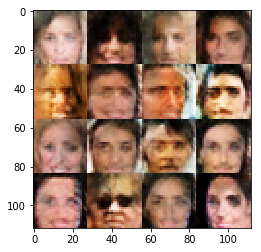

Timestamp 20170803-21-11-59.210 -  Epoch 1/1 -  Step 8410 -  D Loss: 1.1424 - G Loss: 1.4390
Timestamp 20170803-21-12-05.395 -  Epoch 1/1 -  Step 8420 -  D Loss: 0.7937 - G Loss: 1.4568
Timestamp 20170803-21-12-11.577 -  Epoch 1/1 -  Step 8430 -  D Loss: 0.7744 - G Loss: 1.1214
Timestamp 20170803-21-12-17.757 -  Epoch 1/1 -  Step 8440 -  D Loss: 1.2735 - G Loss: 0.9787
Timestamp 20170803-21-12-23.938 -  Epoch 1/1 -  Step 8450 -  D Loss: 0.8749 - G Loss: 1.3123
Timestamp 20170803-21-12-30.133 -  Epoch 1/1 -  Step 8460 -  D Loss: 0.9730 - G Loss: 0.9323
Timestamp 20170803-21-12-36.317 -  Epoch 1/1 -  Step 8470 -  D Loss: 0.7420 - G Loss: 2.0309
Timestamp 20170803-21-12-42.496 -  Epoch 1/1 -  Step 8480 -  D Loss: 1.1147 - G Loss: 0.7126
Timestamp 20170803-21-12-48.684 -  Epoch 1/1 -  Step 8490 -  D Loss: 0.8820 - G Loss: 2.8171
Timestamp 20170803-21-12-54.861 -  Epoch 1/1 -  Step 8500 -  D Loss: 0.9551 - G Loss: 1.4217


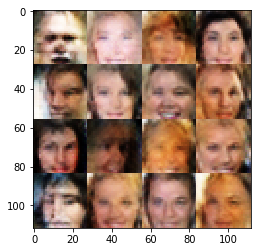

Timestamp 20170803-21-13-01.732 -  Epoch 1/1 -  Step 8510 -  D Loss: 0.9454 - G Loss: 1.2994
Timestamp 20170803-21-13-07.932 -  Epoch 1/1 -  Step 8520 -  D Loss: 1.1106 - G Loss: 0.9005
Timestamp 20170803-21-13-14.140 -  Epoch 1/1 -  Step 8530 -  D Loss: 0.8546 - G Loss: 2.1788
Timestamp 20170803-21-13-20.342 -  Epoch 1/1 -  Step 8540 -  D Loss: 1.0295 - G Loss: 0.9277
Timestamp 20170803-21-13-26.547 -  Epoch 1/1 -  Step 8550 -  D Loss: 0.9121 - G Loss: 0.7539
Timestamp 20170803-21-13-32.725 -  Epoch 1/1 -  Step 8560 -  D Loss: 1.0311 - G Loss: 0.9169
Timestamp 20170803-21-13-38.908 -  Epoch 1/1 -  Step 8570 -  D Loss: 0.7407 - G Loss: 1.0643
Timestamp 20170803-21-13-45.102 -  Epoch 1/1 -  Step 8580 -  D Loss: 1.0657 - G Loss: 1.1836
Timestamp 20170803-21-13-51.272 -  Epoch 1/1 -  Step 8590 -  D Loss: 0.9132 - G Loss: 1.4651
Timestamp 20170803-21-13-57.449 -  Epoch 1/1 -  Step 8600 -  D Loss: 1.0766 - G Loss: 0.7797


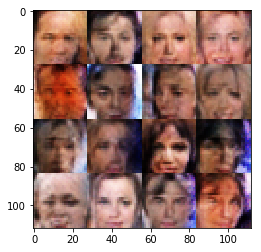

Timestamp 20170803-21-14-04.339 -  Epoch 1/1 -  Step 8610 -  D Loss: 0.8999 - G Loss: 1.0442
Timestamp 20170803-21-14-10.538 -  Epoch 1/1 -  Step 8620 -  D Loss: 0.8693 - G Loss: 1.2156
Timestamp 20170803-21-14-16.727 -  Epoch 1/1 -  Step 8630 -  D Loss: 0.8257 - G Loss: 1.4192
Timestamp 20170803-21-14-22.935 -  Epoch 1/1 -  Step 8640 -  D Loss: 0.7728 - G Loss: 2.1164
Timestamp 20170803-21-14-29.125 -  Epoch 1/1 -  Step 8650 -  D Loss: 1.3215 - G Loss: 0.7886
Timestamp 20170803-21-14-35.330 -  Epoch 1/1 -  Step 8660 -  D Loss: 0.9882 - G Loss: 1.8115
Timestamp 20170803-21-14-41.513 -  Epoch 1/1 -  Step 8670 -  D Loss: 0.8926 - G Loss: 1.5087
Timestamp 20170803-21-14-47.694 -  Epoch 1/1 -  Step 8680 -  D Loss: 0.7543 - G Loss: 1.0474
Timestamp 20170803-21-14-53.900 -  Epoch 1/1 -  Step 8690 -  D Loss: 0.8655 - G Loss: 2.0487
Timestamp 20170803-21-15-00.067 -  Epoch 1/1 -  Step 8700 -  D Loss: 1.0860 - G Loss: 1.4878


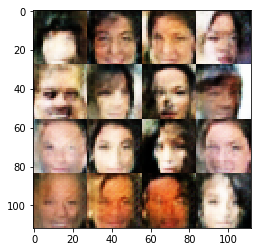

Timestamp 20170803-21-15-06.944 -  Epoch 1/1 -  Step 8710 -  D Loss: 1.1515 - G Loss: 0.8059
Timestamp 20170803-21-15-13.139 -  Epoch 1/1 -  Step 8720 -  D Loss: 1.1123 - G Loss: 1.4340
Timestamp 20170803-21-15-19.317 -  Epoch 1/1 -  Step 8730 -  D Loss: 0.8018 - G Loss: 1.1335
Timestamp 20170803-21-15-25.524 -  Epoch 1/1 -  Step 8740 -  D Loss: 1.2928 - G Loss: 1.5847
Timestamp 20170803-21-15-31.701 -  Epoch 1/1 -  Step 8750 -  D Loss: 1.0074 - G Loss: 1.6508
Timestamp 20170803-21-15-37.877 -  Epoch 1/1 -  Step 8760 -  D Loss: 1.0915 - G Loss: 0.8125
Timestamp 20170803-21-15-44.068 -  Epoch 1/1 -  Step 8770 -  D Loss: 0.9296 - G Loss: 1.5491
Timestamp 20170803-21-15-50.239 -  Epoch 1/1 -  Step 8780 -  D Loss: 1.3541 - G Loss: 0.9844
Timestamp 20170803-21-15-56.411 -  Epoch 1/1 -  Step 8790 -  D Loss: 0.7780 - G Loss: 0.8823
Timestamp 20170803-21-16-02.608 -  Epoch 1/1 -  Step 8800 -  D Loss: 0.8749 - G Loss: 1.1276


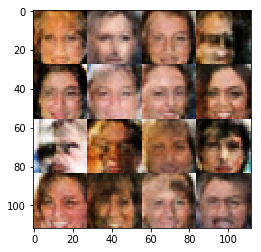

Timestamp 20170803-21-16-09.492 -  Epoch 1/1 -  Step 8810 -  D Loss: 1.1149 - G Loss: 1.4609
Timestamp 20170803-21-16-15.660 -  Epoch 1/1 -  Step 8820 -  D Loss: 1.0178 - G Loss: 1.2916
Timestamp 20170803-21-16-21.856 -  Epoch 1/1 -  Step 8830 -  D Loss: 1.0851 - G Loss: 0.7971
Timestamp 20170803-21-16-28.033 -  Epoch 1/1 -  Step 8840 -  D Loss: 1.3814 - G Loss: 0.9816
Timestamp 20170803-21-16-34.208 -  Epoch 1/1 -  Step 8850 -  D Loss: 1.2092 - G Loss: 0.9027
Timestamp 20170803-21-16-40.392 -  Epoch 1/1 -  Step 8860 -  D Loss: 1.6411 - G Loss: 1.5028
Timestamp 20170803-21-16-46.598 -  Epoch 1/1 -  Step 8870 -  D Loss: 1.1302 - G Loss: 0.9510
Timestamp 20170803-21-16-52.764 -  Epoch 1/1 -  Step 8880 -  D Loss: 0.6089 - G Loss: 1.7934
Timestamp 20170803-21-16-58.945 -  Epoch 1/1 -  Step 8890 -  D Loss: 1.0401 - G Loss: 1.1288
Timestamp 20170803-21-17-05.137 -  Epoch 1/1 -  Step 8900 -  D Loss: 1.2662 - G Loss: 1.5400


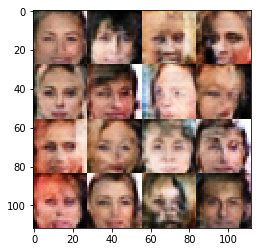

Timestamp 20170803-21-17-12.017 -  Epoch 1/1 -  Step 8910 -  D Loss: 1.4326 - G Loss: 1.0152
Timestamp 20170803-21-17-18.189 -  Epoch 1/1 -  Step 8920 -  D Loss: 0.7515 - G Loss: 1.7954
Timestamp 20170803-21-17-24.359 -  Epoch 1/1 -  Step 8930 -  D Loss: 1.0953 - G Loss: 0.9239
Timestamp 20170803-21-17-30.538 -  Epoch 1/1 -  Step 8940 -  D Loss: 0.9812 - G Loss: 1.2099
Timestamp 20170803-21-17-36.732 -  Epoch 1/1 -  Step 8950 -  D Loss: 1.4210 - G Loss: 0.8216
Timestamp 20170803-21-17-42.912 -  Epoch 1/1 -  Step 8960 -  D Loss: 0.8698 - G Loss: 1.6879
Timestamp 20170803-21-17-49.100 -  Epoch 1/1 -  Step 8970 -  D Loss: 0.9494 - G Loss: 1.2072
Timestamp 20170803-21-17-55.323 -  Epoch 1/1 -  Step 8980 -  D Loss: 0.9557 - G Loss: 1.4842
Timestamp 20170803-21-18-01.537 -  Epoch 1/1 -  Step 8990 -  D Loss: 0.7324 - G Loss: 1.5535
Timestamp 20170803-21-18-07.717 -  Epoch 1/1 -  Step 9000 -  D Loss: 1.1824 - G Loss: 1.5108


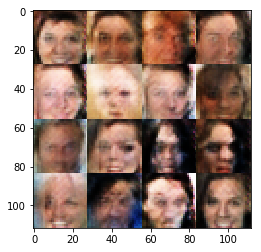

Timestamp 20170803-21-18-14.599 -  Epoch 1/1 -  Step 9010 -  D Loss: 1.3420 - G Loss: 0.9606
Timestamp 20170803-21-18-20.777 -  Epoch 1/1 -  Step 9020 -  D Loss: 0.7013 - G Loss: 1.2375
Timestamp 20170803-21-18-26.955 -  Epoch 1/1 -  Step 9030 -  D Loss: 1.3564 - G Loss: 1.2082
Timestamp 20170803-21-18-33.136 -  Epoch 1/1 -  Step 9040 -  D Loss: 0.8521 - G Loss: 1.3317
Timestamp 20170803-21-18-39.327 -  Epoch 1/1 -  Step 9050 -  D Loss: 0.6707 - G Loss: 1.2106
Timestamp 20170803-21-18-45.522 -  Epoch 1/1 -  Step 9060 -  D Loss: 1.0881 - G Loss: 0.9985
Timestamp 20170803-21-18-51.709 -  Epoch 1/1 -  Step 9070 -  D Loss: 0.9112 - G Loss: 1.6855
Timestamp 20170803-21-18-57.898 -  Epoch 1/1 -  Step 9080 -  D Loss: 1.0967 - G Loss: 0.8724
Timestamp 20170803-21-19-04.086 -  Epoch 1/1 -  Step 9090 -  D Loss: 1.0582 - G Loss: 1.1964
Timestamp 20170803-21-19-10.258 -  Epoch 1/1 -  Step 9100 -  D Loss: 0.9060 - G Loss: 1.6363


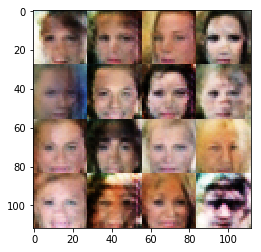

Timestamp 20170803-21-19-17.153 -  Epoch 1/1 -  Step 9110 -  D Loss: 0.9795 - G Loss: 1.5103
Timestamp 20170803-21-19-23.340 -  Epoch 1/1 -  Step 9120 -  D Loss: 1.1090 - G Loss: 1.0398
Timestamp 20170803-21-19-29.532 -  Epoch 1/1 -  Step 9130 -  D Loss: 0.7962 - G Loss: 1.5425
Timestamp 20170803-21-19-35.717 -  Epoch 1/1 -  Step 9140 -  D Loss: 1.1630 - G Loss: 1.7814
Timestamp 20170803-21-19-41.896 -  Epoch 1/1 -  Step 9150 -  D Loss: 1.6238 - G Loss: 0.8432
Timestamp 20170803-21-19-48.101 -  Epoch 1/1 -  Step 9160 -  D Loss: 0.9119 - G Loss: 0.8871
Timestamp 20170803-21-19-54.307 -  Epoch 1/1 -  Step 9170 -  D Loss: 1.5859 - G Loss: 0.6097
Timestamp 20170803-21-20-00.490 -  Epoch 1/1 -  Step 9180 -  D Loss: 0.8550 - G Loss: 1.3676
Timestamp 20170803-21-20-06.667 -  Epoch 1/1 -  Step 9190 -  D Loss: 1.2885 - G Loss: 0.9771
Timestamp 20170803-21-20-12.844 -  Epoch 1/1 -  Step 9200 -  D Loss: 0.9582 - G Loss: 1.2978


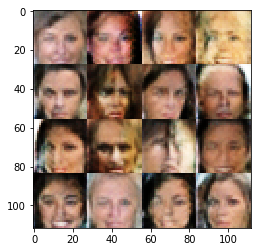

Timestamp 20170803-21-20-19.717 -  Epoch 1/1 -  Step 9210 -  D Loss: 0.8543 - G Loss: 1.4762
Timestamp 20170803-21-20-25.892 -  Epoch 1/1 -  Step 9220 -  D Loss: 1.3368 - G Loss: 1.0276
Timestamp 20170803-21-20-32.071 -  Epoch 1/1 -  Step 9230 -  D Loss: 0.9647 - G Loss: 1.3398
Timestamp 20170803-21-20-38.270 -  Epoch 1/1 -  Step 9240 -  D Loss: 0.8728 - G Loss: 1.3192
Timestamp 20170803-21-20-44.457 -  Epoch 1/1 -  Step 9250 -  D Loss: 0.9912 - G Loss: 1.0153
Timestamp 20170803-21-20-50.660 -  Epoch 1/1 -  Step 9260 -  D Loss: 0.8764 - G Loss: 1.7376
Timestamp 20170803-21-20-56.838 -  Epoch 1/1 -  Step 9270 -  D Loss: 0.8235 - G Loss: 1.5780
Timestamp 20170803-21-21-03.018 -  Epoch 1/1 -  Step 9280 -  D Loss: 0.8346 - G Loss: 2.0748
Timestamp 20170803-21-21-09.201 -  Epoch 1/1 -  Step 9290 -  D Loss: 0.8497 - G Loss: 1.5472
Timestamp 20170803-21-21-15.367 -  Epoch 1/1 -  Step 9300 -  D Loss: 1.0096 - G Loss: 0.6528


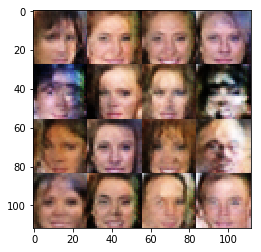

Timestamp 20170803-21-21-22.272 -  Epoch 1/1 -  Step 9310 -  D Loss: 1.3971 - G Loss: 0.5690
Timestamp 20170803-21-21-28.463 -  Epoch 1/1 -  Step 9320 -  D Loss: 1.0204 - G Loss: 0.9124
Timestamp 20170803-21-21-34.657 -  Epoch 1/1 -  Step 9330 -  D Loss: 1.0071 - G Loss: 2.4875
Timestamp 20170803-21-21-40.844 -  Epoch 1/1 -  Step 9340 -  D Loss: 0.9200 - G Loss: 1.5126
Timestamp 20170803-21-21-47.032 -  Epoch 1/1 -  Step 9350 -  D Loss: 1.2200 - G Loss: 0.8065
Timestamp 20170803-21-21-53.214 -  Epoch 1/1 -  Step 9360 -  D Loss: 1.6581 - G Loss: 0.5280
Timestamp 20170803-21-21-59.405 -  Epoch 1/1 -  Step 9370 -  D Loss: 1.0321 - G Loss: 1.3788
Timestamp 20170803-21-22-05.590 -  Epoch 1/1 -  Step 9380 -  D Loss: 0.9315 - G Loss: 1.3774
Timestamp 20170803-21-22-11.777 -  Epoch 1/1 -  Step 9390 -  D Loss: 1.2397 - G Loss: 1.1965
Timestamp 20170803-21-22-17.951 -  Epoch 1/1 -  Step 9400 -  D Loss: 1.4516 - G Loss: 1.0403


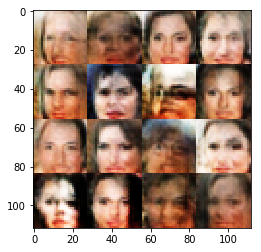

Timestamp 20170803-21-22-24.876 -  Epoch 1/1 -  Step 9410 -  D Loss: 0.9824 - G Loss: 1.4720
Timestamp 20170803-21-22-31.042 -  Epoch 1/1 -  Step 9420 -  D Loss: 1.3789 - G Loss: 1.0903
Timestamp 20170803-21-22-37.234 -  Epoch 1/1 -  Step 9430 -  D Loss: 1.4647 - G Loss: 1.0454
Timestamp 20170803-21-22-43.438 -  Epoch 1/1 -  Step 9440 -  D Loss: 1.0544 - G Loss: 0.9138
Timestamp 20170803-21-22-49.659 -  Epoch 1/1 -  Step 9450 -  D Loss: 1.5399 - G Loss: 0.7174
Timestamp 20170803-21-22-55.859 -  Epoch 1/1 -  Step 9460 -  D Loss: 0.7837 - G Loss: 2.0902
Timestamp 20170803-21-23-02.071 -  Epoch 1/1 -  Step 9470 -  D Loss: 1.0556 - G Loss: 1.1619
Timestamp 20170803-21-23-08.251 -  Epoch 1/1 -  Step 9480 -  D Loss: 0.9678 - G Loss: 1.3582
Timestamp 20170803-21-23-14.445 -  Epoch 1/1 -  Step 9490 -  D Loss: 0.8531 - G Loss: 2.0630
Timestamp 20170803-21-23-20.662 -  Epoch 1/1 -  Step 9500 -  D Loss: 0.7921 - G Loss: 1.5484


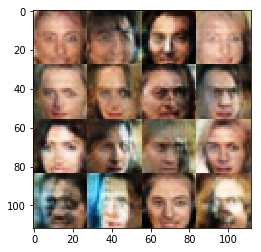

Timestamp 20170803-21-23-27.649 -  Epoch 1/1 -  Step 9510 -  D Loss: 0.9100 - G Loss: 1.2949
Timestamp 20170803-21-23-33.840 -  Epoch 1/1 -  Step 9520 -  D Loss: 1.0250 - G Loss: 1.4889
Timestamp 20170803-21-23-40.022 -  Epoch 1/1 -  Step 9530 -  D Loss: 1.2488 - G Loss: 0.8862
Timestamp 20170803-21-23-46.193 -  Epoch 1/1 -  Step 9540 -  D Loss: 1.0390 - G Loss: 1.3584
Timestamp 20170803-21-23-52.376 -  Epoch 1/1 -  Step 9550 -  D Loss: 1.0137 - G Loss: 1.0756
Timestamp 20170803-21-23-58.566 -  Epoch 1/1 -  Step 9560 -  D Loss: 0.8713 - G Loss: 0.9900
Timestamp 20170803-21-24-04.742 -  Epoch 1/1 -  Step 9570 -  D Loss: 0.8815 - G Loss: 1.1454
Timestamp 20170803-21-24-10.929 -  Epoch 1/1 -  Step 9580 -  D Loss: 1.1953 - G Loss: 1.6218
Timestamp 20170803-21-24-17.107 -  Epoch 1/1 -  Step 9590 -  D Loss: 0.9841 - G Loss: 1.9421
Timestamp 20170803-21-24-23.325 -  Epoch 1/1 -  Step 9600 -  D Loss: 0.9089 - G Loss: 1.2269


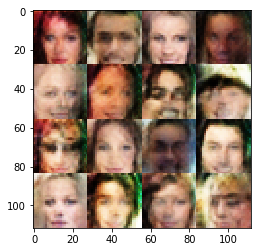

Timestamp 20170803-21-24-30.274 -  Epoch 1/1 -  Step 9610 -  D Loss: 1.1928 - G Loss: 1.0273
Timestamp 20170803-21-24-36.448 -  Epoch 1/1 -  Step 9620 -  D Loss: 0.8865 - G Loss: 1.3170
Timestamp 20170803-21-24-42.654 -  Epoch 1/1 -  Step 9630 -  D Loss: 1.1056 - G Loss: 1.3974
Timestamp 20170803-21-24-48.843 -  Epoch 1/1 -  Step 9640 -  D Loss: 1.1107 - G Loss: 1.7966
Timestamp 20170803-21-24-55.031 -  Epoch 1/1 -  Step 9650 -  D Loss: 0.8885 - G Loss: 1.2039
Timestamp 20170803-21-25-01.228 -  Epoch 1/1 -  Step 9660 -  D Loss: 1.1246 - G Loss: 1.6746
Timestamp 20170803-21-25-07.422 -  Epoch 1/1 -  Step 9670 -  D Loss: 0.6825 - G Loss: 1.9034
Timestamp 20170803-21-25-13.606 -  Epoch 1/1 -  Step 9680 -  D Loss: 0.8886 - G Loss: 1.5412
Timestamp 20170803-21-25-19.782 -  Epoch 1/1 -  Step 9690 -  D Loss: 1.0904 - G Loss: 0.8679
Timestamp 20170803-21-25-25.993 -  Epoch 1/1 -  Step 9700 -  D Loss: 1.0156 - G Loss: 1.5005


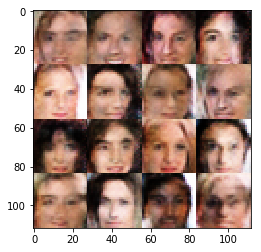

Timestamp 20170803-21-25-33.074 -  Epoch 1/1 -  Step 9710 -  D Loss: 1.1718 - G Loss: 0.8691
Timestamp 20170803-21-25-39.267 -  Epoch 1/1 -  Step 9720 -  D Loss: 1.2551 - G Loss: 0.9918
Timestamp 20170803-21-25-45.444 -  Epoch 1/1 -  Step 9730 -  D Loss: 1.2510 - G Loss: 1.0054
Timestamp 20170803-21-25-51.684 -  Epoch 1/1 -  Step 9740 -  D Loss: 1.3196 - G Loss: 0.9534
Timestamp 20170803-21-25-57.899 -  Epoch 1/1 -  Step 9750 -  D Loss: 0.9642 - G Loss: 1.0117
Timestamp 20170803-21-26-04.093 -  Epoch 1/1 -  Step 9760 -  D Loss: 1.1340 - G Loss: 1.4542
Timestamp 20170803-21-26-10.306 -  Epoch 1/1 -  Step 9770 -  D Loss: 0.7826 - G Loss: 1.0747
Timestamp 20170803-21-26-16.490 -  Epoch 1/1 -  Step 9780 -  D Loss: 0.8546 - G Loss: 1.3156
Timestamp 20170803-21-26-22.698 -  Epoch 1/1 -  Step 9790 -  D Loss: 1.1290 - G Loss: 1.2518
Timestamp 20170803-21-26-28.881 -  Epoch 1/1 -  Step 9800 -  D Loss: 0.8813 - G Loss: 1.3344


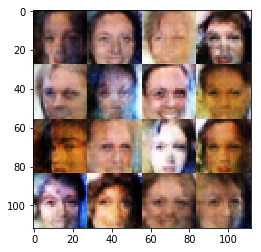

Timestamp 20170803-21-26-35.844 -  Epoch 1/1 -  Step 9810 -  D Loss: 1.0023 - G Loss: 0.8319
Timestamp 20170803-21-26-42.041 -  Epoch 1/1 -  Step 9820 -  D Loss: 1.3995 - G Loss: 1.0531
Timestamp 20170803-21-26-48.225 -  Epoch 1/1 -  Step 9830 -  D Loss: 0.9446 - G Loss: 1.3897
Timestamp 20170803-21-26-54.413 -  Epoch 1/1 -  Step 9840 -  D Loss: 1.3701 - G Loss: 1.3212
Timestamp 20170803-21-27-00.597 -  Epoch 1/1 -  Step 9850 -  D Loss: 1.0789 - G Loss: 1.5135
Timestamp 20170803-21-27-06.786 -  Epoch 1/1 -  Step 9860 -  D Loss: 1.0419 - G Loss: 1.5101
Timestamp 20170803-21-27-12.958 -  Epoch 1/1 -  Step 9870 -  D Loss: 0.9993 - G Loss: 1.5015
Timestamp 20170803-21-27-19.157 -  Epoch 1/1 -  Step 9880 -  D Loss: 0.9272 - G Loss: 1.5742
Timestamp 20170803-21-27-25.354 -  Epoch 1/1 -  Step 9890 -  D Loss: 0.6973 - G Loss: 1.7473
Timestamp 20170803-21-27-31.542 -  Epoch 1/1 -  Step 9900 -  D Loss: 1.1082 - G Loss: 1.5393


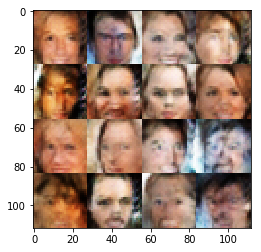

Timestamp 20170803-21-27-38.531 -  Epoch 1/1 -  Step 9910 -  D Loss: 1.1436 - G Loss: 1.5927
Timestamp 20170803-21-27-44.714 -  Epoch 1/1 -  Step 9920 -  D Loss: 0.8995 - G Loss: 1.1150
Timestamp 20170803-21-27-50.888 -  Epoch 1/1 -  Step 9930 -  D Loss: 0.9375 - G Loss: 0.8380
Timestamp 20170803-21-27-57.093 -  Epoch 1/1 -  Step 9940 -  D Loss: 0.8295 - G Loss: 1.2985
Timestamp 20170803-21-28-03.290 -  Epoch 1/1 -  Step 9950 -  D Loss: 0.9553 - G Loss: 0.5912
Timestamp 20170803-21-28-09.472 -  Epoch 1/1 -  Step 9960 -  D Loss: 1.1449 - G Loss: 1.3345
Timestamp 20170803-21-28-15.661 -  Epoch 1/1 -  Step 9970 -  D Loss: 0.9802 - G Loss: 1.1860
Timestamp 20170803-21-28-21.851 -  Epoch 1/1 -  Step 9980 -  D Loss: 1.0683 - G Loss: 0.9756
Timestamp 20170803-21-28-28.039 -  Epoch 1/1 -  Step 9990 -  D Loss: 0.9795 - G Loss: 1.2016
Timestamp 20170803-21-28-34.236 -  Epoch 1/1 -  Step 10000 -  D Loss: 0.9518 - G Loss: 1.3577


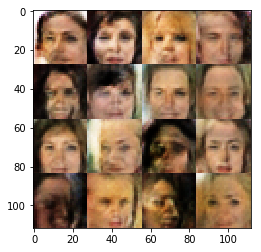

Timestamp 20170803-21-28-41.216 -  Epoch 1/1 -  Step 10010 -  D Loss: 0.6973 - G Loss: 1.8920
Timestamp 20170803-21-28-47.402 -  Epoch 1/1 -  Step 10020 -  D Loss: 0.9250 - G Loss: 1.4671
Timestamp 20170803-21-28-53.573 -  Epoch 1/1 -  Step 10030 -  D Loss: 1.0101 - G Loss: 1.2338
Timestamp 20170803-21-28-59.776 -  Epoch 1/1 -  Step 10040 -  D Loss: 0.9178 - G Loss: 1.1916
Timestamp 20170803-21-29-05.954 -  Epoch 1/1 -  Step 10050 -  D Loss: 0.9708 - G Loss: 1.5006
Timestamp 20170803-21-29-12.162 -  Epoch 1/1 -  Step 10060 -  D Loss: 1.2017 - G Loss: 1.4922
Timestamp 20170803-21-29-18.348 -  Epoch 1/1 -  Step 10070 -  D Loss: 1.0108 - G Loss: 1.3350
Timestamp 20170803-21-29-24.519 -  Epoch 1/1 -  Step 10080 -  D Loss: 0.8691 - G Loss: 1.2296
Timestamp 20170803-21-29-30.698 -  Epoch 1/1 -  Step 10090 -  D Loss: 0.9693 - G Loss: 0.8554
Timestamp 20170803-21-29-36.860 -  Epoch 1/1 -  Step 10100 -  D Loss: 1.1706 - G Loss: 1.1632


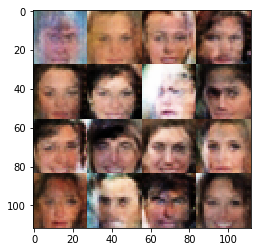

Timestamp 20170803-21-29-43.803 -  Epoch 1/1 -  Step 10110 -  D Loss: 1.2548 - G Loss: 1.0080
Timestamp 20170803-21-29-50.003 -  Epoch 1/1 -  Step 10120 -  D Loss: 1.0405 - G Loss: 1.4365
Timestamp 20170803-21-29-56.194 -  Epoch 1/1 -  Step 10130 -  D Loss: 1.0047 - G Loss: 1.7031
Timestamp 20170803-21-30-02.378 -  Epoch 1/1 -  Step 10140 -  D Loss: 1.3048 - G Loss: 1.2461
Timestamp 20170803-21-30-08.565 -  Epoch 1/1 -  Step 10150 -  D Loss: 0.9267 - G Loss: 0.6891
Timestamp 20170803-21-30-14.787 -  Epoch 1/1 -  Step 10160 -  D Loss: 1.0000 - G Loss: 1.1323
Timestamp 20170803-21-30-20.971 -  Epoch 1/1 -  Step 10170 -  D Loss: 1.1731 - G Loss: 0.9111
Timestamp 20170803-21-30-27.152 -  Epoch 1/1 -  Step 10180 -  D Loss: 1.5004 - G Loss: 1.2541
Timestamp 20170803-21-30-33.329 -  Epoch 1/1 -  Step 10190 -  D Loss: 1.1047 - G Loss: 1.3203
Timestamp 20170803-21-30-39.525 -  Epoch 1/1 -  Step 10200 -  D Loss: 1.5522 - G Loss: 0.5783


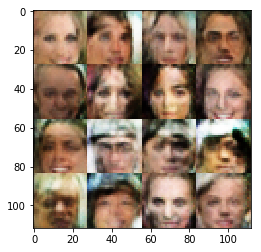

Timestamp 20170803-21-30-46.540 -  Epoch 1/1 -  Step 10210 -  D Loss: 1.1390 - G Loss: 0.9265
Timestamp 20170803-21-30-52.738 -  Epoch 1/1 -  Step 10220 -  D Loss: 1.2288 - G Loss: 1.0088
Timestamp 20170803-21-30-58.936 -  Epoch 1/1 -  Step 10230 -  D Loss: 0.8317 - G Loss: 1.4638
Timestamp 20170803-21-31-05.110 -  Epoch 1/1 -  Step 10240 -  D Loss: 1.1126 - G Loss: 1.0820
Timestamp 20170803-21-31-11.309 -  Epoch 1/1 -  Step 10250 -  D Loss: 1.6284 - G Loss: 1.2689
Timestamp 20170803-21-31-17.498 -  Epoch 1/1 -  Step 10260 -  D Loss: 0.8523 - G Loss: 0.6605
Timestamp 20170803-21-31-23.723 -  Epoch 1/1 -  Step 10270 -  D Loss: 1.2058 - G Loss: 1.3412
Timestamp 20170803-21-31-29.929 -  Epoch 1/1 -  Step 10280 -  D Loss: 1.0741 - G Loss: 0.7342
Timestamp 20170803-21-31-36.113 -  Epoch 1/1 -  Step 10290 -  D Loss: 1.0307 - G Loss: 0.8070
Timestamp 20170803-21-31-42.324 -  Epoch 1/1 -  Step 10300 -  D Loss: 1.0684 - G Loss: 1.5969


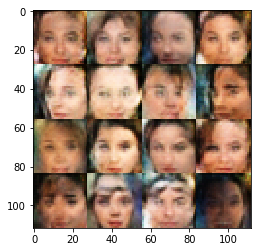

Timestamp 20170803-21-31-49.285 -  Epoch 1/1 -  Step 10310 -  D Loss: 0.6850 - G Loss: 1.2067
Timestamp 20170803-21-31-55.445 -  Epoch 1/1 -  Step 10320 -  D Loss: 1.3517 - G Loss: 0.8954
Timestamp 20170803-21-32-01.653 -  Epoch 1/1 -  Step 10330 -  D Loss: 0.9386 - G Loss: 1.1861
Timestamp 20170803-21-32-07.844 -  Epoch 1/1 -  Step 10340 -  D Loss: 0.9564 - G Loss: 2.1044
Timestamp 20170803-21-32-14.037 -  Epoch 1/1 -  Step 10350 -  D Loss: 0.8901 - G Loss: 1.1115
Timestamp 20170803-21-32-20.243 -  Epoch 1/1 -  Step 10360 -  D Loss: 0.8387 - G Loss: 1.5298
Timestamp 20170803-21-32-26.440 -  Epoch 1/1 -  Step 10370 -  D Loss: 1.2814 - G Loss: 1.0247
Timestamp 20170803-21-32-32.628 -  Epoch 1/1 -  Step 10380 -  D Loss: 0.9470 - G Loss: 1.8789
Timestamp 20170803-21-32-38.821 -  Epoch 1/1 -  Step 10390 -  D Loss: 1.0112 - G Loss: 1.1156
Timestamp 20170803-21-32-45.003 -  Epoch 1/1 -  Step 10400 -  D Loss: 1.0071 - G Loss: 1.3207


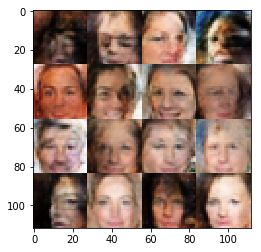

Timestamp 20170803-21-32-52.364 -  Epoch 1/1 -  Step 10410 -  D Loss: 1.1569 - G Loss: 1.1008
Timestamp 20170803-21-32-58.552 -  Epoch 1/1 -  Step 10420 -  D Loss: 1.1831 - G Loss: 1.5881
Timestamp 20170803-21-33-04.757 -  Epoch 1/1 -  Step 10430 -  D Loss: 1.4238 - G Loss: 0.6789
Timestamp 20170803-21-33-10.945 -  Epoch 1/1 -  Step 10440 -  D Loss: 0.7100 - G Loss: 1.8785
Timestamp 20170803-21-33-17.134 -  Epoch 1/1 -  Step 10450 -  D Loss: 1.2748 - G Loss: 1.0072
Timestamp 20170803-21-33-23.330 -  Epoch 1/1 -  Step 10460 -  D Loss: 1.5037 - G Loss: 0.3373
Timestamp 20170803-21-33-29.525 -  Epoch 1/1 -  Step 10470 -  D Loss: 1.3837 - G Loss: 0.7792
Timestamp 20170803-21-33-35.705 -  Epoch 1/1 -  Step 10480 -  D Loss: 0.9729 - G Loss: 1.1043
Timestamp 20170803-21-33-41.886 -  Epoch 1/1 -  Step 10490 -  D Loss: 0.9762 - G Loss: 1.4984
Timestamp 20170803-21-33-48.061 -  Epoch 1/1 -  Step 10500 -  D Loss: 1.1165 - G Loss: 0.7641


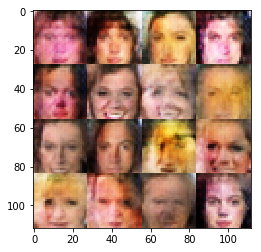

Timestamp 20170803-21-33-55.015 -  Epoch 1/1 -  Step 10510 -  D Loss: 1.3259 - G Loss: 1.9091
Timestamp 20170803-21-34-01.196 -  Epoch 1/1 -  Step 10520 -  D Loss: 0.8903 - G Loss: 1.3851
Timestamp 20170803-21-34-07.381 -  Epoch 1/1 -  Step 10530 -  D Loss: 0.8297 - G Loss: 1.2949
Timestamp 20170803-21-34-13.607 -  Epoch 1/1 -  Step 10540 -  D Loss: 0.9046 - G Loss: 1.1247
Timestamp 20170803-21-34-19.826 -  Epoch 1/1 -  Step 10550 -  D Loss: 0.8417 - G Loss: 1.8415
Timestamp 20170803-21-34-26.016 -  Epoch 1/1 -  Step 10560 -  D Loss: 1.0446 - G Loss: 1.9751
Timestamp 20170803-21-34-32.218 -  Epoch 1/1 -  Step 10570 -  D Loss: 0.8883 - G Loss: 1.8653
Timestamp 20170803-21-34-38.380 -  Epoch 1/1 -  Step 10580 -  D Loss: 0.9580 - G Loss: 1.0938
Timestamp 20170803-21-34-44.583 -  Epoch 1/1 -  Step 10590 -  D Loss: 1.3664 - G Loss: 1.7097
Timestamp 20170803-21-34-50.763 -  Epoch 1/1 -  Step 10600 -  D Loss: 1.3142 - G Loss: 1.2649


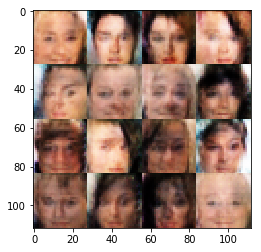

Timestamp 20170803-21-34-57.682 -  Epoch 1/1 -  Step 10610 -  D Loss: 0.7929 - G Loss: 1.5067
Timestamp 20170803-21-35-03.863 -  Epoch 1/1 -  Step 10620 -  D Loss: 1.2951 - G Loss: 0.8103
Timestamp 20170803-21-35-10.050 -  Epoch 1/1 -  Step 10630 -  D Loss: 1.1116 - G Loss: 1.0381
Timestamp 20170803-21-35-16.235 -  Epoch 1/1 -  Step 10640 -  D Loss: 1.1687 - G Loss: 0.6731
Timestamp 20170803-21-35-22.431 -  Epoch 1/1 -  Step 10650 -  D Loss: 1.3932 - G Loss: 1.1079
Timestamp 20170803-21-35-28.631 -  Epoch 1/1 -  Step 10660 -  D Loss: 1.0362 - G Loss: 0.8004
Timestamp 20170803-21-35-34.824 -  Epoch 1/1 -  Step 10670 -  D Loss: 1.3729 - G Loss: 0.7621
Timestamp 20170803-21-35-40.991 -  Epoch 1/1 -  Step 10680 -  D Loss: 1.2739 - G Loss: 1.2528
Timestamp 20170803-21-35-47.184 -  Epoch 1/1 -  Step 10690 -  D Loss: 1.3084 - G Loss: 0.9038
Timestamp 20170803-21-35-53.379 -  Epoch 1/1 -  Step 10700 -  D Loss: 0.9487 - G Loss: 1.6673


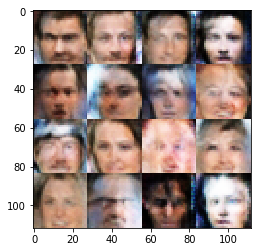

Timestamp 20170803-21-36-00.295 -  Epoch 1/1 -  Step 10710 -  D Loss: 1.2795 - G Loss: 0.6025
Timestamp 20170803-21-36-06.480 -  Epoch 1/1 -  Step 10720 -  D Loss: 1.0282 - G Loss: 1.1439
Timestamp 20170803-21-36-12.667 -  Epoch 1/1 -  Step 10730 -  D Loss: 0.9756 - G Loss: 1.2124
Timestamp 20170803-21-36-18.848 -  Epoch 1/1 -  Step 10740 -  D Loss: 1.1899 - G Loss: 1.2801
Timestamp 20170803-21-36-25.043 -  Epoch 1/1 -  Step 10750 -  D Loss: 1.0436 - G Loss: 0.7941
Timestamp 20170803-21-36-31.225 -  Epoch 1/1 -  Step 10760 -  D Loss: 0.8572 - G Loss: 0.9753
Timestamp 20170803-21-36-37.399 -  Epoch 1/1 -  Step 10770 -  D Loss: 1.1116 - G Loss: 1.4221
Timestamp 20170803-21-36-43.585 -  Epoch 1/1 -  Step 10780 -  D Loss: 1.4592 - G Loss: 1.4306
Timestamp 20170803-21-36-49.785 -  Epoch 1/1 -  Step 10790 -  D Loss: 1.2134 - G Loss: 1.2142
Timestamp 20170803-21-36-55.962 -  Epoch 1/1 -  Step 10800 -  D Loss: 0.9914 - G Loss: 1.1673


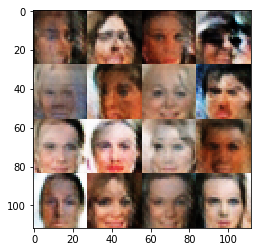

Timestamp 20170803-21-37-02.921 -  Epoch 1/1 -  Step 10810 -  D Loss: 1.2393 - G Loss: 1.1607
Timestamp 20170803-21-37-09.102 -  Epoch 1/1 -  Step 10820 -  D Loss: 1.0087 - G Loss: 1.0449
Timestamp 20170803-21-37-15.279 -  Epoch 1/1 -  Step 10830 -  D Loss: 1.2207 - G Loss: 1.1757
Timestamp 20170803-21-37-21.453 -  Epoch 1/1 -  Step 10840 -  D Loss: 1.2211 - G Loss: 0.7046
Timestamp 20170803-21-37-27.635 -  Epoch 1/1 -  Step 10850 -  D Loss: 1.0028 - G Loss: 1.5830
Timestamp 20170803-21-37-33.833 -  Epoch 1/1 -  Step 10860 -  D Loss: 1.0909 - G Loss: 1.4109
Timestamp 20170803-21-37-40.047 -  Epoch 1/1 -  Step 10870 -  D Loss: 1.1336 - G Loss: 1.1816
Timestamp 20170803-21-37-46.213 -  Epoch 1/1 -  Step 10880 -  D Loss: 0.9163 - G Loss: 1.3502
Timestamp 20170803-21-37-52.404 -  Epoch 1/1 -  Step 10890 -  D Loss: 0.8912 - G Loss: 1.4922
Timestamp 20170803-21-37-58.577 -  Epoch 1/1 -  Step 10900 -  D Loss: 0.9172 - G Loss: 1.3618


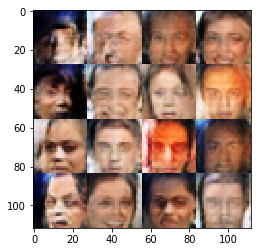

Timestamp 20170803-21-38-05.526 -  Epoch 1/1 -  Step 10910 -  D Loss: 1.0214 - G Loss: 1.3178
Timestamp 20170803-21-38-11.710 -  Epoch 1/1 -  Step 10920 -  D Loss: 1.2067 - G Loss: 1.0239
Timestamp 20170803-21-38-17.896 -  Epoch 1/1 -  Step 10930 -  D Loss: 1.0405 - G Loss: 0.6545
Timestamp 20170803-21-38-24.081 -  Epoch 1/1 -  Step 10940 -  D Loss: 0.9068 - G Loss: 0.8166
Timestamp 20170803-21-38-30.239 -  Epoch 1/1 -  Step 10950 -  D Loss: 1.0420 - G Loss: 1.3024
Timestamp 20170803-21-38-36.430 -  Epoch 1/1 -  Step 10960 -  D Loss: 1.1410 - G Loss: 1.1091
Timestamp 20170803-21-38-42.615 -  Epoch 1/1 -  Step 10970 -  D Loss: 0.8328 - G Loss: 1.1137
Timestamp 20170803-21-38-48.805 -  Epoch 1/1 -  Step 10980 -  D Loss: 1.1259 - G Loss: 1.0143
Timestamp 20170803-21-38-54.987 -  Epoch 1/1 -  Step 10990 -  D Loss: 1.3167 - G Loss: 1.0367
Timestamp 20170803-21-39-01.186 -  Epoch 1/1 -  Step 11000 -  D Loss: 1.1023 - G Loss: 1.3193


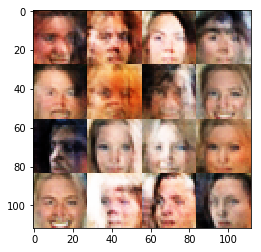

Timestamp 20170803-21-39-08.124 -  Epoch 1/1 -  Step 11010 -  D Loss: 1.6532 - G Loss: 0.8161
Timestamp 20170803-21-39-14.298 -  Epoch 1/1 -  Step 11020 -  D Loss: 0.9032 - G Loss: 1.3808
Timestamp 20170803-21-39-20.567 -  Epoch 1/1 -  Step 11030 -  D Loss: 1.6258 - G Loss: 0.6048
Timestamp 20170803-21-39-26.756 -  Epoch 1/1 -  Step 11040 -  D Loss: 0.9020 - G Loss: 1.5841
Timestamp 20170803-21-39-32.952 -  Epoch 1/1 -  Step 11050 -  D Loss: 1.0057 - G Loss: 1.0158
Timestamp 20170803-21-39-39.150 -  Epoch 1/1 -  Step 11060 -  D Loss: 1.3473 - G Loss: 0.8092
Timestamp 20170803-21-39-45.335 -  Epoch 1/1 -  Step 11070 -  D Loss: 0.8643 - G Loss: 1.2023
Timestamp 20170803-21-39-51.516 -  Epoch 1/1 -  Step 11080 -  D Loss: 1.2476 - G Loss: 1.1155
Timestamp 20170803-21-39-57.702 -  Epoch 1/1 -  Step 11090 -  D Loss: 0.7142 - G Loss: 1.7458
Timestamp 20170803-21-40-03.877 -  Epoch 1/1 -  Step 11100 -  D Loss: 1.1901 - G Loss: 1.6968


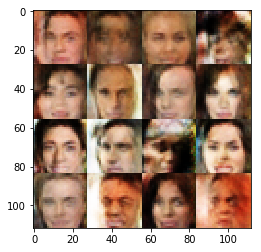

Timestamp 20170803-21-40-10.792 -  Epoch 1/1 -  Step 11110 -  D Loss: 0.9335 - G Loss: 1.8962
Timestamp 20170803-21-40-16.999 -  Epoch 1/1 -  Step 11120 -  D Loss: 0.8565 - G Loss: 1.2446
Timestamp 20170803-21-40-23.178 -  Epoch 1/1 -  Step 11130 -  D Loss: 1.0496 - G Loss: 1.0526
Timestamp 20170803-21-40-29.350 -  Epoch 1/1 -  Step 11140 -  D Loss: 0.7864 - G Loss: 1.2624
Timestamp 20170803-21-40-35.524 -  Epoch 1/1 -  Step 11150 -  D Loss: 1.0287 - G Loss: 1.5355
Timestamp 20170803-21-40-41.714 -  Epoch 1/1 -  Step 11160 -  D Loss: 1.0107 - G Loss: 1.0378
Timestamp 20170803-21-40-47.916 -  Epoch 1/1 -  Step 11170 -  D Loss: 1.2575 - G Loss: 0.8655
Timestamp 20170803-21-40-54.099 -  Epoch 1/1 -  Step 11180 -  D Loss: 1.0181 - G Loss: 0.6695
Timestamp 20170803-21-41-00.276 -  Epoch 1/1 -  Step 11190 -  D Loss: 0.7578 - G Loss: 0.9670
Timestamp 20170803-21-41-06.510 -  Epoch 1/1 -  Step 11200 -  D Loss: 1.0932 - G Loss: 1.3522


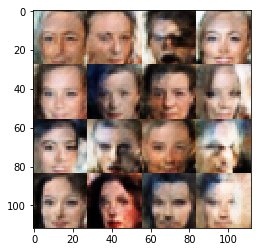

Timestamp 20170803-21-41-13.639 -  Epoch 1/1 -  Step 11210 -  D Loss: 0.7298 - G Loss: 1.7690
Timestamp 20170803-21-41-19.856 -  Epoch 1/1 -  Step 11220 -  D Loss: 1.4654 - G Loss: 0.5242
Timestamp 20170803-21-41-26.068 -  Epoch 1/1 -  Step 11230 -  D Loss: 0.9972 - G Loss: 1.0073
Timestamp 20170803-21-41-32.267 -  Epoch 1/1 -  Step 11240 -  D Loss: 0.8327 - G Loss: 1.0786
Timestamp 20170803-21-41-38.449 -  Epoch 1/1 -  Step 11250 -  D Loss: 0.8327 - G Loss: 1.4836
Timestamp 20170803-21-41-44.640 -  Epoch 1/1 -  Step 11260 -  D Loss: 1.0333 - G Loss: 1.4187
Timestamp 20170803-21-41-50.828 -  Epoch 1/1 -  Step 11270 -  D Loss: 0.6517 - G Loss: 1.2429
Timestamp 20170803-21-41-57.024 -  Epoch 1/1 -  Step 11280 -  D Loss: 0.9380 - G Loss: 1.7565
Timestamp 20170803-21-42-03.211 -  Epoch 1/1 -  Step 11290 -  D Loss: 1.2872 - G Loss: 0.8055
Timestamp 20170803-21-42-09.396 -  Epoch 1/1 -  Step 11300 -  D Loss: 1.1722 - G Loss: 0.8342


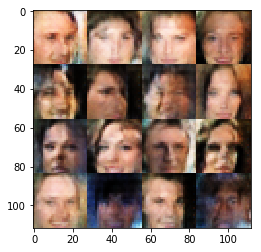

Timestamp 20170803-21-42-16.322 -  Epoch 1/1 -  Step 11310 -  D Loss: 0.9926 - G Loss: 1.4260
Timestamp 20170803-21-42-22.507 -  Epoch 1/1 -  Step 11320 -  D Loss: 1.2424 - G Loss: 1.0528
Timestamp 20170803-21-42-28.698 -  Epoch 1/1 -  Step 11330 -  D Loss: 0.8720 - G Loss: 1.2272
Timestamp 20170803-21-42-34.876 -  Epoch 1/1 -  Step 11340 -  D Loss: 0.9143 - G Loss: 0.9407
Timestamp 20170803-21-42-41.063 -  Epoch 1/1 -  Step 11350 -  D Loss: 0.7956 - G Loss: 1.3030
Timestamp 20170803-21-42-47.257 -  Epoch 1/1 -  Step 11360 -  D Loss: 1.0808 - G Loss: 0.9708
Timestamp 20170803-21-42-53.453 -  Epoch 1/1 -  Step 11370 -  D Loss: 1.1530 - G Loss: 0.8926
Timestamp 20170803-21-42-59.653 -  Epoch 1/1 -  Step 11380 -  D Loss: 0.9206 - G Loss: 1.5068
Timestamp 20170803-21-43-05.830 -  Epoch 1/1 -  Step 11390 -  D Loss: 0.9474 - G Loss: 0.9570
Timestamp 20170803-21-43-12.011 -  Epoch 1/1 -  Step 11400 -  D Loss: 0.9778 - G Loss: 0.8373


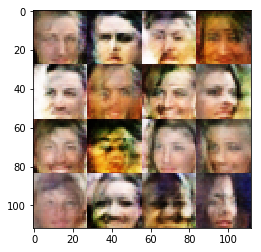

Timestamp 20170803-21-43-18.961 -  Epoch 1/1 -  Step 11410 -  D Loss: 1.0104 - G Loss: 1.1371
Timestamp 20170803-21-43-25.148 -  Epoch 1/1 -  Step 11420 -  D Loss: 0.9705 - G Loss: 1.2878
Timestamp 20170803-21-43-31.330 -  Epoch 1/1 -  Step 11430 -  D Loss: 1.2213 - G Loss: 0.8003
Timestamp 20170803-21-43-37.513 -  Epoch 1/1 -  Step 11440 -  D Loss: 0.7067 - G Loss: 1.8614
Timestamp 20170803-21-43-43.707 -  Epoch 1/1 -  Step 11450 -  D Loss: 1.0439 - G Loss: 0.8683
Timestamp 20170803-21-43-49.927 -  Epoch 1/1 -  Step 11460 -  D Loss: 0.8250 - G Loss: 1.5579
Timestamp 20170803-21-43-56.131 -  Epoch 1/1 -  Step 11470 -  D Loss: 1.0853 - G Loss: 1.0542
Timestamp 20170803-21-44-02.321 -  Epoch 1/1 -  Step 11480 -  D Loss: 1.4654 - G Loss: 0.8848
Timestamp 20170803-21-44-08.504 -  Epoch 1/1 -  Step 11490 -  D Loss: 0.8243 - G Loss: 1.0981
Timestamp 20170803-21-44-14.677 -  Epoch 1/1 -  Step 11500 -  D Loss: 1.4096 - G Loss: 0.6083


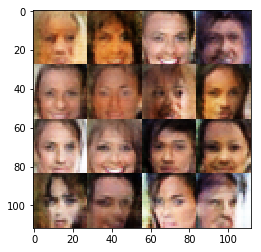

Timestamp 20170803-21-44-21.610 -  Epoch 1/1 -  Step 11510 -  D Loss: 0.6890 - G Loss: 1.4304
Timestamp 20170803-21-44-27.795 -  Epoch 1/1 -  Step 11520 -  D Loss: 1.1245 - G Loss: 1.2350
Timestamp 20170803-21-44-33.976 -  Epoch 1/1 -  Step 11530 -  D Loss: 0.8258 - G Loss: 1.6844
Timestamp 20170803-21-44-40.166 -  Epoch 1/1 -  Step 11540 -  D Loss: 1.1017 - G Loss: 2.2221
Timestamp 20170803-21-44-46.330 -  Epoch 1/1 -  Step 11550 -  D Loss: 0.9582 - G Loss: 1.2714
Timestamp 20170803-21-44-52.518 -  Epoch 1/1 -  Step 11560 -  D Loss: 1.2826 - G Loss: 0.7566
Timestamp 20170803-21-44-58.695 -  Epoch 1/1 -  Step 11570 -  D Loss: 1.0573 - G Loss: 1.8726
Timestamp 20170803-21-45-04.862 -  Epoch 1/1 -  Step 11580 -  D Loss: 0.8527 - G Loss: 1.5103
Timestamp 20170803-21-45-11.068 -  Epoch 1/1 -  Step 11590 -  D Loss: 0.9283 - G Loss: 1.1167
Timestamp 20170803-21-45-17.251 -  Epoch 1/1 -  Step 11600 -  D Loss: 0.9797 - G Loss: 1.3156


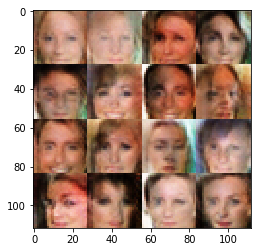

Timestamp 20170803-21-45-24.230 -  Epoch 1/1 -  Step 11610 -  D Loss: 1.2709 - G Loss: 0.7784
Timestamp 20170803-21-45-30.433 -  Epoch 1/1 -  Step 11620 -  D Loss: 0.8523 - G Loss: 1.5540
Timestamp 20170803-21-45-36.613 -  Epoch 1/1 -  Step 11630 -  D Loss: 1.0087 - G Loss: 1.6493
Timestamp 20170803-21-45-42.803 -  Epoch 1/1 -  Step 11640 -  D Loss: 0.9289 - G Loss: 1.4256
Timestamp 20170803-21-45-48.982 -  Epoch 1/1 -  Step 11650 -  D Loss: 0.8175 - G Loss: 1.3215
Timestamp 20170803-21-45-55.170 -  Epoch 1/1 -  Step 11660 -  D Loss: 0.9557 - G Loss: 1.0878
Timestamp 20170803-21-46-01.349 -  Epoch 1/1 -  Step 11670 -  D Loss: 1.0378 - G Loss: 1.2230
Timestamp 20170803-21-46-07.533 -  Epoch 1/1 -  Step 11680 -  D Loss: 0.8465 - G Loss: 1.2436
Timestamp 20170803-21-46-13.727 -  Epoch 1/1 -  Step 11690 -  D Loss: 0.8916 - G Loss: 1.7693
Timestamp 20170803-21-46-19.897 -  Epoch 1/1 -  Step 11700 -  D Loss: 0.8895 - G Loss: 1.4271


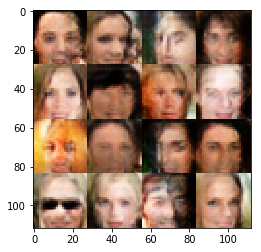

Timestamp 20170803-21-46-26.822 -  Epoch 1/1 -  Step 11710 -  D Loss: 0.8521 - G Loss: 1.4110
Timestamp 20170803-21-46-33.013 -  Epoch 1/1 -  Step 11720 -  D Loss: 0.8048 - G Loss: 1.5520
Timestamp 20170803-21-46-39.189 -  Epoch 1/1 -  Step 11730 -  D Loss: 1.0876 - G Loss: 1.4278
Timestamp 20170803-21-46-45.373 -  Epoch 1/1 -  Step 11740 -  D Loss: 1.2166 - G Loss: 0.8617
Timestamp 20170803-21-46-51.561 -  Epoch 1/1 -  Step 11750 -  D Loss: 0.9788 - G Loss: 1.4611
Timestamp 20170803-21-46-57.745 -  Epoch 1/1 -  Step 11760 -  D Loss: 1.9079 - G Loss: 0.5447
Timestamp 20170803-21-47-03.926 -  Epoch 1/1 -  Step 11770 -  D Loss: 1.0767 - G Loss: 1.1950
Timestamp 20170803-21-47-10.096 -  Epoch 1/1 -  Step 11780 -  D Loss: 0.8732 - G Loss: 0.9566
Timestamp 20170803-21-47-16.294 -  Epoch 1/1 -  Step 11790 -  D Loss: 0.8495 - G Loss: 1.4104
Timestamp 20170803-21-47-22.477 -  Epoch 1/1 -  Step 11800 -  D Loss: 1.0588 - G Loss: 1.6367


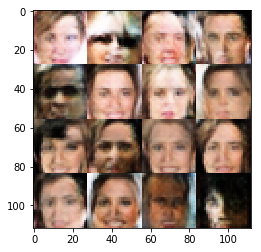

Timestamp 20170803-21-47-29.451 -  Epoch 1/1 -  Step 11810 -  D Loss: 0.7831 - G Loss: 2.1266
Timestamp 20170803-21-47-35.666 -  Epoch 1/1 -  Step 11820 -  D Loss: 1.1344 - G Loss: 1.3985
Timestamp 20170803-21-47-41.855 -  Epoch 1/1 -  Step 11830 -  D Loss: 1.4438 - G Loss: 0.6618
Timestamp 20170803-21-47-48.074 -  Epoch 1/1 -  Step 11840 -  D Loss: 1.0399 - G Loss: 1.3903
Timestamp 20170803-21-47-54.243 -  Epoch 1/1 -  Step 11850 -  D Loss: 0.9422 - G Loss: 1.1532
Timestamp 20170803-21-48-00.441 -  Epoch 1/1 -  Step 11860 -  D Loss: 0.8149 - G Loss: 1.9462
Timestamp 20170803-21-48-06.641 -  Epoch 1/1 -  Step 11870 -  D Loss: 1.1329 - G Loss: 0.8801
Timestamp 20170803-21-48-12.822 -  Epoch 1/1 -  Step 11880 -  D Loss: 0.9193 - G Loss: 1.1331
Timestamp 20170803-21-48-19.003 -  Epoch 1/1 -  Step 11890 -  D Loss: 0.8600 - G Loss: 1.2950
Timestamp 20170803-21-48-25.194 -  Epoch 1/1 -  Step 11900 -  D Loss: 1.2216 - G Loss: 0.4743


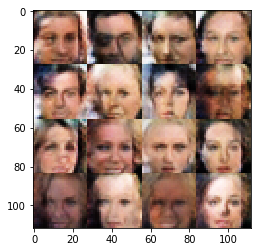

Timestamp 20170803-21-48-32.146 -  Epoch 1/1 -  Step 11910 -  D Loss: 1.0429 - G Loss: 1.0176
Timestamp 20170803-21-48-38.307 -  Epoch 1/1 -  Step 11920 -  D Loss: 0.6365 - G Loss: 1.9760
Timestamp 20170803-21-48-44.503 -  Epoch 1/1 -  Step 11930 -  D Loss: 1.5235 - G Loss: 0.8511
Timestamp 20170803-21-48-50.689 -  Epoch 1/1 -  Step 11940 -  D Loss: 0.6162 - G Loss: 1.7544
Timestamp 20170803-21-48-56.874 -  Epoch 1/1 -  Step 11950 -  D Loss: 1.2358 - G Loss: 0.7515
Timestamp 20170803-21-49-03.072 -  Epoch 1/1 -  Step 11960 -  D Loss: 0.7715 - G Loss: 1.3811
Timestamp 20170803-21-49-09.256 -  Epoch 1/1 -  Step 11970 -  D Loss: 0.5635 - G Loss: 1.8523
Timestamp 20170803-21-49-15.439 -  Epoch 1/1 -  Step 11980 -  D Loss: 0.8026 - G Loss: 1.6011
Timestamp 20170803-21-49-21.653 -  Epoch 1/1 -  Step 11990 -  D Loss: 1.0231 - G Loss: 1.5435
Timestamp 20170803-21-49-27.839 -  Epoch 1/1 -  Step 12000 -  D Loss: 1.0400 - G Loss: 1.6662


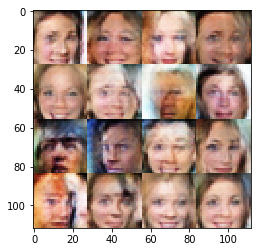

Timestamp 20170803-21-49-34.813 -  Epoch 1/1 -  Step 12010 -  D Loss: 0.8047 - G Loss: 1.0916
Timestamp 20170803-21-49-41.002 -  Epoch 1/1 -  Step 12020 -  D Loss: 0.9424 - G Loss: 2.1026
Timestamp 20170803-21-49-47.193 -  Epoch 1/1 -  Step 12030 -  D Loss: 0.8290 - G Loss: 1.2884
Timestamp 20170803-21-49-53.381 -  Epoch 1/1 -  Step 12040 -  D Loss: 0.8331 - G Loss: 1.2108
Timestamp 20170803-21-49-59.547 -  Epoch 1/1 -  Step 12050 -  D Loss: 0.9043 - G Loss: 1.0119
Timestamp 20170803-21-50-05.766 -  Epoch 1/1 -  Step 12060 -  D Loss: 1.2245 - G Loss: 1.0944
Timestamp 20170803-21-50-11.959 -  Epoch 1/1 -  Step 12070 -  D Loss: 1.2394 - G Loss: 0.6946
Timestamp 20170803-21-50-18.137 -  Epoch 1/1 -  Step 12080 -  D Loss: 0.9939 - G Loss: 1.3972
Timestamp 20170803-21-50-24.325 -  Epoch 1/1 -  Step 12090 -  D Loss: 0.5927 - G Loss: 2.1463
Timestamp 20170803-21-50-30.515 -  Epoch 1/1 -  Step 12100 -  D Loss: 1.2057 - G Loss: 1.2791


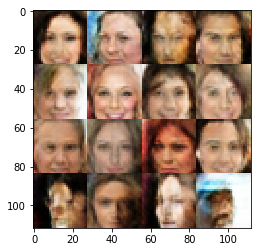

Timestamp 20170803-21-50-37.468 -  Epoch 1/1 -  Step 12110 -  D Loss: 0.7700 - G Loss: 1.5487
Timestamp 20170803-21-50-43.639 -  Epoch 1/1 -  Step 12120 -  D Loss: 1.1953 - G Loss: 1.1715
Timestamp 20170803-21-50-49.837 -  Epoch 1/1 -  Step 12130 -  D Loss: 1.1955 - G Loss: 1.6229
Timestamp 20170803-21-50-56.021 -  Epoch 1/1 -  Step 12140 -  D Loss: 1.0045 - G Loss: 0.7991
Timestamp 20170803-21-51-02.217 -  Epoch 1/1 -  Step 12150 -  D Loss: 0.8901 - G Loss: 0.9147
Timestamp 20170803-21-51-08.383 -  Epoch 1/1 -  Step 12160 -  D Loss: 1.3156 - G Loss: 0.6874
Timestamp 20170803-21-51-14.567 -  Epoch 1/1 -  Step 12170 -  D Loss: 0.9041 - G Loss: 1.2901
Timestamp 20170803-21-51-20.750 -  Epoch 1/1 -  Step 12180 -  D Loss: 0.7052 - G Loss: 1.5043
Timestamp 20170803-21-51-26.960 -  Epoch 1/1 -  Step 12190 -  D Loss: 0.8688 - G Loss: 1.3918
Timestamp 20170803-21-51-33.148 -  Epoch 1/1 -  Step 12200 -  D Loss: 0.7365 - G Loss: 1.4334


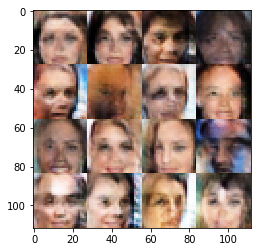

Timestamp 20170803-21-51-40.113 -  Epoch 1/1 -  Step 12210 -  D Loss: 1.4564 - G Loss: 0.8346
Timestamp 20170803-21-51-46.285 -  Epoch 1/1 -  Step 12220 -  D Loss: 0.9079 - G Loss: 1.5393
Timestamp 20170803-21-51-52.461 -  Epoch 1/1 -  Step 12230 -  D Loss: 0.8079 - G Loss: 1.2648
Timestamp 20170803-21-51-58.652 -  Epoch 1/1 -  Step 12240 -  D Loss: 0.7389 - G Loss: 1.2466
Timestamp 20170803-21-52-04.871 -  Epoch 1/1 -  Step 12250 -  D Loss: 1.7386 - G Loss: 0.4794
Timestamp 20170803-21-52-11.060 -  Epoch 1/1 -  Step 12260 -  D Loss: 1.0914 - G Loss: 1.8302
Timestamp 20170803-21-52-17.244 -  Epoch 1/1 -  Step 12270 -  D Loss: 1.1592 - G Loss: 0.8643
Timestamp 20170803-21-52-23.434 -  Epoch 1/1 -  Step 12280 -  D Loss: 0.7560 - G Loss: 1.4719
Timestamp 20170803-21-52-29.629 -  Epoch 1/1 -  Step 12290 -  D Loss: 1.3606 - G Loss: 0.6165
Timestamp 20170803-21-52-35.816 -  Epoch 1/1 -  Step 12300 -  D Loss: 1.1082 - G Loss: 2.3370


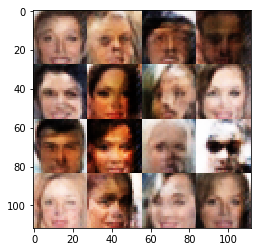

Timestamp 20170803-21-52-42.770 -  Epoch 1/1 -  Step 12310 -  D Loss: 0.8050 - G Loss: 0.9938
Timestamp 20170803-21-52-48.963 -  Epoch 1/1 -  Step 12320 -  D Loss: 0.7583 - G Loss: 1.8313
Timestamp 20170803-21-52-55.149 -  Epoch 1/1 -  Step 12330 -  D Loss: 1.0486 - G Loss: 1.1119
Timestamp 20170803-21-53-01.338 -  Epoch 1/1 -  Step 12340 -  D Loss: 1.0967 - G Loss: 1.0720
Timestamp 20170803-21-53-07.534 -  Epoch 1/1 -  Step 12350 -  D Loss: 0.7773 - G Loss: 1.2366
Timestamp 20170803-21-53-13.737 -  Epoch 1/1 -  Step 12360 -  D Loss: 1.0313 - G Loss: 0.5569
Timestamp 20170803-21-53-19.936 -  Epoch 1/1 -  Step 12370 -  D Loss: 0.9959 - G Loss: 1.8952
Timestamp 20170803-21-53-26.164 -  Epoch 1/1 -  Step 12380 -  D Loss: 0.8278 - G Loss: 1.0934
Timestamp 20170803-21-53-32.343 -  Epoch 1/1 -  Step 12390 -  D Loss: 0.9708 - G Loss: 1.1731
Timestamp 20170803-21-53-38.528 -  Epoch 1/1 -  Step 12400 -  D Loss: 1.4368 - G Loss: 1.0095


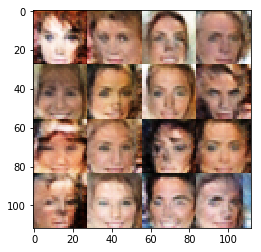

Timestamp 20170803-21-53-45.461 -  Epoch 1/1 -  Step 12410 -  D Loss: 1.0068 - G Loss: 1.3232
Timestamp 20170803-21-53-51.634 -  Epoch 1/1 -  Step 12420 -  D Loss: 0.7961 - G Loss: 1.0385
Timestamp 20170803-21-53-57.824 -  Epoch 1/1 -  Step 12430 -  D Loss: 1.2782 - G Loss: 0.8731
Timestamp 20170803-21-54-04.006 -  Epoch 1/1 -  Step 12440 -  D Loss: 0.6246 - G Loss: 1.4473
Timestamp 20170803-21-54-10.175 -  Epoch 1/1 -  Step 12450 -  D Loss: 1.3118 - G Loss: 0.9132
Timestamp 20170803-21-54-16.365 -  Epoch 1/1 -  Step 12460 -  D Loss: 0.9147 - G Loss: 1.3513
Timestamp 20170803-21-54-22.559 -  Epoch 1/1 -  Step 12470 -  D Loss: 1.0441 - G Loss: 0.9259
Timestamp 20170803-21-54-28.743 -  Epoch 1/1 -  Step 12480 -  D Loss: 0.9118 - G Loss: 1.4420
Timestamp 20170803-21-54-34.924 -  Epoch 1/1 -  Step 12490 -  D Loss: 1.2109 - G Loss: 0.9773
Timestamp 20170803-21-54-41.114 -  Epoch 1/1 -  Step 12500 -  D Loss: 1.0196 - G Loss: 1.0862


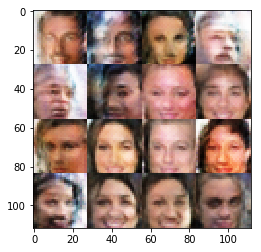

Timestamp 20170803-21-54-48.094 -  Epoch 1/1 -  Step 12510 -  D Loss: 1.0035 - G Loss: 0.8906
Timestamp 20170803-21-54-54.267 -  Epoch 1/1 -  Step 12520 -  D Loss: 0.9912 - G Loss: 0.8658
Timestamp 20170803-21-55-00.460 -  Epoch 1/1 -  Step 12530 -  D Loss: 1.0652 - G Loss: 1.2347
Timestamp 20170803-21-55-06.642 -  Epoch 1/1 -  Step 12540 -  D Loss: 0.8785 - G Loss: 1.0205
Timestamp 20170803-21-55-12.839 -  Epoch 1/1 -  Step 12550 -  D Loss: 0.9315 - G Loss: 1.7805
Timestamp 20170803-21-55-19.055 -  Epoch 1/1 -  Step 12560 -  D Loss: 1.2355 - G Loss: 0.9563
Timestamp 20170803-21-55-25.228 -  Epoch 1/1 -  Step 12570 -  D Loss: 0.9071 - G Loss: 1.4330
Timestamp 20170803-21-55-31.415 -  Epoch 1/1 -  Step 12580 -  D Loss: 0.8107 - G Loss: 1.8734
Timestamp 20170803-21-55-37.593 -  Epoch 1/1 -  Step 12590 -  D Loss: 0.9878 - G Loss: 1.1501
Timestamp 20170803-21-55-43.769 -  Epoch 1/1 -  Step 12600 -  D Loss: 1.2119 - G Loss: 0.9733


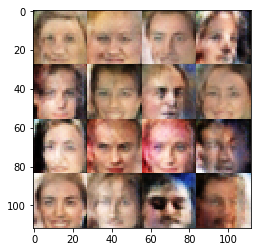

Timestamp 20170803-21-55-50.751 -  Epoch 1/1 -  Step 12610 -  D Loss: 1.1579 - G Loss: 0.8403
Timestamp 20170803-21-55-56.938 -  Epoch 1/1 -  Step 12620 -  D Loss: 0.6862 - G Loss: 1.2703
Timestamp 20170803-21-56-03.118 -  Epoch 1/1 -  Step 12630 -  D Loss: 0.7638 - G Loss: 1.1716
Timestamp 20170803-21-56-09.297 -  Epoch 1/1 -  Step 12640 -  D Loss: 1.0877 - G Loss: 0.7009
Timestamp 20170803-21-56-15.484 -  Epoch 1/1 -  Step 12650 -  D Loss: 1.0256 - G Loss: 1.0008
Timestamp 20170803-21-56-21.658 -  Epoch 1/1 -  Step 12660 -  D Loss: 0.8326 - G Loss: 1.5561
Timestamp 20170803-21-56-27.840 -  Epoch 1/1 -  Step 12670 -  D Loss: 0.6850 - G Loss: 1.0522
Timestamp 20170803-21-56-34.012 -  Epoch 1/1 -  Step 12680 -  D Loss: 0.7801 - G Loss: 1.7344
Timestamp 20170803-21-56-40.202 -  Epoch 1/1 -  Step 12690 -  D Loss: 1.4612 - G Loss: 0.6490
Timestamp 20170803-21-56-46.408 -  Epoch 1/1 -  Step 12700 -  D Loss: 1.2006 - G Loss: 1.2965


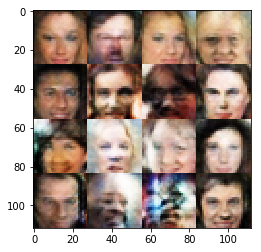

Timestamp 20170803-21-56-53.395 -  Epoch 1/1 -  Step 12710 -  D Loss: 1.0333 - G Loss: 0.9863
Timestamp 20170803-21-56-59.570 -  Epoch 1/1 -  Step 12720 -  D Loss: 1.0337 - G Loss: 1.1181
Timestamp 20170803-21-57-05.760 -  Epoch 1/1 -  Step 12730 -  D Loss: 0.9034 - G Loss: 1.4584
Timestamp 20170803-21-57-11.940 -  Epoch 1/1 -  Step 12740 -  D Loss: 1.1450 - G Loss: 1.2078
Timestamp 20170803-21-57-18.126 -  Epoch 1/1 -  Step 12750 -  D Loss: 0.8885 - G Loss: 1.3383
Timestamp 20170803-21-57-24.313 -  Epoch 1/1 -  Step 12760 -  D Loss: 1.0373 - G Loss: 1.4403
Timestamp 20170803-21-57-30.484 -  Epoch 1/1 -  Step 12770 -  D Loss: 1.0206 - G Loss: 1.2655
Timestamp 20170803-21-57-36.690 -  Epoch 1/1 -  Step 12780 -  D Loss: 1.8460 - G Loss: 1.1381
Timestamp 20170803-21-57-42.857 -  Epoch 1/1 -  Step 12790 -  D Loss: 0.8955 - G Loss: 1.8560
Timestamp 20170803-21-57-49.046 -  Epoch 1/1 -  Step 12800 -  D Loss: 0.9131 - G Loss: 1.2752


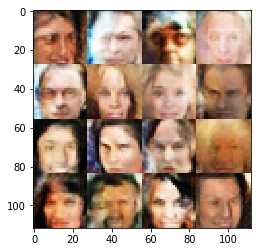

Timestamp 20170803-21-57-56.013 -  Epoch 1/1 -  Step 12810 -  D Loss: 1.0874 - G Loss: 0.9830
Timestamp 20170803-21-58-02.204 -  Epoch 1/1 -  Step 12820 -  D Loss: 1.0221 - G Loss: 1.3637
Timestamp 20170803-21-58-08.421 -  Epoch 1/1 -  Step 12830 -  D Loss: 1.1547 - G Loss: 1.4555
Timestamp 20170803-21-58-14.617 -  Epoch 1/1 -  Step 12840 -  D Loss: 1.0516 - G Loss: 0.7054
Timestamp 20170803-21-58-20.802 -  Epoch 1/1 -  Step 12850 -  D Loss: 1.4085 - G Loss: 0.9637
Timestamp 20170803-21-58-26.979 -  Epoch 1/1 -  Step 12860 -  D Loss: 0.8268 - G Loss: 1.8258
Timestamp 20170803-21-58-33.167 -  Epoch 1/1 -  Step 12870 -  D Loss: 1.2557 - G Loss: 0.8677
Timestamp 20170803-21-58-39.333 -  Epoch 1/1 -  Step 12880 -  D Loss: 1.0385 - G Loss: 1.0401
Timestamp 20170803-21-58-45.512 -  Epoch 1/1 -  Step 12890 -  D Loss: 1.2387 - G Loss: 0.7223
Timestamp 20170803-21-58-51.697 -  Epoch 1/1 -  Step 12900 -  D Loss: 1.0707 - G Loss: 1.8653


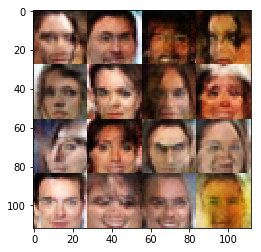

Timestamp 20170803-21-58-58.668 -  Epoch 1/1 -  Step 12910 -  D Loss: 1.0234 - G Loss: 1.2767
Timestamp 20170803-21-59-04.851 -  Epoch 1/1 -  Step 12920 -  D Loss: 0.9220 - G Loss: 1.4179
Timestamp 20170803-21-59-11.035 -  Epoch 1/1 -  Step 12930 -  D Loss: 0.9400 - G Loss: 1.3312
Timestamp 20170803-21-59-17.233 -  Epoch 1/1 -  Step 12940 -  D Loss: 1.1268 - G Loss: 0.9756
Timestamp 20170803-21-59-23.420 -  Epoch 1/1 -  Step 12950 -  D Loss: 0.8120 - G Loss: 2.1757
Timestamp 20170803-21-59-29.620 -  Epoch 1/1 -  Step 12960 -  D Loss: 0.8163 - G Loss: 0.9639
Timestamp 20170803-21-59-35.833 -  Epoch 1/1 -  Step 12970 -  D Loss: 0.9752 - G Loss: 0.9807
Timestamp 20170803-21-59-42.009 -  Epoch 1/1 -  Step 12980 -  D Loss: 1.1902 - G Loss: 0.8829
Timestamp 20170803-21-59-48.200 -  Epoch 1/1 -  Step 12990 -  D Loss: 0.8183 - G Loss: 1.8369
Timestamp 20170803-21-59-54.369 -  Epoch 1/1 -  Step 13000 -  D Loss: 0.8694 - G Loss: 1.7940


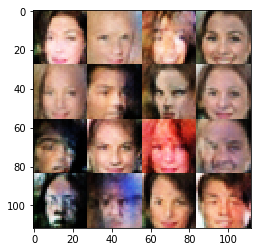

Timestamp 20170803-22-00-01.754 -  Epoch 1/1 -  Step 13010 -  D Loss: 1.0622 - G Loss: 1.4894
Timestamp 20170803-22-00-07.942 -  Epoch 1/1 -  Step 13020 -  D Loss: 1.3174 - G Loss: 1.5278
Timestamp 20170803-22-00-14.126 -  Epoch 1/1 -  Step 13030 -  D Loss: 1.0931 - G Loss: 2.2484
Timestamp 20170803-22-00-20.301 -  Epoch 1/1 -  Step 13040 -  D Loss: 0.8648 - G Loss: 0.9694
Timestamp 20170803-22-00-26.482 -  Epoch 1/1 -  Step 13050 -  D Loss: 0.9922 - G Loss: 1.3205
Timestamp 20170803-22-00-32.668 -  Epoch 1/1 -  Step 13060 -  D Loss: 0.9571 - G Loss: 0.9735
Timestamp 20170803-22-00-38.856 -  Epoch 1/1 -  Step 13070 -  D Loss: 1.1418 - G Loss: 0.9263
Timestamp 20170803-22-00-45.043 -  Epoch 1/1 -  Step 13080 -  D Loss: 1.2440 - G Loss: 0.8014
Timestamp 20170803-22-00-51.276 -  Epoch 1/1 -  Step 13090 -  D Loss: 1.3268 - G Loss: 1.2448
Timestamp 20170803-22-00-57.482 -  Epoch 1/1 -  Step 13100 -  D Loss: 1.2709 - G Loss: 1.1471


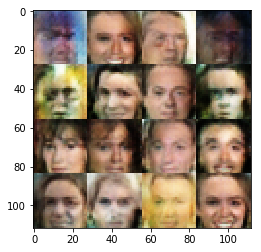

Timestamp 20170803-22-01-04.468 -  Epoch 1/1 -  Step 13110 -  D Loss: 1.4978 - G Loss: 0.9869
Timestamp 20170803-22-01-10.660 -  Epoch 1/1 -  Step 13120 -  D Loss: 1.7251 - G Loss: 0.8233
Timestamp 20170803-22-01-16.854 -  Epoch 1/1 -  Step 13130 -  D Loss: 1.1685 - G Loss: 1.0607
Timestamp 20170803-22-01-23.050 -  Epoch 1/1 -  Step 13140 -  D Loss: 1.3859 - G Loss: 0.8192
Timestamp 20170803-22-01-29.236 -  Epoch 1/1 -  Step 13150 -  D Loss: 1.0582 - G Loss: 1.1791
Timestamp 20170803-22-01-35.454 -  Epoch 1/1 -  Step 13160 -  D Loss: 1.2288 - G Loss: 1.1844
Timestamp 20170803-22-01-41.648 -  Epoch 1/1 -  Step 13170 -  D Loss: 0.7775 - G Loss: 1.0975
Timestamp 20170803-22-01-47.819 -  Epoch 1/1 -  Step 13180 -  D Loss: 1.0435 - G Loss: 1.4310
Timestamp 20170803-22-01-54.015 -  Epoch 1/1 -  Step 13190 -  D Loss: 0.9111 - G Loss: 0.9443
Timestamp 20170803-22-02-00.194 -  Epoch 1/1 -  Step 13200 -  D Loss: 0.8387 - G Loss: 0.5029


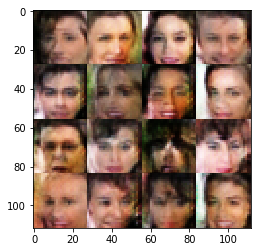

Timestamp 20170803-22-02-07.170 -  Epoch 1/1 -  Step 13210 -  D Loss: 1.1209 - G Loss: 0.9169
Timestamp 20170803-22-02-13.367 -  Epoch 1/1 -  Step 13220 -  D Loss: 1.2825 - G Loss: 0.6443
Timestamp 20170803-22-02-19.550 -  Epoch 1/1 -  Step 13230 -  D Loss: 1.0319 - G Loss: 1.1592
Timestamp 20170803-22-02-25.755 -  Epoch 1/1 -  Step 13240 -  D Loss: 1.0223 - G Loss: 1.0426
Timestamp 20170803-22-02-31.942 -  Epoch 1/1 -  Step 13250 -  D Loss: 1.5768 - G Loss: 1.5856
Timestamp 20170803-22-02-38.158 -  Epoch 1/1 -  Step 13260 -  D Loss: 1.1780 - G Loss: 1.3062
Timestamp 20170803-22-02-44.337 -  Epoch 1/1 -  Step 13270 -  D Loss: 1.3002 - G Loss: 0.9478
Timestamp 20170803-22-02-50.529 -  Epoch 1/1 -  Step 13280 -  D Loss: 0.9787 - G Loss: 1.2462
Timestamp 20170803-22-02-56.703 -  Epoch 1/1 -  Step 13290 -  D Loss: 0.8797 - G Loss: 2.0127
Timestamp 20170803-22-03-02.886 -  Epoch 1/1 -  Step 13300 -  D Loss: 0.8923 - G Loss: 1.4348


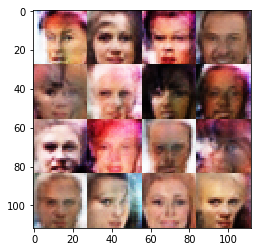

Timestamp 20170803-22-03-09.861 -  Epoch 1/1 -  Step 13310 -  D Loss: 1.1029 - G Loss: 0.8063
Timestamp 20170803-22-03-16.046 -  Epoch 1/1 -  Step 13320 -  D Loss: 1.0406 - G Loss: 1.4936
Timestamp 20170803-22-03-22.246 -  Epoch 1/1 -  Step 13330 -  D Loss: 1.2352 - G Loss: 1.0284
Timestamp 20170803-22-03-28.449 -  Epoch 1/1 -  Step 13340 -  D Loss: 0.9504 - G Loss: 1.6609
Timestamp 20170803-22-03-34.637 -  Epoch 1/1 -  Step 13350 -  D Loss: 1.1597 - G Loss: 1.0046
Timestamp 20170803-22-03-40.815 -  Epoch 1/1 -  Step 13360 -  D Loss: 1.1493 - G Loss: 0.9238
Timestamp 20170803-22-03-47.010 -  Epoch 1/1 -  Step 13370 -  D Loss: 1.2945 - G Loss: 0.7787
Timestamp 20170803-22-03-53.241 -  Epoch 1/1 -  Step 13380 -  D Loss: 0.9166 - G Loss: 1.0509
Timestamp 20170803-22-03-59.427 -  Epoch 1/1 -  Step 13390 -  D Loss: 1.2272 - G Loss: 1.0492
Timestamp 20170803-22-04-05.601 -  Epoch 1/1 -  Step 13400 -  D Loss: 1.0077 - G Loss: 1.2524


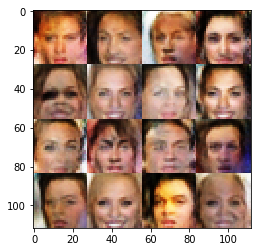

Timestamp 20170803-22-04-12.609 -  Epoch 1/1 -  Step 13410 -  D Loss: 0.9317 - G Loss: 1.3880
Timestamp 20170803-22-04-18.815 -  Epoch 1/1 -  Step 13420 -  D Loss: 0.8974 - G Loss: 1.8588
Timestamp 20170803-22-04-24.984 -  Epoch 1/1 -  Step 13430 -  D Loss: 1.1175 - G Loss: 0.8375
Timestamp 20170803-22-04-31.179 -  Epoch 1/1 -  Step 13440 -  D Loss: 1.2121 - G Loss: 0.6770
Timestamp 20170803-22-04-37.365 -  Epoch 1/1 -  Step 13450 -  D Loss: 0.9081 - G Loss: 0.8985
Timestamp 20170803-22-04-43.576 -  Epoch 1/1 -  Step 13460 -  D Loss: 1.1382 - G Loss: 1.6868
Timestamp 20170803-22-04-49.757 -  Epoch 1/1 -  Step 13470 -  D Loss: 1.0573 - G Loss: 0.7870
Timestamp 20170803-22-04-55.993 -  Epoch 1/1 -  Step 13480 -  D Loss: 0.9883 - G Loss: 1.3653
Timestamp 20170803-22-05-02.211 -  Epoch 1/1 -  Step 13490 -  D Loss: 0.9878 - G Loss: 0.7202
Timestamp 20170803-22-05-08.384 -  Epoch 1/1 -  Step 13500 -  D Loss: 1.2092 - G Loss: 0.9002


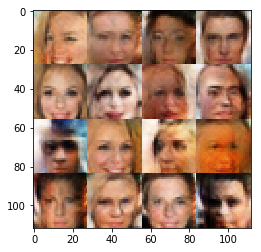

Timestamp 20170803-22-05-15.381 -  Epoch 1/1 -  Step 13510 -  D Loss: 1.0115 - G Loss: 1.1485
Timestamp 20170803-22-05-21.583 -  Epoch 1/1 -  Step 13520 -  D Loss: 1.3084 - G Loss: 0.7135
Timestamp 20170803-22-05-27.772 -  Epoch 1/1 -  Step 13530 -  D Loss: 0.9485 - G Loss: 0.7800
Timestamp 20170803-22-05-33.955 -  Epoch 1/1 -  Step 13540 -  D Loss: 0.8809 - G Loss: 1.6413
Timestamp 20170803-22-05-40.173 -  Epoch 1/1 -  Step 13550 -  D Loss: 1.0040 - G Loss: 1.5866
Timestamp 20170803-22-05-46.341 -  Epoch 1/1 -  Step 13560 -  D Loss: 1.0592 - G Loss: 1.1861
Timestamp 20170803-22-05-52.546 -  Epoch 1/1 -  Step 13570 -  D Loss: 1.2766 - G Loss: 1.0181
Timestamp 20170803-22-05-58.741 -  Epoch 1/1 -  Step 13580 -  D Loss: 0.9357 - G Loss: 0.7568
Timestamp 20170803-22-06-04.929 -  Epoch 1/1 -  Step 13590 -  D Loss: 1.1064 - G Loss: 0.7850
Timestamp 20170803-22-06-11.109 -  Epoch 1/1 -  Step 13600 -  D Loss: 0.9278 - G Loss: 1.0007


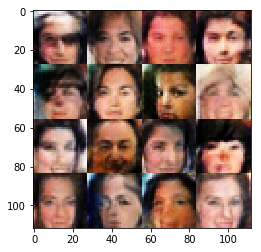

Timestamp 20170803-22-06-18.131 -  Epoch 1/1 -  Step 13610 -  D Loss: 0.8969 - G Loss: 1.5406
Timestamp 20170803-22-06-24.329 -  Epoch 1/1 -  Step 13620 -  D Loss: 1.0698 - G Loss: 1.4872
Timestamp 20170803-22-06-30.518 -  Epoch 1/1 -  Step 13630 -  D Loss: 1.6541 - G Loss: 0.7989
Timestamp 20170803-22-06-36.725 -  Epoch 1/1 -  Step 13640 -  D Loss: 1.3381 - G Loss: 1.2768
Timestamp 20170803-22-06-42.904 -  Epoch 1/1 -  Step 13650 -  D Loss: 1.0139 - G Loss: 1.6314
Timestamp 20170803-22-06-49.094 -  Epoch 1/1 -  Step 13660 -  D Loss: 0.9001 - G Loss: 1.1052
Timestamp 20170803-22-06-55.284 -  Epoch 1/1 -  Step 13670 -  D Loss: 0.9250 - G Loss: 1.2199
Timestamp 20170803-22-07-01.478 -  Epoch 1/1 -  Step 13680 -  D Loss: 0.8554 - G Loss: 1.4350
Timestamp 20170803-22-07-07.662 -  Epoch 1/1 -  Step 13690 -  D Loss: 1.2061 - G Loss: 1.0888
Timestamp 20170803-22-07-13.861 -  Epoch 1/1 -  Step 13700 -  D Loss: 1.1556 - G Loss: 1.2016


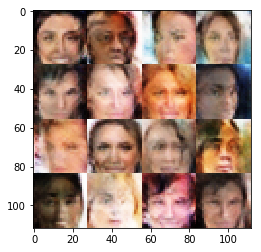

Timestamp 20170803-22-07-20.848 -  Epoch 1/1 -  Step 13710 -  D Loss: 1.2604 - G Loss: 2.1598
Timestamp 20170803-22-07-27.076 -  Epoch 1/1 -  Step 13720 -  D Loss: 1.1673 - G Loss: 0.8510
Timestamp 20170803-22-07-33.257 -  Epoch 1/1 -  Step 13730 -  D Loss: 1.3521 - G Loss: 0.8846
Timestamp 20170803-22-07-39.427 -  Epoch 1/1 -  Step 13740 -  D Loss: 1.0823 - G Loss: 0.8314
Timestamp 20170803-22-07-45.615 -  Epoch 1/1 -  Step 13750 -  D Loss: 1.3538 - G Loss: 0.9727
Timestamp 20170803-22-07-51.794 -  Epoch 1/1 -  Step 13760 -  D Loss: 0.9026 - G Loss: 1.3372
Timestamp 20170803-22-07-57.975 -  Epoch 1/1 -  Step 13770 -  D Loss: 1.1864 - G Loss: 1.4377
Timestamp 20170803-22-08-04.181 -  Epoch 1/1 -  Step 13780 -  D Loss: 1.0611 - G Loss: 0.8965
Timestamp 20170803-22-08-10.397 -  Epoch 1/1 -  Step 13790 -  D Loss: 0.6758 - G Loss: 1.7412
Timestamp 20170803-22-08-16.573 -  Epoch 1/1 -  Step 13800 -  D Loss: 1.2741 - G Loss: 0.8696


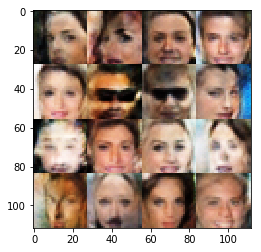

Timestamp 20170803-22-08-23.597 -  Epoch 1/1 -  Step 13810 -  D Loss: 0.6433 - G Loss: 1.7947
Timestamp 20170803-22-08-29.795 -  Epoch 1/1 -  Step 13820 -  D Loss: 1.5540 - G Loss: 0.8445
Timestamp 20170803-22-08-35.991 -  Epoch 1/1 -  Step 13830 -  D Loss: 0.7412 - G Loss: 1.1990
Timestamp 20170803-22-08-42.165 -  Epoch 1/1 -  Step 13840 -  D Loss: 0.9328 - G Loss: 1.4724
Timestamp 20170803-22-08-48.384 -  Epoch 1/1 -  Step 13850 -  D Loss: 1.0613 - G Loss: 1.4736
Timestamp 20170803-22-08-54.569 -  Epoch 1/1 -  Step 13860 -  D Loss: 1.7117 - G Loss: 0.5685
Timestamp 20170803-22-09-00.769 -  Epoch 1/1 -  Step 13870 -  D Loss: 1.0404 - G Loss: 1.2991
Timestamp 20170803-22-09-06.953 -  Epoch 1/1 -  Step 13880 -  D Loss: 1.0174 - G Loss: 0.6303
Timestamp 20170803-22-09-13.163 -  Epoch 1/1 -  Step 13890 -  D Loss: 1.0328 - G Loss: 1.6597
Timestamp 20170803-22-09-19.381 -  Epoch 1/1 -  Step 13900 -  D Loss: 0.9801 - G Loss: 0.9789


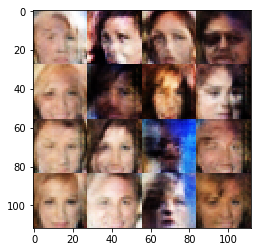

Timestamp 20170803-22-09-26.372 -  Epoch 1/1 -  Step 13910 -  D Loss: 1.3584 - G Loss: 1.0355
Timestamp 20170803-22-09-32.552 -  Epoch 1/1 -  Step 13920 -  D Loss: 0.9212 - G Loss: 1.5957
Timestamp 20170803-22-09-38.738 -  Epoch 1/1 -  Step 13930 -  D Loss: 0.9503 - G Loss: 1.6638
Timestamp 20170803-22-09-44.944 -  Epoch 1/1 -  Step 13940 -  D Loss: 1.1893 - G Loss: 0.5888
Timestamp 20170803-22-09-51.126 -  Epoch 1/1 -  Step 13950 -  D Loss: 1.0938 - G Loss: 1.4744
Timestamp 20170803-22-09-57.299 -  Epoch 1/1 -  Step 13960 -  D Loss: 1.0560 - G Loss: 0.8954
Timestamp 20170803-22-10-03.482 -  Epoch 1/1 -  Step 13970 -  D Loss: 1.3259 - G Loss: 0.7461
Timestamp 20170803-22-10-09.662 -  Epoch 1/1 -  Step 13980 -  D Loss: 1.2581 - G Loss: 1.2557
Timestamp 20170803-22-10-15.839 -  Epoch 1/1 -  Step 13990 -  D Loss: 1.3368 - G Loss: 1.0315
Timestamp 20170803-22-10-22.011 -  Epoch 1/1 -  Step 14000 -  D Loss: 1.0770 - G Loss: 0.8122


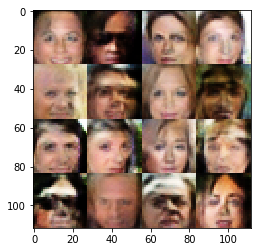

Timestamp 20170803-22-10-29.001 -  Epoch 1/1 -  Step 14010 -  D Loss: 1.1725 - G Loss: 1.1778
Timestamp 20170803-22-10-35.190 -  Epoch 1/1 -  Step 14020 -  D Loss: 1.1227 - G Loss: 0.8724
Timestamp 20170803-22-10-41.396 -  Epoch 1/1 -  Step 14030 -  D Loss: 1.6626 - G Loss: 0.6347
Timestamp 20170803-22-10-47.591 -  Epoch 1/1 -  Step 14040 -  D Loss: 0.9630 - G Loss: 1.1652
Timestamp 20170803-22-10-53.776 -  Epoch 1/1 -  Step 14050 -  D Loss: 1.2234 - G Loss: 1.1238
Timestamp 20170803-22-10-59.947 -  Epoch 1/1 -  Step 14060 -  D Loss: 0.8131 - G Loss: 1.6366
Timestamp 20170803-22-11-06.137 -  Epoch 1/1 -  Step 14070 -  D Loss: 1.6133 - G Loss: 1.0779
Timestamp 20170803-22-11-12.311 -  Epoch 1/1 -  Step 14080 -  D Loss: 0.7694 - G Loss: 1.4741
Timestamp 20170803-22-11-18.499 -  Epoch 1/1 -  Step 14090 -  D Loss: 1.0752 - G Loss: 1.3202
Timestamp 20170803-22-11-24.693 -  Epoch 1/1 -  Step 14100 -  D Loss: 1.1239 - G Loss: 1.1552


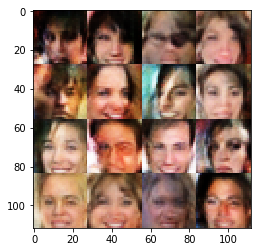

Timestamp 20170803-22-11-31.681 -  Epoch 1/1 -  Step 14110 -  D Loss: 1.0469 - G Loss: 0.7895
Timestamp 20170803-22-11-37.861 -  Epoch 1/1 -  Step 14120 -  D Loss: 1.2533 - G Loss: 0.6864
Timestamp 20170803-22-11-44.052 -  Epoch 1/1 -  Step 14130 -  D Loss: 1.0242 - G Loss: 0.9144
Timestamp 20170803-22-11-50.235 -  Epoch 1/1 -  Step 14140 -  D Loss: 0.7427 - G Loss: 1.5789
Timestamp 20170803-22-11-56.414 -  Epoch 1/1 -  Step 14150 -  D Loss: 1.2355 - G Loss: 0.8815
Timestamp 20170803-22-12-02.580 -  Epoch 1/1 -  Step 14160 -  D Loss: 0.9424 - G Loss: 1.2774
Timestamp 20170803-22-12-08.782 -  Epoch 1/1 -  Step 14170 -  D Loss: 1.1787 - G Loss: 1.2513
Timestamp 20170803-22-12-14.964 -  Epoch 1/1 -  Step 14180 -  D Loss: 0.9195 - G Loss: 0.7770
Timestamp 20170803-22-12-21.152 -  Epoch 1/1 -  Step 14190 -  D Loss: 0.8673 - G Loss: 1.2576
Timestamp 20170803-22-12-27.346 -  Epoch 1/1 -  Step 14200 -  D Loss: 1.4836 - G Loss: 0.8819


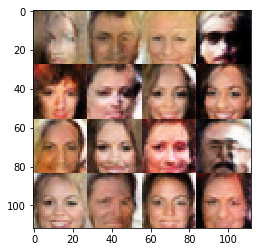

Timestamp 20170803-22-12-34.329 -  Epoch 1/1 -  Step 14210 -  D Loss: 1.1220 - G Loss: 1.1346
Timestamp 20170803-22-12-40.509 -  Epoch 1/1 -  Step 14220 -  D Loss: 0.9274 - G Loss: 0.5653
Timestamp 20170803-22-12-46.703 -  Epoch 1/1 -  Step 14230 -  D Loss: 0.9973 - G Loss: 1.3642
Timestamp 20170803-22-12-52.877 -  Epoch 1/1 -  Step 14240 -  D Loss: 0.9512 - G Loss: 1.0963
Timestamp 20170803-22-12-59.054 -  Epoch 1/1 -  Step 14250 -  D Loss: 0.7913 - G Loss: 1.0686
Timestamp 20170803-22-13-05.232 -  Epoch 1/1 -  Step 14260 -  D Loss: 1.0723 - G Loss: 0.8718
Timestamp 20170803-22-13-11.418 -  Epoch 1/1 -  Step 14270 -  D Loss: 1.0188 - G Loss: 1.0520
Timestamp 20170803-22-13-17.600 -  Epoch 1/1 -  Step 14280 -  D Loss: 1.0172 - G Loss: 1.2174
Timestamp 20170803-22-13-23.823 -  Epoch 1/1 -  Step 14290 -  D Loss: 0.7873 - G Loss: 1.8291
Timestamp 20170803-22-13-30.025 -  Epoch 1/1 -  Step 14300 -  D Loss: 0.8082 - G Loss: 1.4081


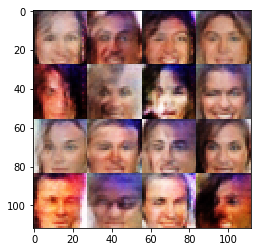

Timestamp 20170803-22-13-37.318 -  Epoch 1/1 -  Step 14310 -  D Loss: 1.0404 - G Loss: 1.4758
Timestamp 20170803-22-13-43.537 -  Epoch 1/1 -  Step 14320 -  D Loss: 1.1836 - G Loss: 0.6930
Timestamp 20170803-22-13-49.746 -  Epoch 1/1 -  Step 14330 -  D Loss: 1.1024 - G Loss: 0.9391
Timestamp 20170803-22-13-55.986 -  Epoch 1/1 -  Step 14340 -  D Loss: 0.8976 - G Loss: 0.8485
Timestamp 20170803-22-14-02.198 -  Epoch 1/1 -  Step 14350 -  D Loss: 0.8092 - G Loss: 1.5138
Timestamp 20170803-22-14-08.456 -  Epoch 1/1 -  Step 14360 -  D Loss: 0.9925 - G Loss: 1.3433
Timestamp 20170803-22-14-14.682 -  Epoch 1/1 -  Step 14370 -  D Loss: 1.1296 - G Loss: 1.0530
Timestamp 20170803-22-14-20.888 -  Epoch 1/1 -  Step 14380 -  D Loss: 1.1547 - G Loss: 1.3247
Timestamp 20170803-22-14-27.091 -  Epoch 1/1 -  Step 14390 -  D Loss: 0.8976 - G Loss: 1.2126
Timestamp 20170803-22-14-33.378 -  Epoch 1/1 -  Step 14400 -  D Loss: 0.9941 - G Loss: 0.5952


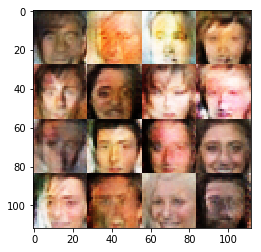

Timestamp 20170803-22-14-40.445 -  Epoch 1/1 -  Step 14410 -  D Loss: 0.9211 - G Loss: 1.1168
Timestamp 20170803-22-14-46.621 -  Epoch 1/1 -  Step 14420 -  D Loss: 1.0757 - G Loss: 1.5393
Timestamp 20170803-22-14-52.835 -  Epoch 1/1 -  Step 14430 -  D Loss: 0.7247 - G Loss: 1.2414
Timestamp 20170803-22-14-59.049 -  Epoch 1/1 -  Step 14440 -  D Loss: 1.1260 - G Loss: 1.6763
Timestamp 20170803-22-15-05.307 -  Epoch 1/1 -  Step 14450 -  D Loss: 0.8330 - G Loss: 1.4186
Timestamp 20170803-22-15-11.512 -  Epoch 1/1 -  Step 14460 -  D Loss: 1.1603 - G Loss: 1.1599
Timestamp 20170803-22-15-17.735 -  Epoch 1/1 -  Step 14470 -  D Loss: 1.6632 - G Loss: 1.0822
Timestamp 20170803-22-15-23.937 -  Epoch 1/1 -  Step 14480 -  D Loss: 1.0486 - G Loss: 1.5487
Timestamp 20170803-22-15-30.135 -  Epoch 1/1 -  Step 14490 -  D Loss: 0.6792 - G Loss: 1.4411
Timestamp 20170803-22-15-36.367 -  Epoch 1/1 -  Step 14500 -  D Loss: 0.9159 - G Loss: 1.6129


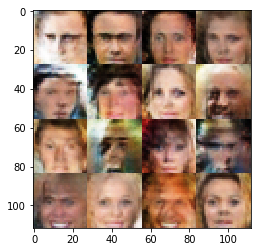

Timestamp 20170803-22-15-43.438 -  Epoch 1/1 -  Step 14510 -  D Loss: 1.4252 - G Loss: 0.8909
Timestamp 20170803-22-15-49.614 -  Epoch 1/1 -  Step 14520 -  D Loss: 1.0489 - G Loss: 0.9673
Timestamp 20170803-22-15-55.815 -  Epoch 1/1 -  Step 14530 -  D Loss: 1.1274 - G Loss: 1.2334
Timestamp 20170803-22-16-02.017 -  Epoch 1/1 -  Step 14540 -  D Loss: 0.8774 - G Loss: 1.3431
Timestamp 20170803-22-16-08.257 -  Epoch 1/1 -  Step 14550 -  D Loss: 1.2416 - G Loss: 0.9248
Timestamp 20170803-22-16-14.448 -  Epoch 1/1 -  Step 14560 -  D Loss: 0.9216 - G Loss: 1.1617
Timestamp 20170803-22-16-20.678 -  Epoch 1/1 -  Step 14570 -  D Loss: 1.0118 - G Loss: 0.8367
Timestamp 20170803-22-16-26.865 -  Epoch 1/1 -  Step 14580 -  D Loss: 1.1584 - G Loss: 0.8919
Timestamp 20170803-22-16-33.132 -  Epoch 1/1 -  Step 14590 -  D Loss: 1.1802 - G Loss: 1.5075
Timestamp 20170803-22-16-39.327 -  Epoch 1/1 -  Step 14600 -  D Loss: 1.2937 - G Loss: 0.8874


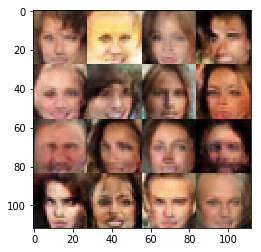

Timestamp 20170803-22-16-46.511 -  Epoch 1/1 -  Step 14610 -  D Loss: 1.1258 - G Loss: 1.6701
Timestamp 20170803-22-16-52.763 -  Epoch 1/1 -  Step 14620 -  D Loss: 1.1054 - G Loss: 0.6332
Timestamp 20170803-22-16-58.965 -  Epoch 1/1 -  Step 14630 -  D Loss: 1.0698 - G Loss: 0.7078
Timestamp 20170803-22-17-05.217 -  Epoch 1/1 -  Step 14640 -  D Loss: 0.8921 - G Loss: 1.4796
Timestamp 20170803-22-17-11.438 -  Epoch 1/1 -  Step 14650 -  D Loss: 1.2986 - G Loss: 0.9174
Timestamp 20170803-22-17-17.658 -  Epoch 1/1 -  Step 14660 -  D Loss: 1.2407 - G Loss: 1.4098
Timestamp 20170803-22-17-23.905 -  Epoch 1/1 -  Step 14670 -  D Loss: 1.3920 - G Loss: 0.9373
Timestamp 20170803-22-17-30.136 -  Epoch 1/1 -  Step 14680 -  D Loss: 0.8654 - G Loss: 1.0827
Timestamp 20170803-22-17-36.425 -  Epoch 1/1 -  Step 14690 -  D Loss: 1.4034 - G Loss: 0.7964
Timestamp 20170803-22-17-42.651 -  Epoch 1/1 -  Step 14700 -  D Loss: 1.1471 - G Loss: 0.8916


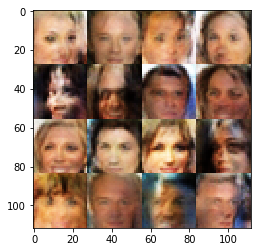

Timestamp 20170803-22-17-49.681 -  Epoch 1/1 -  Step 14710 -  D Loss: 0.6449 - G Loss: 1.3878
Timestamp 20170803-22-17-55.892 -  Epoch 1/1 -  Step 14720 -  D Loss: 0.8570 - G Loss: 1.3349
Timestamp 20170803-22-18-02.155 -  Epoch 1/1 -  Step 14730 -  D Loss: 0.8817 - G Loss: 1.1550
Timestamp 20170803-22-18-08.376 -  Epoch 1/1 -  Step 14740 -  D Loss: 0.8237 - G Loss: 1.1816
Timestamp 20170803-22-18-14.585 -  Epoch 1/1 -  Step 14750 -  D Loss: 1.2464 - G Loss: 1.0505
Timestamp 20170803-22-18-20.819 -  Epoch 1/1 -  Step 14760 -  D Loss: 1.0631 - G Loss: 0.9078
Timestamp 20170803-22-18-27.062 -  Epoch 1/1 -  Step 14770 -  D Loss: 1.0009 - G Loss: 0.8006
Timestamp 20170803-22-18-33.312 -  Epoch 1/1 -  Step 14780 -  D Loss: 1.3296 - G Loss: 0.6001
Timestamp 20170803-22-18-39.526 -  Epoch 1/1 -  Step 14790 -  D Loss: 1.0087 - G Loss: 0.9965
Timestamp 20170803-22-18-45.776 -  Epoch 1/1 -  Step 14800 -  D Loss: 1.1429 - G Loss: 0.9784


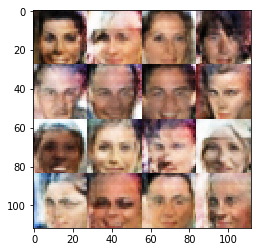

Timestamp 20170803-22-18-53.287 -  Epoch 1/1 -  Step 14810 -  D Loss: 0.9364 - G Loss: 1.2442
Timestamp 20170803-22-18-59.501 -  Epoch 1/1 -  Step 14820 -  D Loss: 0.9542 - G Loss: 0.9952
Timestamp 20170803-22-19-05.706 -  Epoch 1/1 -  Step 14830 -  D Loss: 0.9039 - G Loss: 1.0645
Timestamp 20170803-22-19-11.925 -  Epoch 1/1 -  Step 14840 -  D Loss: 1.0699 - G Loss: 0.9294
Timestamp 20170803-22-19-18.122 -  Epoch 1/1 -  Step 14850 -  D Loss: 1.1541 - G Loss: 1.1876
Timestamp 20170803-22-19-24.301 -  Epoch 1/1 -  Step 14860 -  D Loss: 0.8938 - G Loss: 1.1208
Timestamp 20170803-22-19-30.537 -  Epoch 1/1 -  Step 14870 -  D Loss: 1.4864 - G Loss: 0.7957
Timestamp 20170803-22-19-36.780 -  Epoch 1/1 -  Step 14880 -  D Loss: 1.2679 - G Loss: 1.2803
Timestamp 20170803-22-19-42.995 -  Epoch 1/1 -  Step 14890 -  D Loss: 0.7202 - G Loss: 1.2666
Timestamp 20170803-22-19-49.269 -  Epoch 1/1 -  Step 14900 -  D Loss: 0.9984 - G Loss: 1.3237


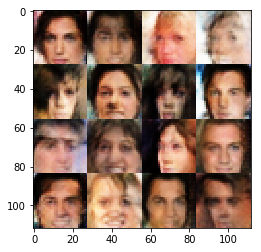

Timestamp 20170803-22-19-56.660 -  Epoch 1/1 -  Step 14910 -  D Loss: 1.1097 - G Loss: 1.2180
Timestamp 20170803-22-20-02.945 -  Epoch 1/1 -  Step 14920 -  D Loss: 1.2348 - G Loss: 1.2603
Timestamp 20170803-22-20-09.152 -  Epoch 1/1 -  Step 14930 -  D Loss: 1.3295 - G Loss: 1.1390
Timestamp 20170803-22-20-15.396 -  Epoch 1/1 -  Step 14940 -  D Loss: 1.4289 - G Loss: 0.4308
Timestamp 20170803-22-20-21.683 -  Epoch 1/1 -  Step 14950 -  D Loss: 1.1493 - G Loss: 1.2151
Timestamp 20170803-22-20-27.942 -  Epoch 1/1 -  Step 14960 -  D Loss: 0.7399 - G Loss: 2.0496
Timestamp 20170803-22-20-34.196 -  Epoch 1/1 -  Step 14970 -  D Loss: 1.5367 - G Loss: 0.9580
Timestamp 20170803-22-20-40.526 -  Epoch 1/1 -  Step 14980 -  D Loss: 0.7536 - G Loss: 1.4767
Timestamp 20170803-22-20-46.800 -  Epoch 1/1 -  Step 14990 -  D Loss: 0.9492 - G Loss: 0.9466
Timestamp 20170803-22-20-53.105 -  Epoch 1/1 -  Step 15000 -  D Loss: 0.8807 - G Loss: 1.3388


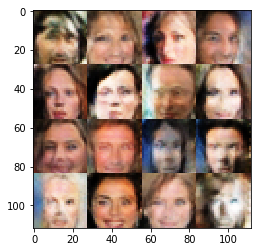

Timestamp 20170803-22-21-00.990 -  Epoch 1/1 -  Step 15010 -  D Loss: 0.9862 - G Loss: 1.6365
Timestamp 20170803-22-21-07.252 -  Epoch 1/1 -  Step 15020 -  D Loss: 1.4339 - G Loss: 0.7466
Timestamp 20170803-22-21-13.458 -  Epoch 1/1 -  Step 15030 -  D Loss: 0.8532 - G Loss: 1.1814
Timestamp 20170803-22-21-19.688 -  Epoch 1/1 -  Step 15040 -  D Loss: 1.2019 - G Loss: 1.1275
Timestamp 20170803-22-21-25.957 -  Epoch 1/1 -  Step 15050 -  D Loss: 1.0309 - G Loss: 1.0375
Timestamp 20170803-22-21-32.178 -  Epoch 1/1 -  Step 15060 -  D Loss: 0.7966 - G Loss: 1.1529
Timestamp 20170803-22-21-38.373 -  Epoch 1/1 -  Step 15070 -  D Loss: 0.8852 - G Loss: 1.1219
Timestamp 20170803-22-21-44.572 -  Epoch 1/1 -  Step 15080 -  D Loss: 1.1853 - G Loss: 1.0478
Timestamp 20170803-22-21-50.820 -  Epoch 1/1 -  Step 15090 -  D Loss: 0.9511 - G Loss: 1.1601
Timestamp 20170803-22-21-57.054 -  Epoch 1/1 -  Step 15100 -  D Loss: 0.9636 - G Loss: 0.5811


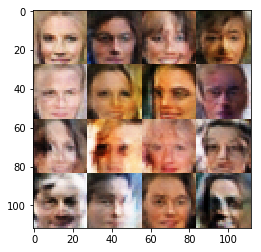

Timestamp 20170803-22-22-04.497 -  Epoch 1/1 -  Step 15110 -  D Loss: 1.0089 - G Loss: 1.5734
Timestamp 20170803-22-22-10.752 -  Epoch 1/1 -  Step 15120 -  D Loss: 1.0921 - G Loss: 1.4428
Timestamp 20170803-22-22-16.995 -  Epoch 1/1 -  Step 15130 -  D Loss: 1.1241 - G Loss: 1.0846
Timestamp 20170803-22-22-23.244 -  Epoch 1/1 -  Step 15140 -  D Loss: 0.9063 - G Loss: 1.1960
Timestamp 20170803-22-22-29.488 -  Epoch 1/1 -  Step 15150 -  D Loss: 1.3782 - G Loss: 1.0448
Timestamp 20170803-22-22-35.708 -  Epoch 1/1 -  Step 15160 -  D Loss: 0.9154 - G Loss: 1.7354
Timestamp 20170803-22-22-41.927 -  Epoch 1/1 -  Step 15170 -  D Loss: 1.1148 - G Loss: 1.0715
Timestamp 20170803-22-22-48.128 -  Epoch 1/1 -  Step 15180 -  D Loss: 0.6851 - G Loss: 1.5600
Timestamp 20170803-22-22-54.352 -  Epoch 1/1 -  Step 15190 -  D Loss: 1.0379 - G Loss: 1.2213
Timestamp 20170803-22-23-00.567 -  Epoch 1/1 -  Step 15200 -  D Loss: 1.3826 - G Loss: 1.3948


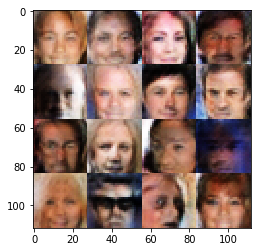

Timestamp 20170803-22-23-07.907 -  Epoch 1/1 -  Step 15210 -  D Loss: 0.9074 - G Loss: 0.7073
Timestamp 20170803-22-23-14.132 -  Epoch 1/1 -  Step 15220 -  D Loss: 1.0662 - G Loss: 1.6246
Timestamp 20170803-22-23-20.362 -  Epoch 1/1 -  Step 15230 -  D Loss: 0.7414 - G Loss: 1.2844
Timestamp 20170803-22-23-26.577 -  Epoch 1/1 -  Step 15240 -  D Loss: 0.9634 - G Loss: 1.1991
Timestamp 20170803-22-23-32.794 -  Epoch 1/1 -  Step 15250 -  D Loss: 1.2809 - G Loss: 1.1676
Timestamp 20170803-22-23-38.985 -  Epoch 1/1 -  Step 15260 -  D Loss: 0.8743 - G Loss: 0.9034
Timestamp 20170803-22-23-45.197 -  Epoch 1/1 -  Step 15270 -  D Loss: 1.0892 - G Loss: 0.9923
Timestamp 20170803-22-23-51.401 -  Epoch 1/1 -  Step 15280 -  D Loss: 0.9578 - G Loss: 1.0304
Timestamp 20170803-22-23-57.619 -  Epoch 1/1 -  Step 15290 -  D Loss: 0.6884 - G Loss: 1.7983
Timestamp 20170803-22-24-03.795 -  Epoch 1/1 -  Step 15300 -  D Loss: 1.1699 - G Loss: 1.0031


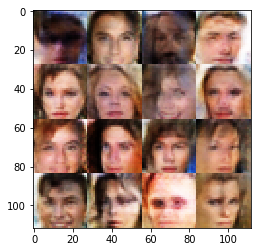

Timestamp 20170803-22-24-10.854 -  Epoch 1/1 -  Step 15310 -  D Loss: 0.9631 - G Loss: 1.1492
Timestamp 20170803-22-24-17.044 -  Epoch 1/1 -  Step 15320 -  D Loss: 1.1246 - G Loss: 1.1216
Timestamp 20170803-22-24-23.231 -  Epoch 1/1 -  Step 15330 -  D Loss: 1.1539 - G Loss: 0.9678
Timestamp 20170803-22-24-29.423 -  Epoch 1/1 -  Step 15340 -  D Loss: 0.9780 - G Loss: 1.4455
Timestamp 20170803-22-24-35.626 -  Epoch 1/1 -  Step 15350 -  D Loss: 0.8808 - G Loss: 2.2128
Timestamp 20170803-22-24-41.818 -  Epoch 1/1 -  Step 15360 -  D Loss: 0.8223 - G Loss: 1.0161
Timestamp 20170803-22-24-48.039 -  Epoch 1/1 -  Step 15370 -  D Loss: 0.9136 - G Loss: 0.9474
Timestamp 20170803-22-24-54.238 -  Epoch 1/1 -  Step 15380 -  D Loss: 1.0465 - G Loss: 1.1127
Timestamp 20170803-22-25-00.443 -  Epoch 1/1 -  Step 15390 -  D Loss: 1.2973 - G Loss: 1.8719
Timestamp 20170803-22-25-06.649 -  Epoch 1/1 -  Step 15400 -  D Loss: 1.0594 - G Loss: 0.8410


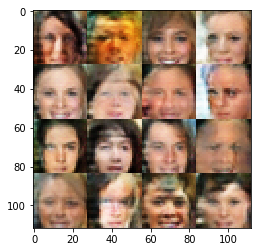

Timestamp 20170803-22-25-13.736 -  Epoch 1/1 -  Step 15410 -  D Loss: 0.9919 - G Loss: 1.5398
Timestamp 20170803-22-25-19.922 -  Epoch 1/1 -  Step 15420 -  D Loss: 1.1194 - G Loss: 0.9522
Timestamp 20170803-22-25-26.137 -  Epoch 1/1 -  Step 15430 -  D Loss: 1.1246 - G Loss: 0.4568
Timestamp 20170803-22-25-32.338 -  Epoch 1/1 -  Step 15440 -  D Loss: 1.2095 - G Loss: 0.9490
Timestamp 20170803-22-25-38.532 -  Epoch 1/1 -  Step 15450 -  D Loss: 1.1985 - G Loss: 0.9890
Timestamp 20170803-22-25-44.739 -  Epoch 1/1 -  Step 15460 -  D Loss: 1.1504 - G Loss: 1.5088
Timestamp 20170803-22-25-50.927 -  Epoch 1/1 -  Step 15470 -  D Loss: 1.1328 - G Loss: 1.2237
Timestamp 20170803-22-25-57.128 -  Epoch 1/1 -  Step 15480 -  D Loss: 0.8524 - G Loss: 1.4777
Timestamp 20170803-22-26-03.322 -  Epoch 1/1 -  Step 15490 -  D Loss: 1.0425 - G Loss: 0.9264
Timestamp 20170803-22-26-09.512 -  Epoch 1/1 -  Step 15500 -  D Loss: 1.0154 - G Loss: 1.1477


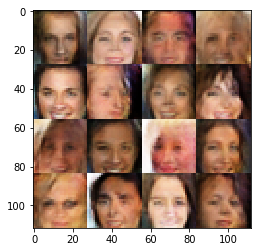

Timestamp 20170803-22-26-16.663 -  Epoch 1/1 -  Step 15510 -  D Loss: 1.1211 - G Loss: 1.4889
Timestamp 20170803-22-26-22.859 -  Epoch 1/1 -  Step 15520 -  D Loss: 0.9977 - G Loss: 1.1352
Timestamp 20170803-22-26-29.082 -  Epoch 1/1 -  Step 15530 -  D Loss: 1.2399 - G Loss: 0.8337
Timestamp 20170803-22-26-35.309 -  Epoch 1/1 -  Step 15540 -  D Loss: 0.7107 - G Loss: 2.2176
Timestamp 20170803-22-26-41.532 -  Epoch 1/1 -  Step 15550 -  D Loss: 1.0520 - G Loss: 1.0870
Timestamp 20170803-22-26-47.766 -  Epoch 1/1 -  Step 15560 -  D Loss: 0.6797 - G Loss: 1.7370
Timestamp 20170803-22-26-53.983 -  Epoch 1/1 -  Step 15570 -  D Loss: 1.0742 - G Loss: 1.2887
Timestamp 20170803-22-27-00.221 -  Epoch 1/1 -  Step 15580 -  D Loss: 0.7669 - G Loss: 0.9517
Timestamp 20170803-22-27-06.481 -  Epoch 1/1 -  Step 15590 -  D Loss: 0.8037 - G Loss: 1.1976
Timestamp 20170803-22-27-12.757 -  Epoch 1/1 -  Step 15600 -  D Loss: 1.2445 - G Loss: 0.8502


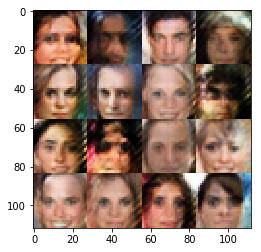

Timestamp 20170803-22-27-20.480 -  Epoch 1/1 -  Step 15610 -  D Loss: 1.1153 - G Loss: 0.8809
Timestamp 20170803-22-27-26.710 -  Epoch 1/1 -  Step 15620 -  D Loss: 0.8424 - G Loss: 1.6061
Timestamp 20170803-22-27-32.957 -  Epoch 1/1 -  Step 15630 -  D Loss: 1.0932 - G Loss: 0.9898
Timestamp 20170803-22-27-39.164 -  Epoch 1/1 -  Step 15640 -  D Loss: 1.0862 - G Loss: 1.3645
Timestamp 20170803-22-27-45.379 -  Epoch 1/1 -  Step 15650 -  D Loss: 0.7863 - G Loss: 1.9308
Timestamp 20170803-22-27-51.575 -  Epoch 1/1 -  Step 15660 -  D Loss: 0.8341 - G Loss: 2.2415
Timestamp 20170803-22-27-57.751 -  Epoch 1/1 -  Step 15670 -  D Loss: 1.7707 - G Loss: 1.0037
Timestamp 20170803-22-28-04.010 -  Epoch 1/1 -  Step 15680 -  D Loss: 1.0917 - G Loss: 1.7439
Timestamp 20170803-22-28-10.187 -  Epoch 1/1 -  Step 15690 -  D Loss: 0.8412 - G Loss: 1.3529
Timestamp 20170803-22-28-16.386 -  Epoch 1/1 -  Step 15700 -  D Loss: 1.1685 - G Loss: 0.7296


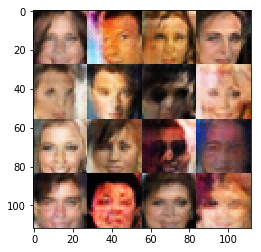

Timestamp 20170803-22-28-23.497 -  Epoch 1/1 -  Step 15710 -  D Loss: 1.0901 - G Loss: 0.8613
Timestamp 20170803-22-28-29.757 -  Epoch 1/1 -  Step 15720 -  D Loss: 1.6333 - G Loss: 0.4404
Timestamp 20170803-22-28-35.934 -  Epoch 1/1 -  Step 15730 -  D Loss: 1.1479 - G Loss: 1.1289
Timestamp 20170803-22-28-42.164 -  Epoch 1/1 -  Step 15740 -  D Loss: 0.8732 - G Loss: 1.6153
Timestamp 20170803-22-28-48.355 -  Epoch 1/1 -  Step 15750 -  D Loss: 1.0369 - G Loss: 0.8368
Timestamp 20170803-22-28-54.570 -  Epoch 1/1 -  Step 15760 -  D Loss: 1.2479 - G Loss: 0.6796
Timestamp 20170803-22-29-00.784 -  Epoch 1/1 -  Step 15770 -  D Loss: 1.1953 - G Loss: 0.6684
Timestamp 20170803-22-29-07.008 -  Epoch 1/1 -  Step 15780 -  D Loss: 1.1781 - G Loss: 1.0972
Timestamp 20170803-22-29-13.229 -  Epoch 1/1 -  Step 15790 -  D Loss: 1.1525 - G Loss: 0.6293
Timestamp 20170803-22-29-19.432 -  Epoch 1/1 -  Step 15800 -  D Loss: 1.0076 - G Loss: 1.3541


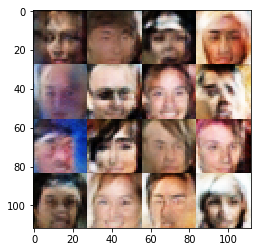

Timestamp 20170803-22-29-26.542 -  Epoch 1/1 -  Step 15810 -  D Loss: 0.7964 - G Loss: 1.9682
Timestamp 20170803-22-29-32.728 -  Epoch 1/1 -  Step 15820 -  D Loss: 0.6850 - G Loss: 1.8034
Timestamp 20170803-22-29-38.914 -  Epoch 1/1 -  Step 15830 -  D Loss: 1.1952 - G Loss: 0.8617
Timestamp 20170803-22-29-45.121 -  Epoch 1/1 -  Step 15840 -  D Loss: 1.0528 - G Loss: 1.5886
Timestamp 20170803-22-29-51.306 -  Epoch 1/1 -  Step 15850 -  D Loss: 0.6807 - G Loss: 2.0164
Timestamp 20170803-22-29-57.473 -  Epoch 1/1 -  Step 15860 -  D Loss: 0.9126 - G Loss: 1.5709
Timestamp 20170803-22-30-04.967 -  Epoch 1/1 -  Step 15870 -  D Loss: 1.3889 - G Loss: 0.9793
Timestamp 20170803-22-30-16.206 -  Epoch 1/1 -  Step 15880 -  D Loss: 1.0045 - G Loss: 0.9590
Timestamp 20170803-22-30-27.221 -  Epoch 1/1 -  Step 15890 -  D Loss: 1.0157 - G Loss: 1.2808
Timestamp 20170803-22-30-36.719 -  Epoch 1/1 -  Step 15900 -  D Loss: 0.8712 - G Loss: 1.1804


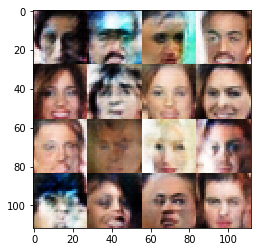

Timestamp 20170803-22-30-43.763 -  Epoch 1/1 -  Step 15910 -  D Loss: 0.8628 - G Loss: 1.3669
Timestamp 20170803-22-30-49.935 -  Epoch 1/1 -  Step 15920 -  D Loss: 0.9269 - G Loss: 1.2169
Timestamp 20170803-22-30-56.142 -  Epoch 1/1 -  Step 15930 -  D Loss: 1.0158 - G Loss: 1.3512
Timestamp 20170803-22-31-02.329 -  Epoch 1/1 -  Step 15940 -  D Loss: 0.8937 - G Loss: 1.1436
Timestamp 20170803-22-31-08.513 -  Epoch 1/1 -  Step 15950 -  D Loss: 1.0214 - G Loss: 1.4823
Timestamp 20170803-22-31-14.697 -  Epoch 1/1 -  Step 15960 -  D Loss: 1.0695 - G Loss: 1.2606
Timestamp 20170803-22-31-20.894 -  Epoch 1/1 -  Step 15970 -  D Loss: 0.9600 - G Loss: 1.0766
Timestamp 20170803-22-31-27.091 -  Epoch 1/1 -  Step 15980 -  D Loss: 1.3079 - G Loss: 0.8870
Timestamp 20170803-22-31-33.291 -  Epoch 1/1 -  Step 15990 -  D Loss: 1.3289 - G Loss: 1.2484
Timestamp 20170803-22-31-39.479 -  Epoch 1/1 -  Step 16000 -  D Loss: 0.9403 - G Loss: 1.0832


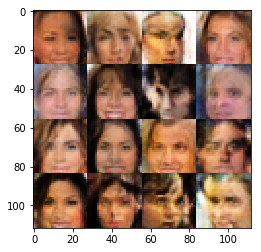

Timestamp 20170803-22-31-46.670 -  Epoch 1/1 -  Step 16010 -  D Loss: 0.9305 - G Loss: 1.4800
Timestamp 20170803-22-31-52.891 -  Epoch 1/1 -  Step 16020 -  D Loss: 1.0037 - G Loss: 1.2316
Timestamp 20170803-22-31-59.108 -  Epoch 1/1 -  Step 16030 -  D Loss: 1.3563 - G Loss: 1.2690
Timestamp 20170803-22-32-05.300 -  Epoch 1/1 -  Step 16040 -  D Loss: 1.0356 - G Loss: 1.2128
Timestamp 20170803-22-32-11.512 -  Epoch 1/1 -  Step 16050 -  D Loss: 0.8679 - G Loss: 1.7267
Timestamp 20170803-22-32-17.715 -  Epoch 1/1 -  Step 16060 -  D Loss: 1.2529 - G Loss: 0.8055
Timestamp 20170803-22-32-23.903 -  Epoch 1/1 -  Step 16070 -  D Loss: 0.8690 - G Loss: 1.4753
Timestamp 20170803-22-32-30.081 -  Epoch 1/1 -  Step 16080 -  D Loss: 1.4229 - G Loss: 1.1256
Timestamp 20170803-22-32-36.290 -  Epoch 1/1 -  Step 16090 -  D Loss: 1.2303 - G Loss: 1.1014
Timestamp 20170803-22-32-42.488 -  Epoch 1/1 -  Step 16100 -  D Loss: 0.8647 - G Loss: 1.0523


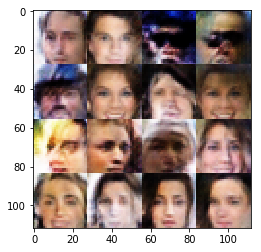

Timestamp 20170803-22-32-50.191 -  Epoch 1/1 -  Step 16110 -  D Loss: 1.3636 - G Loss: 0.8862
Timestamp 20170803-22-32-56.447 -  Epoch 1/1 -  Step 16120 -  D Loss: 0.8977 - G Loss: 0.8542
Timestamp 20170803-22-33-02.677 -  Epoch 1/1 -  Step 16130 -  D Loss: 0.9579 - G Loss: 1.1904
Timestamp 20170803-22-33-08.879 -  Epoch 1/1 -  Step 16140 -  D Loss: 1.1018 - G Loss: 1.9173
Timestamp 20170803-22-33-15.103 -  Epoch 1/1 -  Step 16150 -  D Loss: 1.0066 - G Loss: 1.2845
Timestamp 20170803-22-33-21.299 -  Epoch 1/1 -  Step 16160 -  D Loss: 1.1640 - G Loss: 0.9294
Timestamp 20170803-22-33-27.495 -  Epoch 1/1 -  Step 16170 -  D Loss: 0.9623 - G Loss: 1.0637
Timestamp 20170803-22-33-33.696 -  Epoch 1/1 -  Step 16180 -  D Loss: 1.0684 - G Loss: 1.0458
Timestamp 20170803-22-33-39.914 -  Epoch 1/1 -  Step 16190 -  D Loss: 1.0256 - G Loss: 1.3305
Timestamp 20170803-22-33-46.119 -  Epoch 1/1 -  Step 16200 -  D Loss: 1.2045 - G Loss: 1.1215


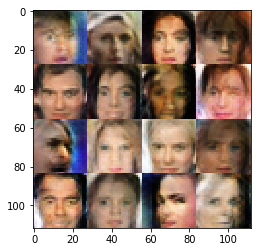

Timestamp 20170803-22-33-53.309 -  Epoch 1/1 -  Step 16210 -  D Loss: 0.7948 - G Loss: 1.4324
Timestamp 20170803-22-33-59.535 -  Epoch 1/1 -  Step 16220 -  D Loss: 1.0333 - G Loss: 1.3326
Timestamp 20170803-22-34-05.721 -  Epoch 1/1 -  Step 16230 -  D Loss: 1.4098 - G Loss: 0.6735
Timestamp 20170803-22-34-11.911 -  Epoch 1/1 -  Step 16240 -  D Loss: 1.4250 - G Loss: 1.1736
Timestamp 20170803-22-34-18.137 -  Epoch 1/1 -  Step 16250 -  D Loss: 1.0121 - G Loss: 1.1969
Timestamp 20170803-22-34-24.330 -  Epoch 1/1 -  Step 16260 -  D Loss: 0.8822 - G Loss: 1.4033
Timestamp 20170803-22-34-30.511 -  Epoch 1/1 -  Step 16270 -  D Loss: 1.1211 - G Loss: 1.2897
Timestamp 20170803-22-34-36.691 -  Epoch 1/1 -  Step 16280 -  D Loss: 0.9998 - G Loss: 0.7391
Timestamp 20170803-22-34-42.899 -  Epoch 1/1 -  Step 16290 -  D Loss: 0.8773 - G Loss: 1.1572
Timestamp 20170803-22-34-49.088 -  Epoch 1/1 -  Step 16300 -  D Loss: 0.9254 - G Loss: 1.2263


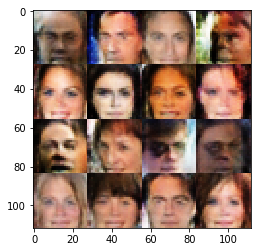

Timestamp 20170803-22-34-56.160 -  Epoch 1/1 -  Step 16310 -  D Loss: 1.2067 - G Loss: 1.0272
Timestamp 20170803-22-35-02.334 -  Epoch 1/1 -  Step 16320 -  D Loss: 1.3352 - G Loss: 1.2705
Timestamp 20170803-22-35-08.514 -  Epoch 1/1 -  Step 16330 -  D Loss: 1.1567 - G Loss: 1.0209
Timestamp 20170803-22-35-14.716 -  Epoch 1/1 -  Step 16340 -  D Loss: 1.3071 - G Loss: 0.7665
Timestamp 20170803-22-35-20.921 -  Epoch 1/1 -  Step 16350 -  D Loss: 1.0417 - G Loss: 1.6143
Timestamp 20170803-22-35-27.119 -  Epoch 1/1 -  Step 16360 -  D Loss: 1.0148 - G Loss: 1.6949
Timestamp 20170803-22-35-33.336 -  Epoch 1/1 -  Step 16370 -  D Loss: 1.7057 - G Loss: 0.8409
Timestamp 20170803-22-35-39.545 -  Epoch 1/1 -  Step 16380 -  D Loss: 0.9139 - G Loss: 1.6504
Timestamp 20170803-22-35-45.728 -  Epoch 1/1 -  Step 16390 -  D Loss: 1.1787 - G Loss: 1.2596
Timestamp 20170803-22-35-51.930 -  Epoch 1/1 -  Step 16400 -  D Loss: 1.1610 - G Loss: 1.0210


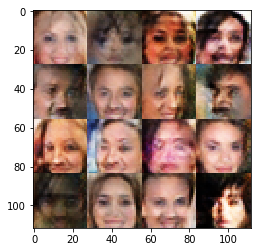

Timestamp 20170803-22-35-58.980 -  Epoch 1/1 -  Step 16410 -  D Loss: 1.0464 - G Loss: 1.4198
Timestamp 20170803-22-36-05.191 -  Epoch 1/1 -  Step 16420 -  D Loss: 1.0741 - G Loss: 0.6206
Timestamp 20170803-22-36-11.349 -  Epoch 1/1 -  Step 16430 -  D Loss: 0.9796 - G Loss: 1.1543
Timestamp 20170803-22-36-17.545 -  Epoch 1/1 -  Step 16440 -  D Loss: 1.0094 - G Loss: 0.9041
Timestamp 20170803-22-36-23.738 -  Epoch 1/1 -  Step 16450 -  D Loss: 0.8452 - G Loss: 0.8686
Timestamp 20170803-22-36-29.908 -  Epoch 1/1 -  Step 16460 -  D Loss: 1.1374 - G Loss: 0.6746
Timestamp 20170803-22-36-36.108 -  Epoch 1/1 -  Step 16470 -  D Loss: 1.0590 - G Loss: 1.0425
Timestamp 20170803-22-36-43.149 -  Epoch 1/1 -  Step 16480 -  D Loss: 1.1504 - G Loss: 0.9183
Timestamp 20170803-22-36-49.323 -  Epoch 1/1 -  Step 16490 -  D Loss: 1.0847 - G Loss: 1.1305
Timestamp 20170803-22-36-55.518 -  Epoch 1/1 -  Step 16500 -  D Loss: 1.0652 - G Loss: 1.1724


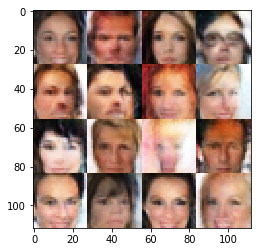

Timestamp 20170803-22-37-02.670 -  Epoch 1/1 -  Step 16510 -  D Loss: 1.0599 - G Loss: 1.0221
Timestamp 20170803-22-37-08.868 -  Epoch 1/1 -  Step 16520 -  D Loss: 1.0244 - G Loss: 1.1015
Timestamp 20170803-22-37-15.056 -  Epoch 1/1 -  Step 16530 -  D Loss: 1.3138 - G Loss: 0.8382
Timestamp 20170803-22-37-21.226 -  Epoch 1/1 -  Step 16540 -  D Loss: 1.0070 - G Loss: 0.9195
Timestamp 20170803-22-37-27.476 -  Epoch 1/1 -  Step 16550 -  D Loss: 1.0857 - G Loss: 0.7483
Timestamp 20170803-22-37-33.678 -  Epoch 1/1 -  Step 16560 -  D Loss: 0.8066 - G Loss: 1.2070
Timestamp 20170803-22-37-39.893 -  Epoch 1/1 -  Step 16570 -  D Loss: 1.2574 - G Loss: 1.1316
Timestamp 20170803-22-37-46.112 -  Epoch 1/1 -  Step 16580 -  D Loss: 0.8839 - G Loss: 1.2963
Timestamp 20170803-22-37-52.329 -  Epoch 1/1 -  Step 16590 -  D Loss: 1.3604 - G Loss: 1.2763
Timestamp 20170803-22-37-58.527 -  Epoch 1/1 -  Step 16600 -  D Loss: 0.9213 - G Loss: 1.2862


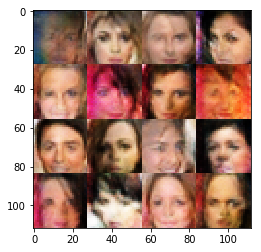

Timestamp 20170803-22-38-05.863 -  Epoch 1/1 -  Step 16610 -  D Loss: 0.7990 - G Loss: 1.4141
Timestamp 20170803-22-38-12.080 -  Epoch 1/1 -  Step 16620 -  D Loss: 0.9691 - G Loss: 1.1445
Timestamp 20170803-22-38-18.282 -  Epoch 1/1 -  Step 16630 -  D Loss: 0.9808 - G Loss: 1.3681
Timestamp 20170803-22-38-24.488 -  Epoch 1/1 -  Step 16640 -  D Loss: 1.0655 - G Loss: 0.8123
Timestamp 20170803-22-38-30.684 -  Epoch 1/1 -  Step 16650 -  D Loss: 1.3238 - G Loss: 0.8894
Timestamp 20170803-22-38-36.874 -  Epoch 1/1 -  Step 16660 -  D Loss: 0.9889 - G Loss: 1.1503
Timestamp 20170803-22-38-43.065 -  Epoch 1/1 -  Step 16670 -  D Loss: 1.0240 - G Loss: 1.5975
Timestamp 20170803-22-38-49.260 -  Epoch 1/1 -  Step 16680 -  D Loss: 1.1494 - G Loss: 1.0642
Timestamp 20170803-22-38-55.460 -  Epoch 1/1 -  Step 16690 -  D Loss: 1.4368 - G Loss: 0.8567
Timestamp 20170803-22-39-01.665 -  Epoch 1/1 -  Step 16700 -  D Loss: 0.7127 - G Loss: 1.1425


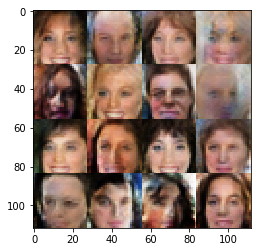

Timestamp 20170803-22-39-08.776 -  Epoch 1/1 -  Step 16710 -  D Loss: 1.9737 - G Loss: 1.1638
Timestamp 20170803-22-39-14.952 -  Epoch 1/1 -  Step 16720 -  D Loss: 1.3677 - G Loss: 1.3465
Timestamp 20170803-22-39-21.165 -  Epoch 1/1 -  Step 16730 -  D Loss: 1.0800 - G Loss: 1.1172
Timestamp 20170803-22-39-27.358 -  Epoch 1/1 -  Step 16740 -  D Loss: 1.6266 - G Loss: 0.8246
Timestamp 20170803-22-39-33.533 -  Epoch 1/1 -  Step 16750 -  D Loss: 0.8995 - G Loss: 1.2031
Timestamp 20170803-22-39-39.739 -  Epoch 1/1 -  Step 16760 -  D Loss: 0.8192 - G Loss: 1.7108
Timestamp 20170803-22-39-45.936 -  Epoch 1/1 -  Step 16770 -  D Loss: 1.0759 - G Loss: 0.9922
Timestamp 20170803-22-39-52.123 -  Epoch 1/1 -  Step 16780 -  D Loss: 1.0467 - G Loss: 0.9513
Timestamp 20170803-22-39-58.316 -  Epoch 1/1 -  Step 16790 -  D Loss: 0.9652 - G Loss: 0.9541
Timestamp 20170803-22-40-04.481 -  Epoch 1/1 -  Step 16800 -  D Loss: 1.0109 - G Loss: 1.2583


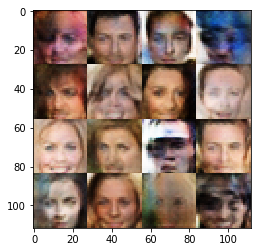

Timestamp 20170803-22-40-11.572 -  Epoch 1/1 -  Step 16810 -  D Loss: 1.1627 - G Loss: 1.5080
Timestamp 20170803-22-40-17.783 -  Epoch 1/1 -  Step 16820 -  D Loss: 1.2847 - G Loss: 1.0871
Timestamp 20170803-22-40-23.969 -  Epoch 1/1 -  Step 16830 -  D Loss: 1.4214 - G Loss: 1.4816
Timestamp 20170803-22-40-30.140 -  Epoch 1/1 -  Step 16840 -  D Loss: 0.8777 - G Loss: 1.2487
Timestamp 20170803-22-40-36.358 -  Epoch 1/1 -  Step 16850 -  D Loss: 0.9794 - G Loss: 1.4984
Timestamp 20170803-22-40-42.545 -  Epoch 1/1 -  Step 16860 -  D Loss: 1.0978 - G Loss: 0.7016
Timestamp 20170803-22-40-48.741 -  Epoch 1/1 -  Step 16870 -  D Loss: 1.0789 - G Loss: 1.0459
Timestamp 20170803-22-40-54.924 -  Epoch 1/1 -  Step 16880 -  D Loss: 1.0558 - G Loss: 1.0362
Timestamp 20170803-22-41-01.113 -  Epoch 1/1 -  Step 16890 -  D Loss: 0.9018 - G Loss: 1.9176
Timestamp 20170803-22-41-07.304 -  Epoch 1/1 -  Step 16900 -  D Loss: 1.0680 - G Loss: 1.1273


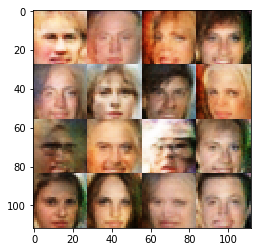

Timestamp 20170803-22-41-14.369 -  Epoch 1/1 -  Step 16910 -  D Loss: 0.8733 - G Loss: 1.8054
Timestamp 20170803-22-41-20.547 -  Epoch 1/1 -  Step 16920 -  D Loss: 1.1557 - G Loss: 0.6951
Timestamp 20170803-22-41-26.739 -  Epoch 1/1 -  Step 16930 -  D Loss: 0.9781 - G Loss: 1.1878
Timestamp 20170803-22-41-32.941 -  Epoch 1/1 -  Step 16940 -  D Loss: 1.1752 - G Loss: 0.9326
Timestamp 20170803-22-41-39.158 -  Epoch 1/1 -  Step 16950 -  D Loss: 1.1458 - G Loss: 1.0590
Timestamp 20170803-22-41-45.358 -  Epoch 1/1 -  Step 16960 -  D Loss: 1.2006 - G Loss: 1.0627
Timestamp 20170803-22-41-51.552 -  Epoch 1/1 -  Step 16970 -  D Loss: 0.9091 - G Loss: 1.1531
Timestamp 20170803-22-41-57.731 -  Epoch 1/1 -  Step 16980 -  D Loss: 0.9585 - G Loss: 0.9561
Timestamp 20170803-22-42-03.923 -  Epoch 1/1 -  Step 16990 -  D Loss: 0.9149 - G Loss: 1.5027
Timestamp 20170803-22-42-10.102 -  Epoch 1/1 -  Step 17000 -  D Loss: 0.8113 - G Loss: 1.9018


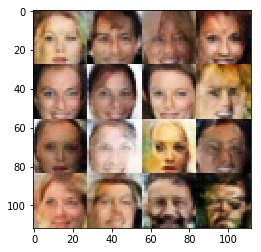

Timestamp 20170803-22-42-17.182 -  Epoch 1/1 -  Step 17010 -  D Loss: 1.1133 - G Loss: 1.0827
Timestamp 20170803-22-42-23.384 -  Epoch 1/1 -  Step 17020 -  D Loss: 1.1285 - G Loss: 1.3019
Timestamp 20170803-22-42-29.590 -  Epoch 1/1 -  Step 17030 -  D Loss: 1.0464 - G Loss: 1.1434
Timestamp 20170803-22-42-35.764 -  Epoch 1/1 -  Step 17040 -  D Loss: 1.4553 - G Loss: 1.3050
Timestamp 20170803-22-42-41.976 -  Epoch 1/1 -  Step 17050 -  D Loss: 1.1513 - G Loss: 1.4422
Timestamp 20170803-22-42-48.164 -  Epoch 1/1 -  Step 17060 -  D Loss: 0.9349 - G Loss: 1.0618
Timestamp 20170803-22-42-54.361 -  Epoch 1/1 -  Step 17070 -  D Loss: 0.8736 - G Loss: 1.0577
Timestamp 20170803-22-43-00.559 -  Epoch 1/1 -  Step 17080 -  D Loss: 1.2376 - G Loss: 0.8191
Timestamp 20170803-22-43-06.759 -  Epoch 1/1 -  Step 17090 -  D Loss: 0.9500 - G Loss: 1.0685
Timestamp 20170803-22-43-12.942 -  Epoch 1/1 -  Step 17100 -  D Loss: 1.2790 - G Loss: 0.6963


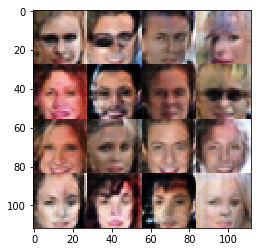

Timestamp 20170803-22-43-19.985 -  Epoch 1/1 -  Step 17110 -  D Loss: 1.0027 - G Loss: 1.5255
Timestamp 20170803-22-43-26.181 -  Epoch 1/1 -  Step 17120 -  D Loss: 1.0897 - G Loss: 1.1560
Timestamp 20170803-22-43-32.372 -  Epoch 1/1 -  Step 17130 -  D Loss: 0.8593 - G Loss: 1.1309
Timestamp 20170803-22-43-38.587 -  Epoch 1/1 -  Step 17140 -  D Loss: 1.1254 - G Loss: 0.8744
Timestamp 20170803-22-43-44.786 -  Epoch 1/1 -  Step 17150 -  D Loss: 1.1975 - G Loss: 0.8832
Timestamp 20170803-22-43-50.964 -  Epoch 1/1 -  Step 17160 -  D Loss: 1.0454 - G Loss: 0.9123
Timestamp 20170803-22-43-57.185 -  Epoch 1/1 -  Step 17170 -  D Loss: 0.8936 - G Loss: 1.3211
Timestamp 20170803-22-44-03.387 -  Epoch 1/1 -  Step 17180 -  D Loss: 1.1710 - G Loss: 0.8034
Timestamp 20170803-22-44-09.565 -  Epoch 1/1 -  Step 17190 -  D Loss: 0.9041 - G Loss: 1.1556
Timestamp 20170803-22-44-15.757 -  Epoch 1/1 -  Step 17200 -  D Loss: 1.1041 - G Loss: 1.4390


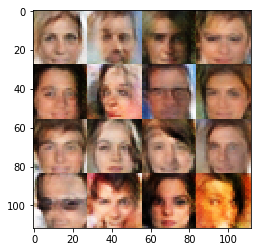

Timestamp 20170803-22-44-22.861 -  Epoch 1/1 -  Step 17210 -  D Loss: 0.8904 - G Loss: 1.1200
Timestamp 20170803-22-44-29.074 -  Epoch 1/1 -  Step 17220 -  D Loss: 1.2539 - G Loss: 0.5822
Timestamp 20170803-22-44-35.263 -  Epoch 1/1 -  Step 17230 -  D Loss: 1.2180 - G Loss: 1.2016
Timestamp 20170803-22-44-41.443 -  Epoch 1/1 -  Step 17240 -  D Loss: 1.2528 - G Loss: 1.5488
Timestamp 20170803-22-44-47.648 -  Epoch 1/1 -  Step 17250 -  D Loss: 0.9301 - G Loss: 1.2848
Timestamp 20170803-22-44-53.832 -  Epoch 1/1 -  Step 17260 -  D Loss: 1.2305 - G Loss: 1.0721
Timestamp 20170803-22-45-00.020 -  Epoch 1/1 -  Step 17270 -  D Loss: 0.7340 - G Loss: 1.1227
Timestamp 20170803-22-45-06.203 -  Epoch 1/1 -  Step 17280 -  D Loss: 1.1082 - G Loss: 1.5267
Timestamp 20170803-22-45-12.395 -  Epoch 1/1 -  Step 17290 -  D Loss: 1.0767 - G Loss: 1.1988
Timestamp 20170803-22-45-18.595 -  Epoch 1/1 -  Step 17300 -  D Loss: 1.1673 - G Loss: 0.8358


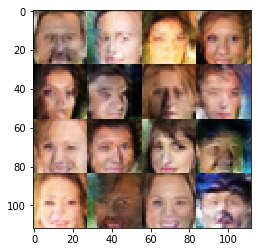

Timestamp 20170803-22-45-25.686 -  Epoch 1/1 -  Step 17310 -  D Loss: 1.3489 - G Loss: 0.5936
Timestamp 20170803-22-45-31.895 -  Epoch 1/1 -  Step 17320 -  D Loss: 0.9726 - G Loss: 0.9590
Timestamp 20170803-22-45-38.093 -  Epoch 1/1 -  Step 17330 -  D Loss: 1.0272 - G Loss: 1.4052
Timestamp 20170803-22-45-44.266 -  Epoch 1/1 -  Step 17340 -  D Loss: 1.2682 - G Loss: 1.2693
Timestamp 20170803-22-45-50.459 -  Epoch 1/1 -  Step 17350 -  D Loss: 1.2663 - G Loss: 0.7194
Timestamp 20170803-22-45-56.650 -  Epoch 1/1 -  Step 17360 -  D Loss: 1.5137 - G Loss: 1.1231
Timestamp 20170803-22-46-02.852 -  Epoch 1/1 -  Step 17370 -  D Loss: 0.8871 - G Loss: 1.8866
Timestamp 20170803-22-46-09.070 -  Epoch 1/1 -  Step 17380 -  D Loss: 0.9466 - G Loss: 1.5363
Timestamp 20170803-22-46-15.257 -  Epoch 1/1 -  Step 17390 -  D Loss: 1.2068 - G Loss: 1.3608
Timestamp 20170803-22-46-21.459 -  Epoch 1/1 -  Step 17400 -  D Loss: 0.9651 - G Loss: 1.4246


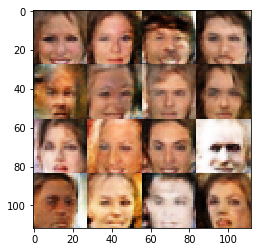

Timestamp 20170803-22-46-28.533 -  Epoch 1/1 -  Step 17410 -  D Loss: 0.9855 - G Loss: 0.9403
Timestamp 20170803-22-46-34.715 -  Epoch 1/1 -  Step 17420 -  D Loss: 1.1716 - G Loss: 1.3081
Timestamp 20170803-22-46-40.905 -  Epoch 1/1 -  Step 17430 -  D Loss: 1.0761 - G Loss: 1.1559
Timestamp 20170803-22-46-47.082 -  Epoch 1/1 -  Step 17440 -  D Loss: 0.8729 - G Loss: 1.0423
Timestamp 20170803-22-46-53.299 -  Epoch 1/1 -  Step 17450 -  D Loss: 1.0997 - G Loss: 0.9403
Timestamp 20170803-22-46-59.501 -  Epoch 1/1 -  Step 17460 -  D Loss: 1.0318 - G Loss: 0.8436
Timestamp 20170803-22-47-05.683 -  Epoch 1/1 -  Step 17470 -  D Loss: 1.0980 - G Loss: 1.4925
Timestamp 20170803-22-47-11.863 -  Epoch 1/1 -  Step 17480 -  D Loss: 1.1123 - G Loss: 1.4460
Timestamp 20170803-22-47-18.051 -  Epoch 1/1 -  Step 17490 -  D Loss: 0.8341 - G Loss: 1.2570
Timestamp 20170803-22-47-24.271 -  Epoch 1/1 -  Step 17500 -  D Loss: 0.9322 - G Loss: 1.5968


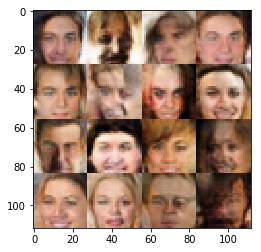

Timestamp 20170803-22-47-31.344 -  Epoch 1/1 -  Step 17510 -  D Loss: 1.0331 - G Loss: 1.6321
Timestamp 20170803-22-47-37.544 -  Epoch 1/1 -  Step 17520 -  D Loss: 0.8128 - G Loss: 1.0329
Timestamp 20170803-22-47-43.769 -  Epoch 1/1 -  Step 17530 -  D Loss: 1.9288 - G Loss: 0.6265
Timestamp 20170803-22-47-49.962 -  Epoch 1/1 -  Step 17540 -  D Loss: 1.3297 - G Loss: 1.4323
Timestamp 20170803-22-47-56.178 -  Epoch 1/1 -  Step 17550 -  D Loss: 1.0717 - G Loss: 0.9335
Timestamp 20170803-22-48-02.366 -  Epoch 1/1 -  Step 17560 -  D Loss: 1.0395 - G Loss: 1.4287
Timestamp 20170803-22-48-08.546 -  Epoch 1/1 -  Step 17570 -  D Loss: 1.3964 - G Loss: 0.6842
Timestamp 20170803-22-48-14.706 -  Epoch 1/1 -  Step 17580 -  D Loss: 1.2780 - G Loss: 1.3800
Timestamp 20170803-22-48-20.949 -  Epoch 1/1 -  Step 17590 -  D Loss: 0.8711 - G Loss: 1.0742
Timestamp 20170803-22-48-27.131 -  Epoch 1/1 -  Step 17600 -  D Loss: 0.9083 - G Loss: 1.1690


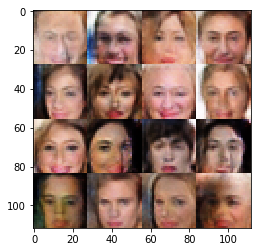

Timestamp 20170803-22-48-34.227 -  Epoch 1/1 -  Step 17610 -  D Loss: 1.6916 - G Loss: 1.0074
Timestamp 20170803-22-48-40.397 -  Epoch 1/1 -  Step 17620 -  D Loss: 0.7951 - G Loss: 1.4323
Timestamp 20170803-22-48-46.573 -  Epoch 1/1 -  Step 17630 -  D Loss: 1.1715 - G Loss: 1.2743
Timestamp 20170803-22-48-52.767 -  Epoch 1/1 -  Step 17640 -  D Loss: 1.1542 - G Loss: 1.5696
Timestamp 20170803-22-48-58.953 -  Epoch 1/1 -  Step 17650 -  D Loss: 0.7923 - G Loss: 0.8754
Timestamp 20170803-22-49-05.137 -  Epoch 1/1 -  Step 17660 -  D Loss: 0.9748 - G Loss: 1.0389
Timestamp 20170803-22-49-11.332 -  Epoch 1/1 -  Step 17670 -  D Loss: 1.0654 - G Loss: 0.9272
Timestamp 20170803-22-49-17.505 -  Epoch 1/1 -  Step 17680 -  D Loss: 1.1918 - G Loss: 1.6502
Timestamp 20170803-22-49-23.694 -  Epoch 1/1 -  Step 17690 -  D Loss: 1.0578 - G Loss: 1.0294
Timestamp 20170803-22-49-29.878 -  Epoch 1/1 -  Step 17700 -  D Loss: 1.2504 - G Loss: 1.1579


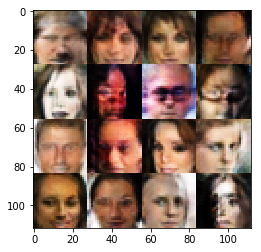

Timestamp 20170803-22-49-36.981 -  Epoch 1/1 -  Step 17710 -  D Loss: 0.9357 - G Loss: 1.2513
Timestamp 20170803-22-49-43.175 -  Epoch 1/1 -  Step 17720 -  D Loss: 1.3614 - G Loss: 0.5911
Timestamp 20170803-22-49-49.402 -  Epoch 1/1 -  Step 17730 -  D Loss: 1.2582 - G Loss: 0.8714
Timestamp 20170803-22-49-55.633 -  Epoch 1/1 -  Step 17740 -  D Loss: 0.7862 - G Loss: 1.2603
Timestamp 20170803-22-50-01.823 -  Epoch 1/1 -  Step 17750 -  D Loss: 1.0737 - G Loss: 0.6935
Timestamp 20170803-22-50-07.987 -  Epoch 1/1 -  Step 17760 -  D Loss: 1.3663 - G Loss: 1.2704
Timestamp 20170803-22-50-14.179 -  Epoch 1/1 -  Step 17770 -  D Loss: 1.1655 - G Loss: 1.1804
Timestamp 20170803-22-50-20.359 -  Epoch 1/1 -  Step 17780 -  D Loss: 1.2361 - G Loss: 1.3299
Timestamp 20170803-22-50-26.537 -  Epoch 1/1 -  Step 17790 -  D Loss: 1.1880 - G Loss: 0.9041
Timestamp 20170803-22-50-32.715 -  Epoch 1/1 -  Step 17800 -  D Loss: 1.3259 - G Loss: 0.5601


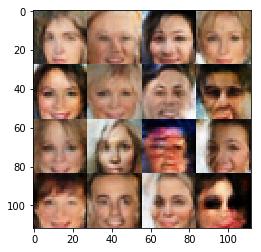

Timestamp 20170803-22-50-39.774 -  Epoch 1/1 -  Step 17810 -  D Loss: 1.1002 - G Loss: 0.8532
Timestamp 20170803-22-50-45.939 -  Epoch 1/1 -  Step 17820 -  D Loss: 1.1404 - G Loss: 0.8272
Timestamp 20170803-22-50-52.119 -  Epoch 1/1 -  Step 17830 -  D Loss: 1.0563 - G Loss: 1.2633
Timestamp 20170803-22-50-58.311 -  Epoch 1/1 -  Step 17840 -  D Loss: 0.9595 - G Loss: 1.2398
Timestamp 20170803-22-51-04.490 -  Epoch 1/1 -  Step 17850 -  D Loss: 0.9458 - G Loss: 0.9268
Timestamp 20170803-22-51-10.667 -  Epoch 1/1 -  Step 17860 -  D Loss: 1.0010 - G Loss: 0.9786
Timestamp 20170803-22-51-16.862 -  Epoch 1/1 -  Step 17870 -  D Loss: 1.2227 - G Loss: 0.9928
Timestamp 20170803-22-51-23.047 -  Epoch 1/1 -  Step 17880 -  D Loss: 1.0803 - G Loss: 0.6443
Timestamp 20170803-22-51-29.242 -  Epoch 1/1 -  Step 17890 -  D Loss: 0.9495 - G Loss: 1.2147
Timestamp 20170803-22-51-35.449 -  Epoch 1/1 -  Step 17900 -  D Loss: 0.7933 - G Loss: 1.0530


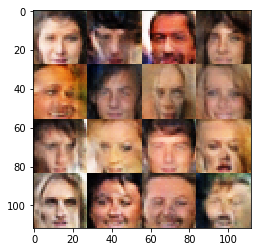

Timestamp 20170803-22-51-42.554 -  Epoch 1/1 -  Step 17910 -  D Loss: 1.0032 - G Loss: 1.8211
Timestamp 20170803-22-51-48.786 -  Epoch 1/1 -  Step 17920 -  D Loss: 1.2728 - G Loss: 1.7045
Timestamp 20170803-22-51-54.963 -  Epoch 1/1 -  Step 17930 -  D Loss: 0.9561 - G Loss: 1.3843
Timestamp 20170803-22-52-01.149 -  Epoch 1/1 -  Step 17940 -  D Loss: 1.1452 - G Loss: 0.7339
Timestamp 20170803-22-52-07.327 -  Epoch 1/1 -  Step 17950 -  D Loss: 0.9885 - G Loss: 1.2788
Timestamp 20170803-22-52-13.495 -  Epoch 1/1 -  Step 17960 -  D Loss: 1.1975 - G Loss: 0.8220
Timestamp 20170803-22-52-19.666 -  Epoch 1/1 -  Step 17970 -  D Loss: 0.6078 - G Loss: 1.4581
Timestamp 20170803-22-52-25.864 -  Epoch 1/1 -  Step 17980 -  D Loss: 0.9713 - G Loss: 1.5199
Timestamp 20170803-22-52-32.043 -  Epoch 1/1 -  Step 17990 -  D Loss: 1.2498 - G Loss: 1.5563
Timestamp 20170803-22-52-38.217 -  Epoch 1/1 -  Step 18000 -  D Loss: 0.9560 - G Loss: 0.9216


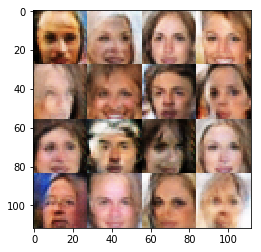

Timestamp 20170803-22-52-45.392 -  Epoch 1/1 -  Step 18010 -  D Loss: 0.6304 - G Loss: 1.2380
Timestamp 20170803-22-52-51.604 -  Epoch 1/1 -  Step 18020 -  D Loss: 0.9671 - G Loss: 1.1861
Timestamp 20170803-22-52-57.796 -  Epoch 1/1 -  Step 18030 -  D Loss: 1.4406 - G Loss: 1.3425
Timestamp 20170803-22-53-03.973 -  Epoch 1/1 -  Step 18040 -  D Loss: 0.8080 - G Loss: 1.2037
Timestamp 20170803-22-53-10.164 -  Epoch 1/1 -  Step 18050 -  D Loss: 0.9775 - G Loss: 1.1527
Timestamp 20170803-22-53-16.354 -  Epoch 1/1 -  Step 18060 -  D Loss: 0.9100 - G Loss: 0.9182
Timestamp 20170803-22-53-22.537 -  Epoch 1/1 -  Step 18070 -  D Loss: 1.0734 - G Loss: 1.2931
Timestamp 20170803-22-53-28.734 -  Epoch 1/1 -  Step 18080 -  D Loss: 1.1622 - G Loss: 1.2314
Timestamp 20170803-22-53-34.953 -  Epoch 1/1 -  Step 18090 -  D Loss: 1.2685 - G Loss: 1.0978
Timestamp 20170803-22-53-41.141 -  Epoch 1/1 -  Step 18100 -  D Loss: 0.7264 - G Loss: 1.3790


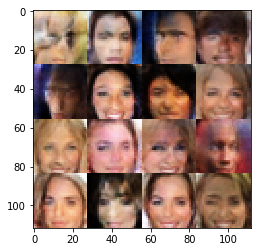

Timestamp 20170803-22-53-48.304 -  Epoch 1/1 -  Step 18110 -  D Loss: 0.8886 - G Loss: 1.5164
Timestamp 20170803-22-53-54.504 -  Epoch 1/1 -  Step 18120 -  D Loss: 1.1142 - G Loss: 0.9144
Timestamp 20170803-22-54-00.684 -  Epoch 1/1 -  Step 18130 -  D Loss: 1.6224 - G Loss: 1.6068
Timestamp 20170803-22-54-06.868 -  Epoch 1/1 -  Step 18140 -  D Loss: 1.6306 - G Loss: 1.1872
Timestamp 20170803-22-54-13.078 -  Epoch 1/1 -  Step 18150 -  D Loss: 0.9449 - G Loss: 1.3195
Timestamp 20170803-22-54-19.282 -  Epoch 1/1 -  Step 18160 -  D Loss: 1.0606 - G Loss: 0.8317
Timestamp 20170803-22-54-25.472 -  Epoch 1/1 -  Step 18170 -  D Loss: 1.6617 - G Loss: 1.3447
Timestamp 20170803-22-54-31.664 -  Epoch 1/1 -  Step 18180 -  D Loss: 1.3174 - G Loss: 1.4024
Timestamp 20170803-22-54-37.847 -  Epoch 1/1 -  Step 18190 -  D Loss: 1.1736 - G Loss: 0.9026
Timestamp 20170803-22-54-44.051 -  Epoch 1/1 -  Step 18200 -  D Loss: 0.9364 - G Loss: 1.2577


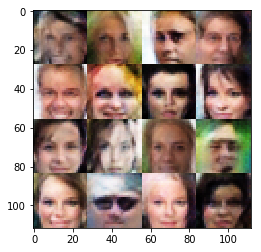

Timestamp 20170803-22-54-51.125 -  Epoch 1/1 -  Step 18210 -  D Loss: 1.1115 - G Loss: 1.1069
Timestamp 20170803-22-54-57.308 -  Epoch 1/1 -  Step 18220 -  D Loss: 1.4515 - G Loss: 0.6278
Timestamp 20170803-22-55-03.501 -  Epoch 1/1 -  Step 18230 -  D Loss: 1.1284 - G Loss: 0.6766
Timestamp 20170803-22-55-09.698 -  Epoch 1/1 -  Step 18240 -  D Loss: 1.2512 - G Loss: 0.9893
Timestamp 20170803-22-55-15.869 -  Epoch 1/1 -  Step 18250 -  D Loss: 1.4551 - G Loss: 0.8676
Timestamp 20170803-22-55-22.059 -  Epoch 1/1 -  Step 18260 -  D Loss: 0.9368 - G Loss: 0.6452
Timestamp 20170803-22-55-28.262 -  Epoch 1/1 -  Step 18270 -  D Loss: 0.9487 - G Loss: 1.0594
Timestamp 20170803-22-55-34.470 -  Epoch 1/1 -  Step 18280 -  D Loss: 1.2003 - G Loss: 1.8318
Timestamp 20170803-22-55-40.680 -  Epoch 1/1 -  Step 18290 -  D Loss: 1.3292 - G Loss: 1.0330
Timestamp 20170803-22-55-46.882 -  Epoch 1/1 -  Step 18300 -  D Loss: 1.1532 - G Loss: 0.8332


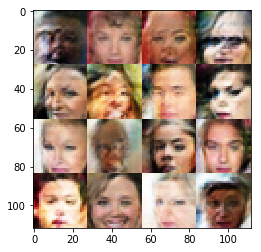

Timestamp 20170803-22-55-54.024 -  Epoch 1/1 -  Step 18310 -  D Loss: 1.0427 - G Loss: 1.4068
Timestamp 20170803-22-56-00.212 -  Epoch 1/1 -  Step 18320 -  D Loss: 1.1222 - G Loss: 1.1327
Timestamp 20170803-22-56-06.409 -  Epoch 1/1 -  Step 18330 -  D Loss: 1.1566 - G Loss: 1.3297
Timestamp 20170803-22-56-12.578 -  Epoch 1/1 -  Step 18340 -  D Loss: 1.3269 - G Loss: 0.8269
Timestamp 20170803-22-56-18.785 -  Epoch 1/1 -  Step 18350 -  D Loss: 1.1398 - G Loss: 1.7145
Timestamp 20170803-22-56-25.003 -  Epoch 1/1 -  Step 18360 -  D Loss: 1.5267 - G Loss: 0.7861
Timestamp 20170803-22-56-31.197 -  Epoch 1/1 -  Step 18370 -  D Loss: 1.0745 - G Loss: 0.9139
Timestamp 20170803-22-56-37.376 -  Epoch 1/1 -  Step 18380 -  D Loss: 1.0325 - G Loss: 1.1029
Timestamp 20170803-22-56-43.554 -  Epoch 1/1 -  Step 18390 -  D Loss: 0.9713 - G Loss: 1.4613
Timestamp 20170803-22-56-49.735 -  Epoch 1/1 -  Step 18400 -  D Loss: 1.2740 - G Loss: 0.8623


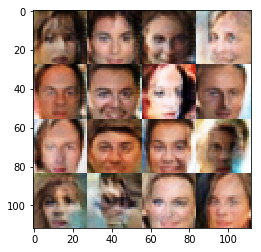

Timestamp 20170803-22-56-56.828 -  Epoch 1/1 -  Step 18410 -  D Loss: 1.2804 - G Loss: 1.3288
Timestamp 20170803-22-57-03.019 -  Epoch 1/1 -  Step 18420 -  D Loss: 1.2683 - G Loss: 1.6876
Timestamp 20170803-22-57-09.197 -  Epoch 1/1 -  Step 18430 -  D Loss: 1.0348 - G Loss: 0.8777
Timestamp 20170803-22-57-15.390 -  Epoch 1/1 -  Step 18440 -  D Loss: 0.9170 - G Loss: 1.4101
Timestamp 20170803-22-57-21.579 -  Epoch 1/1 -  Step 18450 -  D Loss: 0.9988 - G Loss: 1.4642
Timestamp 20170803-22-57-27.777 -  Epoch 1/1 -  Step 18460 -  D Loss: 1.3708 - G Loss: 1.1503
Timestamp 20170803-22-57-33.971 -  Epoch 1/1 -  Step 18470 -  D Loss: 0.8090 - G Loss: 1.2896
Timestamp 20170803-22-57-40.158 -  Epoch 1/1 -  Step 18480 -  D Loss: 1.2635 - G Loss: 0.9888
Timestamp 20170803-22-57-46.339 -  Epoch 1/1 -  Step 18490 -  D Loss: 1.0407 - G Loss: 1.2254
Timestamp 20170803-22-57-52.554 -  Epoch 1/1 -  Step 18500 -  D Loss: 0.8340 - G Loss: 0.8387


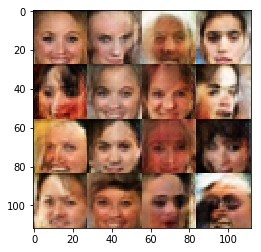

Timestamp 20170803-22-57-59.649 -  Epoch 1/1 -  Step 18510 -  D Loss: 1.1813 - G Loss: 1.4446
Timestamp 20170803-22-58-05.829 -  Epoch 1/1 -  Step 18520 -  D Loss: 0.9791 - G Loss: 1.0505
Timestamp 20170803-22-58-12.067 -  Epoch 1/1 -  Step 18530 -  D Loss: 1.2189 - G Loss: 1.2969
Timestamp 20170803-22-58-18.254 -  Epoch 1/1 -  Step 18540 -  D Loss: 1.4153 - G Loss: 0.9821
Timestamp 20170803-22-58-24.444 -  Epoch 1/1 -  Step 18550 -  D Loss: 0.9769 - G Loss: 1.4074
Timestamp 20170803-22-58-30.648 -  Epoch 1/1 -  Step 18560 -  D Loss: 0.7269 - G Loss: 1.2773
Timestamp 20170803-22-58-36.864 -  Epoch 1/1 -  Step 18570 -  D Loss: 1.1072 - G Loss: 1.0641
Timestamp 20170803-22-58-43.061 -  Epoch 1/1 -  Step 18580 -  D Loss: 1.0361 - G Loss: 0.8908
Timestamp 20170803-22-58-49.263 -  Epoch 1/1 -  Step 18590 -  D Loss: 1.2446 - G Loss: 1.1476
Timestamp 20170803-22-58-55.434 -  Epoch 1/1 -  Step 18600 -  D Loss: 1.2114 - G Loss: 0.6531


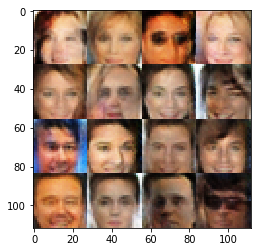

Timestamp 20170803-22-59-02.582 -  Epoch 1/1 -  Step 18610 -  D Loss: 1.2212 - G Loss: 1.0308
Timestamp 20170803-22-59-08.773 -  Epoch 1/1 -  Step 18620 -  D Loss: 1.2206 - G Loss: 0.7724
Timestamp 20170803-22-59-14.970 -  Epoch 1/1 -  Step 18630 -  D Loss: 0.9966 - G Loss: 1.3040
Timestamp 20170803-22-59-21.152 -  Epoch 1/1 -  Step 18640 -  D Loss: 0.8612 - G Loss: 1.1973
Timestamp 20170803-22-59-27.359 -  Epoch 1/1 -  Step 18650 -  D Loss: 1.1749 - G Loss: 0.6684
Timestamp 20170803-22-59-33.567 -  Epoch 1/1 -  Step 18660 -  D Loss: 0.9166 - G Loss: 0.9636
Timestamp 20170803-22-59-39.742 -  Epoch 1/1 -  Step 18670 -  D Loss: 1.2781 - G Loss: 0.6991
Timestamp 20170803-22-59-45.934 -  Epoch 1/1 -  Step 18680 -  D Loss: 1.2770 - G Loss: 0.9148
Timestamp 20170803-22-59-52.122 -  Epoch 1/1 -  Step 18690 -  D Loss: 0.9330 - G Loss: 1.1868
Timestamp 20170803-22-59-58.314 -  Epoch 1/1 -  Step 18700 -  D Loss: 1.4224 - G Loss: 0.7302


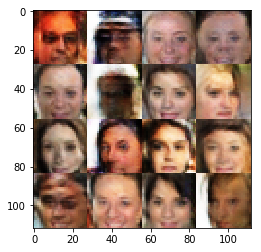

Timestamp 20170803-23-00-05.425 -  Epoch 1/1 -  Step 18710 -  D Loss: 0.8418 - G Loss: 1.3446
Timestamp 20170803-23-00-11.614 -  Epoch 1/1 -  Step 18720 -  D Loss: 0.9296 - G Loss: 0.8281
Timestamp 20170803-23-00-17.806 -  Epoch 1/1 -  Step 18730 -  D Loss: 0.9090 - G Loss: 0.8068
Timestamp 20170803-23-00-23.997 -  Epoch 1/1 -  Step 18740 -  D Loss: 1.1056 - G Loss: 0.9873
Timestamp 20170803-23-00-30.226 -  Epoch 1/1 -  Step 18750 -  D Loss: 1.0923 - G Loss: 1.1446
Timestamp 20170803-23-00-36.393 -  Epoch 1/1 -  Step 18760 -  D Loss: 1.5679 - G Loss: 0.6099
Timestamp 20170803-23-00-42.588 -  Epoch 1/1 -  Step 18770 -  D Loss: 0.9969 - G Loss: 1.3067
Timestamp 20170803-23-00-48.784 -  Epoch 1/1 -  Step 18780 -  D Loss: 1.3168 - G Loss: 1.1124
Timestamp 20170803-23-00-54.947 -  Epoch 1/1 -  Step 18790 -  D Loss: 1.2565 - G Loss: 1.3448
Timestamp 20170803-23-01-01.157 -  Epoch 1/1 -  Step 18800 -  D Loss: 0.9298 - G Loss: 1.2077


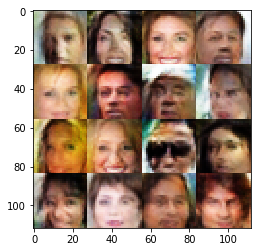

Timestamp 20170803-23-01-08.267 -  Epoch 1/1 -  Step 18810 -  D Loss: 1.3837 - G Loss: 1.3673
Timestamp 20170803-23-01-14.441 -  Epoch 1/1 -  Step 18820 -  D Loss: 1.1341 - G Loss: 0.9909
Timestamp 20170803-23-01-20.640 -  Epoch 1/1 -  Step 18830 -  D Loss: 1.0289 - G Loss: 1.3852
Timestamp 20170803-23-01-26.838 -  Epoch 1/1 -  Step 18840 -  D Loss: 1.1730 - G Loss: 1.3863
Timestamp 20170803-23-01-33.015 -  Epoch 1/1 -  Step 18850 -  D Loss: 0.7775 - G Loss: 1.1317
Timestamp 20170803-23-01-39.222 -  Epoch 1/1 -  Step 18860 -  D Loss: 1.1337 - G Loss: 1.5323
Timestamp 20170803-23-01-45.416 -  Epoch 1/1 -  Step 18870 -  D Loss: 1.2215 - G Loss: 0.9286
Timestamp 20170803-23-01-51.593 -  Epoch 1/1 -  Step 18880 -  D Loss: 0.7777 - G Loss: 1.3687
Timestamp 20170803-23-01-57.795 -  Epoch 1/1 -  Step 18890 -  D Loss: 0.9491 - G Loss: 1.4521
Timestamp 20170803-23-02-03.994 -  Epoch 1/1 -  Step 18900 -  D Loss: 1.1203 - G Loss: 1.0815


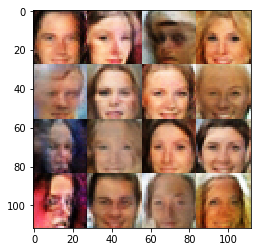

Timestamp 20170803-23-02-11.146 -  Epoch 1/1 -  Step 18910 -  D Loss: 1.1180 - G Loss: 1.0965
Timestamp 20170803-23-02-17.335 -  Epoch 1/1 -  Step 18920 -  D Loss: 0.9383 - G Loss: 1.4868
Timestamp 20170803-23-02-23.545 -  Epoch 1/1 -  Step 18930 -  D Loss: 1.4521 - G Loss: 1.1337
Timestamp 20170803-23-02-29.764 -  Epoch 1/1 -  Step 18940 -  D Loss: 1.0109 - G Loss: 0.8031
Timestamp 20170803-23-02-36.000 -  Epoch 1/1 -  Step 18950 -  D Loss: 1.3330 - G Loss: 1.2528
Timestamp 20170803-23-02-42.225 -  Epoch 1/1 -  Step 18960 -  D Loss: 1.2612 - G Loss: 0.9553
Timestamp 20170803-23-02-48.468 -  Epoch 1/1 -  Step 18970 -  D Loss: 1.1608 - G Loss: 0.9409
Timestamp 20170803-23-02-54.688 -  Epoch 1/1 -  Step 18980 -  D Loss: 0.6842 - G Loss: 1.4133
Timestamp 20170803-23-03-00.926 -  Epoch 1/1 -  Step 18990 -  D Loss: 0.9143 - G Loss: 1.3001
Timestamp 20170803-23-03-07.120 -  Epoch 1/1 -  Step 19000 -  D Loss: 0.8118 - G Loss: 1.1643


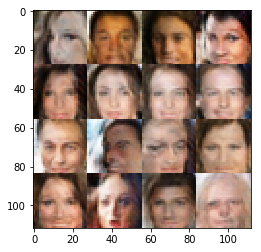

Timestamp 20170803-23-03-14.271 -  Epoch 1/1 -  Step 19010 -  D Loss: 1.1089 - G Loss: 1.1849
Timestamp 20170803-23-03-20.493 -  Epoch 1/1 -  Step 19020 -  D Loss: 1.1129 - G Loss: 1.4067
Timestamp 20170803-23-03-26.701 -  Epoch 1/1 -  Step 19030 -  D Loss: 1.1523 - G Loss: 0.8743
Timestamp 20170803-23-03-32.915 -  Epoch 1/1 -  Step 19040 -  D Loss: 0.9919 - G Loss: 1.0854
Timestamp 20170803-23-03-39.137 -  Epoch 1/1 -  Step 19050 -  D Loss: 0.9566 - G Loss: 0.9046
Timestamp 20170803-23-03-45.350 -  Epoch 1/1 -  Step 19060 -  D Loss: 1.0077 - G Loss: 1.1083
Timestamp 20170803-23-03-51.544 -  Epoch 1/1 -  Step 19070 -  D Loss: 1.3296 - G Loss: 1.0234
Timestamp 20170803-23-03-57.745 -  Epoch 1/1 -  Step 19080 -  D Loss: 1.3938 - G Loss: 0.8831
Timestamp 20170803-23-04-03.961 -  Epoch 1/1 -  Step 19090 -  D Loss: 1.4495 - G Loss: 1.0867
Timestamp 20170803-23-04-10.166 -  Epoch 1/1 -  Step 19100 -  D Loss: 1.3259 - G Loss: 0.9714


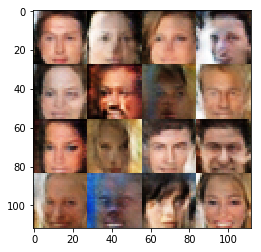

Timestamp 20170803-23-04-17.328 -  Epoch 1/1 -  Step 19110 -  D Loss: 0.9807 - G Loss: 1.2384
Timestamp 20170803-23-04-23.556 -  Epoch 1/1 -  Step 19120 -  D Loss: 0.8625 - G Loss: 0.7698
Timestamp 20170803-23-04-29.766 -  Epoch 1/1 -  Step 19130 -  D Loss: 1.2935 - G Loss: 0.8800
Timestamp 20170803-23-04-35.964 -  Epoch 1/1 -  Step 19140 -  D Loss: 0.8963 - G Loss: 1.0126
Timestamp 20170803-23-04-42.155 -  Epoch 1/1 -  Step 19150 -  D Loss: 1.5585 - G Loss: 0.9331
Timestamp 20170803-23-04-48.404 -  Epoch 1/1 -  Step 19160 -  D Loss: 0.9794 - G Loss: 1.3190
Timestamp 20170803-23-04-54.607 -  Epoch 1/1 -  Step 19170 -  D Loss: 1.1740 - G Loss: 1.3787
Timestamp 20170803-23-05-00.820 -  Epoch 1/1 -  Step 19180 -  D Loss: 1.3258 - G Loss: 1.0509
Timestamp 20170803-23-05-07.018 -  Epoch 1/1 -  Step 19190 -  D Loss: 0.8397 - G Loss: 1.1356
Timestamp 20170803-23-05-13.223 -  Epoch 1/1 -  Step 19200 -  D Loss: 1.6278 - G Loss: 0.6014


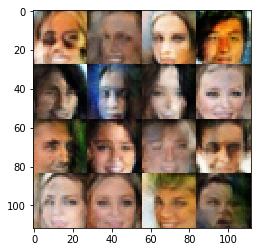

Timestamp 20170803-23-05-20.371 -  Epoch 1/1 -  Step 19210 -  D Loss: 0.9074 - G Loss: 1.8874
Timestamp 20170803-23-05-26.565 -  Epoch 1/1 -  Step 19220 -  D Loss: 0.9352 - G Loss: 1.0274
Timestamp 20170803-23-05-32.805 -  Epoch 1/1 -  Step 19230 -  D Loss: 1.1441 - G Loss: 2.0860
Timestamp 20170803-23-05-39.013 -  Epoch 1/1 -  Step 19240 -  D Loss: 0.9265 - G Loss: 1.4148
Timestamp 20170803-23-05-45.228 -  Epoch 1/1 -  Step 19250 -  D Loss: 1.1488 - G Loss: 0.8881
Timestamp 20170803-23-05-51.445 -  Epoch 1/1 -  Step 19260 -  D Loss: 1.7771 - G Loss: 1.0955
Timestamp 20170803-23-05-57.668 -  Epoch 1/1 -  Step 19270 -  D Loss: 1.0892 - G Loss: 0.6599
Timestamp 20170803-23-06-03.889 -  Epoch 1/1 -  Step 19280 -  D Loss: 0.8123 - G Loss: 1.2613
Timestamp 20170803-23-06-10.102 -  Epoch 1/1 -  Step 19290 -  D Loss: 1.1460 - G Loss: 0.8643
Timestamp 20170803-23-06-16.304 -  Epoch 1/1 -  Step 19300 -  D Loss: 0.9698 - G Loss: 0.8628


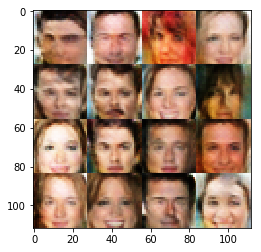

Timestamp 20170803-23-06-23.443 -  Epoch 1/1 -  Step 19310 -  D Loss: 1.0193 - G Loss: 1.6352
Timestamp 20170803-23-06-29.641 -  Epoch 1/1 -  Step 19320 -  D Loss: 0.7145 - G Loss: 1.4354
Timestamp 20170803-23-06-35.834 -  Epoch 1/1 -  Step 19330 -  D Loss: 1.1131 - G Loss: 0.8856
Timestamp 20170803-23-06-42.019 -  Epoch 1/1 -  Step 19340 -  D Loss: 1.2290 - G Loss: 0.5367
Timestamp 20170803-23-06-48.239 -  Epoch 1/1 -  Step 19350 -  D Loss: 1.0633 - G Loss: 0.8450
Timestamp 20170803-23-06-54.441 -  Epoch 1/1 -  Step 19360 -  D Loss: 1.0944 - G Loss: 1.0598
Timestamp 20170803-23-07-00.669 -  Epoch 1/1 -  Step 19370 -  D Loss: 1.1740 - G Loss: 1.2986
Timestamp 20170803-23-07-06.871 -  Epoch 1/1 -  Step 19380 -  D Loss: 1.1575 - G Loss: 1.0401
Timestamp 20170803-23-07-13.095 -  Epoch 1/1 -  Step 19390 -  D Loss: 1.1213 - G Loss: 1.0784
Timestamp 20170803-23-07-19.307 -  Epoch 1/1 -  Step 19400 -  D Loss: 1.5015 - G Loss: 0.8150


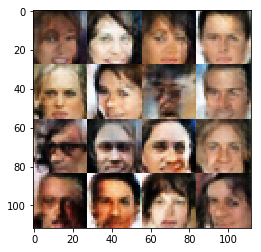

Timestamp 20170803-23-07-26.427 -  Epoch 1/1 -  Step 19410 -  D Loss: 1.0341 - G Loss: 1.1922
Timestamp 20170803-23-07-32.666 -  Epoch 1/1 -  Step 19420 -  D Loss: 1.0561 - G Loss: 1.3147
Timestamp 20170803-23-07-38.875 -  Epoch 1/1 -  Step 19430 -  D Loss: 0.8868 - G Loss: 1.4754
Timestamp 20170803-23-07-45.110 -  Epoch 1/1 -  Step 19440 -  D Loss: 1.1672 - G Loss: 1.0496
Timestamp 20170803-23-07-51.318 -  Epoch 1/1 -  Step 19450 -  D Loss: 0.9828 - G Loss: 0.9236
Timestamp 20170803-23-07-57.509 -  Epoch 1/1 -  Step 19460 -  D Loss: 0.9081 - G Loss: 0.9694
Timestamp 20170803-23-08-03.706 -  Epoch 1/1 -  Step 19470 -  D Loss: 1.0640 - G Loss: 1.0977
Timestamp 20170803-23-08-09.914 -  Epoch 1/1 -  Step 19480 -  D Loss: 1.7302 - G Loss: 0.7188
Timestamp 20170803-23-08-16.114 -  Epoch 1/1 -  Step 19490 -  D Loss: 1.5679 - G Loss: 0.6965
Timestamp 20170803-23-08-22.309 -  Epoch 1/1 -  Step 19500 -  D Loss: 1.1953 - G Loss: 1.0606


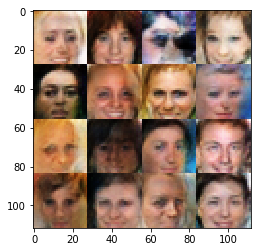

Timestamp 20170803-23-08-29.465 -  Epoch 1/1 -  Step 19510 -  D Loss: 1.1522 - G Loss: 1.0827
Timestamp 20170803-23-08-35.667 -  Epoch 1/1 -  Step 19520 -  D Loss: 0.7944 - G Loss: 1.5194
Timestamp 20170803-23-08-41.896 -  Epoch 1/1 -  Step 19530 -  D Loss: 1.2481 - G Loss: 0.9282
Timestamp 20170803-23-08-48.096 -  Epoch 1/1 -  Step 19540 -  D Loss: 1.2213 - G Loss: 1.6931
Timestamp 20170803-23-08-54.299 -  Epoch 1/1 -  Step 19550 -  D Loss: 1.4140 - G Loss: 1.2954
Timestamp 20170803-23-09-00.514 -  Epoch 1/1 -  Step 19560 -  D Loss: 0.8411 - G Loss: 1.5228
Timestamp 20170803-23-09-06.710 -  Epoch 1/1 -  Step 19570 -  D Loss: 1.0908 - G Loss: 1.5405
Timestamp 20170803-23-09-12.912 -  Epoch 1/1 -  Step 19580 -  D Loss: 0.8166 - G Loss: 1.0540
Timestamp 20170803-23-09-19.095 -  Epoch 1/1 -  Step 19590 -  D Loss: 0.9354 - G Loss: 1.2287
Timestamp 20170803-23-09-25.337 -  Epoch 1/1 -  Step 19600 -  D Loss: 1.0371 - G Loss: 0.6616


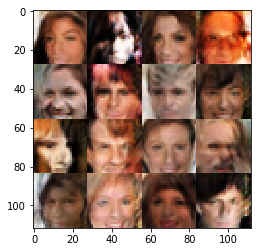

Timestamp 20170803-23-09-33.100 -  Epoch 1/1 -  Step 19610 -  D Loss: 1.0614 - G Loss: 1.4369
Timestamp 20170803-23-09-39.309 -  Epoch 1/1 -  Step 19620 -  D Loss: 1.1068 - G Loss: 0.9515
Timestamp 20170803-23-09-45.531 -  Epoch 1/1 -  Step 19630 -  D Loss: 1.0167 - G Loss: 0.9649
Timestamp 20170803-23-09-51.751 -  Epoch 1/1 -  Step 19640 -  D Loss: 0.8196 - G Loss: 1.5530
Timestamp 20170803-23-09-57.944 -  Epoch 1/1 -  Step 19650 -  D Loss: 1.0295 - G Loss: 1.1856
Timestamp 20170803-23-10-04.147 -  Epoch 1/1 -  Step 19660 -  D Loss: 1.0857 - G Loss: 0.7985
Timestamp 20170803-23-10-10.354 -  Epoch 1/1 -  Step 19670 -  D Loss: 0.9192 - G Loss: 0.9421
Timestamp 20170803-23-10-16.539 -  Epoch 1/1 -  Step 19680 -  D Loss: 1.1134 - G Loss: 1.0056
Timestamp 20170803-23-10-22.759 -  Epoch 1/1 -  Step 19690 -  D Loss: 0.9459 - G Loss: 2.4857
Timestamp 20170803-23-10-28.959 -  Epoch 1/1 -  Step 19700 -  D Loss: 0.8902 - G Loss: 1.0704


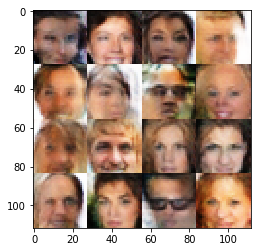

Timestamp 20170803-23-10-36.139 -  Epoch 1/1 -  Step 19710 -  D Loss: 1.2803 - G Loss: 1.0015
Timestamp 20170803-23-10-42.357 -  Epoch 1/1 -  Step 19720 -  D Loss: 0.7951 - G Loss: 1.8131
Timestamp 20170803-23-10-48.580 -  Epoch 1/1 -  Step 19730 -  D Loss: 1.1018 - G Loss: 1.2923
Timestamp 20170803-23-10-54.779 -  Epoch 1/1 -  Step 19740 -  D Loss: 0.9796 - G Loss: 0.9110
Timestamp 20170803-23-11-00.996 -  Epoch 1/1 -  Step 19750 -  D Loss: 1.3915 - G Loss: 1.1786
Timestamp 20170803-23-11-07.205 -  Epoch 1/1 -  Step 19760 -  D Loss: 1.1610 - G Loss: 0.7762
Timestamp 20170803-23-11-13.422 -  Epoch 1/1 -  Step 19770 -  D Loss: 1.0417 - G Loss: 1.0734
Timestamp 20170803-23-11-19.650 -  Epoch 1/1 -  Step 19780 -  D Loss: 0.9894 - G Loss: 1.3889
Timestamp 20170803-23-11-25.883 -  Epoch 1/1 -  Step 19790 -  D Loss: 1.0848 - G Loss: 1.1170
Timestamp 20170803-23-11-32.108 -  Epoch 1/1 -  Step 19800 -  D Loss: 1.0276 - G Loss: 1.2172


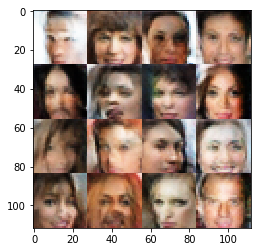

Timestamp 20170803-23-11-39.354 -  Epoch 1/1 -  Step 19810 -  D Loss: 0.7760 - G Loss: 1.0191
Timestamp 20170803-23-11-45.615 -  Epoch 1/1 -  Step 19820 -  D Loss: 1.3179 - G Loss: 1.7940
Timestamp 20170803-23-11-51.816 -  Epoch 1/1 -  Step 19830 -  D Loss: 1.2051 - G Loss: 1.3064
Timestamp 20170803-23-11-58.022 -  Epoch 1/1 -  Step 19840 -  D Loss: 0.7601 - G Loss: 1.6187
Timestamp 20170803-23-12-04.241 -  Epoch 1/1 -  Step 19850 -  D Loss: 1.4662 - G Loss: 1.1120
Timestamp 20170803-23-12-10.463 -  Epoch 1/1 -  Step 19860 -  D Loss: 1.1000 - G Loss: 1.5711
Timestamp 20170803-23-12-16.663 -  Epoch 1/1 -  Step 19870 -  D Loss: 0.7669 - G Loss: 1.7498
Timestamp 20170803-23-12-22.894 -  Epoch 1/1 -  Step 19880 -  D Loss: 1.2845 - G Loss: 1.3369
Timestamp 20170803-23-12-29.099 -  Epoch 1/1 -  Step 19890 -  D Loss: 1.1234 - G Loss: 1.1047
Timestamp 20170803-23-12-35.314 -  Epoch 1/1 -  Step 19900 -  D Loss: 1.0158 - G Loss: 0.9401


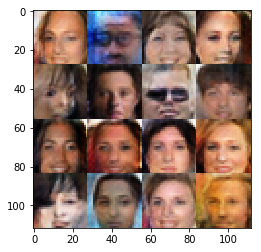

Timestamp 20170803-23-12-42.475 -  Epoch 1/1 -  Step 19910 -  D Loss: 1.1249 - G Loss: 1.2824
Timestamp 20170803-23-12-48.721 -  Epoch 1/1 -  Step 19920 -  D Loss: 1.2773 - G Loss: 0.5700
Timestamp 20170803-23-12-54.931 -  Epoch 1/1 -  Step 19930 -  D Loss: 1.3625 - G Loss: 1.4679
Timestamp 20170803-23-13-01.199 -  Epoch 1/1 -  Step 19940 -  D Loss: 0.9756 - G Loss: 1.2832
Timestamp 20170803-23-13-07.399 -  Epoch 1/1 -  Step 19950 -  D Loss: 1.0055 - G Loss: 0.9745
Timestamp 20170803-23-13-13.644 -  Epoch 1/1 -  Step 19960 -  D Loss: 0.9521 - G Loss: 0.8100
Timestamp 20170803-23-13-19.849 -  Epoch 1/1 -  Step 19970 -  D Loss: 0.6368 - G Loss: 1.4264
Timestamp 20170803-23-13-26.062 -  Epoch 1/1 -  Step 19980 -  D Loss: 1.0349 - G Loss: 1.2787
Timestamp 20170803-23-13-32.283 -  Epoch 1/1 -  Step 19990 -  D Loss: 1.0931 - G Loss: 0.6008
Timestamp 20170803-23-13-38.510 -  Epoch 1/1 -  Step 20000 -  D Loss: 1.0638 - G Loss: 1.5137


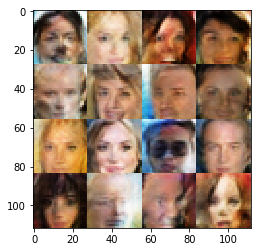

Timestamp 20170803-23-13-45.696 -  Epoch 1/1 -  Step 20010 -  D Loss: 1.1623 - G Loss: 1.2563
Timestamp 20170803-23-13-51.926 -  Epoch 1/1 -  Step 20020 -  D Loss: 1.3573 - G Loss: 0.8319
Timestamp 20170803-23-13-58.144 -  Epoch 1/1 -  Step 20030 -  D Loss: 0.9372 - G Loss: 1.0325
Timestamp 20170803-23-14-04.338 -  Epoch 1/1 -  Step 20040 -  D Loss: 1.3551 - G Loss: 0.7986
Timestamp 20170803-23-14-10.568 -  Epoch 1/1 -  Step 20050 -  D Loss: 1.1130 - G Loss: 1.6701
Timestamp 20170803-23-14-16.785 -  Epoch 1/1 -  Step 20060 -  D Loss: 1.1605 - G Loss: 0.8803
Timestamp 20170803-23-14-22.990 -  Epoch 1/1 -  Step 20070 -  D Loss: 0.8861 - G Loss: 1.3761
Timestamp 20170803-23-14-29.215 -  Epoch 1/1 -  Step 20080 -  D Loss: 1.1198 - G Loss: 1.3345
Timestamp 20170803-23-14-35.414 -  Epoch 1/1 -  Step 20090 -  D Loss: 1.0714 - G Loss: 1.0804
Timestamp 20170803-23-14-41.629 -  Epoch 1/1 -  Step 20100 -  D Loss: 1.0243 - G Loss: 1.3509


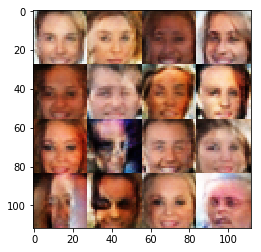

Timestamp 20170803-23-14-48.795 -  Epoch 1/1 -  Step 20110 -  D Loss: 0.7905 - G Loss: 1.1921
Timestamp 20170803-23-14-54.996 -  Epoch 1/1 -  Step 20120 -  D Loss: 1.0327 - G Loss: 1.2157
Timestamp 20170803-23-15-01.209 -  Epoch 1/1 -  Step 20130 -  D Loss: 1.2342 - G Loss: 1.2438
Timestamp 20170803-23-15-07.407 -  Epoch 1/1 -  Step 20140 -  D Loss: 1.2274 - G Loss: 0.8553
Timestamp 20170803-23-15-13.607 -  Epoch 1/1 -  Step 20150 -  D Loss: 1.2068 - G Loss: 0.6862
Timestamp 20170803-23-15-19.831 -  Epoch 1/1 -  Step 20160 -  D Loss: 1.0801 - G Loss: 1.8597
Timestamp 20170803-23-15-26.126 -  Epoch 1/1 -  Step 20170 -  D Loss: 1.0520 - G Loss: 1.5012
Timestamp 20170803-23-15-32.345 -  Epoch 1/1 -  Step 20180 -  D Loss: 0.6591 - G Loss: 1.8066
Timestamp 20170803-23-15-38.571 -  Epoch 1/1 -  Step 20190 -  D Loss: 1.2998 - G Loss: 1.1025
Timestamp 20170803-23-15-44.777 -  Epoch 1/1 -  Step 20200 -  D Loss: 0.8902 - G Loss: 0.9754


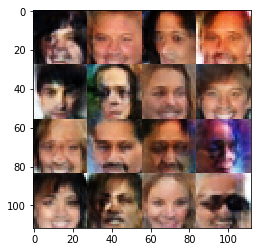

Timestamp 20170803-23-15-51.963 -  Epoch 1/1 -  Step 20210 -  D Loss: 1.5612 - G Loss: 0.8085
Timestamp 20170803-23-15-58.175 -  Epoch 1/1 -  Step 20220 -  D Loss: 0.8394 - G Loss: 0.7894
Timestamp 20170803-23-16-04.384 -  Epoch 1/1 -  Step 20230 -  D Loss: 1.1905 - G Loss: 0.5078
Timestamp 20170803-23-16-10.597 -  Epoch 1/1 -  Step 20240 -  D Loss: 0.7319 - G Loss: 2.2767
Timestamp 20170803-23-16-16.798 -  Epoch 1/1 -  Step 20250 -  D Loss: 1.0053 - G Loss: 1.2709
Timestamp 20170803-23-16-22.996 -  Epoch 1/1 -  Step 20260 -  D Loss: 0.8330 - G Loss: 1.2495
Timestamp 20170803-23-16-29.231 -  Epoch 1/1 -  Step 20270 -  D Loss: 1.0622 - G Loss: 1.0027
Timestamp 20170803-23-16-35.433 -  Epoch 1/1 -  Step 20280 -  D Loss: 0.8743 - G Loss: 1.3254
Timestamp 20170803-23-16-41.625 -  Epoch 1/1 -  Step 20290 -  D Loss: 0.9690 - G Loss: 1.7462
Timestamp 20170803-23-16-47.830 -  Epoch 1/1 -  Step 20300 -  D Loss: 1.2761 - G Loss: 1.3418


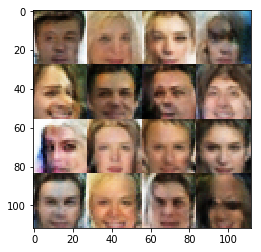

Timestamp 20170803-23-16-55.066 -  Epoch 1/1 -  Step 20310 -  D Loss: 1.1755 - G Loss: 1.1473
Timestamp 20170803-23-17-01.300 -  Epoch 1/1 -  Step 20320 -  D Loss: 0.7963 - G Loss: 2.0023
Timestamp 20170803-23-17-07.488 -  Epoch 1/1 -  Step 20330 -  D Loss: 1.3639 - G Loss: 0.9392
Timestamp 20170803-23-17-13.729 -  Epoch 1/1 -  Step 20340 -  D Loss: 0.9074 - G Loss: 1.4645
Timestamp 20170803-23-17-19.935 -  Epoch 1/1 -  Step 20350 -  D Loss: 1.4494 - G Loss: 0.6096
Timestamp 20170803-23-17-26.148 -  Epoch 1/1 -  Step 20360 -  D Loss: 1.3892 - G Loss: 0.7994
Timestamp 20170803-23-17-32.378 -  Epoch 1/1 -  Step 20370 -  D Loss: 0.9133 - G Loss: 1.2255
Timestamp 20170803-23-17-38.584 -  Epoch 1/1 -  Step 20380 -  D Loss: 0.7912 - G Loss: 1.1301
Timestamp 20170803-23-17-44.812 -  Epoch 1/1 -  Step 20390 -  D Loss: 1.2119 - G Loss: 1.2085
Timestamp 20170803-23-17-51.018 -  Epoch 1/1 -  Step 20400 -  D Loss: 1.1005 - G Loss: 1.2816


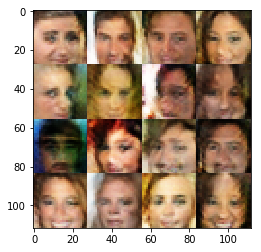

Timestamp 20170803-23-17-58.181 -  Epoch 1/1 -  Step 20410 -  D Loss: 1.0436 - G Loss: 2.1438
Timestamp 20170803-23-18-04.399 -  Epoch 1/1 -  Step 20420 -  D Loss: 1.0938 - G Loss: 0.8351
Timestamp 20170803-23-18-10.604 -  Epoch 1/1 -  Step 20430 -  D Loss: 1.1277 - G Loss: 1.2872
Timestamp 20170803-23-18-16.878 -  Epoch 1/1 -  Step 20440 -  D Loss: 1.1090 - G Loss: 0.8894
Timestamp 20170803-23-18-23.079 -  Epoch 1/1 -  Step 20450 -  D Loss: 0.8649 - G Loss: 1.2337
Timestamp 20170803-23-18-29.315 -  Epoch 1/1 -  Step 20460 -  D Loss: 1.2219 - G Loss: 0.7480
Timestamp 20170803-23-18-35.527 -  Epoch 1/1 -  Step 20470 -  D Loss: 1.1135 - G Loss: 1.3606
Timestamp 20170803-23-18-41.746 -  Epoch 1/1 -  Step 20480 -  D Loss: 0.9454 - G Loss: 1.4504
Timestamp 20170803-23-18-47.941 -  Epoch 1/1 -  Step 20490 -  D Loss: 1.0386 - G Loss: 1.0407
Timestamp 20170803-23-18-54.157 -  Epoch 1/1 -  Step 20500 -  D Loss: 1.1785 - G Loss: 0.9981


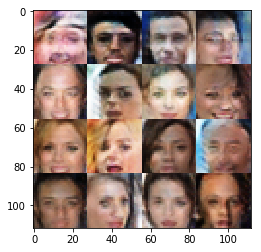

Timestamp 20170803-23-19-01.365 -  Epoch 1/1 -  Step 20510 -  D Loss: 0.9310 - G Loss: 1.0577
Timestamp 20170803-23-19-07.568 -  Epoch 1/1 -  Step 20520 -  D Loss: 1.4885 - G Loss: 1.0550
Timestamp 20170803-23-19-13.769 -  Epoch 1/1 -  Step 20530 -  D Loss: 0.9210 - G Loss: 1.3668
Timestamp 20170803-23-19-19.993 -  Epoch 1/1 -  Step 20540 -  D Loss: 1.4552 - G Loss: 0.7151
Timestamp 20170803-23-19-26.226 -  Epoch 1/1 -  Step 20550 -  D Loss: 1.0295 - G Loss: 1.4042
Timestamp 20170803-23-19-32.438 -  Epoch 1/1 -  Step 20560 -  D Loss: 1.1290 - G Loss: 1.2657
Timestamp 20170803-23-19-38.675 -  Epoch 1/1 -  Step 20570 -  D Loss: 1.0875 - G Loss: 1.8296
Timestamp 20170803-23-19-44.906 -  Epoch 1/1 -  Step 20580 -  D Loss: 0.8281 - G Loss: 1.2649
Timestamp 20170803-23-19-51.115 -  Epoch 1/1 -  Step 20590 -  D Loss: 1.0014 - G Loss: 1.9328
Timestamp 20170803-23-19-57.328 -  Epoch 1/1 -  Step 20600 -  D Loss: 1.5736 - G Loss: 1.2026


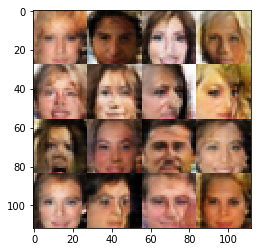

Timestamp 20170803-23-20-04.508 -  Epoch 1/1 -  Step 20610 -  D Loss: 1.3411 - G Loss: 0.9679
Timestamp 20170803-23-20-10.705 -  Epoch 1/1 -  Step 20620 -  D Loss: 1.2086 - G Loss: 1.1992
Timestamp 20170803-23-20-16.895 -  Epoch 1/1 -  Step 20630 -  D Loss: 1.1277 - G Loss: 0.9538
Timestamp 20170803-23-20-23.115 -  Epoch 1/1 -  Step 20640 -  D Loss: 1.1197 - G Loss: 1.0667
Timestamp 20170803-23-20-29.324 -  Epoch 1/1 -  Step 20650 -  D Loss: 1.1578 - G Loss: 0.9987
Timestamp 20170803-23-20-35.517 -  Epoch 1/1 -  Step 20660 -  D Loss: 1.2681 - G Loss: 1.1734
Timestamp 20170803-23-20-41.742 -  Epoch 1/1 -  Step 20670 -  D Loss: 1.1270 - G Loss: 1.3312
Timestamp 20170803-23-20-47.948 -  Epoch 1/1 -  Step 20680 -  D Loss: 1.2213 - G Loss: 0.8277
Timestamp 20170803-23-20-54.169 -  Epoch 1/1 -  Step 20690 -  D Loss: 1.8773 - G Loss: 0.6193
Timestamp 20170803-23-21-00.377 -  Epoch 1/1 -  Step 20700 -  D Loss: 0.9348 - G Loss: 1.1395


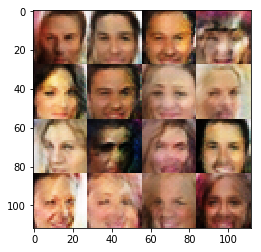

Timestamp 20170803-23-21-07.573 -  Epoch 1/1 -  Step 20710 -  D Loss: 1.6149 - G Loss: 0.5921
Timestamp 20170803-23-21-13.782 -  Epoch 1/1 -  Step 20720 -  D Loss: 1.1435 - G Loss: 0.9982
Timestamp 20170803-23-21-19.972 -  Epoch 1/1 -  Step 20730 -  D Loss: 1.0817 - G Loss: 1.4155
Timestamp 20170803-23-21-26.176 -  Epoch 1/1 -  Step 20740 -  D Loss: 0.8606 - G Loss: 1.3778
Timestamp 20170803-23-21-32.380 -  Epoch 1/1 -  Step 20750 -  D Loss: 1.2006 - G Loss: 1.0812
Timestamp 20170803-23-21-38.662 -  Epoch 1/1 -  Step 20760 -  D Loss: 0.9499 - G Loss: 1.1403
Timestamp 20170803-23-21-44.876 -  Epoch 1/1 -  Step 20770 -  D Loss: 1.1360 - G Loss: 0.7918
Timestamp 20170803-23-21-51.089 -  Epoch 1/1 -  Step 20780 -  D Loss: 0.8825 - G Loss: 1.5900
Timestamp 20170803-23-21-57.308 -  Epoch 1/1 -  Step 20790 -  D Loss: 1.1468 - G Loss: 0.8929
Timestamp 20170803-23-22-03.515 -  Epoch 1/1 -  Step 20800 -  D Loss: 0.7483 - G Loss: 1.6121


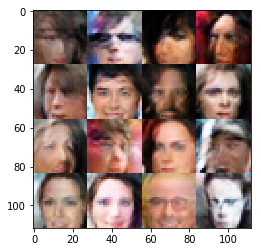

Timestamp 20170803-23-22-10.709 -  Epoch 1/1 -  Step 20810 -  D Loss: 1.0119 - G Loss: 1.1020
Timestamp 20170803-23-22-16.928 -  Epoch 1/1 -  Step 20820 -  D Loss: 1.0394 - G Loss: 1.4773
Timestamp 20170803-23-22-23.145 -  Epoch 1/1 -  Step 20830 -  D Loss: 0.8278 - G Loss: 1.0319
Timestamp 20170803-23-22-29.380 -  Epoch 1/1 -  Step 20840 -  D Loss: 0.8990 - G Loss: 1.6292
Timestamp 20170803-23-22-35.601 -  Epoch 1/1 -  Step 20850 -  D Loss: 0.8022 - G Loss: 1.3997
Timestamp 20170803-23-22-41.806 -  Epoch 1/1 -  Step 20860 -  D Loss: 0.9985 - G Loss: 1.5232
Timestamp 20170803-23-22-48.061 -  Epoch 1/1 -  Step 20870 -  D Loss: 1.1049 - G Loss: 1.4058
Timestamp 20170803-23-22-54.319 -  Epoch 1/1 -  Step 20880 -  D Loss: 0.9413 - G Loss: 1.2020
Timestamp 20170803-23-23-00.535 -  Epoch 1/1 -  Step 20890 -  D Loss: 0.7404 - G Loss: 1.2580
Timestamp 20170803-23-23-06.751 -  Epoch 1/1 -  Step 20900 -  D Loss: 1.0374 - G Loss: 1.5108


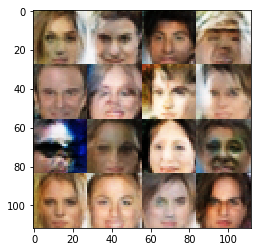

Timestamp 20170803-23-23-13.959 -  Epoch 1/1 -  Step 20910 -  D Loss: 1.2137 - G Loss: 1.1156
Timestamp 20170803-23-23-20.194 -  Epoch 1/1 -  Step 20920 -  D Loss: 1.2156 - G Loss: 1.2888
Timestamp 20170803-23-23-26.413 -  Epoch 1/1 -  Step 20930 -  D Loss: 0.9450 - G Loss: 1.2024
Timestamp 20170803-23-23-32.621 -  Epoch 1/1 -  Step 20940 -  D Loss: 1.0595 - G Loss: 1.4572
Timestamp 20170803-23-23-38.842 -  Epoch 1/1 -  Step 20950 -  D Loss: 1.3136 - G Loss: 1.3215
Timestamp 20170803-23-23-45.065 -  Epoch 1/1 -  Step 20960 -  D Loss: 1.5430 - G Loss: 1.2060
Timestamp 20170803-23-23-51.288 -  Epoch 1/1 -  Step 20970 -  D Loss: 0.7856 - G Loss: 1.1398
Timestamp 20170803-23-23-57.495 -  Epoch 1/1 -  Step 20980 -  D Loss: 1.1975 - G Loss: 1.8973
Timestamp 20170803-23-24-03.699 -  Epoch 1/1 -  Step 20990 -  D Loss: 0.9784 - G Loss: 1.2392
Timestamp 20170803-23-24-09.905 -  Epoch 1/1 -  Step 21000 -  D Loss: 1.0526 - G Loss: 1.1766


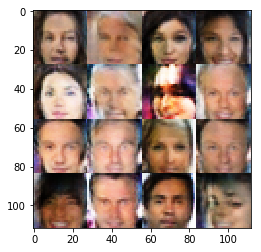

Timestamp 20170803-23-24-17.094 -  Epoch 1/1 -  Step 21010 -  D Loss: 0.9899 - G Loss: 1.2227
Timestamp 20170803-23-24-23.296 -  Epoch 1/1 -  Step 21020 -  D Loss: 0.7404 - G Loss: 1.2947
Timestamp 20170803-23-24-29.490 -  Epoch 1/1 -  Step 21030 -  D Loss: 1.5521 - G Loss: 0.8581
Timestamp 20170803-23-24-35.699 -  Epoch 1/1 -  Step 21040 -  D Loss: 1.1731 - G Loss: 0.9944
Timestamp 20170803-23-24-41.924 -  Epoch 1/1 -  Step 21050 -  D Loss: 1.1984 - G Loss: 1.1022
Timestamp 20170803-23-24-48.131 -  Epoch 1/1 -  Step 21060 -  D Loss: 1.0338 - G Loss: 1.3144
Timestamp 20170803-23-24-54.331 -  Epoch 1/1 -  Step 21070 -  D Loss: 0.9610 - G Loss: 1.2235
Timestamp 20170803-23-25-00.543 -  Epoch 1/1 -  Step 21080 -  D Loss: 0.9213 - G Loss: 0.9219
Timestamp 20170803-23-25-06.748 -  Epoch 1/1 -  Step 21090 -  D Loss: 1.1411 - G Loss: 1.8632
Timestamp 20170803-23-25-12.945 -  Epoch 1/1 -  Step 21100 -  D Loss: 1.0510 - G Loss: 0.9957


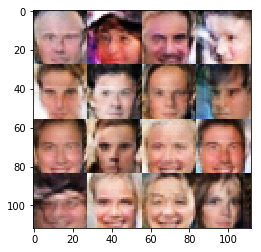

Timestamp 20170803-23-25-20.166 -  Epoch 1/1 -  Step 21110 -  D Loss: 1.3511 - G Loss: 0.9497
Timestamp 20170803-23-25-26.386 -  Epoch 1/1 -  Step 21120 -  D Loss: 1.1998 - G Loss: 0.8499
Timestamp 20170803-23-25-32.587 -  Epoch 1/1 -  Step 21130 -  D Loss: 1.1494 - G Loss: 0.6841
Timestamp 20170803-23-25-38.822 -  Epoch 1/1 -  Step 21140 -  D Loss: 0.9904 - G Loss: 1.4247
Timestamp 20170803-23-25-45.036 -  Epoch 1/1 -  Step 21150 -  D Loss: 1.1373 - G Loss: 1.1037
Timestamp 20170803-23-25-51.259 -  Epoch 1/1 -  Step 21160 -  D Loss: 0.8374 - G Loss: 1.2497
Timestamp 20170803-23-25-57.468 -  Epoch 1/1 -  Step 21170 -  D Loss: 1.3432 - G Loss: 0.9299
Timestamp 20170803-23-26-03.695 -  Epoch 1/1 -  Step 21180 -  D Loss: 1.1160 - G Loss: 0.9141
Timestamp 20170803-23-26-09.917 -  Epoch 1/1 -  Step 21190 -  D Loss: 1.1560 - G Loss: 1.0059
Timestamp 20170803-23-26-16.131 -  Epoch 1/1 -  Step 21200 -  D Loss: 1.0111 - G Loss: 1.2712


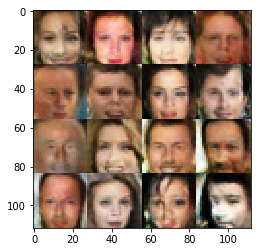

Timestamp 20170803-23-26-23.388 -  Epoch 1/1 -  Step 21210 -  D Loss: 1.1321 - G Loss: 1.5747
Timestamp 20170803-23-26-29.600 -  Epoch 1/1 -  Step 21220 -  D Loss: 1.0242 - G Loss: 0.8819
Timestamp 20170803-23-26-35.830 -  Epoch 1/1 -  Step 21230 -  D Loss: 1.5161 - G Loss: 0.7915
Timestamp 20170803-23-26-42.044 -  Epoch 1/1 -  Step 21240 -  D Loss: 0.9943 - G Loss: 0.8628
Timestamp 20170803-23-26-48.262 -  Epoch 1/1 -  Step 21250 -  D Loss: 1.1610 - G Loss: 1.3128
Timestamp 20170803-23-26-54.480 -  Epoch 1/1 -  Step 21260 -  D Loss: 1.2095 - G Loss: 0.9582
Timestamp 20170803-23-27-00.710 -  Epoch 1/1 -  Step 21270 -  D Loss: 0.9497 - G Loss: 0.8365
Timestamp 20170803-23-27-06.931 -  Epoch 1/1 -  Step 21280 -  D Loss: 0.9585 - G Loss: 1.0102
Timestamp 20170803-23-27-13.144 -  Epoch 1/1 -  Step 21290 -  D Loss: 1.4354 - G Loss: 1.5161
Timestamp 20170803-23-27-19.365 -  Epoch 1/1 -  Step 21300 -  D Loss: 1.1914 - G Loss: 0.8216


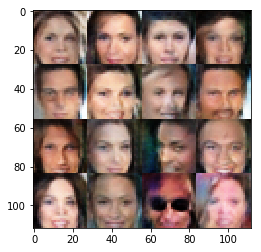

Timestamp 20170803-23-27-26.581 -  Epoch 1/1 -  Step 21310 -  D Loss: 1.2366 - G Loss: 0.8801
Timestamp 20170803-23-27-32.793 -  Epoch 1/1 -  Step 21320 -  D Loss: 0.8686 - G Loss: 1.0481
Timestamp 20170803-23-27-38.992 -  Epoch 1/1 -  Step 21330 -  D Loss: 0.8087 - G Loss: 0.8118
Timestamp 20170803-23-27-45.252 -  Epoch 1/1 -  Step 21340 -  D Loss: 1.2758 - G Loss: 1.1299
Timestamp 20170803-23-27-51.514 -  Epoch 1/1 -  Step 21350 -  D Loss: 1.0233 - G Loss: 1.0019
Timestamp 20170803-23-27-57.711 -  Epoch 1/1 -  Step 21360 -  D Loss: 1.4710 - G Loss: 0.7137
Timestamp 20170803-23-28-03.927 -  Epoch 1/1 -  Step 21370 -  D Loss: 1.4384 - G Loss: 1.1828
Timestamp 20170803-23-28-10.129 -  Epoch 1/1 -  Step 21380 -  D Loss: 1.0640 - G Loss: 1.3018
Timestamp 20170803-23-28-16.330 -  Epoch 1/1 -  Step 21390 -  D Loss: 0.9463 - G Loss: 0.9874
Timestamp 20170803-23-28-22.554 -  Epoch 1/1 -  Step 21400 -  D Loss: 1.0871 - G Loss: 1.3020


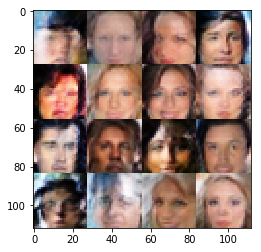

Timestamp 20170803-23-28-29.763 -  Epoch 1/1 -  Step 21410 -  D Loss: 1.1718 - G Loss: 1.1651
Timestamp 20170803-23-28-35.965 -  Epoch 1/1 -  Step 21420 -  D Loss: 0.8168 - G Loss: 1.3439
Timestamp 20170803-23-28-42.179 -  Epoch 1/1 -  Step 21430 -  D Loss: 1.0754 - G Loss: 1.3536
Timestamp 20170803-23-28-48.366 -  Epoch 1/1 -  Step 21440 -  D Loss: 1.2492 - G Loss: 1.1022
Timestamp 20170803-23-28-54.575 -  Epoch 1/1 -  Step 21450 -  D Loss: 0.7310 - G Loss: 1.2836
Timestamp 20170803-23-29-00.775 -  Epoch 1/1 -  Step 21460 -  D Loss: 1.2525 - G Loss: 1.0762
Timestamp 20170803-23-29-07.015 -  Epoch 1/1 -  Step 21470 -  D Loss: 1.1841 - G Loss: 1.3949
Timestamp 20170803-23-29-13.221 -  Epoch 1/1 -  Step 21480 -  D Loss: 1.0179 - G Loss: 0.8076
Timestamp 20170803-23-29-19.426 -  Epoch 1/1 -  Step 21490 -  D Loss: 1.5580 - G Loss: 0.7245
Timestamp 20170803-23-29-25.662 -  Epoch 1/1 -  Step 21500 -  D Loss: 1.2009 - G Loss: 0.8396


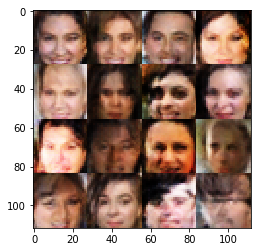

Timestamp 20170803-23-29-32.891 -  Epoch 1/1 -  Step 21510 -  D Loss: 1.0668 - G Loss: 0.9267
Timestamp 20170803-23-29-39.087 -  Epoch 1/1 -  Step 21520 -  D Loss: 1.0951 - G Loss: 1.0432
Timestamp 20170803-23-29-45.307 -  Epoch 1/1 -  Step 21530 -  D Loss: 1.3151 - G Loss: 1.4243
Timestamp 20170803-23-29-51.505 -  Epoch 1/1 -  Step 21540 -  D Loss: 1.6134 - G Loss: 0.6529
Timestamp 20170803-23-29-57.705 -  Epoch 1/1 -  Step 21550 -  D Loss: 0.9972 - G Loss: 1.1377
Timestamp 20170803-23-30-03.915 -  Epoch 1/1 -  Step 21560 -  D Loss: 1.1902 - G Loss: 1.4260
Timestamp 20170803-23-30-10.169 -  Epoch 1/1 -  Step 21570 -  D Loss: 0.9990 - G Loss: 0.9395
Timestamp 20170803-23-30-16.447 -  Epoch 1/1 -  Step 21580 -  D Loss: 0.9388 - G Loss: 1.1123
Timestamp 20170803-23-30-22.660 -  Epoch 1/1 -  Step 21590 -  D Loss: 0.5815 - G Loss: 1.5959
Timestamp 20170803-23-30-28.869 -  Epoch 1/1 -  Step 21600 -  D Loss: 1.4004 - G Loss: 0.9297


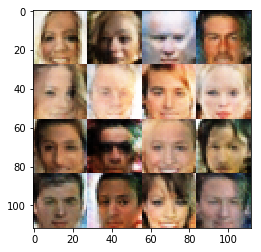

Timestamp 20170803-23-30-36.036 -  Epoch 1/1 -  Step 21610 -  D Loss: 1.0951 - G Loss: 1.5359
Timestamp 20170803-23-30-42.253 -  Epoch 1/1 -  Step 21620 -  D Loss: 1.1138 - G Loss: 1.2590
Timestamp 20170803-23-30-48.459 -  Epoch 1/1 -  Step 21630 -  D Loss: 1.5566 - G Loss: 1.2611
Timestamp 20170803-23-30-54.670 -  Epoch 1/1 -  Step 21640 -  D Loss: 1.1473 - G Loss: 0.9591
Timestamp 20170803-23-31-00.886 -  Epoch 1/1 -  Step 21650 -  D Loss: 0.9290 - G Loss: 0.9946
Timestamp 20170803-23-31-07.081 -  Epoch 1/1 -  Step 21660 -  D Loss: 1.5287 - G Loss: 0.6757
Timestamp 20170803-23-31-13.279 -  Epoch 1/1 -  Step 21670 -  D Loss: 0.8176 - G Loss: 1.5636
Timestamp 20170803-23-31-19.483 -  Epoch 1/1 -  Step 21680 -  D Loss: 0.8661 - G Loss: 0.9901
Timestamp 20170803-23-31-25.718 -  Epoch 1/1 -  Step 21690 -  D Loss: 0.9858 - G Loss: 1.4977
Timestamp 20170803-23-31-31.923 -  Epoch 1/1 -  Step 21700 -  D Loss: 1.2137 - G Loss: 1.4929


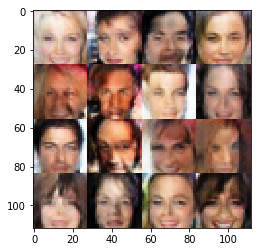

Timestamp 20170803-23-31-39.140 -  Epoch 1/1 -  Step 21710 -  D Loss: 1.0368 - G Loss: 1.0369
Timestamp 20170803-23-31-45.351 -  Epoch 1/1 -  Step 21720 -  D Loss: 0.7482 - G Loss: 1.5283
Timestamp 20170803-23-31-51.572 -  Epoch 1/1 -  Step 21730 -  D Loss: 1.1228 - G Loss: 0.8547
Timestamp 20170803-23-31-57.807 -  Epoch 1/1 -  Step 21740 -  D Loss: 0.9629 - G Loss: 1.6899
Timestamp 20170803-23-32-04.008 -  Epoch 1/1 -  Step 21750 -  D Loss: 1.4164 - G Loss: 1.1181
Timestamp 20170803-23-32-10.219 -  Epoch 1/1 -  Step 21760 -  D Loss: 1.0168 - G Loss: 0.9856
Timestamp 20170803-23-32-16.448 -  Epoch 1/1 -  Step 21770 -  D Loss: 1.0770 - G Loss: 1.6553
Timestamp 20170803-23-32-22.646 -  Epoch 1/1 -  Step 21780 -  D Loss: 0.9554 - G Loss: 2.0128
Timestamp 20170803-23-32-28.867 -  Epoch 1/1 -  Step 21790 -  D Loss: 1.3736 - G Loss: 0.7436
Timestamp 20170803-23-32-35.091 -  Epoch 1/1 -  Step 21800 -  D Loss: 1.1590 - G Loss: 0.9487


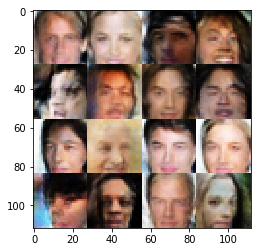

Timestamp 20170803-23-32-42.372 -  Epoch 1/1 -  Step 21810 -  D Loss: 1.2103 - G Loss: 1.5212
Timestamp 20170803-23-32-48.581 -  Epoch 1/1 -  Step 21820 -  D Loss: 1.2348 - G Loss: 0.7305
Timestamp 20170803-23-32-54.817 -  Epoch 1/1 -  Step 21830 -  D Loss: 1.1086 - G Loss: 0.8597
Timestamp 20170803-23-33-01.026 -  Epoch 1/1 -  Step 21840 -  D Loss: 1.4784 - G Loss: 1.0009
Timestamp 20170803-23-33-07.230 -  Epoch 1/1 -  Step 21850 -  D Loss: 1.2635 - G Loss: 2.2103
Timestamp 20170803-23-33-13.435 -  Epoch 1/1 -  Step 21860 -  D Loss: 0.9779 - G Loss: 1.0582
Timestamp 20170803-23-33-19.639 -  Epoch 1/1 -  Step 21870 -  D Loss: 1.2952 - G Loss: 0.8173
Timestamp 20170803-23-33-25.831 -  Epoch 1/1 -  Step 21880 -  D Loss: 1.5311 - G Loss: 1.5092
Timestamp 20170803-23-33-32.059 -  Epoch 1/1 -  Step 21890 -  D Loss: 1.2637 - G Loss: 1.1007
Timestamp 20170803-23-33-38.261 -  Epoch 1/1 -  Step 21900 -  D Loss: 0.9257 - G Loss: 1.0742


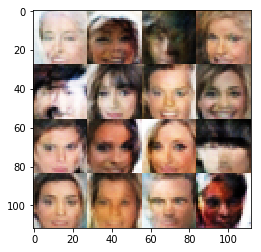

Timestamp 20170803-23-33-45.557 -  Epoch 1/1 -  Step 21910 -  D Loss: 1.5718 - G Loss: 0.9879
Timestamp 20170803-23-33-51.769 -  Epoch 1/1 -  Step 21920 -  D Loss: 0.7770 - G Loss: 0.9999
Timestamp 20170803-23-33-57.962 -  Epoch 1/1 -  Step 21930 -  D Loss: 1.4346 - G Loss: 1.4051
Timestamp 20170803-23-34-04.155 -  Epoch 1/1 -  Step 21940 -  D Loss: 0.7980 - G Loss: 1.8726
Timestamp 20170803-23-34-10.371 -  Epoch 1/1 -  Step 21950 -  D Loss: 1.1167 - G Loss: 1.2584
Timestamp 20170803-23-34-16.599 -  Epoch 1/1 -  Step 21960 -  D Loss: 1.1265 - G Loss: 0.9861
Timestamp 20170803-23-34-22.819 -  Epoch 1/1 -  Step 21970 -  D Loss: 1.4073 - G Loss: 0.9710
Timestamp 20170803-23-34-29.014 -  Epoch 1/1 -  Step 21980 -  D Loss: 0.8272 - G Loss: 1.1616
Timestamp 20170803-23-34-35.240 -  Epoch 1/1 -  Step 21990 -  D Loss: 1.0428 - G Loss: 0.9432
Timestamp 20170803-23-34-41.440 -  Epoch 1/1 -  Step 22000 -  D Loss: 0.8985 - G Loss: 1.2951


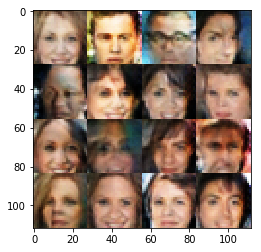

Timestamp 20170803-23-34-48.652 -  Epoch 1/1 -  Step 22010 -  D Loss: 0.8191 - G Loss: 1.5653
Timestamp 20170803-23-34-54.879 -  Epoch 1/1 -  Step 22020 -  D Loss: 1.0726 - G Loss: 0.9800
Timestamp 20170803-23-35-01.075 -  Epoch 1/1 -  Step 22030 -  D Loss: 0.8858 - G Loss: 1.9687
Timestamp 20170803-23-35-07.320 -  Epoch 1/1 -  Step 22040 -  D Loss: 1.1707 - G Loss: 0.8265
Timestamp 20170803-23-35-13.552 -  Epoch 1/1 -  Step 22050 -  D Loss: 1.1837 - G Loss: 0.6980
Timestamp 20170803-23-35-19.755 -  Epoch 1/1 -  Step 22060 -  D Loss: 1.2265 - G Loss: 1.1426
Timestamp 20170803-23-35-25.973 -  Epoch 1/1 -  Step 22070 -  D Loss: 0.8464 - G Loss: 1.1723
Timestamp 20170803-23-35-32.184 -  Epoch 1/1 -  Step 22080 -  D Loss: 0.7334 - G Loss: 1.1494
Timestamp 20170803-23-35-38.406 -  Epoch 1/1 -  Step 22090 -  D Loss: 1.0827 - G Loss: 0.7257
Timestamp 20170803-23-35-44.639 -  Epoch 1/1 -  Step 22100 -  D Loss: 1.2125 - G Loss: 0.6137


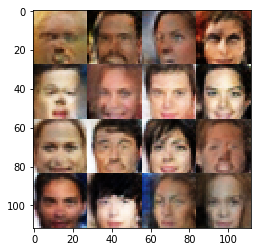

Timestamp 20170803-23-35-51.882 -  Epoch 1/1 -  Step 22110 -  D Loss: 1.1429 - G Loss: 2.0017
Timestamp 20170803-23-35-58.079 -  Epoch 1/1 -  Step 22120 -  D Loss: 0.9712 - G Loss: 1.1537
Timestamp 20170803-23-36-04.287 -  Epoch 1/1 -  Step 22130 -  D Loss: 1.1297 - G Loss: 1.0242
Timestamp 20170803-23-36-10.507 -  Epoch 1/1 -  Step 22140 -  D Loss: 1.4071 - G Loss: 0.7513
Timestamp 20170803-23-36-16.724 -  Epoch 1/1 -  Step 22150 -  D Loss: 1.0341 - G Loss: 1.3741
Timestamp 20170803-23-36-22.945 -  Epoch 1/1 -  Step 22160 -  D Loss: 0.9591 - G Loss: 1.3042
Timestamp 20170803-23-36-29.159 -  Epoch 1/1 -  Step 22170 -  D Loss: 1.2021 - G Loss: 1.1340
Timestamp 20170803-23-36-35.351 -  Epoch 1/1 -  Step 22180 -  D Loss: 1.0167 - G Loss: 0.9025
Timestamp 20170803-23-36-41.592 -  Epoch 1/1 -  Step 22190 -  D Loss: 0.9934 - G Loss: 0.9965
Timestamp 20170803-23-36-47.814 -  Epoch 1/1 -  Step 22200 -  D Loss: 1.3253 - G Loss: 0.8479


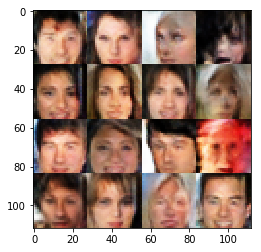

Timestamp 20170803-23-36-55.012 -  Epoch 1/1 -  Step 22210 -  D Loss: 0.9944 - G Loss: 1.9928
Timestamp 20170803-23-37-01.226 -  Epoch 1/1 -  Step 22220 -  D Loss: 0.9426 - G Loss: 1.0138
Timestamp 20170803-23-37-07.432 -  Epoch 1/1 -  Step 22230 -  D Loss: 1.1734 - G Loss: 1.4025
Timestamp 20170803-23-37-13.643 -  Epoch 1/1 -  Step 22240 -  D Loss: 1.3165 - G Loss: 1.2495
Timestamp 20170803-23-37-19.875 -  Epoch 1/1 -  Step 22250 -  D Loss: 1.0379 - G Loss: 1.0561
Timestamp 20170803-23-37-26.078 -  Epoch 1/1 -  Step 22260 -  D Loss: 0.9800 - G Loss: 1.4799
Timestamp 20170803-23-37-32.303 -  Epoch 1/1 -  Step 22270 -  D Loss: 1.0570 - G Loss: 0.8736
Timestamp 20170803-23-37-38.516 -  Epoch 1/1 -  Step 22280 -  D Loss: 1.3893 - G Loss: 0.7978
Timestamp 20170803-23-37-44.724 -  Epoch 1/1 -  Step 22290 -  D Loss: 0.9322 - G Loss: 1.0147
Timestamp 20170803-23-37-50.914 -  Epoch 1/1 -  Step 22300 -  D Loss: 1.0999 - G Loss: 0.8170


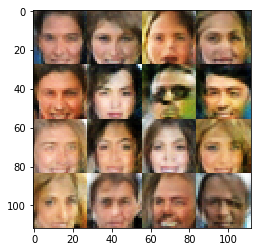

Timestamp 20170803-23-37-58.178 -  Epoch 1/1 -  Step 22310 -  D Loss: 0.9046 - G Loss: 1.4693
Timestamp 20170803-23-38-04.407 -  Epoch 1/1 -  Step 22320 -  D Loss: 0.8376 - G Loss: 0.9014
Timestamp 20170803-23-38-10.616 -  Epoch 1/1 -  Step 22330 -  D Loss: 0.8893 - G Loss: 1.2907
Timestamp 20170803-23-38-16.807 -  Epoch 1/1 -  Step 22340 -  D Loss: 0.7930 - G Loss: 1.6686
Timestamp 20170803-23-38-23.017 -  Epoch 1/1 -  Step 22350 -  D Loss: 1.3794 - G Loss: 0.9650
Timestamp 20170803-23-38-29.235 -  Epoch 1/1 -  Step 22360 -  D Loss: 1.3093 - G Loss: 1.2553
Timestamp 20170803-23-38-35.434 -  Epoch 1/1 -  Step 22370 -  D Loss: 1.2326 - G Loss: 0.7562
Timestamp 20170803-23-38-41.672 -  Epoch 1/1 -  Step 22380 -  D Loss: 1.0316 - G Loss: 1.0934
Timestamp 20170803-23-38-47.885 -  Epoch 1/1 -  Step 22390 -  D Loss: 1.2813 - G Loss: 0.9095
Timestamp 20170803-23-38-54.092 -  Epoch 1/1 -  Step 22400 -  D Loss: 0.9132 - G Loss: 0.8615


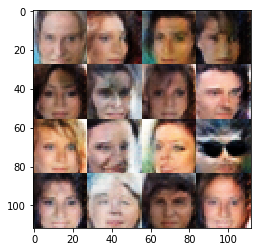

Timestamp 20170803-23-39-01.321 -  Epoch 1/1 -  Step 22410 -  D Loss: 1.1713 - G Loss: 1.1703
Timestamp 20170803-23-39-07.527 -  Epoch 1/1 -  Step 22420 -  D Loss: 1.2744 - G Loss: 1.0525
Timestamp 20170803-23-39-13.722 -  Epoch 1/1 -  Step 22430 -  D Loss: 1.1221 - G Loss: 0.7897
Timestamp 20170803-23-39-19.942 -  Epoch 1/1 -  Step 22440 -  D Loss: 1.1515 - G Loss: 1.2170
Timestamp 20170803-23-39-26.144 -  Epoch 1/1 -  Step 22450 -  D Loss: 0.9772 - G Loss: 1.4992
Timestamp 20170803-23-39-32.414 -  Epoch 1/1 -  Step 22460 -  D Loss: 0.9369 - G Loss: 1.7284
Timestamp 20170803-23-39-38.619 -  Epoch 1/1 -  Step 22470 -  D Loss: 0.9664 - G Loss: 1.1969
Timestamp 20170803-23-39-44.845 -  Epoch 1/1 -  Step 22480 -  D Loss: 1.0783 - G Loss: 1.3312
Timestamp 20170803-23-39-51.078 -  Epoch 1/1 -  Step 22490 -  D Loss: 0.8721 - G Loss: 1.8070
Timestamp 20170803-23-39-57.281 -  Epoch 1/1 -  Step 22500 -  D Loss: 1.1043 - G Loss: 1.3691


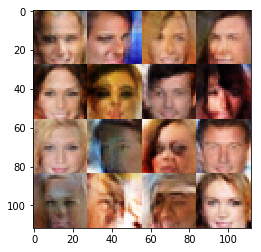

Timestamp 20170803-23-40-04.501 -  Epoch 1/1 -  Step 22510 -  D Loss: 1.3007 - G Loss: 1.2589
Timestamp 20170803-23-40-10.706 -  Epoch 1/1 -  Step 22520 -  D Loss: 0.8705 - G Loss: 1.1309
Timestamp 20170803-23-40-16.915 -  Epoch 1/1 -  Step 22530 -  D Loss: 1.1910 - G Loss: 0.9298
Timestamp 20170803-23-40-23.116 -  Epoch 1/1 -  Step 22540 -  D Loss: 1.5652 - G Loss: 0.6944
Timestamp 20170803-23-40-29.339 -  Epoch 1/1 -  Step 22550 -  D Loss: 1.2367 - G Loss: 1.1370
Timestamp 20170803-23-40-35.545 -  Epoch 1/1 -  Step 22560 -  D Loss: 0.9731 - G Loss: 1.0425
Timestamp 20170803-23-40-41.765 -  Epoch 1/1 -  Step 22570 -  D Loss: 1.0213 - G Loss: 1.2692
Timestamp 20170803-23-40-47.968 -  Epoch 1/1 -  Step 22580 -  D Loss: 1.1913 - G Loss: 0.8393
Timestamp 20170803-23-40-54.174 -  Epoch 1/1 -  Step 22590 -  D Loss: 1.4104 - G Loss: 0.9282
Timestamp 20170803-23-41-00.370 -  Epoch 1/1 -  Step 22600 -  D Loss: 1.0435 - G Loss: 1.8568


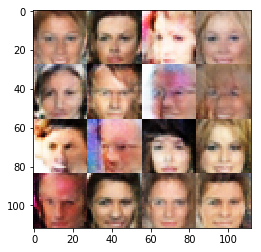

Timestamp 20170803-23-41-07.630 -  Epoch 1/1 -  Step 22610 -  D Loss: 1.1548 - G Loss: 0.7198
Timestamp 20170803-23-41-13.817 -  Epoch 1/1 -  Step 22620 -  D Loss: 0.8623 - G Loss: 2.1989
Timestamp 20170803-23-41-20.041 -  Epoch 1/1 -  Step 22630 -  D Loss: 0.9910 - G Loss: 1.4283
Timestamp 20170803-23-41-26.290 -  Epoch 1/1 -  Step 22640 -  D Loss: 0.7812 - G Loss: 1.5538
Timestamp 20170803-23-41-32.500 -  Epoch 1/1 -  Step 22650 -  D Loss: 0.5783 - G Loss: 1.6904
Timestamp 20170803-23-41-38.729 -  Epoch 1/1 -  Step 22660 -  D Loss: 0.9822 - G Loss: 1.1207
Timestamp 20170803-23-41-44.951 -  Epoch 1/1 -  Step 22670 -  D Loss: 0.7287 - G Loss: 1.5209
Timestamp 20170803-23-41-51.159 -  Epoch 1/1 -  Step 22680 -  D Loss: 1.1721 - G Loss: 0.8005
Timestamp 20170803-23-41-57.387 -  Epoch 1/1 -  Step 22690 -  D Loss: 1.0959 - G Loss: 1.2743
Timestamp 20170803-23-42-03.595 -  Epoch 1/1 -  Step 22700 -  D Loss: 1.1988 - G Loss: 1.2031


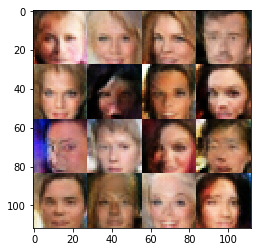

Timestamp 20170803-23-42-10.840 -  Epoch 1/1 -  Step 22710 -  D Loss: 1.2375 - G Loss: 1.1519
Timestamp 20170803-23-42-17.051 -  Epoch 1/1 -  Step 22720 -  D Loss: 0.8961 - G Loss: 0.9905
Timestamp 20170803-23-42-23.257 -  Epoch 1/1 -  Step 22730 -  D Loss: 0.6856 - G Loss: 0.9686
Timestamp 20170803-23-42-29.478 -  Epoch 1/1 -  Step 22740 -  D Loss: 1.2782 - G Loss: 0.9506
Timestamp 20170803-23-42-35.677 -  Epoch 1/1 -  Step 22750 -  D Loss: 1.1582 - G Loss: 1.0335
Timestamp 20170803-23-42-41.892 -  Epoch 1/1 -  Step 22760 -  D Loss: 0.9285 - G Loss: 0.6670
Timestamp 20170803-23-42-48.145 -  Epoch 1/1 -  Step 22770 -  D Loss: 0.9124 - G Loss: 1.0176
Timestamp 20170803-23-42-54.354 -  Epoch 1/1 -  Step 22780 -  D Loss: 1.0992 - G Loss: 1.1085
Timestamp 20170803-23-43-00.589 -  Epoch 1/1 -  Step 22790 -  D Loss: 0.8579 - G Loss: 1.0683
Timestamp 20170803-23-43-06.814 -  Epoch 1/1 -  Step 22800 -  D Loss: 0.6749 - G Loss: 1.8291


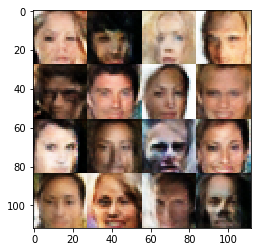

Timestamp 20170803-23-43-14.244 -  Epoch 1/1 -  Step 22810 -  D Loss: 0.7520 - G Loss: 1.1868
Timestamp 20170803-23-43-20.441 -  Epoch 1/1 -  Step 22820 -  D Loss: 1.2195 - G Loss: 1.0047
Timestamp 20170803-23-43-26.670 -  Epoch 1/1 -  Step 22830 -  D Loss: 0.9512 - G Loss: 0.9838
Timestamp 20170803-23-43-32.895 -  Epoch 1/1 -  Step 22840 -  D Loss: 1.2628 - G Loss: 1.0150
Timestamp 20170803-23-43-39.125 -  Epoch 1/1 -  Step 22850 -  D Loss: 0.7116 - G Loss: 1.2285
Timestamp 20170803-23-43-45.363 -  Epoch 1/1 -  Step 22860 -  D Loss: 1.2737 - G Loss: 1.2578
Timestamp 20170803-23-43-51.573 -  Epoch 1/1 -  Step 22870 -  D Loss: 1.1022 - G Loss: 1.2361
Timestamp 20170803-23-43-57.791 -  Epoch 1/1 -  Step 22880 -  D Loss: 0.8606 - G Loss: 0.9188
Timestamp 20170803-23-44-03.993 -  Epoch 1/1 -  Step 22890 -  D Loss: 1.2087 - G Loss: 1.2389
Timestamp 20170803-23-44-10.207 -  Epoch 1/1 -  Step 22900 -  D Loss: 1.1482 - G Loss: 1.0428


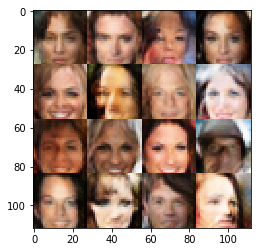

Timestamp 20170803-23-44-17.486 -  Epoch 1/1 -  Step 22910 -  D Loss: 0.8904 - G Loss: 1.2285
Timestamp 20170803-23-44-23.711 -  Epoch 1/1 -  Step 22920 -  D Loss: 1.0974 - G Loss: 1.3861
Timestamp 20170803-23-44-29.902 -  Epoch 1/1 -  Step 22930 -  D Loss: 0.9948 - G Loss: 1.2135
Timestamp 20170803-23-44-36.134 -  Epoch 1/1 -  Step 22940 -  D Loss: 1.0052 - G Loss: 0.8149
Timestamp 20170803-23-44-42.338 -  Epoch 1/1 -  Step 22950 -  D Loss: 0.9346 - G Loss: 0.6882
Timestamp 20170803-23-44-48.538 -  Epoch 1/1 -  Step 22960 -  D Loss: 1.2777 - G Loss: 1.1123
Timestamp 20170803-23-44-54.796 -  Epoch 1/1 -  Step 22970 -  D Loss: 1.0186 - G Loss: 1.1921
Timestamp 20170803-23-45-01.030 -  Epoch 1/1 -  Step 22980 -  D Loss: 0.9902 - G Loss: 1.4771
Timestamp 20170803-23-45-07.252 -  Epoch 1/1 -  Step 22990 -  D Loss: 0.9598 - G Loss: 1.7729
Timestamp 20170803-23-45-13.453 -  Epoch 1/1 -  Step 23000 -  D Loss: 1.2009 - G Loss: 1.4132


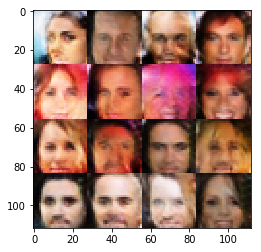

Timestamp 20170803-23-45-20.745 -  Epoch 1/1 -  Step 23010 -  D Loss: 1.5027 - G Loss: 0.9280
Timestamp 20170803-23-45-26.978 -  Epoch 1/1 -  Step 23020 -  D Loss: 0.9266 - G Loss: 0.7760
Timestamp 20170803-23-45-33.192 -  Epoch 1/1 -  Step 23030 -  D Loss: 0.9814 - G Loss: 1.1480
Timestamp 20170803-23-45-39.404 -  Epoch 1/1 -  Step 23040 -  D Loss: 1.2601 - G Loss: 0.9096
Timestamp 20170803-23-45-45.634 -  Epoch 1/1 -  Step 23050 -  D Loss: 0.8611 - G Loss: 1.2745
Timestamp 20170803-23-45-51.862 -  Epoch 1/1 -  Step 23060 -  D Loss: 1.8575 - G Loss: 0.7757
Timestamp 20170803-23-45-58.071 -  Epoch 1/1 -  Step 23070 -  D Loss: 1.0771 - G Loss: 1.4177
Timestamp 20170803-23-46-04.276 -  Epoch 1/1 -  Step 23080 -  D Loss: 0.9899 - G Loss: 1.4336
Timestamp 20170803-23-46-10.476 -  Epoch 1/1 -  Step 23090 -  D Loss: 1.2371 - G Loss: 0.9678
Timestamp 20170803-23-46-16.680 -  Epoch 1/1 -  Step 23100 -  D Loss: 1.0698 - G Loss: 0.9217


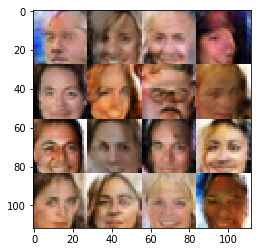

Timestamp 20170803-23-46-23.956 -  Epoch 1/1 -  Step 23110 -  D Loss: 0.7699 - G Loss: 1.3404
Timestamp 20170803-23-46-30.188 -  Epoch 1/1 -  Step 23120 -  D Loss: 1.0683 - G Loss: 1.1868
Timestamp 20170803-23-46-36.404 -  Epoch 1/1 -  Step 23130 -  D Loss: 1.0340 - G Loss: 1.0582
Timestamp 20170803-23-46-42.605 -  Epoch 1/1 -  Step 23140 -  D Loss: 0.9874 - G Loss: 1.2060
Timestamp 20170803-23-46-48.832 -  Epoch 1/1 -  Step 23150 -  D Loss: 1.1230 - G Loss: 0.9006
Timestamp 20170803-23-46-55.034 -  Epoch 1/1 -  Step 23160 -  D Loss: 1.4681 - G Loss: 1.1405
Timestamp 20170803-23-47-01.233 -  Epoch 1/1 -  Step 23170 -  D Loss: 1.2141 - G Loss: 1.5730
Timestamp 20170803-23-47-07.438 -  Epoch 1/1 -  Step 23180 -  D Loss: 1.0225 - G Loss: 1.6274
Timestamp 20170803-23-47-13.654 -  Epoch 1/1 -  Step 23190 -  D Loss: 0.9511 - G Loss: 0.8529
Timestamp 20170803-23-47-19.864 -  Epoch 1/1 -  Step 23200 -  D Loss: 1.1804 - G Loss: 1.3658


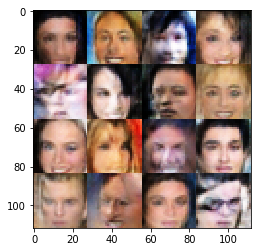

Timestamp 20170803-23-47-27.115 -  Epoch 1/1 -  Step 23210 -  D Loss: 0.9981 - G Loss: 1.0441
Timestamp 20170803-23-47-33.327 -  Epoch 1/1 -  Step 23220 -  D Loss: 1.0377 - G Loss: 1.2510
Timestamp 20170803-23-47-39.569 -  Epoch 1/1 -  Step 23230 -  D Loss: 1.0364 - G Loss: 1.0191
Timestamp 20170803-23-47-45.794 -  Epoch 1/1 -  Step 23240 -  D Loss: 0.8826 - G Loss: 1.1968
Timestamp 20170803-23-47-52.007 -  Epoch 1/1 -  Step 23250 -  D Loss: 1.0665 - G Loss: 0.8911
Timestamp 20170803-23-47-58.224 -  Epoch 1/1 -  Step 23260 -  D Loss: 1.2610 - G Loss: 0.9547
Timestamp 20170803-23-48-04.434 -  Epoch 1/1 -  Step 23270 -  D Loss: 1.3322 - G Loss: 0.8183
Timestamp 20170803-23-48-10.688 -  Epoch 1/1 -  Step 23280 -  D Loss: 1.3029 - G Loss: 0.9603
Timestamp 20170803-23-48-16.938 -  Epoch 1/1 -  Step 23290 -  D Loss: 0.9913 - G Loss: 0.9792
Timestamp 20170803-23-48-23.146 -  Epoch 1/1 -  Step 23300 -  D Loss: 0.9007 - G Loss: 1.0556


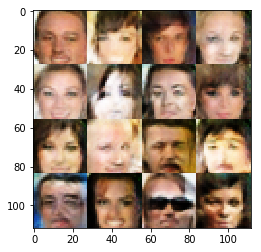

Timestamp 20170803-23-48-30.402 -  Epoch 1/1 -  Step 23310 -  D Loss: 0.7669 - G Loss: 1.5570
Timestamp 20170803-23-48-36.622 -  Epoch 1/1 -  Step 23320 -  D Loss: 1.4046 - G Loss: 0.6633
Timestamp 20170803-23-48-42.814 -  Epoch 1/1 -  Step 23330 -  D Loss: 1.1067 - G Loss: 1.2942
Timestamp 20170803-23-48-49.033 -  Epoch 1/1 -  Step 23340 -  D Loss: 0.8675 - G Loss: 1.6774
Timestamp 20170803-23-48-55.234 -  Epoch 1/1 -  Step 23350 -  D Loss: 0.6842 - G Loss: 2.1902
Timestamp 20170803-23-49-01.458 -  Epoch 1/1 -  Step 23360 -  D Loss: 1.1910 - G Loss: 0.8690
Timestamp 20170803-23-49-07.660 -  Epoch 1/1 -  Step 23370 -  D Loss: 1.1019 - G Loss: 0.6850
Timestamp 20170803-23-49-13.869 -  Epoch 1/1 -  Step 23380 -  D Loss: 0.9100 - G Loss: 0.9965
Timestamp 20170803-23-49-20.066 -  Epoch 1/1 -  Step 23390 -  D Loss: 0.8910 - G Loss: 2.1905
Timestamp 20170803-23-49-26.297 -  Epoch 1/1 -  Step 23400 -  D Loss: 1.2492 - G Loss: 1.2843


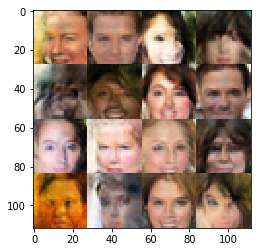

Timestamp 20170803-23-49-33.590 -  Epoch 1/1 -  Step 23410 -  D Loss: 0.8243 - G Loss: 1.5178
Timestamp 20170803-23-49-39.880 -  Epoch 1/1 -  Step 23420 -  D Loss: 1.2347 - G Loss: 1.1654
Timestamp 20170803-23-49-46.099 -  Epoch 1/1 -  Step 23430 -  D Loss: 0.9221 - G Loss: 1.4697
Timestamp 20170803-23-49-52.315 -  Epoch 1/1 -  Step 23440 -  D Loss: 0.9534 - G Loss: 1.2490
Timestamp 20170803-23-49-58.534 -  Epoch 1/1 -  Step 23450 -  D Loss: 1.3203 - G Loss: 1.3543
Timestamp 20170803-23-50-04.723 -  Epoch 1/1 -  Step 23460 -  D Loss: 1.1695 - G Loss: 1.1048
Timestamp 20170803-23-50-10.943 -  Epoch 1/1 -  Step 23470 -  D Loss: 1.5462 - G Loss: 0.6816
Timestamp 20170803-23-50-17.185 -  Epoch 1/1 -  Step 23480 -  D Loss: 1.0530 - G Loss: 0.8910
Timestamp 20170803-23-50-23.386 -  Epoch 1/1 -  Step 23490 -  D Loss: 0.8883 - G Loss: 1.4812
Timestamp 20170803-23-50-29.595 -  Epoch 1/1 -  Step 23500 -  D Loss: 0.9239 - G Loss: 1.2322


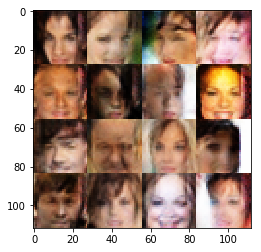

Timestamp 20170803-23-50-36.886 -  Epoch 1/1 -  Step 23510 -  D Loss: 0.9148 - G Loss: 1.2859
Timestamp 20170803-23-50-43.097 -  Epoch 1/1 -  Step 23520 -  D Loss: 1.3211 - G Loss: 1.2922
Timestamp 20170803-23-50-49.296 -  Epoch 1/1 -  Step 23530 -  D Loss: 1.3409 - G Loss: 1.3439
Timestamp 20170803-23-50-55.521 -  Epoch 1/1 -  Step 23540 -  D Loss: 0.9939 - G Loss: 1.0475
Timestamp 20170803-23-51-01.747 -  Epoch 1/1 -  Step 23550 -  D Loss: 1.1342 - G Loss: 0.8256
Timestamp 20170803-23-51-07.945 -  Epoch 1/1 -  Step 23560 -  D Loss: 1.0597 - G Loss: 0.9260
Timestamp 20170803-23-51-14.150 -  Epoch 1/1 -  Step 23570 -  D Loss: 1.1769 - G Loss: 1.1883
Timestamp 20170803-23-51-20.365 -  Epoch 1/1 -  Step 23580 -  D Loss: 1.0518 - G Loss: 1.2094
Timestamp 20170803-23-51-26.571 -  Epoch 1/1 -  Step 23590 -  D Loss: 1.0445 - G Loss: 1.5230
Timestamp 20170803-23-51-32.798 -  Epoch 1/1 -  Step 23600 -  D Loss: 1.1530 - G Loss: 1.0529


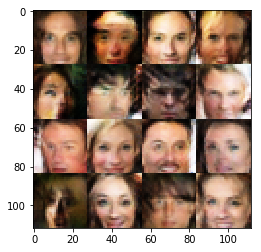

Timestamp 20170803-23-51-40.706 -  Epoch 1/1 -  Step 23610 -  D Loss: 1.0115 - G Loss: 1.4650
Timestamp 20170803-23-51-46.919 -  Epoch 1/1 -  Step 23620 -  D Loss: 0.9360 - G Loss: 1.0261
Timestamp 20170803-23-51-53.128 -  Epoch 1/1 -  Step 23630 -  D Loss: 1.2181 - G Loss: 0.9990
Timestamp 20170803-23-51-59.365 -  Epoch 1/1 -  Step 23640 -  D Loss: 1.2475 - G Loss: 0.4360
Timestamp 20170803-23-52-05.601 -  Epoch 1/1 -  Step 23650 -  D Loss: 1.0825 - G Loss: 1.4714
Timestamp 20170803-23-52-11.824 -  Epoch 1/1 -  Step 23660 -  D Loss: 0.9321 - G Loss: 1.8088
Timestamp 20170803-23-52-18.026 -  Epoch 1/1 -  Step 23670 -  D Loss: 1.1346 - G Loss: 0.6880
Timestamp 20170803-23-52-24.242 -  Epoch 1/1 -  Step 23680 -  D Loss: 0.9091 - G Loss: 1.0563
Timestamp 20170803-23-52-30.459 -  Epoch 1/1 -  Step 23690 -  D Loss: 1.2572 - G Loss: 1.5753
Timestamp 20170803-23-52-36.677 -  Epoch 1/1 -  Step 23700 -  D Loss: 1.0194 - G Loss: 1.0525


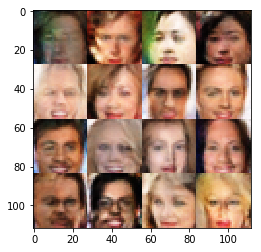

Timestamp 20170803-23-52-43.933 -  Epoch 1/1 -  Step 23710 -  D Loss: 1.2774 - G Loss: 0.8672
Timestamp 20170803-23-52-50.167 -  Epoch 1/1 -  Step 23720 -  D Loss: 0.7999 - G Loss: 1.3524
Timestamp 20170803-23-52-56.352 -  Epoch 1/1 -  Step 23730 -  D Loss: 1.1457 - G Loss: 0.7570
Timestamp 20170803-23-53-02.575 -  Epoch 1/1 -  Step 23740 -  D Loss: 1.0228 - G Loss: 1.0471
Timestamp 20170803-23-53-08.799 -  Epoch 1/1 -  Step 23750 -  D Loss: 1.1304 - G Loss: 0.9209
Timestamp 20170803-23-53-15.022 -  Epoch 1/1 -  Step 23760 -  D Loss: 1.1354 - G Loss: 1.0210
Timestamp 20170803-23-53-21.228 -  Epoch 1/1 -  Step 23770 -  D Loss: 1.1418 - G Loss: 1.1711
Timestamp 20170803-23-53-27.455 -  Epoch 1/1 -  Step 23780 -  D Loss: 1.3388 - G Loss: 0.6338
Timestamp 20170803-23-53-33.688 -  Epoch 1/1 -  Step 23790 -  D Loss: 0.8249 - G Loss: 1.4681
Timestamp 20170803-23-53-39.908 -  Epoch 1/1 -  Step 23800 -  D Loss: 1.1752 - G Loss: 0.5102


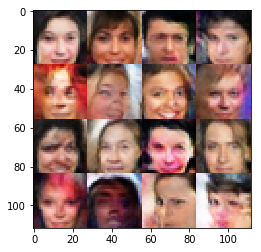

Timestamp 20170803-23-53-47.185 -  Epoch 1/1 -  Step 23810 -  D Loss: 1.1364 - G Loss: 1.1873
Timestamp 20170803-23-53-53.397 -  Epoch 1/1 -  Step 23820 -  D Loss: 1.0769 - G Loss: 1.1907
Timestamp 20170803-23-53-59.599 -  Epoch 1/1 -  Step 23830 -  D Loss: 1.0966 - G Loss: 0.8934
Timestamp 20170803-23-54-05.816 -  Epoch 1/1 -  Step 23840 -  D Loss: 0.9507 - G Loss: 1.6236
Timestamp 20170803-23-54-12.018 -  Epoch 1/1 -  Step 23850 -  D Loss: 1.0685 - G Loss: 0.9517
Timestamp 20170803-23-54-18.250 -  Epoch 1/1 -  Step 23860 -  D Loss: 0.8320 - G Loss: 1.5328
Timestamp 20170803-23-54-24.472 -  Epoch 1/1 -  Step 23870 -  D Loss: 1.1743 - G Loss: 1.2631
Timestamp 20170803-23-54-30.685 -  Epoch 1/1 -  Step 23880 -  D Loss: 1.1130 - G Loss: 1.4305
Timestamp 20170803-23-54-36.932 -  Epoch 1/1 -  Step 23890 -  D Loss: 1.1990 - G Loss: 1.4937
Timestamp 20170803-23-54-43.134 -  Epoch 1/1 -  Step 23900 -  D Loss: 0.7311 - G Loss: 1.1558


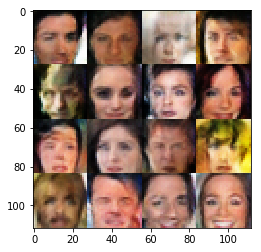

Timestamp 20170803-23-54-50.436 -  Epoch 1/1 -  Step 23910 -  D Loss: 0.9808 - G Loss: 0.8176
Timestamp 20170803-23-54-56.674 -  Epoch 1/1 -  Step 23920 -  D Loss: 1.4017 - G Loss: 1.0619
Timestamp 20170803-23-55-02.886 -  Epoch 1/1 -  Step 23930 -  D Loss: 0.9851 - G Loss: 0.9319
Timestamp 20170803-23-55-09.087 -  Epoch 1/1 -  Step 23940 -  D Loss: 1.0740 - G Loss: 1.5966
Timestamp 20170803-23-55-15.304 -  Epoch 1/1 -  Step 23950 -  D Loss: 1.1614 - G Loss: 1.3418
Timestamp 20170803-23-55-21.525 -  Epoch 1/1 -  Step 23960 -  D Loss: 1.2295 - G Loss: 1.0182
Timestamp 20170803-23-55-27.775 -  Epoch 1/1 -  Step 23970 -  D Loss: 1.1887 - G Loss: 0.8572
Timestamp 20170803-23-55-34.046 -  Epoch 1/1 -  Step 23980 -  D Loss: 0.9722 - G Loss: 1.8119
Timestamp 20170803-23-55-40.267 -  Epoch 1/1 -  Step 23990 -  D Loss: 1.0802 - G Loss: 1.4343
Timestamp 20170803-23-55-46.515 -  Epoch 1/1 -  Step 24000 -  D Loss: 1.0315 - G Loss: 1.7730


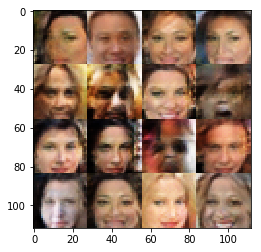

Timestamp 20170803-23-55-53.800 -  Epoch 1/1 -  Step 24010 -  D Loss: 0.9044 - G Loss: 1.7724
Timestamp 20170803-23-56-00.007 -  Epoch 1/1 -  Step 24020 -  D Loss: 1.0360 - G Loss: 1.1742
Timestamp 20170803-23-56-06.216 -  Epoch 1/1 -  Step 24030 -  D Loss: 1.1692 - G Loss: 0.9535
Timestamp 20170803-23-56-12.451 -  Epoch 1/1 -  Step 24040 -  D Loss: 1.0913 - G Loss: 1.4648
Timestamp 20170803-23-56-18.667 -  Epoch 1/1 -  Step 24050 -  D Loss: 0.7970 - G Loss: 1.4502
Timestamp 20170803-23-56-24.864 -  Epoch 1/1 -  Step 24060 -  D Loss: 1.1490 - G Loss: 0.4786
Timestamp 20170803-23-56-31.106 -  Epoch 1/1 -  Step 24070 -  D Loss: 1.1725 - G Loss: 1.3690
Timestamp 20170803-23-56-37.320 -  Epoch 1/1 -  Step 24080 -  D Loss: 1.4354 - G Loss: 0.9581
Timestamp 20170803-23-56-43.532 -  Epoch 1/1 -  Step 24090 -  D Loss: 1.4143 - G Loss: 1.1123
Timestamp 20170803-23-56-49.739 -  Epoch 1/1 -  Step 24100 -  D Loss: 0.7520 - G Loss: 1.1021


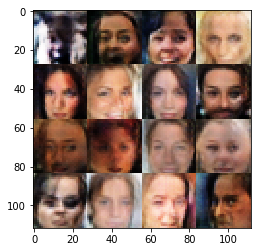

Timestamp 20170803-23-56-57.028 -  Epoch 1/1 -  Step 24110 -  D Loss: 0.8893 - G Loss: 1.2652
Timestamp 20170803-23-57-03.268 -  Epoch 1/1 -  Step 24120 -  D Loss: 0.9858 - G Loss: 1.2048
Timestamp 20170803-23-57-09.497 -  Epoch 1/1 -  Step 24130 -  D Loss: 1.3316 - G Loss: 1.6712
Timestamp 20170803-23-57-15.718 -  Epoch 1/1 -  Step 24140 -  D Loss: 1.2061 - G Loss: 0.9361
Timestamp 20170803-23-57-21.923 -  Epoch 1/1 -  Step 24150 -  D Loss: 0.7822 - G Loss: 1.4873
Timestamp 20170803-23-57-28.187 -  Epoch 1/1 -  Step 24160 -  D Loss: 1.0909 - G Loss: 0.8904
Timestamp 20170803-23-57-34.400 -  Epoch 1/1 -  Step 24170 -  D Loss: 0.7154 - G Loss: 1.7015
Timestamp 20170803-23-57-40.643 -  Epoch 1/1 -  Step 24180 -  D Loss: 0.9499 - G Loss: 1.3342
Timestamp 20170803-23-57-46.853 -  Epoch 1/1 -  Step 24190 -  D Loss: 1.1498 - G Loss: 1.0419
Timestamp 20170803-23-57-53.075 -  Epoch 1/1 -  Step 24200 -  D Loss: 1.0251 - G Loss: 0.9936


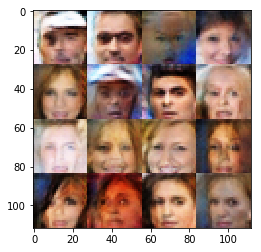

Timestamp 20170803-23-58-00.317 -  Epoch 1/1 -  Step 24210 -  D Loss: 1.3016 - G Loss: 1.1671
Timestamp 20170803-23-58-06.567 -  Epoch 1/1 -  Step 24220 -  D Loss: 0.7296 - G Loss: 1.6708
Timestamp 20170803-23-58-12.779 -  Epoch 1/1 -  Step 24230 -  D Loss: 0.8186 - G Loss: 1.0953
Timestamp 20170803-23-58-19.013 -  Epoch 1/1 -  Step 24240 -  D Loss: 1.0994 - G Loss: 1.3859
Timestamp 20170803-23-58-25.243 -  Epoch 1/1 -  Step 24250 -  D Loss: 1.4508 - G Loss: 1.1256
Timestamp 20170803-23-58-31.464 -  Epoch 1/1 -  Step 24260 -  D Loss: 1.6561 - G Loss: 0.7170
Timestamp 20170803-23-58-37.696 -  Epoch 1/1 -  Step 24270 -  D Loss: 1.3058 - G Loss: 1.3928
Timestamp 20170803-23-58-43.923 -  Epoch 1/1 -  Step 24280 -  D Loss: 0.9852 - G Loss: 1.0603
Timestamp 20170803-23-58-50.119 -  Epoch 1/1 -  Step 24290 -  D Loss: 1.2470 - G Loss: 1.0638
Timestamp 20170803-23-58-56.335 -  Epoch 1/1 -  Step 24300 -  D Loss: 0.7834 - G Loss: 1.2312


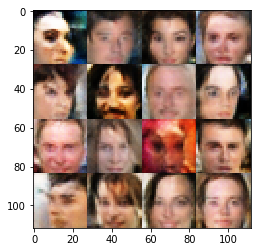

Timestamp 20170803-23-59-03.653 -  Epoch 1/1 -  Step 24310 -  D Loss: 0.8437 - G Loss: 1.6301
Timestamp 20170803-23-59-09.865 -  Epoch 1/1 -  Step 24320 -  D Loss: 0.9990 - G Loss: 1.5021
Timestamp 20170803-23-59-16.097 -  Epoch 1/1 -  Step 24330 -  D Loss: 1.0249 - G Loss: 1.4484
Timestamp 20170803-23-59-22.322 -  Epoch 1/1 -  Step 24340 -  D Loss: 1.3327 - G Loss: 1.2863
Timestamp 20170803-23-59-28.529 -  Epoch 1/1 -  Step 24350 -  D Loss: 1.0155 - G Loss: 1.1925
Timestamp 20170803-23-59-34.727 -  Epoch 1/1 -  Step 24360 -  D Loss: 0.8374 - G Loss: 1.2327
Timestamp 20170803-23-59-40.940 -  Epoch 1/1 -  Step 24370 -  D Loss: 1.1049 - G Loss: 1.3127
Timestamp 20170803-23-59-47.155 -  Epoch 1/1 -  Step 24380 -  D Loss: 1.1343 - G Loss: 1.5316
Timestamp 20170803-23-59-53.352 -  Epoch 1/1 -  Step 24390 -  D Loss: 1.1384 - G Loss: 1.0389
Timestamp 20170803-23-59-59.569 -  Epoch 1/1 -  Step 24400 -  D Loss: 0.9329 - G Loss: 1.5877


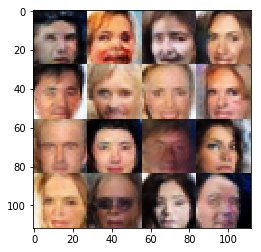

Timestamp 20170804-00-00-06.913 -  Epoch 1/1 -  Step 24410 -  D Loss: 0.8978 - G Loss: 0.9350
Timestamp 20170804-00-00-13.123 -  Epoch 1/1 -  Step 24420 -  D Loss: 1.3893 - G Loss: 0.9280
Timestamp 20170804-00-00-19.319 -  Epoch 1/1 -  Step 24430 -  D Loss: 0.8435 - G Loss: 1.0257
Timestamp 20170804-00-00-25.518 -  Epoch 1/1 -  Step 24440 -  D Loss: 0.9728 - G Loss: 0.5844
Timestamp 20170804-00-00-31.774 -  Epoch 1/1 -  Step 24450 -  D Loss: 1.3233 - G Loss: 0.7211
Timestamp 20170804-00-00-37.995 -  Epoch 1/1 -  Step 24460 -  D Loss: 1.4343 - G Loss: 0.9081
Timestamp 20170804-00-00-44.225 -  Epoch 1/1 -  Step 24470 -  D Loss: 1.0551 - G Loss: 1.0185
Timestamp 20170804-00-00-50.459 -  Epoch 1/1 -  Step 24480 -  D Loss: 0.8461 - G Loss: 1.4902
Timestamp 20170804-00-00-56.669 -  Epoch 1/1 -  Step 24490 -  D Loss: 1.3481 - G Loss: 0.8736
Timestamp 20170804-00-01-02.889 -  Epoch 1/1 -  Step 24500 -  D Loss: 0.9344 - G Loss: 1.3528


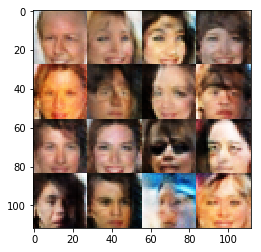

Timestamp 20170804-00-01-10.172 -  Epoch 1/1 -  Step 24510 -  D Loss: 1.2876 - G Loss: 0.7808
Timestamp 20170804-00-01-16.390 -  Epoch 1/1 -  Step 24520 -  D Loss: 0.9559 - G Loss: 1.1028
Timestamp 20170804-00-01-22.606 -  Epoch 1/1 -  Step 24530 -  D Loss: 0.9232 - G Loss: 1.7074
Timestamp 20170804-00-01-28.829 -  Epoch 1/1 -  Step 24540 -  D Loss: 1.0841 - G Loss: 1.2622
Timestamp 20170804-00-01-35.042 -  Epoch 1/1 -  Step 24550 -  D Loss: 1.2384 - G Loss: 1.4183
Timestamp 20170804-00-01-41.275 -  Epoch 1/1 -  Step 24560 -  D Loss: 1.0821 - G Loss: 1.1783
Timestamp 20170804-00-01-47.483 -  Epoch 1/1 -  Step 24570 -  D Loss: 1.4267 - G Loss: 1.1354
Timestamp 20170804-00-01-53.699 -  Epoch 1/1 -  Step 24580 -  D Loss: 0.8402 - G Loss: 1.1415
Timestamp 20170804-00-01-59.965 -  Epoch 1/1 -  Step 24590 -  D Loss: 0.9054 - G Loss: 1.1336
Timestamp 20170804-00-02-06.175 -  Epoch 1/1 -  Step 24600 -  D Loss: 1.1004 - G Loss: 0.9327


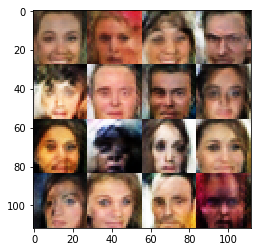

Timestamp 20170804-00-02-13.512 -  Epoch 1/1 -  Step 24610 -  D Loss: 1.4519 - G Loss: 0.8277
Timestamp 20170804-00-02-19.754 -  Epoch 1/1 -  Step 24620 -  D Loss: 1.2499 - G Loss: 1.0235
Timestamp 20170804-00-02-25.963 -  Epoch 1/1 -  Step 24630 -  D Loss: 0.8912 - G Loss: 1.0079
Timestamp 20170804-00-02-32.175 -  Epoch 1/1 -  Step 24640 -  D Loss: 0.8124 - G Loss: 1.3556
Timestamp 20170804-00-02-38.375 -  Epoch 1/1 -  Step 24650 -  D Loss: 0.9954 - G Loss: 1.0499
Timestamp 20170804-00-02-44.573 -  Epoch 1/1 -  Step 24660 -  D Loss: 1.2279 - G Loss: 0.6955
Timestamp 20170804-00-02-50.802 -  Epoch 1/1 -  Step 24670 -  D Loss: 0.9807 - G Loss: 1.1845
Timestamp 20170804-00-02-56.989 -  Epoch 1/1 -  Step 24680 -  D Loss: 1.1378 - G Loss: 0.7823
Timestamp 20170804-00-03-03.249 -  Epoch 1/1 -  Step 24690 -  D Loss: 1.1873 - G Loss: 0.8166
Timestamp 20170804-00-03-09.441 -  Epoch 1/1 -  Step 24700 -  D Loss: 1.1309 - G Loss: 0.9522


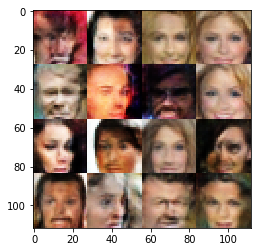

Timestamp 20170804-00-03-16.924 -  Epoch 1/1 -  Step 24710 -  D Loss: 1.2878 - G Loss: 0.9481
Timestamp 20170804-00-03-23.125 -  Epoch 1/1 -  Step 24720 -  D Loss: 1.2573 - G Loss: 1.9025
Timestamp 20170804-00-03-29.334 -  Epoch 1/1 -  Step 24730 -  D Loss: 1.1752 - G Loss: 1.2724
Timestamp 20170804-00-03-35.544 -  Epoch 1/1 -  Step 24740 -  D Loss: 1.1299 - G Loss: 0.7393
Timestamp 20170804-00-03-41.766 -  Epoch 1/1 -  Step 24750 -  D Loss: 1.1086 - G Loss: 1.2480
Timestamp 20170804-00-03-47.983 -  Epoch 1/1 -  Step 24760 -  D Loss: 0.8379 - G Loss: 1.2091
Timestamp 20170804-00-03-54.195 -  Epoch 1/1 -  Step 24770 -  D Loss: 0.9130 - G Loss: 1.3729
Timestamp 20170804-00-04-00.394 -  Epoch 1/1 -  Step 24780 -  D Loss: 1.0034 - G Loss: 1.1445
Timestamp 20170804-00-04-06.605 -  Epoch 1/1 -  Step 24790 -  D Loss: 1.0870 - G Loss: 1.0497
Timestamp 20170804-00-04-12.823 -  Epoch 1/1 -  Step 24800 -  D Loss: 1.2608 - G Loss: 1.1123


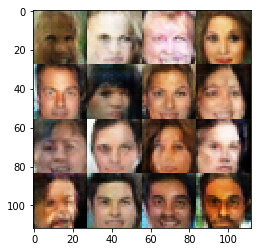

Timestamp 20170804-00-04-20.099 -  Epoch 1/1 -  Step 24810 -  D Loss: 1.1900 - G Loss: 1.6143
Timestamp 20170804-00-04-26.326 -  Epoch 1/1 -  Step 24820 -  D Loss: 1.3895 - G Loss: 0.8040
Timestamp 20170804-00-04-32.543 -  Epoch 1/1 -  Step 24830 -  D Loss: 0.9153 - G Loss: 1.2366
Timestamp 20170804-00-04-38.739 -  Epoch 1/1 -  Step 24840 -  D Loss: 1.3295 - G Loss: 1.2236
Timestamp 20170804-00-04-44.951 -  Epoch 1/1 -  Step 24850 -  D Loss: 1.3689 - G Loss: 1.4944
Timestamp 20170804-00-04-51.169 -  Epoch 1/1 -  Step 24860 -  D Loss: 0.9358 - G Loss: 1.4584
Timestamp 20170804-00-04-57.378 -  Epoch 1/1 -  Step 24870 -  D Loss: 0.9049 - G Loss: 1.2904
Timestamp 20170804-00-05-03.575 -  Epoch 1/1 -  Step 24880 -  D Loss: 1.2840 - G Loss: 1.2147
Timestamp 20170804-00-05-09.790 -  Epoch 1/1 -  Step 24890 -  D Loss: 0.7594 - G Loss: 1.4886
Timestamp 20170804-00-05-16.003 -  Epoch 1/1 -  Step 24900 -  D Loss: 1.0492 - G Loss: 1.3388


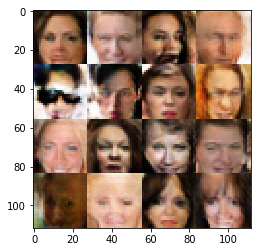

Timestamp 20170804-00-05-23.277 -  Epoch 1/1 -  Step 24910 -  D Loss: 0.9146 - G Loss: 1.2242
Timestamp 20170804-00-05-29.474 -  Epoch 1/1 -  Step 24920 -  D Loss: 1.0916 - G Loss: 1.3815
Timestamp 20170804-00-05-35.689 -  Epoch 1/1 -  Step 24930 -  D Loss: 1.0691 - G Loss: 1.4408
Timestamp 20170804-00-05-41.904 -  Epoch 1/1 -  Step 24940 -  D Loss: 1.1880 - G Loss: 0.8680
Timestamp 20170804-00-05-48.126 -  Epoch 1/1 -  Step 24950 -  D Loss: 0.9311 - G Loss: 1.1513
Timestamp 20170804-00-05-54.320 -  Epoch 1/1 -  Step 24960 -  D Loss: 1.0529 - G Loss: 1.6319
Timestamp 20170804-00-06-00.530 -  Epoch 1/1 -  Step 24970 -  D Loss: 1.1402 - G Loss: 0.9516
Timestamp 20170804-00-06-06.729 -  Epoch 1/1 -  Step 24980 -  D Loss: 0.9892 - G Loss: 1.0431
Timestamp 20170804-00-06-12.950 -  Epoch 1/1 -  Step 24990 -  D Loss: 0.8755 - G Loss: 1.0902
Timestamp 20170804-00-06-19.147 -  Epoch 1/1 -  Step 25000 -  D Loss: 1.0099 - G Loss: 1.2143


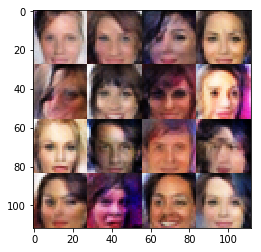

Timestamp 20170804-00-06-26.473 -  Epoch 1/1 -  Step 25010 -  D Loss: 0.9138 - G Loss: 1.2960
Timestamp 20170804-00-06-32.699 -  Epoch 1/1 -  Step 25020 -  D Loss: 1.2097 - G Loss: 1.5121
Timestamp 20170804-00-06-38.912 -  Epoch 1/1 -  Step 25030 -  D Loss: 1.0013 - G Loss: 1.3419
Timestamp 20170804-00-06-45.104 -  Epoch 1/1 -  Step 25040 -  D Loss: 1.4147 - G Loss: 0.9375
Timestamp 20170804-00-06-51.342 -  Epoch 1/1 -  Step 25050 -  D Loss: 0.9506 - G Loss: 0.7868
Timestamp 20170804-00-06-57.561 -  Epoch 1/1 -  Step 25060 -  D Loss: 0.9487 - G Loss: 0.5761
Timestamp 20170804-00-07-03.761 -  Epoch 1/1 -  Step 25070 -  D Loss: 0.9226 - G Loss: 0.9501
Timestamp 20170804-00-07-09.968 -  Epoch 1/1 -  Step 25080 -  D Loss: 1.0911 - G Loss: 0.9003
Timestamp 20170804-00-07-16.182 -  Epoch 1/1 -  Step 25090 -  D Loss: 0.9905 - G Loss: 1.1597
Timestamp 20170804-00-07-22.408 -  Epoch 1/1 -  Step 25100 -  D Loss: 1.4926 - G Loss: 1.1469


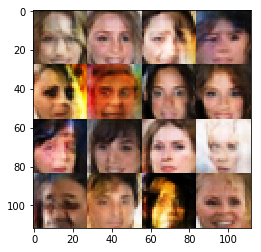

Timestamp 20170804-00-07-29.892 -  Epoch 1/1 -  Step 25110 -  D Loss: 1.3421 - G Loss: 1.3062
Timestamp 20170804-00-07-36.112 -  Epoch 1/1 -  Step 25120 -  D Loss: 1.0405 - G Loss: 0.8849
Timestamp 20170804-00-07-42.407 -  Epoch 1/1 -  Step 25130 -  D Loss: 1.2267 - G Loss: 1.0853
Timestamp 20170804-00-07-48.623 -  Epoch 1/1 -  Step 25140 -  D Loss: 1.1754 - G Loss: 1.1266
Timestamp 20170804-00-07-54.880 -  Epoch 1/1 -  Step 25150 -  D Loss: 1.2373 - G Loss: 0.8214
Timestamp 20170804-00-08-01.109 -  Epoch 1/1 -  Step 25160 -  D Loss: 1.2575 - G Loss: 1.4277
Timestamp 20170804-00-08-07.315 -  Epoch 1/1 -  Step 25170 -  D Loss: 0.8336 - G Loss: 1.4659
Timestamp 20170804-00-08-13.547 -  Epoch 1/1 -  Step 25180 -  D Loss: 0.9925 - G Loss: 1.2505
Timestamp 20170804-00-08-19.767 -  Epoch 1/1 -  Step 25190 -  D Loss: 1.2078 - G Loss: 1.1510
Timestamp 20170804-00-08-25.975 -  Epoch 1/1 -  Step 25200 -  D Loss: 0.8558 - G Loss: 1.2751


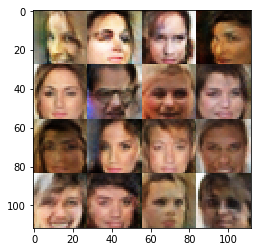

Timestamp 20170804-00-08-33.271 -  Epoch 1/1 -  Step 25210 -  D Loss: 0.9344 - G Loss: 1.1126
Timestamp 20170804-00-08-39.482 -  Epoch 1/1 -  Step 25220 -  D Loss: 0.8753 - G Loss: 1.6697
Timestamp 20170804-00-08-45.722 -  Epoch 1/1 -  Step 25230 -  D Loss: 1.5805 - G Loss: 0.8253
Timestamp 20170804-00-08-51.926 -  Epoch 1/1 -  Step 25240 -  D Loss: 0.9516 - G Loss: 1.2070
Timestamp 20170804-00-08-58.146 -  Epoch 1/1 -  Step 25250 -  D Loss: 1.1511 - G Loss: 1.0708
Timestamp 20170804-00-09-04.377 -  Epoch 1/1 -  Step 25260 -  D Loss: 1.1076 - G Loss: 0.8448
Timestamp 20170804-00-09-10.623 -  Epoch 1/1 -  Step 25270 -  D Loss: 1.0670 - G Loss: 1.2723
Timestamp 20170804-00-09-16.829 -  Epoch 1/1 -  Step 25280 -  D Loss: 1.1970 - G Loss: 1.1204
Timestamp 20170804-00-09-23.073 -  Epoch 1/1 -  Step 25290 -  D Loss: 1.4050 - G Loss: 1.2162
Timestamp 20170804-00-09-29.310 -  Epoch 1/1 -  Step 25300 -  D Loss: 1.1593 - G Loss: 1.7251


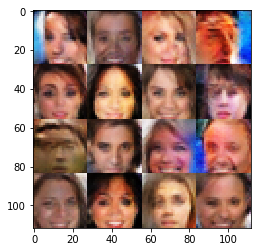

Timestamp 20170804-00-09-36.676 -  Epoch 1/1 -  Step 25310 -  D Loss: 0.9879 - G Loss: 2.0576
Timestamp 20170804-00-09-42.944 -  Epoch 1/1 -  Step 25320 -  D Loss: 0.8772 - G Loss: 1.2033
Timestamp 20170804-00-09-45.543 -  Epoch 1/1 -  Step 25324 -  D Loss: 0.8031 - G Loss: 1.9515


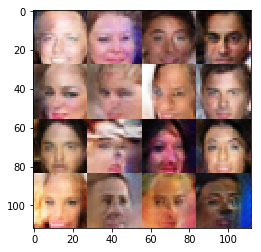

In [12]:
batch_size = 8
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.